# Used librairies

In [2]:
import pandas as pd
import re
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

#  Loading the NY Times corpus and building the DataFrame

In [2]:
# fonction utilisant les expressions régulières pour extraire du fichier les informations qui nous intéressent

def extraire_info(s):
    s=s.strip()
    m = re.match(r"http.*(?P<date>\d{4}\/\d{2}\/\d{2})\/(?P<topic>[-A-Za-z\/]+\/)(?P<title>.*).html(\n\n)?(?P<text>(.*\n?)+)", s)
    return (m.group("title"),m.group("date"),m.group("topic"),m.group("text")) if m else None

# ouverture du fichier

with open('nytimes.txt', 'r') as file:
    data = file.read().replace('\n', '\n')
d = data + "\nURL:"
lst = d.split("URL:")

# on crée des listes qui vont contenir les informations extraites

lst_title = []
lst_date = []
lst_topic = []
lst_text = []
for x in range(1, len(lst)-1): # le premier et le dernier élément de la liste sont vides, on ne les prend pas
    info = extraire_info(lst[x])
    if info != None:
        title, date, topic, text = info
        new_title = title.replace("-", " ").capitalize()
        new_topic = topic.replace("/", " ")
        lst_title.append(None if len(new_title) == 0 else new_title)
        lst_date.append(None if len(date) == 0 else date)
        lst_topic.append(None if len(new_topic) == 0 else new_topic)
        lst_text.append(None if len(text) == 0 else text)
            

print(len(lst_text))
print(len(lst) - 2)

8888
8888


In [3]:
df = pd.DataFrame({'title': lst_title, 'date': lst_date, 'topic': lst_topic, 'text': lst_text})
df

,title,date,topic,text
0,Washington nationals max scherzer baffles mets...,2016/06/30,sports baseball,WASHINGTON — Stellar pitching kept the Mets af...
1,Mayor de blasios counsel to leave next month t...,2016/06/30,nyregion,Mayor Bill de Blasio’s counsel and chief legal...
2,Three men charged in killing of cuomo administ...,2016/06/30,nyregion,In the early morning hours of Labor Day last y...
3,Tekserve precursor to the apple store to close...,2016/06/30,nyregion,It was the Apple Store in New York City before...
4,Once at michael phelpss feet and still chasing...,2016/06/30,sports olympics,OMAHA — The United States Olympic swimming tri...
...,...,...,...,...
8883,Battle for senate,2016/04/18,us politics,There is a second critical contest in America’...
8884,He said his car had been stolen the police say...,2016/04/18,nyregion,"On April 1, police officers from the 108th Pre..."
8885,Farmers in arid india share camps with their c...,2016/04/18,world asia,"KHILAD, India — The cattle camp, on a dusty ba..."
8886,Jj abrams hints reys father is not who you tho...,2016/04/18,movies,The director J.J. Abrams dropped a possible hi...


In [9]:
df.date = pd.to_datetime(df.date)

In [5]:
df.to_csv('./data_ny.csv', index=True, header=True)

In [3]:
df = pd.read_csv('data_ny.csv')

In [157]:
df.isna().sum()

Unnamed: 0    0
title         0
date          0
topic         0
text          4
dtype: int64

# Descriptive statistics

- Compute the frequency of each topic and subtopic over the whole corpus

In [6]:
df.topic.value_counts()  / len(df)

nyregion                      0.074595
us politics                   0.068407
us                            0.066382
business dealbook             0.042979
world europe                  0.040279
                                ...   
sports international          0.000225
your-money auto-insurance     0.000113
your-money student-loans      0.000113
arts artsspecial              0.000113
us elections                  0.000113
Name: topic, Length: 82, dtype: float64

- Display the number of articles published each week for this corpus

In [10]:
df['date_week']=df['date'].dt.week

In [12]:
df.groupby('date_week').count()[['date']]

,date
date_week,
8,1
15,2
16,829
17,877
18,862
19,855
20,857
21,851
22,784


- For each week, determine the most frequent topic.

In [17]:
df.groupby('date_week')[['topic']].agg(lambda x:x.value_counts().index[0])

,topic
date_week,
8,arts music
15,us
16,nyregion
17,nyregion
18,nyregion
19,nyregion
20,us politics
21,us politics
22,nyregion


# Annotation

Use `Spacy` to annotate the corpus. See [Spacy 101](https://spacy.io/usage/spacy-101).

Have a look at
[Tricks using Spacy](https://towardsdatascience.com/a-couple-tricks-for-using-spacy-at-scale-54affd8326cf)
to save time and energy. See documentation of `spacy.language.Language.pipe` for seamless
treatment of this issue.

Backup the annotated corpus on disk (use Spacy `to_disk` method for `Doc` rather than `pickle`).

In [1]:
pip install -U spaCy

Requirement already up-to-date: spaCy in /Users/salomeamar/opt/anaconda3/lib/python3.7/site-packages (2.2.3)
Note: you may need to restart the kernel to use updated packages.


In [86]:
!pip install -U spacy download en_core_web_sm

Requirement already up-to-date: spacy in /opt/anaconda3/lib/python3.7/site-packages (2.2.3)
  Using cached https://files.pythonhosted.org/packages/e3/02/10dbbf98043d6f5ec94d0715401b80e65a0dff49c3d937614d8976c35cb2/download-0.3.4-py3-none-any.whl
Requirement already up-to-date: en_core_web_sm in /opt/anaconda3/lib/python3.7/site-packages (2.2.5)
You should consider upgrading via the 'pip install --upgrade pip' command.


In [115]:
!pip3 install -U spacy

Requirement already up-to-date: spacy in /opt/anaconda3/lib/python3.7/site-packages (2.2.3)
You should consider upgrading via the 'pip install --upgrade pip' command.


In [79]:
import spacy
!python3 -m spacy download en_core_web_sm

     |████████████████████████████████| 12.0MB 2.7MB/s eta 0:00:01
  Created wheel for en-core-web-sm: filename=en_core_web_sm-2.2.5-cp37-none-any.whl size=12011740 sha256=76be7a116cbe0a40a8eae8e8b687157eaa7d43fa5b3ab6606e7455caf7ec8923
  Stored in directory: /private/var/folders/6q/99d4kddn3dj74jwhq3nx75zw0000gn/T/pip-ephem-wheel-cache-yeomqq_e/wheels/6a/47/fb/6b5a0b8906d8e8779246c67d4658fd8a544d4a03a75520197a
Successfully built en-core-web-sm
You should consider upgrading via the 'pip install --upgrade pip' command.
✔ Download and installation successful
You can now load the model via spacy.load('en_core_web_sm')


In [104]:
!pip3 install https://github.com/explosion/spacy-models/releases/download/en_core_web_sm-2.2.0/en_core_web_sm-2.2.0.tar.gz


     |████████████████████████████████| 12.0MB 3.5MB/s eta 0:00:01
  Created wheel for en-core-web-sm: filename=en_core_web_sm-2.2.0-cp37-none-any.whl size=12019125 sha256=20d8f1b706bb85b1ef751a27a0a5b32d03a28a147450a4d5bffe59510f25815d
  Stored in directory: /Users/salomeamar/Library/Caches/pip/wheels/48/5c/1c/15f9d02afc8221a668d2172446dd8467b20cdb9aef80a172a4
Successfully built en-core-web-sm
You should consider upgrading via the 'pip install --upgrade pip' command.


In [21]:
import spacy
nlp = spacy.load("en")

In [22]:
ann_df = {idx: nlp(row['text']) for idx, row in df[:100].iterrows()}

In [12]:
ann_df

{0: WASHINGTON — Stellar pitching kept the Mets afloat in the first half of last season despite their offensive woes. But they cannot produce an encore of their pennant-winning season if their lineup keeps floundering while their pitching is nicked, bruised and stretched thin.
 “We were going to ride our pitching,” Manager Terry Collins said before Wednesday’s game. “But we’re not riding it right now. We’ve got as many problems with our pitching as we do anything.”
 Wednesday’s 4-2 loss to the Washington Nationals was cruel for the already-limping Mets. Pitching in Steven Matz’s place, the spot starter Logan Verrett allowed two runs over five innings. But even that was too large a deficit for the Mets’ lineup to overcome against Max Scherzer, the Nationals’ starter.
 “We’re not even giving ourselves chances,” Collins said, adding later, “We just can’t give our pitchers any room to work.”
 The Mets did not score until the ninth inning, when a last-gasp two-run homer by James Loney off N

# Stylometry

Build a Pandas dataframe `ny_annotation` with schema

- Data columns ():
+ `docid`: index of document in `ny_corpus`
+ `tokid`: index of token within document
+ `token` : token
+ `pos` :
+ `lem` :
+ `ner` :
+ `noun_chunk` :
+ `is_stop` : `bool`

In [23]:
lst_token = []
lst_pos = []
lst_lem = []
lst_is_stop = []
lst_docid = []
lst_tokid = []
lst_chunk = []
lst_tag = []
lst_ner = []

for idx,row in ann_df.items() :
    for token in row : 
        lst_token.append(token)
        lst_pos.append(token.pos_)
        lst_lem.append(token.lemma_)
        lst_is_stop.append(token.is_stop)
        lst_docid.append(idx)
        lst_tokid.append(token.i)
        lst_tag.append(token.tag_)
        lst_ner.append(token.ent_type_)
        for chunk in row.noun_chunks:
            if token in chunk : 
                lst_chunk.append(chunk.text)

In [25]:
ny_annotation = pd.DataFrame({'docid': lst_docid, 'tokid': lst_tokid, 'token': lst_token, 'pos': lst_pos, 'lem': lst_lem, 'is_stop': lst_is_stop, 'tag': lst_tag, 'ner': lst_ner})

In [26]:
ny_annotation

,docid,tokid,token,pos,lem,is_stop,tag,ner
0,0,0,WASHINGTON,PROPN,WASHINGTON,False,NNP,GPE
1,0,1,—,PUNCT,—,False,:,
2,0,2,Stellar,ADJ,stellar,False,JJ,NORP
3,0,3,pitching,NOUN,pitching,False,NN,
4,0,4,kept,VERB,keep,False,VBD,
...,...,...,...,...,...,...,...,...
99072,99,489,the,DET,the,True,DT,
99073,99,490,old,ADJ,old,False,JJ,
99074,99,491,stereotypes,NOUN,stereotype,False,NNS,
99075,99,492,.,PUNCT,.,False,.,


# Distribution of lengths of sentences

Build a Pandas dataframe `ny_sents` with schema

- Data columns ():
+ `docid`: index of document in `ny_corpus`
+ `sentid`: index of sentence within document
+ : index of first token in document

In [27]:
lst_sent_docid = []
lst_sentid = []
lst_first_tokid = []
for idx,row in ann_df.items() :
    count = 0
    for sent in row.sents :   
        lst_sentid.append(count)
        count += 1
        lst_sent_docid.append(idx)
        lst_first_tokid.append(sent.start)

In [28]:
ny_sents = pd.DataFrame({'docid': lst_sent_docid, 'sentid': lst_sentid, 'first_tokid': lst_first_tokid})

In [29]:
ny_sents

,docid,sentid,first_tokid
0,0,0,0
1,0,1,20
2,0,2,50
3,0,3,69
4,0,4,79
...,...,...,...
3974,99,12,343
3975,99,13,360
3976,99,14,420
3977,99,15,456


- Compute and plot the empirical probability mass
function of sentence lengths distribution throughout the whole corpus

In [30]:
#on crée une liste qui contient les longueurs de chaque phrase (nb de token)
lst_len_of_sents = []
for i in range(len(lst_first_tokid)-1) : 
     lst_len_of_sents.append(lst_first_tokid[i+1] - lst_first_tokid[i]) 
lst_len_of_sents.append(494 - lst_first_tokid[len(lst_first_tokid)-1]) #on ajoute la dernière longueur à la main car on n'a pas la phrase suivante

In [31]:
ny_sents['len_of_sents'] = lst_len_of_sents

In [32]:
ny_sents

,docid,sentid,first_tokid,len_of_sents
0,0,0,0,20
1,0,1,20,30
2,0,2,50,19
3,0,3,69,10
4,0,4,79,16
...,...,...,...,...
3974,99,12,343,17
3975,99,13,360,60
3976,99,14,420,36
3977,99,15,456,25


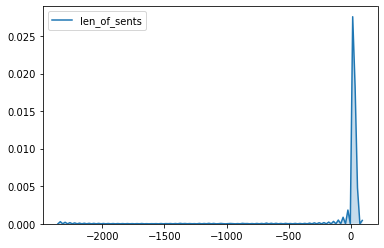

In [129]:
# KDE plot 
sns.kdeplot(data=ny_sents['len_of_sents'], shade=True)

- For each document in the corpus, compute the *total variation distance*
between the empirical distribution of sentence lengths within the document
and the empirical distribution of sentence lengths within the corpus.

# Using vectors

Each instance of class `Doc` has an attribute `vector`.

- How is it computed?
- What could it be useful for?
- How is method `similarity` evaluated?
- What does it mean to use one Spacy model rather than another Spacy model?
-

If you annotated the whole corpus by annotating batches of
documents and then spliited the batches into annotated documents,
make sure that the document vectors are correct, that is that
they are per document averages of token vectors.

In [35]:
doc = nlp(str(df.text))

Les vecteurs représentent chaque mot numériquement de telle manière que le vecteur correspond à la façon dont ce mot est utilisé ou à ce qu'il signifie. Les encodages vectoriels sont appris en considérant le contexte dans lequel les mots apparaissent. Les mots qui apparaissent dans des contextes similaires auront des vecteurs similaires.

Encore mieux, les relations entre les mots peuvent être examinées avec des opérations mathématiques. La soustraction des vecteurs pour "homme" et "femme" renvoie un autre vecteur. Si vous ajoutez cela au vecteur de "roi", le résultat est proche du vecteur de "reine".

Les vecteurs de mots amélioreront généralement les performances des modèles de Machine Learning (comparativement aux bag-of-words). spaCy fournit ces représentation à partir du modèle Word2Vec.

In [39]:
# on a besoin de télécharger le modèle large pour avoir les vectors
nlp = spacy.load('en_core_web_lg')

OSError: [E050] Can't find model 'en_core_web_lg'. It doesn't seem to be a shortcut link, a Python package or a valid path to a data directory.

In [36]:
for token in doc :
    print(token.text, token.has_vector, token.vector_norm, token.is_oov)

0 True 20.034855 True
       True 19.712233 True
WASHINGTON True 19.90574 True
— True 20.651983 True
Stellar True 20.112644 True
pitching True 21.781374 True
kept True 23.21386 True
the True 21.757814 True
Mets True 21.69981 True
af True 17.491985 True
... True 17.991796 True

 True 21.01792 True
1 True 18.264605 True
       True 21.148912 True
Mayor True 22.576448 True
Bill True 22.351673 True
de True 19.781527 True
Blasio True 24.17977 True
’s True 20.321856 True
counsel True 21.495861 True
and True 24.993362 True
chief True 19.124344 True
legal True 17.939564 True
... True 19.18818 True

 True 20.686916 True
2 True 17.941618 True
       True 20.273354 True
In True 21.889467 True
the True 22.45527 True
early True 20.29728 True
morning True 19.745502 True
hours True 20.490606 True
of True 21.353838 True
Labor True 21.32858 True
Day True 19.660116 True
last True 20.27485 True
y True 22.938835 True
... True 19.381102 True

 True 21.5436 True
3 True 19.58565 True
       True 19.627813 Tr

In [165]:
doc.vector

array([ 0.3458925 , -0.6164359 , -0.10047425,  0.3355163 ,  1.5237589 ,
        1.3576609 ,  0.47289288, -0.10547935,  1.2138658 ,  0.80310756,
        0.91622686,  0.21550639, -0.4627872 , -0.6362235 , -1.287693  ,
       -0.894439  , -0.47188735,  1.2058218 ,  0.08858965, -0.7853162 ,
        0.95507115, -0.4943843 , -0.33690298, -0.07675224, -0.6389927 ,
        0.15869908, -1.0275983 , -1.0689121 ,  1.0435027 , -0.6070223 ,
        0.4139413 , -0.24836315, -0.05907584, -0.06618606, -0.0625651 ,
       -1.064039  ,  1.3314648 , -0.8607041 , -0.5610335 , -0.37002805,
        1.6092962 ,  0.4215771 , -0.15977155, -1.5976447 , -1.0859107 ,
       -0.5007413 ,  0.43972924, -0.3906511 , -0.69073594,  0.7869726 ,
        0.5070735 , -1.6516702 , -0.74983203, -0.3494654 , -1.5797081 ,
        1.2380955 ,  0.27454206,  0.6250689 ,  0.1687434 , -0.3400103 ,
        0.24401346,  0.31846562,  1.0095918 ,  0.03256373,  0.8918862 ,
        0.46293646,  1.1176479 , -1.0726476 , -1.0379289 ,  0.43

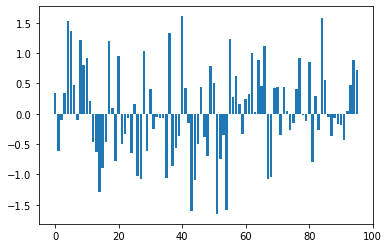

In [164]:
plt.bar(range(96), doc.vector)
plt.show()

In [ ]:
# use list comprehension to get the vectors for each word
word_vector_list = [doc.vector 

# calculate the mean across each word
average_word_vector = np.mean(word_vector_list, axis=0)

# check that the sum is the same as the other way
print(average_word_vector.sum())

spaCy est capable de comparer deux objets et de prédire leur similitude (utile pour créer des systèmes de recommandation ou signaler les doublons). La similitude est déterminée en comparant des vecteurs de mots ou différentes représentations de sens d'un mot. La méthode similarity() est donc utilisée pour comparer des documents et des token.

In [37]:
for token1 in doc:
    for token2 in doc :
        print(token1.text, token2.text, token1.similarity(token2))

0 0 1.0
0        0.21933575
0 WASHINGTON 0.13086098
0 — 0.09257461
0 Stellar 0.082841724
0 pitching -0.04545821
0 kept 0.035036366
0 the 0.019871958
0 Mets 0.059866432
0 af 0.10749218
0 ... 0.3276543
0 
 0.35413325
0 1 0.48111662
0        0.14209665
0 Mayor 0.074378625
0 Bill 0.24158867
0 de 0.051400546
0 Blasio 0.09338424


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

0 ’s -0.11503377
0 counsel 0.21334852
0 and -0.16820784
0 chief 0.098808885
0 legal -0.019543247
0 ... 0.32760862
0 
 0.34997675
0 2 0.49235862
0        0.121037304
0 In -0.106554225
0 the -0.03440716
0 early -0.01659533
0 morning 0.08140835
0 hours 0.013542814
0 of 0.05730737
0 Labor 0.16913286
0 Day 0.14123331
0 last -0.12250194
0 y 0.078613505
0 ... 0.31331933
0 
 0.2937094


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

0 3 0.55141884
0        0.1479413
0 It -0.02115382
0 was -0.12092148
0 the 0.022725547
0 Apple 0.17022163
0 Store 0.021924911
0 in -0.115608856
0 New 0.14109167
0 York 0.25573874
0 City 0.13832332
0 before -0.081452295
0 ... 0.38917994
0 
 0.25298
0 4 0.5099633
0        0.16180572
0 OMAHA 0.18623276
0 — 0.18603034
0 The 0.08154681
0 United 0.19773333
0 States -0.0177523
0 Olympic 0.11685728
0 swimming -0.037863586
0 tri 0.12426028


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

0 ... 0.18438467
0 
                               -0.06362259
0 ... 0.3336632
0                        
 0.29871726
0 8883 0.21536446
0     0.0839611
0 There -0.111387916
0 is -0.11810058
0 a -0.037165962
0 second 0.0153320255
0 critical -0.060495593
0 contest -0.0087520145
0 in -0.09482964
0 America 0.19788042
0 ’ -0.21014078
0 ... 0.34615043
0 
 0.34352857
0 8884 0.3110333
0     0.14790663
0 On 0.12418408
0 April 0.17853759
0 1 0.2975456
0 , -0.07741323


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

0 police -0.006525769
0 officers 0.0691884
0 from -0.01444175
0 the 0.046647806
0 108th 0.17543873
0 Pre 0.017948907
0 ... 0.3268775
0 
 0.38923827
0 8885 0.28121758
0     0.24040753
0 KHILAD 0.26370376
0 , -0.06775583
0 India 0.103012465
0 — 0.12890999
0 The -0.024139628
0 cattle -0.004266792
0 camp 0.07021694
0 , -0.100836456
0 on -0.10823121
0 a 0.1520725
0 dusty 0.11406568
0 ba 0.12496441


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

0 ... 0.3540947
0 
 0.36866814
0 8886 0.35280633
0     0.14551924
0 The 0.04222278
0 director 0.07014481
0 J.J. 0.26390928
0 Abrams 0.027628787
0 dropped -0.16865166
0 a 0.05421854
0 possible -0.08606472
0 hi 0.0066907913
0 ... 0.31136072
0 
 0.2979249
0 8887 0.40545085
0     0.258283
0 PALOS 0.03449218
0 VERDES 0.042955164
0 ESTATES 0.19619255
0 , -0.09885685
0 Calif. 0.34363952
0 — 0.09445492


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

0 From -0.012573625
0 high -0.095675185
0 atop -0.17210886
0 ... 0.37536642
0 
 0.37353456
0 Name 0.11645632
0 : 0.23952654
0 text 0.08803106
0 , -0.15128139
0 Length 0.20841931
0 : 0.19637264
0 8888 0.43527237
0 , -0.047978014
0 dtype 0.22064167
0 : 0.18466963
0 object 0.16433477
       0 0.21933575
              1.0
       WASHINGTON 0.41399035
       — -0.033173066
       Stellar 0.19911417
       pitching 0.1724963
       kept 0.081846185


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

       the 0.18759015
       Mets 0.14595693
       af 0.2613112
       ... -0.02014454
       
 0.36274198
       1 0.3447057
              1.0
       Mayor 0.36896396
       Bill 0.32612956
       de 0.31132078
       Blasio 0.38439435
       ’s 0.24900962
       counsel 0.2763694
       and 0.2774716
       chief 0.13399705
       legal 0.24175838
       ... -0.048933104
       
 0.3064392
       2 0.33031726
              1.0
       In -0.019933565
       the 0.101348124
       early 0.06154127
       morning 0.11205059
       hours 0.1895467


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

       of 0.16637518
       Labor 0.46747416
       Day 0.44997597
       last -0.079621896
       y -0.07345572
       ... -0.033980735
       
 0.28471065
       3 0.2907658
              1.0
       It -0.016936572
       was 0.03990486
       the 0.11939683
       Apple 0.3305956
       Store 0.28881782
       in 0.107488066
       New 0.53867894
       York 0.47032085
       City 0.3281059
       before -0.025184868
       ... -0.049806494
       
 0.25772992
       4 0.34101555
              1.0
       OMAHA 0.42565295


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

       — 0.066747494
       The 0.21174821
       United 0.4829449
       States 0.37675676
       Olympic 0.22780441
       swimming 0.26166952
       tri 0.24145229
       ... 0.14878425
       
                               0.074931934
       ... -0.07168231
                              
 0.32967225
       8883 0.09214814
           0.17006703
       There -0.05822552
       is 0.032900244
       a -0.00047953316
       second 0.11588103
       critical 0.08684964
       contest -0.006051259
       in -0.0076530995
       America 0.48988557
       ’ 0.07532484
       ... -0.09382853


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

       
 0.32404467
       8884 0.1959023
           0.26396194
       On 0.12487724
       April 0.5124708
       1 0.20642044
       , 0.17752847
       police 0.14023107
       officers 0.15343794
       from -0.06875498
       the 0.18157704
       108th 0.39212355
       Pre 0.27439952
       ... -0.077621385
       
 0.27970985
       8885 0.20740125
           0.34096462
       KHILAD 0.38408554
       , 0.070023485
       India 0.42055216
       — 0.22003035
       The 0.18262543
       cattle 0.22574925


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

       camp 0.03939017
       , 0.08974307
       on -0.06905883
       a 0.103698574
       dusty 0.17403048
       ba 0.32570106
       ... 0.078846075
       
 0.3180299
       8886 0.2005752
           0.3348065
       The 0.085086055
       director 0.2566448
       J.J. 0.55232185
       Abrams 0.37793025
       dropped 0.029518409
       a 0.0258788
       possible 0.03644688
       hi -0.029439112
       ... -0.1423015
       
 0.24580832
       8887 0.1476488
           0.24916697
       PALOS 0.32182026


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

       VERDES 0.374534
       ESTATES 0.37395823
       , 0.06761087
       Calif. 0.38170627
       — 0.06767848
       From -0.13334562
       high 0.07246858
       atop 0.06533244
       ... -0.048262063
       
 0.29211026
       Name 0.21979344
       : 0.06830626
       text 0.21758357
       , 0.097397074
       Length 0.30895343
       : 0.14013639
       8888 0.10511424
       , 0.14715
       dtype 0.2503153
       : 0.08213875
       object 0.20030011
WASHINGTON 0 0.13086098


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

WASHINGTON        0.41399035
WASHINGTON WASHINGTON 1.0
WASHINGTON — 0.025752133
WASHINGTON Stellar 0.35128468
WASHINGTON pitching 0.29824966
WASHINGTON kept 0.17097324
WASHINGTON the 0.02476918
WASHINGTON Mets 0.44555324
WASHINGTON af 0.2233104
WASHINGTON ... -0.09269276
WASHINGTON 
 0.18856837
WASHINGTON 1 0.1821127
WASHINGTON        0.30251786
WASHINGTON Mayor 0.44736952
WASHINGTON Bill 0.43007067
WASHINGTON de 0.26396307
WASHINGTON Blasio 0.5929048
WASHINGTON ’s 0.20278847
WASHINGTON counsel 0.43292373
WASHINGTON and 0.03505655
WASHINGTON chief 0.2723721
WASHINGTON legal 0.34184527


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

WASHINGTON ... -0.06960368
WASHINGTON 
 0.098401286
WASHINGTON 2 0.13314784
WASHINGTON        0.4034492
WASHINGTON In 0.05587024
WASHINGTON the -0.05942157
WASHINGTON early 0.10310296
WASHINGTON morning 0.12421774
WASHINGTON hours 0.11399952
WASHINGTON of -0.030962454
WASHINGTON Labor 0.3682447
WASHINGTON Day 0.49806908
WASHINGTON last 0.16281556
WASHINGTON y 0.18895672
WASHINGTON ... -0.13967405
WASHINGTON 
 0.14734358
WASHINGTON 3 0.12610072
WASHINGTON        0.33023265
WASHINGTON It 0.13698189
WASHINGTON was 0.081791416
WASHINGTON the 0.042369876
WASHINGTON Apple 0.5083353
WASHINGTON Store 0.41939634
WASHINGTON in 0.02376757


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

WASHINGTON New 0.44619998
WASHINGTON York 0.45075166
WASHINGTON City 0.45772147
WASHINGTON before 0.10354644
WASHINGTON ... -0.26201358
WASHINGTON 
 0.14742029
WASHINGTON 4 0.11317207
WASHINGTON        0.37044263
WASHINGTON OMAHA 0.7510536
WASHINGTON — 0.06857507
WASHINGTON The 0.24757321
WASHINGTON United 0.45411164
WASHINGTON States 0.46727723
WASHINGTON Olympic 0.47304007
WASHINGTON swimming 0.2500313
WASHINGTON tri 0.32526413
WASHINGTON ... -0.01742116
WASHINGTON 
                               0.06913299
WASHINGTON ... -0.11096517
WASHINGTON                        
 0.23798014
WASHINGTON 8883 0.14358644
WASHINGTON     -0.09001751
WASHINGTON There 0.08095917


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

WASHINGTON is -0.0140055055
WASHINGTON a -0.0013996488
WASHINGTON second 0.019837515
WASHINGTON critical 0.21249278
WASHINGTON contest 0.2173173
WASHINGTON in -0.03762448
WASHINGTON America 0.44165188
WASHINGTON ’ 0.10506868
WASHINGTON ... -0.21491311
WASHINGTON 
 0.12502253
WASHINGTON 8884 0.14334565
WASHINGTON     0.055525232
WASHINGTON On 0.008952713
WASHINGTON April 0.51164466
WASHINGTON 1 0.26614264
WASHINGTON , 0.032154977
WASHINGTON police 0.21974054
WASHINGTON officers 0.12428486
WASHINGTON from -0.06483222
WASHINGTON the -0.016745836
WASHINGTON 108th 0.45913425
WASHINGTON Pre 0.5384564
WASHINGTON ... -0.03236734


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

WASHINGTON 
 0.16311479
WASHINGTON 8885 0.1597187
WASHINGTON     0.06734472
WASHINGTON KHILAD 0.49607587
WASHINGTON , 0.10825585
WASHINGTON India 0.6074899
WASHINGTON — 0.070889995
WASHINGTON The 0.16924727
WASHINGTON cattle 0.12773201
WASHINGTON camp 0.23310696
WASHINGTON , 0.042741988
WASHINGTON on -0.059429772
WASHINGTON a 0.0135980435
WASHINGTON dusty 0.23900536
WASHINGTON ba 0.33149314
WASHINGTON ... -0.016778791
WASHINGTON 
 0.18803468
WASHINGTON 8886 0.18053234
WASHINGTON     0.039223455
WASHINGTON The 0.04473962
WASHINGTON director 0.26354936
WASHINGTON J.J. 0.44683355
WASHINGTON Abrams 0.4381502


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

WASHINGTON dropped 0.23975986
WASHINGTON a -0.011276712
WASHINGTON possible 0.10224755
WASHINGTON hi 0.050641365
WASHINGTON ... -0.23630217
WASHINGTON 
 0.102482885
WASHINGTON 8887 0.08790649
WASHINGTON     0.084441155
WASHINGTON PALOS 0.27938098
WASHINGTON VERDES 0.42838573
WASHINGTON ESTATES 0.54847366
WASHINGTON , 0.015190187
WASHINGTON Calif. 0.5704605
WASHINGTON — 0.022578076
WASHINGTON From -0.058936175
WASHINGTON high 0.12621315
WASHINGTON atop 0.09113566
WASHINGTON ... -0.17184173
WASHINGTON 
 0.16016716
WASHINGTON Name 0.3116841
WASHINGTON : -0.04992869
WASHINGTON text 0.3286602
WASHINGTON , 0.014187315
WASHINGTON Length 0.53986436


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

WASHINGTON : 0.012206203
WASHINGTON 8888 0.21343966
WASHINGTON , -0.030386982
WASHINGTON dtype 0.2794372
WASHINGTON : -0.08827123
WASHINGTON object 0.25101
— 0 0.09257461
—        -0.033173066
— WASHINGTON 0.025752133
— — 1.0
— Stellar -0.05158579
— pitching -0.09354238
— kept 0.10270699
— the -0.024600133
— Mets 0.046226952
— af 0.03083043
— ... 0.28128606
— 
 -0.04725698
— 1 0.035817306
—        -0.005706181
— Mayor -0.053643875
— Bill -0.010438193
— de 0.07383945


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

— Blasio -0.09077582
— ’s 0.17629278
— counsel -0.050634336
— and 0.030987682
— chief 0.022472735
— legal -0.11704313
— ... 0.2127246
— 
 -0.06834157
— 2 -0.03429874
—        0.019592624
— In -0.036656268
— the -0.08345436
— early 0.0007644177
— morning -0.0015332643
— hours -0.05348299
— of 0.046160378
— Labor -0.20550291
— Day 0.0117959315
— last -0.014434954
— y -0.1850251
— ... 0.28214553


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

— 
 -0.11746984
— 3 -0.06938909
—        0.019582395
— It -0.06985502
— was -0.0003927275
— the -0.12196143
— Apple -0.084986545
— Store -0.06512738
— in 0.11895189
— New -0.13246074
— York -0.10445169
— City 0.04243657
— before 0.007309264
— ... 0.26761875
— 
 -0.09342261
— 4 -0.00953502
—        -0.071958765
— OMAHA -0.014616542
— — 1.0
— The -0.07236781
— United 0.007873969
— States -0.015863162
— Olympic -0.053993244


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

— swimming 0.014953493
— tri -0.05348609
— ... 0.12267474
— 
                               -0.16122627
— ... 0.27473727
—                        
 -0.08846868
— 8883 0.11781948
—     0.21502256
— There -0.24157208
— is -0.029515538
— a -0.0549294
— second -0.11947789
— critical 0.034874797
— contest -0.046313822
— in 0.04212792
— America -0.076132566
— ’ 0.058910385
— ... 0.20546664
— 
 -0.06973123
— 8884 0.049472366
—     0.23345323
— On -0.056751203
— April -0.122098796
— 1 0.20530504


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

— , 0.25280353
— police -0.07797628
— officers -0.1434882
— from 0.035343498
— the -0.17073156
— 108th -0.057821106
— Pre -0.15845329
— ... 0.29485202
— 
 0.042617638
— 8885 0.15551987
—     0.12429399
— KHILAD -0.10114724
— , 0.4054139
— India -0.101847805
— — 1.0
— The -0.10324589
— cattle 0.112624995
— camp -0.065535344
— , 0.27879614
— on -0.00012499488
— a 0.021813177
— dusty -0.037337326
— ba -0.03612428
— ... 0.30026823


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

— 
 0.040029105
— 8886 0.14722668
—     0.19518568
— The -0.19488353
— director -0.10291049
— J.J. 0.02562446
— Abrams 0.043418188
— dropped 0.047114473
— a 0.025671266
— possible -0.02962235
— hi -0.14984491
— ... 0.17906067
— 
 -0.023721732
— 8887 0.060540635
—     0.20350641
— PALOS -0.011657996
— VERDES -0.18152438
— ESTATES -0.11708942
— , 0.21543336
— Calif. -0.028237898
— — 1.0
— From 0.088152684
— high -0.035358753


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

— atop -0.17747049
— ... 0.25688416
— 
 -0.0122647565
— Name -0.19834575
— : 0.4472519
— text -0.16600177
— , 0.29675934
— Length -0.12661318
— : 0.5837249
— 8888 0.04107416
— , 0.2226956
— dtype -0.081649415
— : 0.44981068
— object 0.0135001065
Stellar 0 0.082841724
Stellar        0.19911417
Stellar WASHINGTON 0.35128468
Stellar — -0.05158579
Stellar Stellar 1.0
Stellar pitching 0.11567139
Stellar kept 0.08814571
Stellar the -0.07485546
Stellar Mets 0.2563591
Stellar af 0.2233461
Stellar ... -0.07283629


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Stellar 
 0.16337001
Stellar 1 0.026236776
Stellar        0.13437262
Stellar Mayor 0.4297629
Stellar Bill 0.20343824
Stellar de 0.023015507
Stellar Blasio 0.333915
Stellar ’s 0.072471574
Stellar counsel 0.33035517
Stellar and 0.06177529
Stellar chief 0.36181322
Stellar legal 0.4723447
Stellar ... -0.06869149
Stellar 
 0.14795491
Stellar 2 -0.046191446
Stellar        0.1394791
Stellar In 0.104132764
Stellar the 0.13615938
Stellar early 0.52644366
Stellar morning 0.10324738
Stellar hours 0.16848862
Stellar of -0.0640636
Stellar Labor 0.35660693


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Stellar Day 0.28199488
Stellar last 0.38455495
Stellar y 0.04447525
Stellar ... -0.14042172
Stellar 
 0.1314664
Stellar 3 0.108094096
Stellar        0.08775717
Stellar It 0.16205472
Stellar was -0.057771094
Stellar the -0.08643874
Stellar Apple 0.29145175
Stellar Store 0.19917151
Stellar in 0.034355793
Stellar New 0.49520937
Stellar York 0.32416075
Stellar City 0.20426324
Stellar before 0.20877528
Stellar ... -0.12171097
Stellar 
 0.11404843
Stellar 4 0.106822066
Stellar        0.18098165
Stellar OMAHA 0.38751808


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Stellar — -0.021625696
Stellar The 0.29551753
Stellar United 0.26690015
Stellar States 0.27114004
Stellar Olympic 0.6382563
Stellar swimming 0.121884644
Stellar tri 0.32621843
Stellar ... -0.059272077
Stellar 
                               0.053115536
Stellar ... -0.1614089
Stellar                        
 0.12936872
Stellar 8883 0.038260967
Stellar     -0.0655374
Stellar There 0.13130406
Stellar is -0.020125065
Stellar a -0.03951769
Stellar second 0.20303378
Stellar critical 0.43716857
Stellar contest 0.08563941
Stellar in -0.00017887562
Stellar America 0.27667958
Stellar ’ -0.11061162


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Stellar ... -0.104677975
Stellar 
 0.108911514
Stellar 8884 0.02779087
Stellar     -0.06646087
Stellar On 0.051582932
Stellar April 0.41657734
Stellar 1 0.033604614
Stellar , -0.005557717
Stellar police 0.14102603
Stellar officers 0.10850569
Stellar from -0.1326559
Stellar the 0.052964896
Stellar 108th 0.33575016
Stellar Pre 0.32040954
Stellar ... -0.020794157
Stellar 
 0.19012244
Stellar 8885 0.0020561968
Stellar     0.03428832
Stellar KHILAD 0.16238825
Stellar , -0.027122252
Stellar India 0.32436162
Stellar — -0.043695107
Stellar The 0.46808007


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Stellar cattle 0.1002532
Stellar camp -0.0018492491
Stellar , 0.0847243
Stellar on -0.008014352
Stellar a 0.06522213
Stellar dusty 0.351352
Stellar ba 0.16096531
Stellar ... -0.036722165
Stellar 
 0.19428821
Stellar 8886 0.03612625
Stellar     -0.038217478
Stellar The 0.27430317
Stellar director 0.18152869
Stellar J.J. 0.28075954
Stellar Abrams 0.21797018
Stellar dropped 0.033474494
Stellar a 0.0071322555
Stellar possible 0.1783286
Stellar hi 0.20000845
Stellar ... -0.16400439
Stellar 
 0.08968693
Stellar 8887 0.10793365
Stellar     0.077666774


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Stellar PALOS 0.34583592
Stellar VERDES 0.25198153
Stellar ESTATES 0.24037479
Stellar , -0.0009907776
Stellar Calif. 0.18827234
Stellar — -0.10879148
Stellar From 0.0073720226
Stellar high 0.3773844
Stellar atop 0.14732385
Stellar ... -0.114514984
Stellar 
 0.22887988
Stellar Name 0.15873374
Stellar : -0.123582765
Stellar text 0.13083191
Stellar , -0.07097817
Stellar Length 0.31733078
Stellar : -0.07292151
Stellar 8888 0.10022066
Stellar , -0.032750722
Stellar dtype 0.16630904
Stellar : -0.16089511
Stellar object 0.172637


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

pitching 0 -0.04545821
pitching        0.1724963
pitching WASHINGTON 0.29824966
pitching — -0.09354238
pitching Stellar 0.11567139
pitching pitching 1.0
pitching kept 0.102212496
pitching the 0.0180764
pitching Mets 0.0907852
pitching af 0.12864487
pitching ... 0.024333086
pitching 
 0.17946678
pitching 1 0.04523517
pitching        0.09204863
pitching Mayor 0.19629513
pitching Bill 0.22509804
pitching de 0.09108956
pitching Blasio 0.18218035
pitching ’s -0.06407825
pitching counsel 0.348736
pitching and 0.18490547
pitching chief 0.37671044
pitching legal 0.30216306


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

pitching ... -0.015494612
pitching 
 0.1894235
pitching 2 0.1510894
pitching        0.09057852
pitching In 0.008219387
pitching the 0.13767058
pitching early 0.11981036
pitching morning 0.49485734
pitching hours 0.2492515
pitching of 0.012210615
pitching Labor 0.312966
pitching Day 0.20838495
pitching last 0.09311532
pitching y 0.1974993
pitching ... -0.0012048166
pitching 
 0.24905345
pitching 3 0.044399768
pitching        0.021222696
pitching It -0.01398007
pitching was 0.14844427
pitching the 0.024400847
pitching Apple 0.04264664
pitching Store 0.10084604
pitching in 0.06849428


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

pitching New 0.14227848
pitching York 0.0016496071
pitching City 0.120992035
pitching before 0.11161825
pitching ... -0.08067281
pitching 
 0.23169507
pitching 4 0.018014254
pitching        0.265808
pitching OMAHA 0.25530115
pitching — -0.059485234
pitching The 0.07392442
pitching United 0.02461677
pitching States 0.04570688
pitching Olympic 0.10825593
pitching swimming 0.55853593
pitching tri 0.21981382
pitching ... 0.06708027
pitching 
                               0.13756175
pitching ... -0.06707048
pitching                        
 0.076982655
pitching 8883 0.07547665


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

pitching     -0.0801736
pitching There -0.022456523
pitching is 0.10714974
pitching a 0.14952518
pitching second 0.2933866
pitching critical 0.34138468
pitching contest 0.30937958
pitching in 0.1527998
pitching America 0.18917127
pitching ’ 0.021437744
pitching ... -0.116995506
pitching 
 0.23890628
pitching 8884 0.07677022
pitching     0.03795882
pitching On 0.0700116
pitching April 0.14518121
pitching 1 0.08557632
pitching , 0.1235164
pitching police 0.40278146
pitching officers 0.23079135
pitching from 0.1531446
pitching the 0.030169021


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

pitching 108th 0.20861995
pitching Pre 0.14857632
pitching ... 0.0059863976
pitching 
 0.21938877
pitching 8885 0.16577625
pitching     0.013688197
pitching KHILAD 0.24478835
pitching , -0.015949098
pitching India 0.18091722
pitching — -0.1346289
pitching The 0.04861166
pitching cattle 0.34108183
pitching camp 0.42654148
pitching , -0.023780832
pitching on 0.02271524
pitching a 0.14801204
pitching dusty 0.29424864
pitching ba 0.27612296
pitching ... 0.003403406
pitching 
 0.20446423
pitching 8886 0.10459613
pitching     -0.030257829
pitching The 0.00348414
pitching director 0.30560374


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

pitching J.J. 0.07644283
pitching Abrams 0.1676287
pitching dropped 0.02240207
pitching a 0.055907026
pitching possible 0.35418868
pitching hi 0.061794113
pitching ... -0.028744232
pitching 
 0.22804485
pitching 8887 0.084111966
pitching     -0.036989015
pitching PALOS 0.24970278
pitching VERDES 0.41079935
pitching ESTATES 0.24275617
pitching , -0.046957377
pitching Calif. 0.22971147
pitching — -0.08199294
pitching From 0.03326333
pitching high 0.23212567
pitching atop 0.15122895
pitching ... -0.0012337081
pitching 
 0.17331737
pitching Name 0.32855707


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

pitching : -0.035208907
pitching text 0.37237102
pitching , 0.049854532
pitching Length 0.41820788
pitching : 0.012445928
pitching 8888 0.20064169
pitching , 0.007426634
pitching dtype 0.36106178
pitching : -0.08429964
pitching object 0.29398817
kept 0 0.035036366
kept        0.081846185
kept WASHINGTON 0.17097324
kept — 0.10270699
kept Stellar 0.08814571
kept pitching 0.102212496
kept kept 1.0
kept the -0.31131798
kept Mets -0.16517183
kept af -0.21630841
kept ... 0.09633416
kept 
 -0.109434605
kept 1 0.111826286
kept        0.116634466


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

kept Mayor -0.0025554108
kept Bill -0.09885424
kept de -0.03054421
kept Blasio 0.19540684
kept ’s -0.060989823
kept counsel 0.15610917
kept and -0.027798364
kept chief -0.0062317285
kept legal 0.024144383
kept ... 0.017869273
kept 
 -0.13047841
kept 2 0.13759746
kept        0.16770667
kept In 0.12267743
kept the -0.27700856
kept early -0.0348455
kept morning -0.06861253
kept hours -0.104315445
kept of 0.032943983
kept Labor 0.10237586
kept Day -0.033689536
kept last 0.12011281
kept y -0.1016325
kept ... 0.03830961


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

kept 
 -0.068081
kept 3 0.06911346
kept        -0.015421816
kept It -0.18768904
kept was 0.6730883
kept the -0.3909985
kept Apple -0.051403437
kept Store 0.032762513
kept in 0.0742656
kept New -0.06374327
kept York -0.05816221
kept City 0.030165454
kept before 0.024482686
kept ... -0.05356108
kept 
 -0.10846856
kept 4 0.09527263
kept        0.057845
kept OMAHA 0.20638235
kept — 0.16479872
kept The -0.18675204
kept United 0.044822134
kept States 0.14121906


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

kept Olympic 0.085713215
kept swimming 0.105310805
kept tri -0.06717358
kept ... 0.03589137
kept 
                               -0.13300833
kept ... 0.047934096
kept                        
 -0.010344334
kept 8883 0.18448785
kept     -0.15811847
kept There -0.12319038
kept is 0.28785032
kept a -0.29368287
kept second -0.13734458
kept critical 0.07422223
kept contest 0.008163174
kept in 0.096743435
kept America -0.030501489
kept ’ 0.031002462
kept ... 0.0027051691
kept 
 -0.04988388
kept 8884 0.21728389
kept     -0.13263772
kept

/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

 On 0.062627986
kept April -0.08124801
kept 1 0.12614064
kept , 0.11470384
kept police -0.023629885
kept officers -0.009777932
kept from 0.20406343
kept the -0.31827477
kept 108th 0.039457895
kept Pre 0.22922431
kept ... -0.0040097423
kept 
 -0.04618943
kept 8885 0.14799155
kept     -0.20496628
kept KHILAD -0.07110028
kept , 0.24257135
kept India -0.08127691
kept — 0.16107856
kept The -0.22835647
kept cattle 0.0067426967
kept camp 0.20970869
kept , 0.043618124
kept on 0.083913855
kept a -0.2989102


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

kept dusty 0.027603919
kept ba -0.0010005324
kept ... 0.055859994
kept 
 -0.07045936
kept 8886 0.194556
kept     -0.072754964
kept The -0.21628697
kept director 0.090618335
kept J.J. 0.098819606
kept Abrams -0.009095696
kept dropped 0.6297121
kept a -0.3058047
kept possible 0.04321661
kept hi -0.15338121
kept ... -0.049016427
kept 
 -0.087823056
kept 8887 0.10725435
kept     -0.13303494
kept PALOS 0.09623598
kept VERDES 0.24081704
kept ESTATES 0.009289279
kept , 0.09083081
kept Calif. 0.06491583
kept — 0.21949358


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

kept From -0.05502126
kept high 0.11073355
kept atop 0.059113674
kept ... -0.081841804
kept 
 -0.1451603
kept Name 0.09675024
kept : -0.0560092
kept text 0.121259935
kept , 0.061988816
kept Length 0.15116973
kept : 0.025882117
kept 8888 0.03671477
kept , 0.040628467
kept dtype 0.057844456
kept : 0.0496091
kept object 0.15929174
the 0 0.019871958
the        0.18759015
the WASHINGTON 0.02476918
the — -0.024600133
the Stellar -0.07485546
the pitching 0.0180764


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

the kept -0.31131798
the the 1.0
the Mets 0.12135096
the af 0.06014147
the ... 0.06569966
the 
 0.14850171
the 1 0.19548365
the        0.15738752
the Mayor 0.15764706
the Bill 0.07522079
the de 0.082642175
the Blasio 0.057926726
the ’s 0.15054807
the counsel -0.14835769
the and 0.15707849
the chief 0.0437029
the legal 0.0010050866
the ... 0.075153135
the 
 0.14748149
the 2 0.11029358
the        0.06206188
the In -0.06731896
the the 1.0
the early 0.05116726


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

the morning 0.13199818
the hours 0.14218776
the of 0.20403297
the Labor 0.12395475
the Day 0.049561236
the last -0.09726961
the y -0.061087884
the ... 0.08286686
the 
 0.110917374
the 3 0.06410766
the        0.09888805
the It 0.12314082
the was -0.082848825
the the 1.0
the Apple 0.22279082
the Store -0.023037743
the in 0.12247263
the New 0.23011108
the York 0.17674965
the City 0.09523171
the before -0.04561803
the ... -0.0004734208
the 
 0.14181153


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

the 4 0.12616274
the        0.11386461
the OMAHA -0.068578266
the — -0.054850575
the The 0.58936083
the United 0.15293899
the States 0.11115442
the Olympic 0.03845573
the swimming -0.094229795
the tri 0.057383988
the ... 0.04383227
the 
                               -0.17026152
the ... 0.08070386
the                        
 0.077099584
the 8883 -0.11621319
the     -0.087352775
the There 0.09588844
the is -0.06275586
the a 0.6008908
the second 0.13891149
the critical 0.02833703
the contest -0.008260512
the in 0.040385783


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

the America 0.024304684
the ’ 0.0098610865
the ... 0.07191526
the 
 0.017946715
the 8884 -0.044830766
the     -0.012106609
the On 0.21607777
the April 0.13796204
the 1 0.08764156
the , 0.018114025
the police 0.09943119
the officers -0.0139595
the from -0.06432092
the the 1.0
the 108th 0.043468397
the Pre -0.06746697
the ... 0.10965361
the 
 0.022669973
the 8885 -0.0046840967
the     0.12908477
the KHILAD 0.06204979
the , -0.088235654
the India 0.24232069


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

the — 0.03369651
the The 0.5141477
the cattle -0.013678871
the camp -0.08029451
the , 0.079874925
the on -0.02725523
the a 0.5997141
the dusty 0.040341835
the ba -0.13828045
the ... 0.09616504
the 
 0.08519645
the 8886 -0.02327374
the     -0.09029691
the The 0.47483563
the director -0.026507812
the J.J. -0.0043967827
the Abrams 0.06373833
the dropped -0.18101743
the a 0.68014306
the possible 0.04472059
the hi 0.043351483
the ... 0.06751827


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

the 
 -0.0019157601
the 8887 -0.011023966
the     -0.112913005
the PALOS -0.19434285
the VERDES -0.07201357
the ESTATES -0.019028053
the , -0.101683564
the Calif. -0.040360276
the — 0.008433225
the From 0.098944604
the high -0.024561241
the atop 0.17478706
the ... 0.07926043
the 
 -0.0037217264
the Name 0.12094175
the : 0.16724204
the text -0.1263357
the , 0.070117295
the Length 0.034110814
the : 0.1607304
the 8888 -0.019697733
the , -0.03971997


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

the dtype 0.019925104
the : -0.007547496
the object -0.052650835
Mets 0 0.059866432
Mets        0.14595693
Mets WASHINGTON 0.44555324
Mets — 0.046226952
Mets Stellar 0.2563591
Mets pitching 0.0907852
Mets kept -0.16517183
Mets the 0.12135096
Mets Mets 1.0
Mets af 0.17235674
Mets ... -0.1381458
Mets 
 0.1913637
Mets 1 0.09345443
Mets        0.053966176
Mets Mayor 0.23248251
Mets Bill 0.29611856
Mets de 0.095156945
Mets Blasio 0.28079802
Mets ’s 0.01501064
Mets counsel 0.15146838
Mets and -0.011757683


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Mets chief 0.080069415
Mets legal 0.18276645
Mets ... -0.0012233868
Mets 
 0.11450167
Mets 2 0.060734276
Mets        0.25620544
Mets In 0.07625004
Mets the -0.0043481826
Mets early 0.18953893
Mets morning 0.16907972
Mets hours 0.29613152
Mets of -0.06279799
Mets Labor 0.26999617
Mets Day 0.29627126
Mets last -0.042651083
Mets y 0.02928237
Mets ... -0.16997038
Mets 
 0.114149675
Mets 3 0.052058063
Mets        0.20588103
Mets It 0.060154006
Mets was -0.23963134
Mets the 0.13257642


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Mets Apple 0.4401672
Mets Store 0.3461033
Mets in -0.06668849
Mets New 0.3064062
Mets York 0.30571982
Mets City 0.2504584
Mets before -0.016750352
Mets ... -0.15840438
Mets 
 0.14953238
Mets 4 0.1075145
Mets        0.17104767
Mets OMAHA 0.2810823
Mets — 0.03573652
Mets The 0.15660128
Mets United 0.31117955
Mets States 0.46403083
Mets Olympic 0.25095147
Mets swimming 0.09550291
Mets tri 0.15198909
Mets ... -0.036463525
Mets 
                               0.018623155
Mets ... -0.21705085
Mets                        
 0.2761989
Mets 8883 -0.066001855


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Mets     0.05014121
Mets There 0.0037747165
Mets is -0.10441245
Mets a -0.00046815156
Mets second 0.08183567
Mets critical 0.16685718
Mets contest 0.021703117
Mets in -0.15967192
Mets America 0.28734916
Mets ’ -0.15925667
Mets ... -0.230284
Mets 
 0.072321415
Mets 8884 -0.062243715
Mets     0.10363164
Mets On -0.0067809243
Mets April 0.4628193
Mets 1 0.023051003
Mets , 0.04307884
Mets police 0.19078986
Mets officers 0.27715534
Mets from -0.12589309
Mets the 0.06964936
Mets 108th 0.26421243
Mets Pre 0.19751158


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Mets ... -0.03848478
Mets 
 0.12739067
Mets 8885 -0.013937726
Mets     0.18119739
Mets KHILAD 0.27182043
Mets , 0.010228846
Mets India 0.48531353
Mets — -0.024583353
Mets The 0.13562904
Mets cattle 0.4096556
Mets camp 0.036576767
Mets , 0.09180079
Mets on -0.14740737
Mets a 0.044430953
Mets dusty 0.24364136
Mets ba 0.07747581
Mets ... -0.0708344
Mets 
 0.19594052
Mets 8886 0.028339379
Mets     0.07191085
Mets The 0.04951954
Mets director 0.10823111
Mets J.J. 0.20955221


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Mets Abrams 0.38406613
Mets dropped -0.1933415
Mets a 0.0060975337
Mets possible 0.14874384
Mets hi -0.048650395
Mets ... -0.1965117
Mets 
 0.05161641
Mets 8887 -0.0764496
Mets     0.15798979
Mets PALOS 0.13220496
Mets VERDES 0.1752506
Mets ESTATES 0.39726073
Mets , -0.013484419
Mets Calif. 0.2962317
Mets — -0.121975765
Mets From 0.07621325
Mets high 0.08241614
Mets atop 0.016594557
Mets ... 0.026349904
Mets 
 0.15061516
Mets Name 0.07044412
Mets : 0.037561607


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Mets text 0.023321604
Mets , 0.039806075
Mets Length 0.32942474
Mets : 0.10643309
Mets 8888 0.0797893
Mets , 0.07339628
Mets dtype 0.10334287
Mets : -0.09011314
Mets object -0.0501592
af 0 0.10749218
af        0.2613112
af WASHINGTON 0.2233104
af — 0.03083043
af Stellar 0.2233461
af pitching 0.12864487
af kept -0.21630841
af the 0.06014147
af Mets 0.17235674
af af 1.0
af ... -0.1508248
af 
 0.32516125
af 1 -0.0358505
af        0.23101409
af Mayor 0.1997278
af Bill 0.30214992
af de 0.10502479


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

af Blasio 0.1992795
af ’s 0.043095198
af counsel 0.21916072
af and -0.0014266912
af chief 0.31890336
af legal 0.33743793
af ... -0.06630641
af 
 0.3443919
af 2 -0.092142515
af        0.2277529
af In 0.13188702
af the 0.14257422
af early 0.12820481
af morning 0.1929637
af hours 0.277569
af of -0.01005997
af Labor 0.20188215
af Day 0.26982245
af last 0.13125247
af y 0.20422038
af ... -0.122000106
af 
 0.30298156
af 3 -0.05991026
af        0.24626583


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

af It 0.18294182
af was -0.25845256
af the 0.15996043
af Apple 0.24871336
af Store 0.13581014
af in 0.16271244
af New 0.26972324
af York 0.23162483
af City 0.19283333
af before 0.32760185
af ... -0.058000587
af 
 0.27564427
af 4 0.014607754
af        0.27705124
af OMAHA 0.34255287
af — 0.012835207
af The 0.20034409
af United 0.0771285
af States 0.14901268
af Olympic 0.28891516
af swimming 0.19281432
af tri 0.2573616
af ... 0.026145868


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

af 
                               0.08939502
af ... -0.16744083
af                        
 0.27248475
af 8883 -0.008720729
af     0.14921883
af There -0.076251775
af is -0.04709524
af a 0.12481044
af second 0.15628633
af critical 0.09438274
af contest 0.08868485
af in 0.042987343
af America 0.2511707
af ’ 0.099761866
af ... -0.17004167
af 
 0.2872112
af 8884 -0.02176099
af     0.16643137
af On 0.083894916
af April 0.3793129
af 1 0.015313669
af , 0.023252828


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

af police 0.16752283
af officers 0.16996178
af from -0.020968907
af the 0.11903919
af 108th 0.28542808
af Pre 0.07984107
af ... 0.009229178
af 
 0.35105637
af 8885 0.020882856
af     0.18071784
af KHILAD 0.2378418
af , -0.06734192
af India 0.4114699
af — 0.045791663
af The 0.20308357
af cattle 0.07133347
af camp 0.004477156
af , 0.09389707
af on -0.031641457
af a 0.05228879
af dusty 0.20467012
af ba 0.3205374
af ... -0.04160364


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

af 
 0.33584997
af 8886 0.03150886
af     0.17467985
af The 0.05214903
af director 0.29096058
af J.J. 0.19160224
af Abrams 0.21980077
af dropped -0.19144744
af a 0.07516114
af possible 0.073376246
af hi 0.29579335
af ... -0.13773334
af 
 0.31777844
af 8887 0.059707746
af     0.1981247
af PALOS 0.20812029
af VERDES 0.2738781
af ESTATES 0.27083173
af , -0.024273839
af Calif. 0.13928011
af — -0.009130899
af From 0.1444001
af high 0.24528442
af atop 0.23614708


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

af ... -0.052417725
af 
 0.22537412
af Name 0.23363337
af : -0.01949767
af text 0.12526637
af , -0.08382407
af Length 0.14588277
af : 0.009659583
af 8888 -0.024581308
af , -0.06264284
af dtype 0.064578
af : -0.011227082
af object 0.189453
... 0 0.3276543
...        -0.02014454
... WASHINGTON -0.09269276
... — 0.28128606
... Stellar -0.07283629
... pitching 0.024333086
... kept 0.09633416
... the 0.06569966
... Mets -0.1381458
... af -0.1508248
... ... 1.0


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... 
 0.25284198
... 1 0.17765252
...        -0.13863792
... Mayor -0.22363329
... Bill -0.011336283
... de -0.052131422
... Blasio -0.11088133
... ’s 0.035617813
... counsel -0.080024116
... and -0.11197247
... chief 0.08524723
... legal -0.07120306
... ... 1.0
... 
 0.2666594
... 2 0.24283458
...        -0.0042862
... In -0.100041874
... the 0.047083132
... early -0.015221076
... morning 0.13368034
... hours 0.1218039
... of -0.005239506


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... Labor 0.010808165
... Day -0.043288678
... last -0.04481475
... y -0.0018931151
... ... 1.0
... 
 0.25541613
... 3 0.23667869
...        -0.13388947
... It -0.09699369
... was 0.002604591
... the 0.03288238
... Apple -0.07129047
... Store -0.10714897
... in -0.06700203
... New -0.01639094
... York -0.00038280443
... City -0.01247275
... before -0.124215886
... ... 1.0
... 
 0.25341406
... 4 0.107664086
...        -0.10638089
... OMAHA -0.11950703
... — 0.42525917
... The 0.033539664


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... United -0.076873384
... States -0.059256237
... Olympic -0.11724025
... swimming -0.06369457
... tri 0.08216103
... ... 1.0
... 
                               0.05179564
... ... 1.0
...                        
 0.18026169
... 8883 0.20536226
...     0.2539902
... There -0.25540045
... is 0.023975203
... a 0.0004910517
... second -0.04811816
... critical 0.068270706
... contest 0.12102006
... in 0.031524178
... America 0.020250233
... ’ 0.1368258
... ... 1.0
... 
 0.23848194
... 8884 0.15245375
...     0.33217016
... On 0.08109739
... April -0.10272864
... 1 0.105908975


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... , 0.0061213076
... police -0.05405074
... officers 0.0017318293
... from -0.120489925
... the -0.030512415
... 108th -0.15795405
... Pre -0.0562839
... ... 1.0
... 
 0.28681797
... 8885 0.2794912
...     0.2276468
... KHILAD -0.050654273
... , 0.17487061
... India -0.10936429
... — 0.3812787
... The 0.03331116
... cattle -0.084113866
... camp -0.012542175
... , 0.18244086
... on -0.103812225
... a 0.11078365
... dusty -0.0526751
... ba -0.11839459
... ... 1.0
... 
 0.26394132


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... 8886 0.26220503
...     0.275416
... The 0.035894934
... director -0.18787242
... J.J. 0.04075345
... Abrams 0.041479837
... dropped -0.017942194
... a 0.11902323
... possible -0.03197297
... hi 0.14188339
... ... 1.0
... 
 0.29286826
... 8887 0.22228442
...     0.16729344
... PALOS -0.014977994
... VERDES 0.025540335
... ESTATES 0.05280017
... , 0.12972488
... Calif. -0.11994771
... — 0.45667338
... From -0.06428021
... high -0.16326298
... atop -0.08869937
... ... 1.0
... 
 0.35690224


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... Name 0.17235169
... : 0.5480111
... text -0.08570643
... , 0.29897064
... Length -0.047833085
... : 0.48189026
... 8888 0.11025773
... , 0.0871037
... dtype 0.09112955
... : 0.43738633
... object 0.09629173

 0 0.35413325

        0.36274198

 WASHINGTON 0.18856837

 — -0.04725698

 Stellar 0.16337001

 pitching 0.17946678

 kept -0.109434605

 the 0.14850171

 Mets 0.1913637

 af 0.32516125

 ... 0.25284198

 
 1.0

 1 0.2854901


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


        0.30809924

 Mayor 0.28869227

 Bill 0.4504325

 de 0.20198266

 Blasio 0.2844173

 ’s 0.1601372

 counsel 0.21488522

 and -0.012032104

 chief 0.11973311

 legal 0.19924271

 ... 0.23633917

 
 1.0

 2 0.29251057

        0.3569656

 In 0.15317

 the 0.10512196

 early 0.11689381

 morning 0.24458578

 hours 0.22162415

 of 0.04464454

 Labor 0.5184247

 Day 0.30001733

 last -0.0062611816


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 y 0.1502866

 ... 0.22285978

 
 1.0

 3 0.259735

        0.2968291

 It 0.08043033

 was -0.1990117

 the 0.1348617

 Apple 0.30596483

 Store 0.11752007

 in 0.009463501

 New 0.3653724

 York 0.3419854

 City 0.26216525

 before -0.014112675

 ... 0.2993199

 
 1.0

 4 0.32459766

        0.32733917

 OMAHA 0.19408408

 — 0.05113907

 The 0.19093445

 United 0.21725783

 States 0.178037


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 Olympic 0.2702205

 swimming 0.20436716

 tri 0.24979956

 ... 0.28015524

 
                               0.12620209

 ... 0.14848624

                        
 0.6502373

 8883 0.08847638

     0.07889781

 There -0.1956731

 is -0.035770442

 a 0.057529133

 second 0.06395345

 critical -0.009025731

 contest 0.014641608

 in 0.082644485

 America 0.395706

 ’ -0.021759113

 ... 0.16935632

 
 1.0

 8884 0.118363395

     0.17978689

 On 0.23052567

 April 0.56825817


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 1 0.16187139

 , 0.034064118

 police 0.22145829

 officers 0.16610022

 from -0.031578302

 the 0.12952147

 108th 0.26101893

 Pre 0.17730567

 ... 0.19576316

 
 1.0

 8885 0.2967151

     0.24636352

 KHILAD 0.33256358

 , 0.00621574

 India 0.39098945

 — 0.10626617

 The 0.15378274

 cattle 0.044256996

 camp 0.18572201

 , 0.07406341

 on -0.13131052

 a 0.1569316

 dusty 0.19701399


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 ba 0.35383403

 ... 0.3769131

 
 1.0

 8886 0.27279034

     0.1773894

 The 0.15309434

 director 0.0944853

 J.J. 0.34665856

 Abrams 0.25448814

 dropped -0.22135364

 a 0.11941935

 possible 0.031886246

 hi 0.2221075

 ... 0.17923443

 
 1.0

 8887 0.21879818

     0.2631839

 PALOS 0.2745576

 VERDES 0.22508451

 ESTATES 0.33477783

 , -0.05712397

 Calif. 0.20268606

 — 0.060244404

 From 0.11514122


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 high -0.053671014

 atop 0.13940087

 ... 0.2966345

 
 1.0

 Name 0.43120447

 : 0.24797721

 text 0.21200722

 , 0.05369739

 Length 0.38268703

 : 0.23002768

 8888 0.28278682

 , 0.0031445904

 dtype 0.1550747

 : 0.14533013

 object 0.19507736
1 0 0.48111662
1        0.3447057
1 WASHINGTON 0.1821127
1 — 0.035817306
1 Stellar 0.026236776
1 pitching 0.04523517
1 kept 0.111826286
1 the 0.19548365


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

1 Mets 0.09345443
1 af -0.0358505
1 ... 0.17765252
1 
 0.2854901
1 1 1.0
1        0.2899366
1 Mayor 0.2406685
1 Bill 0.16337472
1 de 0.15196489
1 Blasio 0.18123047
1 ’s 0.07789242
1 counsel 0.10782875
1 and 0.1465232
1 chief 0.09291179
1 legal 0.05912041
1 ... 0.12844424
1 
 0.2906793
1 2 0.8791049
1        0.22765893
1 In -0.08343699
1 the -0.034539517
1 early 0.13647065
1 morning 0.20427504


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

1 hours 0.12834938
1 of 0.23170453
1 Labor 0.27382693
1 Day 0.23455447
1 last -0.25025803
1 y 0.0039360346
1 ... 0.17254364
1 
 0.27733693
1 3 0.78804475
1        0.17683773
1 It 0.012774147
1 was 0.08950069
1 the 0.02280459
1 Apple 0.081764266
1 Store 0.018860966
1 in 0.02685287
1 New 0.24623838
1 York 0.4640776
1 City 0.20505269
1 before -0.07711695
1 ... 0.14314911
1 
 0.2744675


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

1 4 0.84282696
1        0.30488175
1 OMAHA 0.118135095
1 — 0.104389645
1 The 0.20161416
1 United 0.25425926
1 States 0.14333712
1 Olympic 0.1762048
1 swimming 0.017094372
1 tri 0.21093693
1 ... 0.17537749
1 
                               0.004290907
1 ... 0.088448174
1                        
 0.20360722
1 8883 0.4429877
1     0.08644707
1 There -0.11142673
1 is -0.032218043
1 a 0.0496966
1 second 0.049006585
1 critical 0.022885708


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

1 contest -0.0007990145
1 in -0.15898247
1 America 0.2622486
1 ’ 0.09609659
1 ... 0.10764274
1 
 0.28531384
1 8884 0.6130919
1     0.11600776
1 On 0.054323655
1 April 0.3109296
1 1 1.0
1 , 0.03010664
1 police 0.22874151
1 officers 0.17043631
1 from -0.017091941
1 the 0.073356956
1 108th 0.15978566
1 Pre 0.08173127
1 ... 0.17965984
1 
 0.2999303
1 8885 0.5865612
1     0.31743973
1 KHILAD 0.24051945


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

1 , 0.0043807225
1 India 0.11167947
1 — 0.0697059
1 The 0.13844065
1 cattle 0.13995123
1 camp 0.12148835
1 , -0.062057696
1 on -0.17653427
1 a 0.15494506
1 dusty 0.040410306
1 ba 0.19429465
1 ... 0.2962112
1 
 0.32081753
1 8886 0.61711884
1     0.13501602
1 The 0.177962
1 director 0.16826639
1 J.J. 0.35340214
1 Abrams 0.1993792
1 dropped -0.09036155
1 a 0.102397546
1 possible -0.06347861


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

1 hi -0.050458837
1 ... 0.05480509
1 
 0.23313354
1 8887 0.58295965
1     0.29427168
1 PALOS 0.037179414
1 VERDES 0.11921985
1 ESTATES 0.2128486
1 , 0.015419092
1 Calif. 0.31130797
1 — 0.040941384
1 From 0.0016481484
1 high -0.084005974
1 atop -0.04483961
1 ... 0.05094656
1 
 0.20610343
1 Name 0.23416245
1 : 0.13573974
1 text 0.09766589
1 , -0.103474796
1 Length 0.2076396
1 : 0.21126951


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

1 8888 0.56516707
1 , 0.048687074
1 dtype 0.22687444
1 : 0.09684067
1 object 0.1587107
       0 0.14209665
              1.0
       WASHINGTON 0.30251786
       — -0.005706181
       Stellar 0.13437262
       pitching 0.09204863
       kept 0.116634466
       the 0.15738752
       Mets 0.053966176
       af 0.23101409
       ... -0.13863792
       
 0.30809924
       1 0.2899366
              1.0
       Mayor 0.44051516
       Bill 0.3782198
       de 0.40246198
       Blasio 0.41442
       ’s 0.3828855


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

       counsel 0.24301675
       and 0.22103128
       chief 0.14218597
       legal 0.14470117
       ... -0.119450696
       
 0.2776269
       2 0.22599158
              1.0
       In 0.067270525
       the 0.03135177
       early 0.04906875
       morning 0.06447244
       hours 0.011542523
       of 0.16652407
       Labor 0.35396412
       Day 0.39257702
       last 0.014869278
       y -0.1606033
       ... -0.10644277
       
 0.24952187
       3 0.18642138
              1.0
       It -0.024341427
       was 0.13475311


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

       the 0.123892404
       Apple 0.27175495
       Store 0.22750744
       in 0.23403232
       New 0.4101192
       York 0.46462813
       City 0.3779298
       before -0.032559596
       ... -0.058748093
       
 0.2267074
       4 0.270742
              1.0
       OMAHA 0.3698948
       — 0.09433684
       The 0.20728514
       United 0.45377877
       States 0.37013307
       Olympic 0.262681
       swimming 0.21947297
       tri 0.10542588
       ... 0.08249175
       
                               0.06554577
       ... -0.048145354


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

                              
 0.28279296
       8883 0.005754508
           0.18158463
       There -0.064812824
       is 0.032541607
       a 0.051131576
       second 0.03926324
       critical 0.041724976
       contest -0.013318839
       in 0.05629058
       America 0.40817884
       ’ 0.08596533
       ... -0.13093394
       
 0.27722266
       8884 0.050306287
           0.2245697
       On 0.23734722
       April 0.45887914
       1 0.14396417
       , 0.2909111
       police 0.115270324


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

       officers 0.02016536
       from -0.0003957326
       the 0.15996404
       108th 0.40238714
       Pre 0.25497434
       ... -0.09724822
       
 0.24300687
       8885 0.12280252
           0.32005474
       KHILAD 0.24411878
       , 0.23003364
       India 0.37081692
       — 0.22646832
       The 0.20904577
       cattle 0.08872242
       camp 0.03815031
       , 0.23801155
       on 0.024490435
       a -0.003163537
       dusty 0.18048528
       ba 0.3088222
       ... 0.0058110813


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

       
 0.29393205
       8886 0.10663661
           0.31288028
       The 0.09009164
       director 0.26736918
       J.J. 0.57134974
       Abrams 0.3369535
       dropped 0.17019908
       a 0.024320612
       possible -0.03710943
       hi -0.014652191
       ... -0.21346381
       
 0.22508213
       8887 0.06757282
           0.24418667
       PALOS 0.21733513
       VERDES 0.25497696
       ESTATES 0.21422127
       , 0.18841656
       Calif. 0.3370418
       — 0.0941385
       From -0.041364238


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

       high 0.076893516
       atop 0.0625711
       ... -0.10584987
       
 0.13036646
       Name 0.17301935
       : 0.040378537
       text 0.14629939
       , 0.15884559
       Length 0.2874185
       : 0.11996604
       8888 0.03708246
       , 0.19569753
       dtype 0.1714258
       : 0.09918647
       object 0.11371766
Mayor 0 0.074378625
Mayor        0.36896396
Mayor WASHINGTON 0.44736952
Mayor — -0.053643875
Mayor Stellar 0.4297629
Mayor pitching 0.19629513
Mayor kept -0.0025554108


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Mayor the 0.15764706
Mayor Mets 0.23248251
Mayor af 0.1997278
Mayor ... -0.22363329
Mayor 
 0.28869227
Mayor 1 0.2406685
Mayor        0.44051516
Mayor Mayor 1.0
Mayor Bill 0.5938751
Mayor de 0.39123827
Mayor Blasio 0.64757067
Mayor ’s 0.20749778
Mayor counsel 0.44133708
Mayor and 0.15294683
Mayor chief 0.24673097
Mayor legal 0.3174226
Mayor ... -0.23740426
Mayor 
 0.24095409
Mayor 2 0.15126716
Mayor        0.3566581
Mayor In 0.14759997
Mayor the 0.18307899
Mayor early 0.18323088
Mayor morning 0.07559837


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Mayor hours -0.029502993
Mayor of 0.04402049
Mayor Labor 0.52524763
Mayor Day 0.4493157
Mayor last 0.15967311
Mayor y 0.18082385
Mayor ... -0.263608
Mayor 
 0.22541149
Mayor 3 0.115963034
Mayor        0.35651827
Mayor It 0.28910598
Mayor was 0.012682351
Mayor the 0.042816915
Mayor Apple 0.4636608
Mayor Store 0.3675165
Mayor in 0.2080021
Mayor New 0.55273753
Mayor York 0.5205053
Mayor City 0.43886703
Mayor before 0.10102404
Mayor ... -0.2247552
Mayor 
 0.25529194


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Mayor 4 0.19413015
Mayor        0.39872423
Mayor OMAHA 0.4416259
Mayor — 0.052247413
Mayor The 0.39634252
Mayor United 0.56505376
Mayor States 0.47865602
Mayor Olympic 0.5227549
Mayor swimming 0.19738798
Mayor tri 0.3458198
Mayor ... -0.16312647
Mayor 
                               -0.026950609
Mayor ... -0.28915992
Mayor                        
 0.13894567
Mayor 8883 -0.04331369
Mayor     -0.1287807
Mayor There 0.15197454
Mayor is -0.012763461
Mayor a 0.082633
Mayor second 0.12870055
Mayor critical 0.22701138
Mayor contest 0.124432154
Mayor in 0.06621243


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Mayor America 0.62372315
Mayor ’ -0.14129
Mayor ... -0.27785712
Mayor 
 0.23305103
Mayor 8884 0.021880379
Mayor     -0.10939985
Mayor On 0.20186651
Mayor April 0.59619826
Mayor 1 0.17831533
Mayor , 0.030357232
Mayor police 0.20278005
Mayor officers 0.0027506582
Mayor from -0.030046877
Mayor the 0.17145438
Mayor 108th 0.40766612
Mayor Pre 0.37603897
Mayor ... -0.038055416
Mayor 
 0.24593428
Mayor 8885 0.0680442
Mayor     0.026839443
Mayor KHILAD 0.33264697
Mayor , 0.09858597


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Mayor India 0.5759123
Mayor — -0.029656338
Mayor The 0.28668576
Mayor cattle 0.105980195
Mayor camp 0.12312437
Mayor , 0.07530373
Mayor on -0.0073513105
Mayor a 0.1494412
Mayor dusty 0.2591738
Mayor ba 0.33829233
Mayor ... -0.031190807
Mayor 
 0.30648834
Mayor 8886 0.06609558
Mayor     -0.10251144
Mayor The 0.10733186
Mayor director 0.27105415
Mayor J.J. 0.5681496
Mayor Abrams 0.32866228
Mayor dropped 0.046069723
Mayor a 0.16313209
Mayor possible 0.11585318
Mayor hi 0.027850306


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Mayor ... -0.32231665
Mayor 
 0.17413409
Mayor 8887 0.07470488
Mayor     0.036654517
Mayor PALOS 0.22505489
Mayor VERDES 0.26778543
Mayor ESTATES 0.1637109
Mayor , 0.055276107
Mayor Calif. 0.49090782
Mayor — -0.051107395
Mayor From 0.0039238366
Mayor high 0.076762095
Mayor atop 0.19521056
Mayor ... -0.2618071
Mayor 
 0.17483956
Mayor Name 0.3095701
Mayor : -0.20309691
Mayor text 0.3683351
Mayor , 0.017086042
Mayor Length 0.49672335
Mayor : -0.047668956
Mayor 8888 0.13445245
Mayor , -0.053309523


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Mayor dtype 0.20867115
Mayor : -0.16967574
Mayor object 0.29477176
Bill 0 0.24158867
Bill        0.32612956
Bill WASHINGTON 0.43007067
Bill — -0.010438193
Bill Stellar 0.20343824
Bill pitching 0.22509804
Bill kept -0.09885424
Bill the 0.07522079
Bill Mets 0.29611856
Bill af 0.30214992
Bill ... -0.011336283
Bill 
 0.4504325
Bill 1 0.16337472
Bill        0.3782198
Bill Mayor 0.5938751
Bill Bill 1.0
Bill de 0.5976245
Bill Blasio 0.62279814
Bill ’s 0.20042798
Bill counsel 0.32497162
Bill and -0.063910834


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Bill chief 0.17196248
Bill legal 0.19113621
Bill ... -0.045102414
Bill 
 0.35766515
Bill 2 0.10989825
Bill        0.40132922
Bill In 0.15642434
Bill the 0.10495801
Bill early 0.09410774
Bill morning 0.15710673
Bill hours 0.02099988
Bill of -0.02166499
Bill Labor 0.51498735
Bill Day 0.53156453
Bill last 0.10451209
Bill y 0.22953103
Bill ... -0.073651955
Bill 
 0.36153862
Bill 3 0.115400515
Bill        0.3658061
Bill It 0.31458086
Bill was -0.1133313
Bill the 0.17402217


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Bill Apple 0.43892094
Bill Store 0.47449398
Bill in 0.17635572
Bill New 0.43103975
Bill York 0.54330426
Bill City 0.5111758
Bill before 0.09473893
Bill ... 0.0055360715
Bill 
 0.36097434
Bill 4 0.13618958
Bill        0.33717203
Bill OMAHA 0.44867072
Bill — 0.017692113
Bill The 0.26565617
Bill United 0.5532426
Bill States 0.37986267
Bill Olympic 0.41116542
Bill swimming 0.25448787
Bill tri 0.30122447
Bill ... 0.012160667
Bill 
                               -0.050253507
Bill ... -0.13410223
Bill                        
 0.29860076


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Bill 8883 -0.012165184
Bill     -0.107493035
Bill There 0.110440165
Bill is -0.042259578
Bill a 0.14086327
Bill second 0.21104524
Bill critical 0.10418509
Bill contest 0.14287606
Bill in 0.14763643
Bill America 0.64129144
Bill ’ -0.13908471
Bill ... -0.0869712
Bill 
 0.38760433
Bill 8884 -0.020060722
Bill     0.07562834
Bill On 0.22800867
Bill April 0.50816405
Bill 1 0.20689039
Bill , -0.06420528
Bill police 0.08242608
Bill officers 0.0809335
Bill from 0.027021402
Bill the 0.16758361


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Bill 108th 0.4343795
Bill Pre 0.4134317
Bill ... 0.12254544
Bill 
 0.41311067
Bill 8885 0.097612776
Bill     0.15597585
Bill KHILAD 0.4063282
Bill , 0.06609473
Bill India 0.54212505
Bill — -0.015782
Bill The 0.0856978
Bill cattle 0.120129116
Bill camp 0.19468157
Bill , 0.0037752152
Bill on 0.09225092
Bill a 0.18877698
Bill dusty 0.3360146
Bill ba 0.331327
Bill ... 0.110692486
Bill 
 0.43153793
Bill 8886 0.07907507
Bill     0.058068134


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Bill The 0.0021661278
Bill director 0.26148534
Bill J.J. 0.5261375
Bill Abrams 0.3991406
Bill dropped -0.06883419
Bill a 0.16123003
Bill possible 0.07523003
Bill hi 0.09247335
Bill ... -0.11033277
Bill 
 0.37328237
Bill 8887 0.058050845
Bill     0.16356687
Bill PALOS 0.24645299
Bill VERDES 0.29215467
Bill ESTATES 0.31560314
Bill , -0.054764338
Bill Calif. 0.53900945
Bill — -0.02092532
Bill From 0.18030846
Bill high -0.06045006
Bill atop 0.12352787
Bill ... -0.011078108


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Bill 
 0.41506293
Bill Name 0.36866203
Bill : -0.0005595363
Bill text 0.21905896
Bill , -0.04136461
Bill Length 0.39598748
Bill : 0.10763404
Bill 8888 0.19492601
Bill , -0.15360077
Bill dtype 0.24798895
Bill : -0.067141294
Bill object 0.2386236
de 0 0.051400546
de        0.31132078
de WASHINGTON 0.26396307
de — 0.07383945
de Stellar 0.023015507
de pitching 0.09108956
de kept -0.03054421
de the 0.082642175
de Mets 0.095156945
de af 0.10502479
de ... -0.052131422
de

/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

 
 0.20198266
de 1 0.15196489
de        0.40246198
de Mayor 0.39123827
de Bill 0.5976245
de de 1.0
de Blasio 0.39696756
de ’s 0.23946601
de counsel -0.011172808
de and 0.1638332
de chief -0.015528878
de legal 0.033164132
de ... -0.19639227
de 
 0.10987258
de 2 0.056608677
de        0.30588028
de In 0.25297356
de the -0.05485711
de early -0.07404132
de morning -0.11854278
de hours -0.15711743
de of 0.21060482
de Labor 0.148438
de Day 0.28051192


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

de last 0.066354886
de y 0.20642506
de ... -0.08570496
de 
 0.100003935
de 3 0.10085547
de        0.3160724
de It 0.17501336
de was -0.021968687
de the 0.06495343
de Apple 0.14537737
de Store 0.19017714
de in 0.47675744
de New 0.32247272
de York 0.3167343
de City 0.30187288
de before 0.15247925
de ... -0.12418619
de 
 0.11588275
de 4 0.11568583
de        0.29081827
de OMAHA 0.26953542


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

de — 0.050933264
de The 0.18228582
de United 0.53660476
de States 0.36472362
de Olympic 0.15486483
de swimming 0.11985943
de tri 0.20162006
de ... -0.029460536
de 
                               0.050400857
de ... -0.14074779
de                        
 0.22037405
de 8883 -0.07618247
de     -0.17348681
de There -0.054310963
de is 0.0012090151
de a -0.027106471
de second 0.0023548733
de critical -0.0050583393
de contest -0.019075463
de in 0.35210395
de America 0.35567993


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

de ’ 0.06444897
de ... -0.094210096
de 
 0.16821797
de 8884 -0.0508463
de     -0.10816133
de On 0.30390808
de April 0.1998902
de 1 0.09769325
de , 0.006695986
de police -0.105824664
de officers -0.17012298
de from 0.2187225
de the 0.13709125
de 108th 0.33761227
de Pre 0.37825716
de ... 0.024472116
de 
 0.15712415
de 8885 0.06877306
de     0.07442882
de KHILAD 0.21891576
de , 0.17777303
de India 0.28513303


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

de — 0.025614237
de The -0.045630552
de cattle 0.049790565
de camp -0.013221088
de , -0.054612864
de on 0.26910537
de a 0.06764421
de dusty 0.2231576
de ba 0.30763543
de ... -0.016726367
de 
 0.20027678
de 8886 0.047695994
de     -0.08468997
de The 0.0012829811
de director 0.060862757
de J.J. 0.36688012
de Abrams 0.29748008
de dropped 0.2100736
de a 0.13302206
de possible -0.015480568
de hi 0.046228964
de ... -0.13562195
de 
 0.15127644


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

de 8887 -0.06346076
de     0.066126965
de PALOS 0.17951591
de VERDES 0.07677145
de ESTATES 0.06968496
de , 0.148754
de Calif. 0.27613857
de — -0.013673885
de From 0.17868884
de high -0.08602897
de atop -0.026116455
de ... -0.17601617
de 
 0.075714014
de Name 0.10080719
de : 0.016953023
de text 0.0038355738
de , 0.10745099
de Length 0.15162711
de : 0.13030408
de 8888 0.097447455
de , 0.07078686
de dtype 0.13590498


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

de : -0.007328457
de object 0.1642835
Blasio 0 0.09338424
Blasio        0.38439435
Blasio WASHINGTON 0.5929048
Blasio — -0.09077582
Blasio Stellar 0.333915
Blasio pitching 0.18218035
Blasio kept 0.19540684
Blasio the 0.057926726
Blasio Mets 0.28079802
Blasio af 0.1992795
Blasio ... -0.11088133
Blasio 
 0.2844173
Blasio 1 0.18123047
Blasio        0.41442
Blasio Mayor 0.64757067
Blasio Bill 0.62279814
Blasio de 0.39696756
Blasio Blasio 1.0
Blasio ’s 0.12208854
Blasio counsel 0.43628114
Blasio and -0.0552645


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Blasio chief 0.12519561
Blasio legal 0.28744164
Blasio ... -0.070225686
Blasio 
 0.17392215
Blasio 2 0.13926065
Blasio        0.45799163
Blasio In 0.103604496
Blasio the 0.021402484
Blasio early 0.14188759
Blasio morning 0.094821654
Blasio hours -0.039264612
Blasio of -0.06575249
Blasio Labor 0.6381441
Blasio Day 0.4972437
Blasio last 0.10696813
Blasio y 0.108395234
Blasio ... -0.13169155
Blasio 
 0.23183389
Blasio 3 0.10597453
Blasio        0.4042136
Blasio It 0.23989464
Blasio was 0.054689333
Blasio the -0.004497123


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Blasio Apple 0.5374214
Blasio Store 0.5422657
Blasio in 0.07835976
Blasio New 0.4872109
Blasio York 0.5709877
Blasio City 0.5059205
Blasio before 0.08028854
Blasio ... -0.1709042
Blasio 
 0.21823314
Blasio 4 0.14596295
Blasio        0.35377735
Blasio OMAHA 0.5875577
Blasio — 0.08106821
Blasio The 0.21199915
Blasio United 0.5427405
Blasio States 0.48998037
Blasio Olympic 0.46489906
Blasio swimming 0.20704743
Blasio tri 0.2776941
Blasio ... 0.025426203
Blasio 
                               -0.03226641
Blasio ... -0.14153686


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Blasio                        
 0.2669535
Blasio 8883 0.048294447
Blasio     -0.19809279
Blasio There 0.18988073
Blasio is -0.052778002
Blasio a 0.004793572
Blasio second 0.028593853
Blasio critical 0.2391608
Blasio contest 0.08514274
Blasio in 0.09675143
Blasio America 0.5804361
Blasio ’ -0.042111296
Blasio ... -0.24939714
Blasio 
 0.24522348
Blasio 8884 0.062432263
Blasio     -0.018836781
Blasio On 0.17856884
Blasio April 0.5962466
Blasio 1 0.16686176
Blasio , 0.023104332
Blasio police 0.12841333
Blasio officers 0.011661144
Blasio from 0.004543434


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Blasio the 0.1318105
Blasio 108th 0.49447146
Blasio Pre 0.53711873
Blasio ... 0.029868992
Blasio 
 0.2469588
Blasio 8885 0.10323891
Blasio     0.049023814
Blasio KHILAD 0.41655153
Blasio , 0.09527825
Blasio India 0.55759466
Blasio — 0.036435336
Blasio The 0.18899196
Blasio cattle 0.09842228
Blasio camp 0.26846758
Blasio , 0.060051482
Blasio on 0.028662128
Blasio a 0.07596093
Blasio dusty 0.26016244
Blasio ba 0.3784348
Blasio ... 0.059421916
Blasio 
 0.27557558
Blasio 8886 0.16252194
Blasio     -0.022292754
Blasio The 0.014946023


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Blasio director 0.26849917
Blasio J.J. 0.5572298
Blasio Abrams 0.3847302
Blasio dropped 0.233259
Blasio a 0.08607257
Blasio possible 0.15383807
Blasio hi 0.04251569
Blasio ... -0.19153461
Blasio 
 0.21125752
Blasio 8887 0.11275572
Blasio     0.033432517
Blasio PALOS 0.35352117
Blasio VERDES 0.38759804
Blasio ESTATES 0.3273731
Blasio , -0.027239276
Blasio Calif. 0.5749603
Blasio — 0.003445025
Blasio From -0.02133016
Blasio high 0.106161885
Blasio atop 0.11811817
Blasio ... -0.14375697
Blasio 
 0.22749174


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Blasio Name 0.36179376
Blasio : -0.14988634
Blasio text 0.25110573
Blasio , -0.012008735
Blasio Length 0.5158634
Blasio : -0.050931297
Blasio 8888 0.15475354
Blasio , -0.09375152
Blasio dtype 0.2173904
Blasio : -0.13227229
Blasio object 0.22712152
’s 0 -0.11503377
’s        0.24900962
’s WASHINGTON 0.20278847
’s — 0.17629278
’s Stellar 0.072471574
’s pitching -0.06407825
’s kept -0.060989823
’s the 0.15054807
’s Mets 0.01501064
’s af 0.043095198
’s ... 0.035617813


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

’s 
 0.1601372
’s 1 0.07789242
’s        0.3828855
’s Mayor 0.20749778
’s Bill 0.20042798
’s de 0.23946601
’s Blasio 0.12208854
’s ’s 1.0
’s counsel 0.08223485
’s and 0.30322617
’s chief 0.2343661
’s legal 0.05406998
’s ... 0.0052011497
’s 
 0.109896
’s 2 -0.066482835
’s        0.26879182
’s In 0.19461358
’s the -0.08955671
’s early 0.034630988
’s morning 0.118691094
’s hours 0.023842249
’s of 0.14967825
’s Labor 0.099082544
’s Day 0.22737293


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

’s last 0.12896486
’s y -0.015412922
’s ... 0.013998795
’s 
 0.12106668
’s 3 -0.028732024
’s        0.25453696
’s It 0.16401505
’s was -0.019245116
’s the 0.10984982
’s Apple 0.102063686
’s Store 0.19761036
’s in 0.2543125
’s New 0.21782479
’s York 0.28912672
’s City 0.37010306
’s before 0.013484312
’s ... 0.064353086
’s 
 0.09830996
’s 4 0.038376376
’s        0.2427228
’s OMAHA 0.12181175
’s — 0.16553827


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

’s The 0.1611522
’s United 0.16123289
’s States 0.26293257
’s Olympic 0.3137046
’s swimming 0.23329572
’s tri 0.16535401
’s ... -0.050187923
’s 
                               0.21476336
’s ... 0.0089885
’s                        
 0.07872243
’s 8883 -0.029145047
’s     0.2008993
’s There 0.062353145
’s is 0.025298115
’s a 0.052324373
’s second -0.038361967
’s critical 0.10837511
’s contest 0.21094245
’s in 0.10471732
’s America 0.22318818
’s ’ 0.32102647
’s ... 0.01462301


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

’s 
 0.0762947
’s 8884 -0.09669565
’s     0.20011525
’s On 0.13745344
’s April 0.1859746
’s 1 0.21743728
’s , 0.18560518
’s police 0.06156684
’s officers -0.11404795
’s from 0.01877203
’s the 0.002051092
’s 108th 0.15372106
’s Pre 0.07007249
’s ... 0.08788124
’s 
 0.10642374
’s 8885 0.0156018175
’s     0.22636788
’s KHILAD 0.17440239
’s , 0.2538616
’s India 0.18358682
’s — 0.26479313
’s The 0.17271474
’s cattle -0.14845121
’s camp 0.105443336


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

’s , 0.3161304
’s on 0.09470989
’s a 0.013288757
’s dusty 0.08872028
’s ba 0.15447693
’s ... 0.1057919
’s 
 0.12101168
’s 8886 -0.04996627
’s     0.2549554
’s The 0.08156204
’s director 0.12888898
’s J.J. 0.23828094
’s Abrams 0.24793077
’s dropped -0.045638293
’s a 0.06179369
’s possible -0.032561943
’s hi 0.19510207
’s ... -0.12732658
’s 
 0.105249576
’s 8887 -0.102246165
’s     0.30423906
’s PALOS 0.17279066
’s VERDES 0.19528706


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

’s ESTATES 0.10992653
’s , 0.2976473
’s Calif. 0.09027237
’s — 0.17660458
’s From 0.11278966
’s high -0.0017105006
’s atop 0.13495712
’s ... -0.04143193
’s 
 0.07147465
’s Name 0.17060328
’s : 0.2375881
’s text 0.11370526
’s , 0.25987363
’s Length 0.17319962
’s : 0.30040407
’s 8888 0.09262307
’s , 0.25024888
’s dtype 0.03865629
’s : 0.2253674
’s object 0.14638042
counsel 0 0.21334852
counsel        0.2763694


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

counsel WASHINGTON 0.43292373
counsel — -0.050634336
counsel Stellar 0.33035517
counsel pitching 0.348736
counsel kept 0.15610917
counsel the -0.14835769
counsel Mets 0.15146838
counsel af 0.21916072
counsel ... -0.080024116
counsel 
 0.21488522
counsel 1 0.10782875
counsel        0.24301675
counsel Mayor 0.44133708
counsel Bill 0.32497162
counsel de -0.011172808
counsel Blasio 0.43628114
counsel ’s 0.08223485
counsel counsel 1.0
counsel and 0.15303513
counsel chief 0.45750728
counsel legal 0.4562208
counsel ... -0.055960767
counsel 
 0.2060003
counsel 2 0.14380574


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

counsel        0.17885703
counsel In -0.054573685
counsel the 0.022025783
counsel early 0.17552449
counsel morning 0.31927156
counsel hours 0.10948004
counsel of -0.100762255
counsel Labor 0.41024572
counsel Day 0.3983032
counsel last 0.15448566
counsel y 0.28102392
counsel ... -0.07450703
counsel 
 0.2377448
counsel 3 0.13431205
counsel        0.22988245
counsel It -0.018140972
counsel was 0.015338284
counsel the -0.12364532
counsel Apple 0.41778743
counsel Store 0.39698026
counsel in -0.034686174
counsel New 0.33928624
counsel York 0.31346953


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

counsel City 0.32980132
counsel before 0.043160476
counsel ... -0.099701256
counsel 
 0.17709865
counsel 4 0.1545456
counsel        0.30415615
counsel OMAHA 0.4574928
counsel — -0.023723124
counsel The 0.099310495
counsel United 0.19602749
counsel States 0.21014553
counsel Olympic 0.33318394
counsel swimming 0.3230306
counsel tri 0.39465028
counsel ... -0.012846573
counsel 
                               0.07609587
counsel ... -0.12777096
counsel                        
 0.12806366
counsel 8883 0.10625496
counsel     -0.03995361
counsel There 0.07739611
counsel is 0.035716034


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

counsel a -0.022435479
counsel second 0.22830567
counsel critical 0.34238553
counsel contest 0.42294076
counsel in -0.08165507
counsel America 0.3723189
counsel ’ -0.15948756
counsel ... -0.12245339
counsel 
 0.25249717
counsel 8884 0.1189444
counsel     0.04030085
counsel On -0.088260844
counsel April 0.3159474
counsel 1 0.11066174
counsel , 0.1691894
counsel police 0.3385033
counsel officers 0.18818873
counsel from -0.077913456
counsel the -0.033928707
counsel 108th 0.39399767
counsel Pre 0.24444447
counsel ... -0.021791914
counsel 
 0.30527404
counsel 8885 0.11102114


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

counsel     -0.0353197
counsel KHILAD 0.39464635
counsel , 0.05086273
counsel India 0.24113643
counsel — -0.060831826
counsel The 0.090644926
counsel cattle 0.15216933
counsel camp 0.30134842
counsel , 0.045978732
counsel on -0.09622183
counsel a 0.04196911
counsel dusty 0.38531008
counsel ba 0.36098865
counsel ... 0.01015299
counsel 
 0.24836637
counsel 8886 0.10623822
counsel     0.0048588095
counsel The 0.052759513
counsel director 0.494559
counsel J.J. 0.329083
counsel Abrams 0.11714156
counsel dropped -0.023381224
counsel a -0.0921279


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

counsel possible 0.3018145
counsel hi 0.071862996
counsel ... -0.1161175
counsel 
 0.21734749
counsel 8887 0.12452711
counsel     0.12651686
counsel PALOS 0.39976838
counsel VERDES 0.45379883
counsel ESTATES 0.22575352
counsel , 0.027456598
counsel Calif. 0.46535438
counsel — -0.08317687
counsel From -0.04156143
counsel high 0.26199538
counsel atop 0.14934105
counsel ... -0.14751953
counsel 
 0.2941021
counsel Name 0.35542142
counsel : -0.10187119
counsel text 0.5347913
counsel , 0.0037059253
counsel Length 0.4214338
counsel : -0.015643306


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

counsel 8888 0.21492375
counsel , 0.11491747
counsel dtype 0.47880766
counsel : 0.029874368
counsel object 0.54924774
and 0 -0.16820784
and        0.2774716
and WASHINGTON 0.03505655
and — 0.030987682
and Stellar 0.06177529
and pitching 0.18490547
and kept -0.027798364
and the 0.15707849
and Mets -0.011757683
and af -0.0014266912
and ... -0.11197247
and 
 -0.012032104
and 1 0.1465232
and        0.22103128
and Mayor 0.15294683
and Bill -0.063910834
and de 0.1638332
and Blasio -0.0552645
and ’s 0.30322617


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

and counsel 0.15303513
and and 1.0
and chief 0.17636274
and legal 0.24305835
and ... -0.15151435
and 
 -0.010960489
and 2 0.1483945
and        0.14118165
and In 0.08321917
and the 0.11122691
and early -0.050671622
and morning 0.14417976
and hours 0.1804061
and of 0.3559982
and Labor 0.051798902
and Day 0.057477307
and last -0.047342967
and y -0.027169928
and ... -0.119138494
and 
 0.006736639
and 3 0.106203735


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

and        0.19652207
and It -0.042733386
and was 0.12680775
and the 0.06647457
and Apple -0.05511416
and Store -0.053402446
and in 0.21525499
and New 0.12797788
and York -0.027244838
and City 0.093723565
and before 0.10447861
and ... -0.2100827
and 
 -0.017525943
and 4 0.16557905
and        0.2957831
and OMAHA -0.08334394
and — -0.012210688
and The 0.16745758
and United 0.006855017
and States 0.13684198
and Olympic 0.012770642
and swimming 0.26421288


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

and tri 0.21815835
and ... -0.08634549
and 
                               0.2233243
and ... -0.13354641
and                        
 -0.05231375
and 8883 -0.034229998
and     0.042537354
and There -0.078920744
and is 0.06598735
and a 0.08234413
and second 0.0015937682
and critical 0.11996078
and contest 0.16674013
and in 0.1010381
and America -0.12105384
and ’ 0.081141226
and ... -0.09190569
and 
 -0.0062132725
and 8884 0.10316038
and     0.060785662
and On 0.08375286


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

and April -0.014190093
and 1 0.15122212
and , 0.22288315
and police 0.17369081
and officers 0.042587537
and from 0.22717962
and the 0.1105001
and 108th 0.031451732
and Pre -0.074895725
and ... -0.16833866
and 
 -0.002697048
and 8885 0.087480724
and     0.11407984
and KHILAD 0.19045939
and , 0.012282077
and India -0.07016965
and — -0.015114213
and The 0.100100756
and cattle 0.14144413


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

and camp -0.025752673
and , 0.065355204
and on 0.22285439
and a 0.122447476
and dusty 0.083523296
and ba 0.08336491
and ... -0.08080094
and 
 -0.021925485
and 8886 -0.024291327
and     0.015088968
and The 0.14296184
and director 0.09884424
and J.J. -0.011970869
and Abrams -0.040338702
and dropped 0.028624898
and a 0.08261458
and possible 0.0933046
and hi 0.17393892
and ... -0.18335594
and 
 -0.015588141
and 8887 -0.03250933


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

and     0.058159687
and PALOS 0.10612789
and VERDES 0.07019407
and ESTATES -0.06429631
and , 0.13526845
and Calif. -0.036331262
and — -0.050162576
and From 0.20025887
and high 0.109411374
and atop 0.28591883
and ... -0.19780135
and 
 -0.15861163
and Name 0.03876009
and : 0.100473285
and text 0.07658153
and , 0.17489922
and Length -0.041507233
and : 0.20583189
and 8888 0.07193362
and , 0.29577032
and dtype 0.21377318
and : -0.02248229


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

and object 0.17489263
chief 0 0.098808885
chief        0.13399705
chief WASHINGTON 0.2723721
chief — 0.022472735
chief Stellar 0.36181322
chief pitching 0.37671044
chief kept -0.0062317285
chief the 0.0437029
chief Mets 0.080069415
chief af 0.31890336
chief ... 0.08524723
chief 
 0.11973311
chief 1 0.09291179
chief        0.14218597
chief Mayor 0.24673097
chief Bill 0.17196248
chief de -0.015528878
chief Blasio 0.12519561
chief ’s 0.2343661
chief counsel 0.45750728
chief and 0.17636274
chief chief 1.0
chief legal 0.46548507


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

chief ... 0.031205274
chief 
 0.13868445
chief 2 0.04469653
chief        0.04121908
chief In -0.0091387015
chief the 0.21964632
chief early 0.39162248
chief morning 0.35296518
chief hours 0.16094764
chief of 0.052784365
chief Labor 0.2216041
chief Day 0.3119138
chief last 0.34204423
chief y 0.25423855
chief ... 0.052736837
chief 
 0.107487716
chief 3 0.08314257
chief        0.016437678
chief It 0.121991545
chief was -0.039693095
chief the 0.20427015
chief Apple 0.15065847


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

chief Store 0.12182271
chief in 0.045167934
chief New 0.2595851
chief York 0.18282606
chief City 0.24908264
chief before 0.1955272
chief ... 0.08457121
chief 
 0.10839215
chief 4 0.10342502
chief        0.17426613
chief OMAHA 0.16489851
chief — -0.02930247
chief The 0.27563214
chief United 0.14393461
chief States 0.0048018526
chief Olympic 0.41088292
chief swimming 0.3160255
chief tri 0.4860157
chief ... 0.11809926
chief 
                               0.11251894
chief ... 0.036395207
chief                        
 0.000714068


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

chief 8883 0.13538398
chief     -0.017957475
chief There 0.14740139
chief is 0.025798604
chief a 0.25367996
chief second 0.4273116
chief critical 0.50181043
chief contest 0.24663368
chief in -0.10353102
chief America 0.23096809
chief ’ 0.119930565
chief ... -0.030154396
chief 
 0.085849345
chief 8884 0.12586032
chief     -0.010631713
chief On -0.044883065
chief April 0.1746594
chief 1 0.16865283
chief , 0.0900939
chief police 0.23803113
chief officers 0.09297698
chief from -0.12008202
chief the 0.15258731


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

chief 108th 0.28275344
chief Pre 0.22349228
chief ... 0.0517182
chief 
 0.18881133
chief 8885 0.10365756
chief     -0.073718034
chief KHILAD 0.15052706
chief , 0.04657046
chief India 0.2168118
chief — -0.04106789
chief The 0.288748
chief cattle 0.1280072
chief camp 0.21204385
chief , 0.09483313
chief on 0.007945586
chief a 0.21466245
chief dusty 0.39715877
chief ba 0.20878306
chief ... 0.06181186
chief 
 0.15301503
chief 8886 0.09046319
chief     -0.036600027
chief The 0.20177679
chief director 0.31259385


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

chief J.J. 0.11406159
chief Abrams 0.21789783
chief dropped -0.102518864
chief a 0.16724293
chief possible 0.40102553
chief hi 0.39555153
chief ... 0.052332208
chief 
 0.09501663
chief 8887 0.16111533
chief     0.0045116376
chief PALOS 0.2509597
chief VERDES 0.18768501
chief ESTATES 0.1908336
chief , 0.059917957
chief Calif. 0.1863215
chief — -0.060346406
chief From 0.1096191
chief high 0.48539987
chief atop 0.1702384
chief ... 0.036744874
chief 
 0.17477882
chief Name 0.27591193
chief : 0.10091087
chief text 0.14650883


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

chief , 0.04314529
chief Length 0.27561018
chief : 0.11503352
chief 8888 0.1631527
chief , 0.08856207
chief dtype 0.4334276
chief : 0.12206613
chief object 0.37140524
legal 0 -0.019543247
legal        0.24175838
legal WASHINGTON 0.34184527
legal — -0.11704313
legal Stellar 0.4723447
legal pitching 0.30216306
legal kept 0.024144383
legal the 0.0010050866
legal Mets 0.18276645
legal af 0.33743793
legal ... -0.07120306
legal 
 0.19924271
legal 1 0.05912041


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

legal        0.14470117
legal Mayor 0.3174226
legal Bill 0.19113621
legal de 0.033164132
legal Blasio 0.28744164
legal ’s 0.05406998
legal counsel 0.4562208
legal and 0.24305835
legal chief 0.46548507
legal legal 1.0
legal ... -0.030871138
legal 
 0.19729234
legal 2 0.025250698
legal        0.1921685
legal In 0.082705766
legal the 0.17322585
legal early 0.39232507
legal morning 0.21625188
legal hours 0.29024097
legal of 0.009184472
legal Labor 0.36532903
legal Day 0.32565963
legal last 0.36378136
legal y 0.24797419
legal ... -0.12182516


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

legal 
 0.22387598
legal 3 0.06437752
legal        0.23504871
legal It 0.15279305
legal was -0.017979102
legal the -0.03068069
legal Apple 0.31391895
legal Store 0.11297166
legal in 0.04308997
legal New 0.428219
legal York 0.31742075
legal City 0.20494415
legal before 0.25790048
legal ... -0.15561093
legal 
 0.19511893
legal 4 0.08488356
legal        0.23049966
legal OMAHA 0.4222003
legal — -0.05649359
legal The 0.3358558
legal United 0.23856564
legal States 0.15053593


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

legal Olympic 0.5093176
legal swimming 0.29962686
legal tri 0.59086347
legal ... 0.065073945
legal 
                               0.22489513
legal ... -0.21103309
legal                        
 0.11136519
legal 8883 0.02546283
legal     -0.004633976
legal There 0.10392699
legal is 0.048594147
legal a 0.06817769
legal second 0.34598362
legal critical 0.5288416
legal contest 0.28002697
legal in 0.013728114
legal America 0.2771103
legal ’ 0.063436635
legal ... -0.13794586
legal 
 0.1895826
legal 8884 0.059930645


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

legal     0.04356355
legal On 0.010134711
legal April 0.36964303
legal 1 0.1312229
legal , -0.10505447
legal police 0.15095887
legal officers 0.28038573
legal from -0.016512731
legal the 0.09642013
legal 108th 0.35081866
legal Pre 0.41187054
legal ... -0.16523166
legal 
 0.24535444
legal 8885 0.08035491
legal     0.041393332
legal KHILAD 0.26014546
legal , -0.16608678
legal India 0.34052116
legal — -0.067405336


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

legal The 0.30245954
legal cattle 0.25827423
legal camp 0.20950566
legal , 0.018712044
legal on -0.005299726
legal a 0.07650221
legal dusty 0.41001955
legal ba 0.3778927
legal ... -0.030368468
legal 
 0.25123352
legal 8886 0.07042758
legal     0.058862273
legal The 0.072710566
legal director 0.3071267
legal J.J. 0.3427731
legal Abrams 0.15967287
legal dropped 0.057653964
legal a 0.04397614
legal possible 0.42705444
legal hi 0.4075262
legal ... -0.12226748
legal 
 0.20629486


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

legal 8887 0.12697184
legal     0.04051393
legal PALOS 0.28740814
legal VERDES 0.38630256
legal ESTATES 0.37666792
legal , -0.062378805
legal Calif. 0.1768404
legal — -0.11752006
legal From 0.10575525
legal high 0.5282043
legal atop 0.28453034
legal ... -0.18635374
legal 
 0.18302882
legal Name 0.16918917
legal : -0.070021756
legal text 0.32078582
legal , -0.01261336
legal Length 0.34846938
legal : -0.16669111
legal 8888 0.1347698
legal , -0.0756929
legal dtype 0.39722008
legal : -0.15104389


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

legal object 0.29323825
... 0 0.32760862
...        -0.048933104
... WASHINGTON -0.06960368
... — 0.2127246
... Stellar -0.06869149
... pitching -0.015494612
... kept 0.017869273
... the 0.075153135
... Mets -0.0012233868
... af -0.06630641
... ... 1.0
... 
 0.23633917
... 1 0.12844424
...        -0.119450696
... Mayor -0.23740426
... Bill -0.045102414
... de -0.19639227
... Blasio -0.070225686
... ’s 0.0052011497
... counsel -0.055960767
... and -0.15151435
... chief 0.031205274


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... legal -0.030871138
... ... 1.0
... 
 0.28688562
... 2 0.20241551
...        0.0063780863
... In -0.09872957
... the -0.032599296
... early 0.005834411
... morning 0.14409444
... hours 0.19030145
... of -0.03427542
... Labor 0.06704384
... Day -0.042420123
... last -0.048180155
... y -0.039985955
... ... 1.0
... 
 0.26832694
... 3 0.20880345
...        -0.07880865
... It -0.0143736955
... was -0.069640964
... the 0.022310585
... Apple 0.042594146
... Store -0.047540583


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... in -0.14014216
... New -0.010712954
... York -0.0129566295
... City -0.04459337
... before -0.12716798
... ... 1.0
... 
 0.245313
... 4 0.13040742
...        -0.055559818
... OMAHA -0.08343278
... — 0.32031715
... The -0.027264629
... United -0.081851855
... States -0.044898655
... Olympic -0.05134141
... swimming -0.18226136
... tri 0.081046745
... ... 1.0
... 
                               0.053786676
... ... 1.0
...                        
 0.19425929
... 8883 0.23041703
...     0.2818728
... There -0.16822118
... is -0.046107613


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... a -0.032110468
... second -0.14433043
... critical -0.017116774
... contest 0.10453251
... in -0.0951917
... America 0.01976186
... ’ 0.10688117
... ... 1.0
... 
 0.17051128
... 8884 0.1753682
...     0.3818862
... On 0.07919669
... April 0.014738516
... 1 0.0919562
... , -0.0007611012
... police -0.120737754
... officers 0.031834483
... from -0.06899058
... the -0.107190855
... 108th -0.13611461
... Pre -0.09173438
... ... 1.0
... 
 0.22744016
... 8885 0.2686604
...     0.26117718


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... KHILAD -0.056636345
... , 0.038050395
... India -0.018553548
... — 0.29572785
... The -0.0053669466
... cattle -0.027731605
... camp -0.033545353
... , 0.19119957
... on -0.095192425
... a 0.032579888
... dusty -0.044212613
... ba -0.08224779
... ... 1.0
... 
 0.2321825
... 8886 0.24477388
...     0.30272382
... The -0.010009486
... director -0.21052659
... J.J. 0.069912374
... Abrams 0.07154
... dropped -0.10312054
... a 0.092621766
... possible -0.061680276
... hi 0.17101537
... ... 1.0


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... 
 0.27450997
... 8887 0.25612018
...     0.16454281
... PALOS -0.12330109
... VERDES 0.022636505
... ESTATES 0.1720728
... , 0.07426642
... Calif. -0.11105423
... — 0.3978419
... From -0.013614777
... high -0.14080198
... atop -0.019760089
... ... 1.0
... 
 0.3128211
... Name 0.101848975
... : 0.49687052
... text -0.1003933
... , 0.20954031
... Length 0.045621846
... : 0.35574946
... 8888 0.07579947
... , 0.077752195
... dtype 0.011092867
... : 0.40112957


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... object 0.02620206

 0 0.34997675

        0.3064392

 WASHINGTON 0.098401286

 — -0.06834157

 Stellar 0.14795491

 pitching 0.1894235

 kept -0.13047841

 the 0.14748149

 Mets 0.11450167

 af 0.3443919

 ... 0.2666594

 
 1.0

 1 0.2906793

        0.2776269

 Mayor 0.24095409

 Bill 0.35766515

 de 0.10987258

 Blasio 0.17392215

 ’s 0.109896

 counsel 0.2060003

 and -0.010960489

 chief 0.13868445


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 legal 0.19729234

 ... 0.28688562

 
 1.0

 2 0.30559614

        0.28620726

 In 0.090707414

 the 0.13447997

 early 0.13117711

 morning 0.26802975

 hours 0.25983703

 of 0.03631117

 Labor 0.43973055

 Day 0.21708459

 last -0.0018122998

 y 0.15985377

 ... 0.2619809

 
 1.0

 3 0.310093

        0.2469808

 It 0.029070698

 was -0.18398938

 the 0.12213798

 Apple 0.19438998

 Store 0.06316309


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 in 0.0050324663

 New 0.32294202

 York 0.27269801

 City 0.13724028

 before 0.020149399

 ... 0.3363115

 
 1.0

 4 0.3578394

        0.29086378

 OMAHA 0.12405544

 — 0.011482448

 The 0.18743515

 United 0.08787205

 States 0.13040027

 Olympic 0.19784248

 swimming 0.17789677

 tri 0.22213975

 ... 0.30504388

 
                               0.1648175

 ... 0.17184421

                        
 0.6048613

 8883 0.13832337

     0.122530065

 There -0.23452868


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 is -0.020658653

 a 0.07883695

 second 0.09243981

 critical 0.032725245

 contest 0.020401416

 in 0.06510627

 America 0.3193138

 ’ 0.02848147

 ... 0.19512098

 
 1.0

 8884 0.17788297

     0.19301008

 On 0.19815432

 April 0.5014027

 1 0.14887589

 , 0.05878791

 police 0.23827596

 officers 0.16021037

 from -0.0389344

 the 0.12124503

 108th 0.18057252

 Pre 0.07217977

 ... 0.20479776

 
 1.0

 8885 0.36932564


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


     0.24836719

 KHILAD 0.22321662

 , -0.014644559

 India 0.32818502

 — 0.057366323

 The 0.17442724

 cattle 0.04224858

 camp 0.15073493

 , 0.10957143

 on -0.12551539

 a 0.16125375

 dusty 0.1700984

 ba 0.36620876

 ... 0.37319714

 
 1.0

 8886 0.31020093

     0.18187144

 The 0.19414885

 director 0.054829065

 J.J. 0.30795982

 Abrams 0.19279233

 dropped -0.22211705

 a 0.106139176

 possible 0.04971727


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 hi 0.23324545

 ... 0.22469063

 
 1.0

 8887 0.2722756

     0.27434543

 PALOS 0.22452655

 VERDES 0.17792831

 ESTATES 0.29918882

 , -0.013132913

 Calif. 0.13804501

 — 0.04220844

 From 0.10469215

 high -0.01093576

 atop 0.1730873

 ... 0.33048669

 
 1.0

 Name 0.4285942

 : 0.25106362

 text 0.19810396

 , 0.06432648

 Length 0.3463009

 : 0.2122438

 8888 0.26920623

 , 0.040409602

 dtype 0.15143275

 : 0.16706422



/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

 object 0.19092298
2 0 0.49235862
2        0.33031726
2 WASHINGTON 0.13314784
2 — -0.03429874
2 Stellar -0.046191446
2 pitching 0.1510894
2 kept 0.13759746
2 the 0.11029358
2 Mets 0.060734276
2 af -0.092142515
2 ... 0.24283458
2 
 0.29251057
2 1 0.8791049
2        0.22599158
2 Mayor 0.15126716
2 Bill 0.10989825
2 de 0.056608677
2 Blasio 0.13926065
2 ’s -0.066482835
2 counsel 0.14380574
2 and 0.1483945
2 chief 0.04469653


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

2 legal 0.025250698
2 ... 0.20241551
2 
 0.30559614
2 2 1.0
2        0.24060036
2 In -0.08803508
2 the -0.06138067
2 early 0.084044844
2 morning 0.25081158
2 hours 0.1368653
2 of 0.14364268
2 Labor 0.29847443
2 Day 0.18307436
2 last -0.3124547
2 y 0.02909871
2 ... 0.27131915
2 
 0.31800961
2 3 0.82780236
2        0.19436234
2 It -0.050309066
2 was 0.13788158
2 the -0.024946745
2 Apple 0.055147815
2 Store 0.05427477


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

2 in -0.03661468
2 New 0.14163649
2 York 0.37466356
2 City 0.15972374
2 before -0.066911094
2 ... 0.22242181
2 
 0.30905542
2 4 0.8509344
2        0.31937176
2 OMAHA 0.07378618
2 — 0.06637386
2 The 0.03857324
2 United 0.18103106
2 States 0.095158614
2 Olympic 0.047995266
2 swimming 0.040582385
2 tri 0.19225831
2 ... 0.22911696
2 
                               -0.024915254
2 ... 0.12709834
2                        
 0.22061591
2 8883 0.44398472
2     0.07068932


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

2 There -0.13416076
2 is -0.024998061
2 a -0.016001903
2 second 0.066856
2 critical -0.04309539
2 contest 0.021101363
2 in -0.17297176
2 America 0.21067932
2 ’ 0.045729157
2 ... 0.15573098
2 
 0.3066302
2 8884 0.62142056
2     0.08284656
2 On -0.0022840705
2 April 0.20708747
2 1 0.56896544
2 , 0.015126176
2 police 0.2616825
2 officers 0.22268102
2 from -0.0010572271
2 the -0.03998466
2 108th 0.12385055
2 Pre 0.037380382


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

2 ... 0.16555667
2 
 0.31609187
2 8885 0.59571934
2     0.24614476
2 KHILAD 0.20426184
2 , -0.03605418
2 India 0.042496193
2 — 0.03968205
2 The 0.0033770644
2 cattle 0.21086386
2 camp 0.1666488
2 , -0.07654358
2 on -0.18673596
2 a 0.08779213
2 dusty -0.034866024
2 ba 0.1852694
2 ... 0.34254652
2 
 0.3239229
2 8886 0.62756664
2     0.11150472
2 The 0.028626429
2 director 0.15945017
2 J.J. 0.28999195


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

2 Abrams 0.0856444
2 dropped -0.06937603
2 a 0.06003157
2 possible -0.040977925
2 hi -0.10444417
2 ... 0.16027804
2 
 0.24604447
2 8887 0.55977386
2     0.15217637
2 PALOS 0.026068645
2 VERDES 0.15271394
2 ESTATES 0.22112915
2 , -0.03403328
2 Calif. 0.27805218
2 — -0.009516742
2 From -0.03542073
2 high -0.07582118
2 atop -0.013969883
2 ... 0.17546575
2 
 0.23440203
2 Name 0.3102304
2 : 0.16853966
2 text 0.12073383


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

2 , -0.021311691
2 Length 0.20701513
2 : 0.16744561
2 8888 0.56392026
2 , 0.040963054
2 dtype 0.24764836
2 : 0.049290366
2 object 0.1337033
       0 0.121037304
              1.0
       WASHINGTON 0.4034492
       — 0.019592624
       Stellar 0.1394791
       pitching 0.09057852
       kept 0.16770667
       the 0.06206188
       Mets 0.25620544
       af 0.2277529
       ... -0.0042862
       
 0.3569656
       1 0.22765893
              1.0
       Mayor 0.3566581
       Bill 0.40132922
       de 0.30588028
       Blasio 0.45799163
       ’s 0.26879182


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

       counsel 0.17885703
       and 0.14118165
       chief 0.04121908
       legal 0.1921685
       ... 0.0063780863
       
 0.28620726
       2 0.24060036
              1.0
       In 0.11250974
       the 0.006934416
       early 0.0112114195
       morning 0.1110458
       hours 0.18217634
       of 0.05557055
       Labor 0.36291954
       Day 0.35768813
       last -0.085350096
       y -0.058137733
       ... -0.03349777
       
 0.27576926
       3 0.2010227
              1.0
       It -0.027768333
       was 0.0678181


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

       the 0.00492566
       Apple 0.35547507
       Store 0.3269398
       in 0.15458666
       New 0.32781738
       York 0.48773527
       City 0.3351416
       before -0.10858583
       ... 0.003095365
       
 0.2746804
       4 0.2643336
              1.0
       OMAHA 0.36066502
       — 0.15438716
       The 0.07599286
       United 0.4097939
       States 0.39268926
       Olympic 0.24017017
       swimming 0.2210061
       tri 0.26482973
       ... 0.13633141
       
                               0.04705831
       ... 0.009600212
                              
 0.39823416


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

       8883 0.030106524
           0.23847625
       There -0.180712
       is -0.056407884
       a -0.12889086
       second -0.051809464
       critical 0.058514617
       contest 0.08618712
       in 0.0073255133
       America 0.5045213
       ’ 0.011420303
       ... -0.03587298
       
 0.3063162
       8884 0.10881853
           0.36651787
       On 0.18669263
       April 0.5507956
       1 0.15138175
       , 0.13413653
       police 0.13342874
       officers 0.13640657


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

       from -0.08095658
       the 0.0058234553
       108th 0.40566736
       Pre 0.34731004
       ... -0.0054980256
       
 0.26615342
       8885 0.16332397
           0.28441244
       KHILAD 0.279515
       , 0.08831534
       India 0.49330246
       — 0.2830266
       The 0.12134787
       cattle 0.12806763
       camp 0.012438877
       , 0.11884423
       on -0.08387523
       a -0.085624896
       dusty 0.11550941
       ba 0.36063457
       ... 0.146541
       
 0.31419364
       8886 0.13401374
           0.36815184


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

       The -0.06093768
       director 0.13078493
       J.J. 0.4653989
       Abrams 0.28901848
       dropped 0.15020174
       a 0.0063851373
       possible -0.030127523
       hi 0.017229699
       ... -0.117633894
       
 0.27230167
       8887 0.05026736
           0.21544924
       PALOS 0.23334421
       VERDES 0.2778851
       ESTATES 0.30833122
       , 0.018403597
       Calif. 0.42788246
       — 0.13878264
       From -0.061442826
       high -0.058160312
       atop 0.11173481
       ... 0.03266042
       
 0.22457328
       Name 0.19443157


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

       : 0.1311686
       text 0.22843933
       , 0.13413571
       Length 0.35798225
       : 0.14119685
       8888 0.0918091
       , 0.06336589
       dtype 0.12100836
       : -0.04878106
       object 0.13727006
In 0 -0.106554225
In        -0.019933565
In WASHINGTON 0.05587024
In — -0.036656268
In Stellar 0.104132764
In pitching 0.008219387
In kept 0.12267743
In the -0.06731896
In Mets 0.07625004
In af 0.13188702
In ... -0.100041874
In 
 0.15317


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

In 1 -0.08343699
In        0.067270525
In Mayor 0.14759997
In Bill 0.15642434
In de 0.25297356
In Blasio 0.103604496
In ’s 0.19461358
In counsel -0.054573685
In and 0.08321917
In chief -0.0091387015
In legal 0.082705766
In ... -0.09872957
In 
 0.090707414
In 2 -0.08803508
In        0.11250974
In In 1.0
In the -0.083133176
In early 0.08117648
In morning 0.08320398
In hours 0.03553015
In of 0.24613236
In Labor 0.07648294
In Day 0.043100722


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

In last 0.060508616
In y 0.12973203
In ... -0.1825059
In 
 0.09782883
In 3 -0.11533048
In        0.03546136
In It 0.2448778
In was 0.048379373
In the -0.09349864
In Apple 0.10237548
In Store 0.082700044
In in 0.50830185
In New 0.054049212
In York 0.008008739
In City 0.17928353
In before 0.31633937
In ... -0.17006949
In 
 0.11790442
In 4 -0.054863293
In        0.07764392
In OMAHA 0.035877783
In — 0.1487058
In The 0.12810215


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

In United 0.03511128
In States 0.16359341
In Olympic 0.18824145
In swimming 0.13980979
In tri 0.06986402
In ... -0.13335693
In 
                               -0.11626207
In ... -0.24168296
In                        
 0.23697715
In 8883 -0.08482252
In     -0.13832822
In There -0.03869833
In is 0.18905699
In a -0.13106178
In second -0.079303265
In critical -0.052226067
In contest 0.0024616579
In in 0.55400944
In America 0.1326185
In ’ -0.032306988
In ... -0.15676591
In 
 0.13855745


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

In 8884 -0.05288946
In     -0.17275946
In On 0.54879725
In April 0.07907734
In 1 -0.0106944
In , 0.09388104
In police 0.04269239
In officers 0.004170008
In from 0.42069688
In the -0.06710052
In 108th 0.16041721
In Pre 0.14854382
In ... 0.025411617
In 
 0.11160043
In 8885 -0.009208736
In     -0.10955721
In KHILAD 0.13977599
In , 0.0793701
In India 0.21741505
In — 0.09759359
In The 0.028508833
In cattle -0.08121857


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

In camp 0.06722716
In , 0.024644889
In on 0.42644927
In a -0.12222646
In dusty 0.10976787
In ba 0.07178914
In ... 0.023947112
In 
 0.13957812
In 8886 0.03266466
In     -0.020703658
In The 0.030192995
In director 0.021927262
In J.J. 0.045722913
In Abrams 0.10863734
In dropped 0.016478848
In a 0.062560104
In possible -0.034825325
In hi 0.10728777
In ... -0.15733495
In 
 0.13058576
In 8887 -0.046181243
In     -0.021483857
In PALOS 0.1427277


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

In VERDES 0.09019892
In ESTATES 0.043799307
In , 0.02090851
In Calif. 0.012752622
In — 0.04850126
In From 0.4062499
In high -0.012453734
In atop 0.24286862
In ... -0.15411551
In 
 0.07694834
In Name 0.26498595
In : -0.020592745
In text 0.18662764
In , 0.07888374
In Length 0.16341779
In : -0.08352105
In 8888 0.0492901
In , 0.055419505
In dtype -0.11075696
In : -0.10864501
In object -0.0341222
the 0 -0.03440716
the        0.101348124
the WASHINGTON -0.05942157


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

the — -0.08345436
the Stellar 0.13615938
the pitching 0.13767058
the kept -0.27700856
the the 1.0
the Mets -0.0043481826
the af 0.14257422
the ... 0.047083132
the 
 0.10512196
the 1 -0.034539517
the        0.03135177
the Mayor 0.18307899
the Bill 0.10495801
the de -0.05485711
the Blasio 0.021402484
the ’s -0.08955671
the counsel 0.022025783
the and 0.11122691
the chief 0.21964632
the legal 0.17322585
the ... -0.032599296
the 
 0.13447997
the 2 -0.06138067
the        0.006934416


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

the In -0.083133176
the the 1.0
the early 0.21266855
the morning 0.14104673
the hours 0.14545722
the of 0.0134322215
the Labor 0.14594537
the Day 0.14658138
the last 0.128403
the y 0.04836209
the ... -0.04596962
the 
 0.053671885
the 3 -0.07238891
the        0.056705486
the It 0.14274336
the was -0.105474286
the the 1.0
the Apple 0.037732314
the Store 0.009285962
the in 0.033747043
the New 0.2888843
the York 0.11575986
the City 0.061341666
the before 0.024023892


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

the ... -0.016963415
the 
 0.13984321
the 4 -0.09598379
the        0.017969582
the OMAHA 0.010695876
the — -0.10173954
the The 0.53589654
the United -0.017079415
the States 0.00032845332
the Olympic 0.047331925
the swimming 0.16772428
the tri 0.17503801
the ... -0.05764302
the 
                               -0.20672207
the ... -0.06727051
the                        
 -0.0067487247
the 8883 -0.14625293
the     -0.15139794
the There 0.16923396
the is -0.15031303
the a 0.5924564
the second 0.33715677
the critical 0.25496206
the contest 0.060512673
the in 0.007907628


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

the America 0.14839748
the ’ -0.16298181
the ... -0.05992731
the 
 -0.04348378
the 8884 -0.20476195
the     -0.12501012
the On -0.012956291
the April 0.16385429
the 1 -0.102701135
the , -0.04211627
the police -0.049432624
the officers 0.04274089
the from -0.19975144
the the 1.0
the 108th -0.0029686356
the Pre 0.013955838
the ... -0.026061231
the 
 -0.037069324
the 8885 -0.12096636
the     -0.07366541
the KHILAD 0.064733624
the , -0.116966486
the India 0.14980946
the — -0.11276736
the The 0.52277744


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

the cattle -0.056263916
the camp 0.014854178
the , 0.07259115
the on -0.1372447
the a 0.6610311
the dusty 0.11275792
the ba -0.0030814349
the ... -0.018244129
the 
 -0.020482723
the 8886 -0.1386248
the     -0.17865908
the The 0.39696643
the director 0.0068509853
the J.J. -0.046305917
the Abrams 0.10913335
the dropped -0.12040489
the a 0.5912768
the possible 0.08708199
the hi 0.06457694
the ... 0.027468696
the 
 -0.027487358
the 8887 -0.09219661


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

the     -0.20327479
the PALOS -0.13563268
the VERDES -0.14120018
the ESTATES -0.02607261
the , -0.07517575
the Calif. 0.022643853
the — -0.080559395
the From -0.0051693977
the high 0.13264936
the atop 0.16212769
the ... 0.05308184
the 
 -0.03295959
the Name 0.0982053
the : 0.019681748
the text -0.008593214
the , 0.072561204
the Length 0.011962975
the : 0.012760613
the 8888 -0.008519467
the , -0.069800355
the dtype 0.042628765
the : -0.11751311


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

the object -0.025989821
early 0 -0.01659533
early        0.06154127
early WASHINGTON 0.10310296
early — 0.0007644177
early Stellar 0.52644366
early pitching 0.11981036
early kept -0.0348455
early the 0.05116726
early Mets 0.18953893
early af 0.12820481
early ... -0.015221076
early 
 0.11689381
early 1 0.13647065
early        0.04906875
early Mayor 0.18323088
early Bill 0.09410774
early de -0.07404132
early Blasio 0.14188759
early ’s 0.034630988
early counsel 0.17552449
early and -0.050671622


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

early chief 0.39162248
early legal 0.39232507
early ... 0.005834411
early 
 0.13117711
early 2 0.084044844
early        0.0112114195
early In 0.08117648
early the 0.21266855
early early 1.0
early morning 0.25540096
early hours 0.13955446
early of 0.030482206
early Labor 0.3006627
early Day 0.14192243
early last 0.4375494
early y 0.002315811
early ... 0.03678654
early 
 0.11013703
early 3 0.16680837
early        -0.011368865
early It 0.05642211
early was -0.12037425
early the 0.009940018
early Apple 0.2093745


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

early Store 0.056652945
early in 0.12147801
early New 0.26236826
early York 0.21408246
early City 0.10288499
early before 0.27558494
early ... -0.057749093
early 
 0.10077865
early 4 0.17017843
early        0.11353543
early OMAHA 0.1376769
early — -0.09671563
early The 0.21777484
early United 0.12825364
early States 0.04752539
early Olympic 0.3824108
early swimming 0.08794107
early tri 0.2613546
early ... 0.023452897
early 
                               0.0061510364
early ... -0.06354464
early                        
 0.11613627
early 8883 0.1822955
early     -0.0763653


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

early There 0.16332659
early is -0.057704374
early a 0.15732844
early second 0.47612998
early critical 0.5337175
early contest 0.04135124
early in 0.038104843
early America 0.14878234
early ’ -0.010547804
early ... -0.13068548
early 
 0.054726925
early 8884 0.088306755
early     -0.14051878
early On 0.106869824
early April 0.3028803
early 1 0.09571056
early , 0.084028356
early police 0.05550371
early officers 0.0907523
early from -0.13746005
early the 0.13832423
early 108th 0.27307507
early Pre 0.13733849
early ... -0.031672154


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

early 
 0.11340206
early 8885 0.10176707
early     -0.08766581
early KHILAD 0.062438503
early , 0.09131177
early India 0.15873809
early — -0.10087003
early The 0.34754765
early cattle 0.199074
early camp -0.05152899
early , 0.13016495
early on -0.010502297
early a 0.19129434
early dusty 0.36239952
early ba 0.028473156
early ... 0.013523939
early 
 0.15981175
early 8886 0.14666244
early     -0.104369864
early The 0.22662547
early director 0.30932805
early J.J. 0.16501056
early Abrams 0.07093149


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

early dropped -0.076079875
early a 0.13183525
early possible 0.47543848
early hi 0.112211764
early ... -0.027988853
early 
 0.045864668
early 8887 0.15893255
early     -0.036603965
early PALOS 0.2732853
early VERDES 0.025264002
early ESTATES 0.013408572
early , -0.0024983163
early Calif. 0.020564012
early — -0.084577985
early From 0.12778494
early high 0.57473433
early atop 0.080966465
early ... -0.035410874
early 
 0.09227562
early Name 0.11183075
early : 0.022201618
early text 0.03225852
early , 0.0133171445
early Length 0.14770243


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

early : -0.051490292
early 8888 0.13267215
early , -0.009343904
early dtype 0.12417286
early : 0.079112045
early object 0.009502724
morning 0 0.08140835
morning        0.11205059
morning WASHINGTON 0.12421774
morning — -0.0015332643
morning Stellar 0.10324738
morning pitching 0.49485734
morning kept -0.06861253
morning the 0.13199818
morning Mets 0.16907972
morning af 0.1929637
morning ... 0.13368034
morning 
 0.24458578
morning 1 0.20427504
morning        0.06447244
morning Mayor 0.07559837
morning Bill 0.15710673
morning de -0.11854278
morning Blasio 0.094821654


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

morning ’s 0.118691094
morning counsel 0.31927156
morning and 0.14417976
morning chief 0.35296518
morning legal 0.21625188
morning ... 0.14409444
morning 
 0.26802975
morning 2 0.25081158
morning        0.1110458
morning In 0.08320398
morning the 0.14104673
morning early 0.25540096
morning morning 1.0
morning hours 0.29554954
morning of 0.14095815
morning Labor 0.30275697
morning Day 0.19162418
morning last 0.0006015762
morning y 0.14274108
morning ... 0.151669
morning 
 0.29345155
morning 3 0.17048468
morning        0.049066298
morning It 0.027412113
morning was 0.004310013


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

morning the 0.10817738
morning Apple 0.14808843
morning Store 0.11312367
morning in 0.077887535
morning New 0.1033955
morning York 0.13214406
morning City 0.15713298
morning before 0.08295106
morning ... 0.122365795
morning 
 0.24326952
morning 4 0.16837734
morning        0.21598189
morning OMAHA 0.07597388
morning — 0.06720042
morning The 0.13601518
morning United 0.021879956
morning States -0.022815662
morning Olympic 0.15918858
morning swimming 0.5256694
morning tri 0.2991992
morning ... 0.16881423
morning 
                               0.14173746
morning ... 0.08893005
morning                        
 0.19430915


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

morning 8883 0.16114064
morning     0.03714433
morning There -0.07064337
morning is -0.096915245
morning a 0.14373304
morning second 0.20555249
morning critical 0.26152167
morning contest 0.3330994
morning in 0.117501065
morning America 0.22476918
morning ’ 0.063351594
morning ... 0.06753973
morning 
 0.25148475
morning 8884 0.17792809
morning     0.14783606
morning On 0.1375165
morning April 0.1981792
morning 1 0.25216216
morning , 0.290345
morning police 0.4339246
morning officers 0.17315717
morning from 0.029470835


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

morning the 0.13324857
morning 108th 0.24909455
morning Pre -0.03526042
morning ... 0.09005307
morning 
 0.30734834
morning 8885 0.2781995
morning     0.138732
morning KHILAD 0.17186554
morning , 0.11298353
morning India 0.12635493
morning — 0.08157693
morning The 0.18363577
morning cattle 0.18091679
morning camp 0.4022371
morning , 0.19853903
morning on -0.039430037
morning a 0.1699632
morning dusty 0.31479144
morning ba 0.17838068
morning ... 0.22530776
morning 
 0.28903052
morning 8886 0.2772778


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

morning     0.16894117
morning The 0.15768497
morning director 0.42820087
morning J.J. 0.061750896
morning Abrams 0.041721325
morning dropped -0.23674679
morning a 0.15691727
morning possible 0.24766487
morning hi 0.17557007
morning ... 0.10148153
morning 
 0.28072745
morning 8887 0.25549898
morning     0.115870856
morning PALOS 0.14314674
morning VERDES 0.33635142
morning ESTATES 0.16170798
morning , 0.06542213
morning Calif. 0.10671998
morning — 0.035780076
morning From 0.139778
morning high 0.15569824
morning atop 0.323792
morning ... 0.22986962
morning 
 0.22994532


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

morning Name 0.27492124
morning : 0.22401324
morning text 0.26461947
morning , 0.18475942
morning Length 0.26937947
morning : 0.17606723
morning 8888 0.30196807
morning , 0.19498742
morning dtype 0.23721686
morning : 0.038728796
morning object 0.104980335
hours 0 0.013542814
hours        0.1895467
hours WASHINGTON 0.11399952
hours — -0.05348299
hours Stellar 0.16848862
hours pitching 0.2492515
hours kept -0.104315445
hours the 0.14218776
hours Mets 0.29613152
hours af 0.277569
hours ... 0.1218039
hours 
 0.22162415
hours 1 0.12834938


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

hours        0.011542523
hours Mayor -0.029502993
hours Bill 0.02099988
hours de -0.15711743
hours Blasio -0.039264612
hours ’s 0.023842249
hours counsel 0.10948004
hours and 0.1804061
hours chief 0.16094764
hours legal 0.29024097
hours ... 0.19030145
hours 
 0.25983703
hours 2 0.1368653
hours        0.18217634
hours In 0.03553015
hours the 0.14545722
hours early 0.13955446
hours morning 0.29554954
hours hours 1.0
hours of 0.14998713
hours Labor 0.27338564
hours Day 0.1945697
hours last -0.022237109
hours y 0.14709836
hours ... 0.04987559


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

hours 
 0.2222356
hours 3 0.14932969
hours        0.1794445
hours It 0.124437235
hours was -0.07300006
hours the 0.04938341
hours Apple 0.19074436
hours Store 0.07845953
hours in 0.04708962
hours New 0.11776801
hours York 0.04251509
hours City 0.10667215
hours before 0.12295961
hours ... 0.13043748
hours 
 0.22259751
hours 4 0.1729597
hours        0.16731979
hours OMAHA 0.03644733
hours — -0.07125811
hours The 0.15070935
hours United -0.084351346
hours States 0.04712968
hours Olympic 0.06482932
hours swimming 0.1276763


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

hours tri 0.31049782
hours ... 0.33359355
hours 
                               0.17766781
hours ... 0.016986158
hours                        
 0.3914578
hours 8883 0.23930798
hours     0.32409203
hours There -0.039519686
hours is 0.06661365
hours a -0.0019375688
hours second 0.0011417619
hours critical 0.08419625
hours contest 0.2548641
hours in -0.022155449
hours America 0.201817
hours ’ -0.008282086
hours ... 0.06942491
hours 
 0.23005565
hours 8884 0.1811027
hours     0.41232836
hours On 0.0045793373
hours April 0.28817415
hours 1 0.22742793
hours , 0.073356286


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

hours police 0.3292478
hours officers 0.6864363
hours from -0.002398367
hours the 0.19116244
hours 108th 0.12413169
hours Pre -0.022513771
hours ... 0.06405653
hours 
 0.25396118
hours 8885 0.31481847
hours     0.3265447
hours KHILAD 0.2740781
hours , -0.058468394
hours India 0.23120658
hours — -0.037897013
hours The 0.2706894
hours cattle 0.33624965
hours camp 0.038101226
hours , 0.123404086
hours on -0.05857272
hours a 0.10448286
hours dusty 0.05483202
hours ba 0.20699064
hours ... 0.15330908
hours 
 0.24840045


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

hours 8886 0.25090542
hours     0.3564295
hours The 0.29236865
hours director 0.11452527
hours J.J. 0.15703927
hours Abrams 0.21065705
hours dropped -0.12930936
hours a 0.039209597
hours possible -0.041009355
hours hi 0.18618959
hours ... 0.10654797
hours 
 0.21935505
hours 8887 0.20984735
hours     0.21986923
hours PALOS 0.19953878
hours VERDES 0.23175175
hours ESTATES 0.44750744
hours , 0.076027706
hours Calif. 0.07797169
hours — -0.028338496
hours From 0.08883229
hours high 0.043281723
hours atop 0.30301797
hours ... 0.18273385


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

hours 
 0.21666883
hours Name 0.24901928
hours : 0.037749186
hours text 0.13993466
hours , 0.13750021
hours Length 0.22251682
hours : 0.091202
hours 8888 0.24996248
hours , 0.13099892
hours dtype 0.0807676
hours : -0.11017263
hours object 0.07431632
of 0 0.05730737
of        0.16637518
of WASHINGTON -0.030962454
of — 0.046160378
of Stellar -0.0640636
of pitching 0.012210615
of kept 0.032943983
of the 0.20403297
of Mets -0.06279799
of af -0.01005997


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

of ... -0.005239506
of 
 0.04464454
of 1 0.23170453
of        0.16652407
of Mayor 0.04402049
of Bill -0.02166499
of de 0.21060482
of Blasio -0.06575249
of ’s 0.14967825
of counsel -0.100762255
of and 0.3559982
of chief 0.052784365
of legal 0.009184472
of ... -0.03427542
of 
 0.03631117
of 2 0.14364268
of        0.05557055
of In 0.24613236
of the 0.0134322215
of early 0.030482206
of morning 0.14095815
of hours 0.14998713
of of 1.0
of Labor 0.13831018


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

of Day -0.0074473764
of last 0.026330302
of y -0.06375355
of ... -0.016055757
of 
 -0.0073583345
of 3 0.13028477
of        0.19000131
of It 0.06504972
of was 0.13256651
of the 0.13229094
of Apple -0.100825876
of Store -0.088582374
of in 0.51203734
of New 0.04276151
of York 0.048365746
of City 0.081312954
of before 0.17782338
of ... -0.02312305
of 
 0.028210035
of 4 0.1552738
of        0.12774116
of OMAHA -0.15274349


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

of — 0.07009293
of The 0.24276592
of United 0.05650257
of States -0.11874159
of Olympic 0.100869596
of swimming 0.15807563
of tri 0.10178342
of ... 0.11173039
of 
                               -0.04202391
of ... -0.050888427
of                        
 0.14478126
of 8883 0.069646105
of     -0.0810312
of There 0.069000885
of is -0.021587865
of a 0.0038314164
of second -0.04095282
of critical -0.0030246656
of contest 0.003828842
of in 0.43170205
of America 0.0067582214
of ’ -0.0017023725
of ... 0.043024696


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

of 
 0.0950672
of 8884 0.14722985
of     -0.090208136
of On 0.4238558
of April 0.051089004
of 1 0.21185063
of , 0.12974223
of police -0.02362662
of officers -0.09086507
of from 0.52205324
of the 0.27162066
of 108th 0.06649729
of Pre -0.22223312
of ... -0.005234183
of 
 0.072570644
of 8885 0.14872497
of     0.10952272
of KHILAD 0.20873767
of , 0.040137906
of India 0.05869224
of — 0.09427479
of The 0.08221115


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

of cattle -0.053986646
of camp -0.021687102
of , 0.0036727234
of on 0.3800574
of a 0.11859473
of dusty 0.105773635
of ba 0.08316529
of ... 0.08975386
of 
 0.08041267
of 8886 0.115545474
of     -0.053948358
of The 0.29853112
of director 0.075646065
of J.J. 0.080478005
of Abrams -0.020367019
of dropped -0.014942511
of a 0.18062998
of possible 0.03594761
of hi 0.028107198
of ... 0.026898675
of 
 0.0476436
of 8887 0.058139093


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

of     -0.030442856
of PALOS 0.03427118
of VERDES 0.01635771
of ESTATES -0.08982552
of , 0.17565995
of Calif. 0.021368055
of — 0.10050897
of From 0.41821125
of high 0.015469399
of atop 0.20050208
of ... -0.03352368
of 
 -0.039249126
of Name 0.040746424
of : 0.14689794
of text 0.07649317
of , 0.088925935
of Length 0.015719194
of : 0.1714676
of 8888 0.19348797
of , 0.20016132
of dtype 0.08848348


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

of : 0.091488004
of object 0.08347788
Labor 0 0.16913286
Labor        0.46747416
Labor WASHINGTON 0.3682447
Labor — -0.20550291
Labor Stellar 0.35660693
Labor pitching 0.312966
Labor kept 0.10237586
Labor the 0.12395475
Labor Mets 0.26999617
Labor af 0.20188215
Labor ... 0.010808165
Labor 
 0.5184247
Labor 1 0.27382693
Labor        0.35396412
Labor Mayor 0.52524763
Labor Bill 0.51498735
Labor de 0.148438
Labor Blasio 0.6381441
Labor ’s 0.099082544
Labor counsel 0.41024572
Labor and 0.051798902


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Labor chief 0.2216041
Labor legal 0.36532903
Labor ... 0.06704384
Labor 
 0.43973055
Labor 2 0.29847443
Labor        0.36291954
Labor In 0.07648294
Labor the 0.14594537
Labor early 0.3006627
Labor morning 0.30275697
Labor hours 0.27338564
Labor of 0.13831018
Labor Labor 1.0
Labor Day 0.44919717
Labor last 0.036746595
Labor y 0.096107505
Labor ... -0.035393573
Labor 
 0.50286627
Labor 3 0.23782253
Labor        0.34085825
Labor It 0.24367033
Labor was -0.010166663
Labor the 0.048505794
Labor Apple 0.51342


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Labor Store 0.37499025
Labor in 0.084723145
Labor New 0.5685793
Labor York 0.5140432
Labor City 0.4287218
Labor before 0.102873035
Labor ... 0.024835333
Labor 
 0.44678697
Labor 4 0.28028414
Labor        0.4209708
Labor OMAHA 0.3934642
Labor — -0.089503236
Labor The 0.27782896
Labor United 0.4088831
Labor States 0.40579006
Labor Olympic 0.43379653
Labor swimming 0.27448642
Labor tri 0.30287048
Labor ... 0.18723266
Labor 
                               0.07248114
Labor ... -0.18872124
Labor                        
 0.42647573
Labor 8883 0.12445526


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Labor     -0.15743898
Labor There 0.18129945
Labor is 0.03260954
Labor a 0.03471874
Labor second 0.16622573
Labor critical 0.26986164
Labor contest 0.13193172
Labor in 0.07000996
Labor America 0.60003155
Labor ’ -0.08396371
Labor ... -0.17779386
Labor 
 0.47511396
Labor 8884 0.18328081
Labor     0.008345927
Labor On 0.24742725
Labor April 0.6409444
Labor 1 0.21825802
Labor , -0.06847156
Labor police 0.21111973
Labor officers 0.19523717
Labor from 0.06352598
Labor the 0.2548403
Labor 108th 0.47605053


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Labor Pre 0.3483809
Labor ... 0.0012401056
Labor 
 0.46284044
Labor 8885 0.24607179
Labor     0.12190123
Labor KHILAD 0.5097219
Labor , -0.046762206
Labor India 0.44099754
Labor — -0.079331286
Labor The 0.22674258
Labor cattle 0.19234584
Labor camp 0.35676792
Labor , -0.045760203
Labor on -0.032381434
Labor a 0.16559768
Labor dusty 0.29361418
Labor ba 0.32760182
Labor ... 0.16574135
Labor 
 0.4979945
Labor 8886 0.2536197
Labor     0.04102862


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Labor The 0.17909795
Labor director 0.25165537
Labor J.J. 0.54560465
Labor Abrams 0.33420512
Labor dropped -0.06744274
Labor a 0.05076598
Labor possible 0.23768662
Labor hi 0.11860246
Labor ... -0.10427493
Labor 
 0.4041042
Labor 8887 0.25780505
Labor     0.00836835
Labor PALOS 0.39635476
Labor VERDES 0.42103073
Labor ESTATES 0.36009
Labor , -0.05754717
Labor Calif. 0.43224555
Labor — -0.15146917
Labor From 0.009987771
Labor high 0.18859054


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Labor atop 0.2459396
Labor ... -0.007950143
Labor 
 0.43691334
Labor Name 0.45755935
Labor : -0.12142743
Labor text 0.31263274
Labor , -0.035118278
Labor Length 0.559935
Labor : 0.00395523
Labor 8888 0.2882334
Labor , -0.112999946
Labor dtype 0.3147141
Labor : -0.11408136
Labor object 0.28569263
Day 0 0.14123331
Day        0.44997597
Day WASHINGTON 0.49806908
Day — 0.0117959315
Day Stellar 0.28199488
Day pitching 0.20838495
Day kept -0.033689536
Day the 0.049561236
Day Mets 0.29627126


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Day af 0.26982245
Day ... -0.043288678
Day 
 0.30001733
Day 1 0.23455447
Day        0.39257702
Day Mayor 0.4493157
Day Bill 0.53156453
Day de 0.28051192
Day Blasio 0.4972437
Day ’s 0.22737293
Day counsel 0.3983032
Day and 0.057477307
Day chief 0.3119138
Day legal 0.32565963
Day ... -0.042420123
Day 
 0.21708459
Day 2 0.18307436
Day        0.35768813
Day In 0.043100722
Day the 0.14658138
Day early 0.14192243
Day morning 0.19162418
Day hours 0.1945697


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Day of -0.0074473764
Day Labor 0.44919717
Day Day 1.0
Day last 0.132671
Day y 0.17598662
Day ... 0.020155327
Day 
 0.25324243
Day 3 0.1438611
Day        0.37116447
Day It 0.138845
Day was -0.107252896
Day the 0.10988001
Day Apple 0.43903565
Day Store 0.6794669
Day in 0.06450536
Day New 0.49899215
Day York 0.5891838
Day City 0.7706372
Day before 0.13851531
Day ... -0.020969685
Day 
 0.23787272
Day 4 0.1667304
Day        0.43300736
Day OMAHA 0.43580112
Day — -0.06229203


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Day The 0.33761653
Day United 0.47800544
Day States 0.32796043
Day Olympic 0.40845
Day swimming 0.29133666
Day tri 0.3009636
Day ... 0.11695344
Day 
                               -0.038553577
Day ... -0.25409642
Day                        
 0.23674068
Day 8883 0.12641054
Day     -0.066124305
Day There 0.16782348
Day is -0.080915526
Day a 0.11076371
Day second 0.19534333
Day critical 0.16554236
Day contest 0.3089435
Day in -0.085001044
Day America 0.541753
Day ’ 0.028430328
Day ... -0.19173573
Day 
 0.22960438


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Day 8884 0.13324451
Day     0.10925573
Day On -0.0014269305
Day April 0.52239126
Day 1 0.3047826
Day , 0.027046543
Day police 0.27418065
Day officers 0.15800042
Day from -0.1104235
Day the 0.16094048
Day 108th 0.31438303
Day Pre 0.38454908
Day ... 0.01542463
Day 
 0.23733905
Day 8885 0.15070228
Day     0.21334375
Day KHILAD 0.3955503
Day , 0.080958724
Day India 0.48207253
Day — 0.0335069
Day The 0.28899652
Day cattle 0.23773678


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Day camp 0.18334445
Day , 0.123329416
Day on 0.045832172
Day a 0.1591699
Day dusty 0.21595754
Day ba 0.31573144
Day ... 0.034700666
Day 
 0.23390515
Day 8886 0.16568828
Day     0.12192841
Day The 0.06654061
Day director 0.3153705
Day J.J. 0.5835376
Day Abrams 0.5057777
Day dropped -0.07654311
Day a 0.10680104
Day possible 0.12183277
Day hi 0.0455351
Day ... -0.13581318
Day 
 0.19276379
Day 8887 0.15457924
Day     0.15308313


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Day PALOS 0.21839888
Day VERDES 0.36015734
Day ESTATES 0.43375596
Day , 0.019335326
Day Calif. 0.56368005
Day — -0.05323313
Day From 0.06820073
Day high 0.14734289
Day atop 0.2008916
Day ... -0.084136315
Day 
 0.25826684
Day Name 0.2952179
Day : 0.07464802
Day text 0.39188954
Day , 0.039422065
Day Length 0.3928324
Day : 0.053320646
Day 8888 0.26744062
Day , -0.016182229
Day dtype 0.27494228
Day : -0.0020785579
Day object 0.2635999


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

last 0 -0.12250194
last        -0.079621896
last WASHINGTON 0.16281556
last — -0.014434954
last Stellar 0.38455495
last pitching 0.09311532
last kept 0.12011281
last the -0.09726961
last Mets -0.042651083
last af 0.13125247
last ... -0.04481475
last 
 -0.0062611816
last 1 -0.25025803
last        0.014869278
last Mayor 0.15967311
last Bill 0.10451209
last de 0.066354886
last Blasio 0.10696813
last ’s 0.12896486
last counsel 0.15448566
last and -0.047342967
last chief 0.34204423
last legal 0.36378136


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

last ... -0.048180155
last 
 -0.0018122998
last 2 -0.3124547
last        -0.085350096
last In 0.060508616
last the 0.128403
last early 0.4375494
last morning 0.0006015762
last hours -0.022237109
last of 0.026330302
last Labor 0.036746595
last Day 0.132671
last last 1.0
last y 0.1547656
last ... -0.08096218
last 
 0.014982791
last 3 -0.206162
last        -0.039914902
last It 0.0643209
last was 0.050960235
last the -0.005169111
last Apple 0.107773006
last Store -0.00447506
last in 0.2335822


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

last New 0.11954374
last York -0.015240719
last City 0.11769115
last before 0.40432552
last ... -0.11051665
last 
 0.012175568
last 4 -0.22740592
last        -0.08145868
last OMAHA 0.24182984
last — -0.05923521
last The 0.166368
last United 0.13398607
last States 0.021937383
last Olympic 0.28962386
last swimming 0.121095724
last tri 0.21069121
last ... 0.043295074
last 
                               0.09972782
last ... -0.033408225
last                        
 -0.023577888
last 8883 -0.21717523
last     -0.04888539
last There 0.2036999


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

last is 0.10254166
last a 0.07992146
last second 0.2872415
last critical 0.38202998
last contest 0.14382172
last in 0.17245705
last America 0.08695213
last ’ 0.05624989
last ... -0.07657334
last 
 -0.053916
last 8884 -0.28847367
last     -0.17595862
last On -0.033855688
last April 0.1983869
last 1 -0.039485186
last , 0.013977187
last police -0.0027583302
last officers 0.012826115
last from 0.023991989
last the -0.014242797
last 108th 0.25385103
last Pre 0.19450957


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

last ... -0.06675967
last 
 -0.017036635
last 8885 -0.28257564
last     -0.18621841
last KHILAD 0.08688852
last , 0.13385585
last India 0.19093855
last — -0.044595905
last The 0.12040108
last cattle 0.044053093
last camp 0.07392203
last , 0.18418022
last on 0.13820443
last a 0.0020576878
last dusty 0.33297902
last ba 0.11404822
last ... -0.15605757
last 
 -0.005556611
last 8886 -0.29993343
last     -0.13202505
last The 0.07182038
last director 0.38277856
last J.J. 0.1574949


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

last Abrams 0.12616375
last dropped 0.27578318
last a 0.09003989
last possible 0.37154073
last hi 0.27336693
last ... 0.012558995
last 
 0.01832666
last 8887 -0.1563549
last     -0.093917854
last PALOS 0.20513485
last VERDES 0.106664605
last ESTATES 0.06282035
last , 0.09846891
last Calif. -0.035202667
last — -0.022705594
last From 0.10865065
last high 0.48045775
last atop 0.22466727
last ... -0.09258901
last 
 -0.00017259046
last Name -0.02303344


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

last : 0.04859438
last text 0.10753624
last , 0.067274265
last Length 0.12469578
last : -0.04999007
last 8888 -0.12184298
last , 0.013495966
last dtype 0.103993736
last : -0.025226373
last object 0.1762045
y 0 0.078613505
y        -0.07345572
y WASHINGTON 0.18895672
y — -0.1850251
y Stellar 0.04447525
y pitching 0.1974993
y kept -0.1016325
y the -0.061087884
y Mets 0.02928237
y af 0.20422038
y ... -0.0018931151
y 
 0.1502866
y 1 0.0039360346


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

y        -0.1606033
y Mayor 0.18082385
y Bill 0.22953103
y de 0.20642506
y Blasio 0.108395234
y ’s -0.015412922
y counsel 0.28102392
y and -0.027169928
y chief 0.25423855
y legal 0.24797419
y ... -0.039985955
y 
 0.15985377
y 2 0.02909871
y        -0.058137733
y In 0.12973203
y the 0.04836209
y early 0.002315811
y morning 0.14274108
y hours 0.14709836
y of -0.06375355
y Labor 0.096107505
y Day 0.17598662
y last 0.1547656
y y 1.0


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

y ... 0.017998021
y 
 0.19577186
y 3 0.084538616
y        -0.033712994
y It 0.14267577
y was -0.07114741
y the -0.07182845
y Apple 0.07122706
y Store 0.10565731
y in 0.2049222
y New 0.038933173
y York 0.14765094
y City 0.11264651
y before 0.21665399
y ... -0.015447167
y 
 0.16626182
y 4 0.03622727
y        -0.095018566
y OMAHA 0.19067694
y — -0.24067883
y The 0.09422056
y United 0.04277542
y States -0.053004753


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

y Olympic 0.047114283
y swimming 0.09994275
y tri 0.38931873
y ... 0.034016613
y 
                               0.18095821
y ... -0.06786827
y                        
 0.1548437
y 8883 -0.0074088424
y     -0.083303295
y There 0.14446841
y is 0.22323875
y a 0.074515626
y second 0.10527916
y critical 0.16191022
y contest 0.34660724
y in 0.11863216
y America 0.25258875
y ’ -0.08378157
y ... -0.07528452
y 
 0.17123844
y 8884 0.08885961
y     -0.055388235
y On 0.06109945
y April 0.11779055


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

y 1 0.063777
y , -0.22200736
y police 0.22280498
y officers 0.07334193
y from 0.035237577
y the 0.0042793048
y 108th 0.13343047
y Pre 0.32579795
y ... -0.010631179
y 
 0.14179146
y 8885 0.035652056
y     -0.029178087
y KHILAD 0.26243255
y , -0.090207234
y India 0.20093623
y — -0.25940925
y The -0.05845739
y cattle -0.015006931
y camp 0.21548231
y , -0.21444587
y on 0.100283265
y a 0.09698057
y dusty 0.15476593
y ba 0.4927412


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

y ... -0.048696216
y 
 0.080970675
y 8886 0.04646689
y     -0.02132438
y The 0.016992271
y director 0.13817841
y J.J. 0.18277626
y Abrams -0.049268134
y dropped -0.038222406
y a 0.14995234
y possible 0.085732915
y hi 0.50127864
y ... 0.02503974
y 
 0.16881053
y 8887 0.1055012
y     -0.029715357
y PALOS 0.13665202
y VERDES 0.2390297
y ESTATES 0.21464522
y , -0.10504915
y Calif. 0.19221891
y — -0.27774218
y From 0.1184677
y high 0.07806742


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

y atop 0.35146564
y ... -0.06844899
y 
 0.26548216
y Name 0.37724724
y : -0.04656469
y text 0.35381424
y , -0.09714905
y Length 0.19969139
y : -0.20185506
y 8888 0.19432355
y , -0.16529731
y dtype 0.15152977
y : -0.24420099
y object 0.2045747
... 0 0.31331933
...        -0.033980735
... WASHINGTON -0.13967405
... — 0.28214553
... Stellar -0.14042172
... pitching -0.0012048166
... kept 0.03830961
... the 0.08286686
... Mets -0.16997038


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... af -0.122000106
... ... 1.0
... 
 0.22285978
... 1 0.17254364
...        -0.10644277
... Mayor -0.263608
... Bill -0.073651955
... de -0.08570496
... Blasio -0.13169155
... ’s 0.013998795
... counsel -0.07450703
... and -0.119138494
... chief 0.052736837
... legal -0.12182516
... ... 1.0
... 
 0.2619809
... 2 0.27131915
...        -0.03349777
... In -0.1825059
... the -0.04596962
... early 0.03678654
... morning 0.151669
... hours 0.04987559
... of -0.016055757
... Labor -0.035393573
... Day 0.020155327


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... last -0.08096218
... y 0.017998021
... ... 1.0
... 
 0.28930074
... 3 0.28391704
...        -0.09512503
... It -0.15539552
... was -0.056776468
... the 0.009694054
... Apple -0.08872106
... Store -0.039535243
... in -0.091828704
... New -0.08070886
... York -0.0041984306
... City 0.027194737
... before -0.156576
... ... 1.0
... 
 0.2256015
... 4 0.19470553
...        -0.03734569
... OMAHA -0.100947
... — 0.29450807
... The -0.020152317
... United -0.06998429
... States -0.23599562
... Olympic -0.16734478


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... swimming -0.18010016
... tri 0.108116396
... ... 1.0
... 
                               -0.010275985
... ... 1.0
...                        
 0.11502968
... 8883 0.29576463
...     0.14815183
... There -0.22246297
... is -0.09847179
... a 0.018197851
... second -0.04584018
... critical 0.030465666
... contest 0.13308752
... in -0.06927103
... America -0.06514492
... ’ 0.179258
... ... 1.0
... 
 0.18571258
... 8884 0.20776132
...     0.27863958
... On 0.033286676
... April -0.16601042
... 1 0.11653788
... , 0.07192743
... police 0.028507361


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... officers -0.118947506
... from -0.16252512
... the -0.06119517
... 108th -0.19885306
... Pre -0.06045439
... ... 1.0
... 
 0.24683031
... 8885 0.29531106
...     0.16713011
... KHILAD -0.1330265
... , 0.14650418
... India -0.20993477
... — 0.3296571
... The -0.012348996
... cattle 0.011651297
... camp -0.12010525
... , 0.14587578
... on -0.13043644
... a 0.09885169
... dusty -0.002164972
... ba -0.100126736
... ... 1.0
... 
 0.18297616
... 8886 0.26175174


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

...     0.1912252
... The -0.03522545
... director -0.13175458
... J.J. 0.00870153
... Abrams -0.057322327
... dropped -0.06767839
... a 0.116902515
... possible -0.001528525
... hi 0.13514476
... ... 1.0
... 
 0.26984212
... 8887 0.19900331
...     0.14231265
... PALOS -0.12853357
... VERDES 0.08284565
... ESTATES -0.0013810426
... , 0.0758506
... Calif. -0.16427968
... — 0.4061283
... From -0.06597134
... high -0.11833326
... atop -0.017628185
... ... 1.0
... 
 0.26903912


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... Name 0.13793047
... : 0.6255383
... text -0.114230976
... , 0.22648688
... Length -0.065829255
... : 0.47836185
... 8888 0.08798653
... , 0.09888993
... dtype 0.031093944
... : 0.5426236
... object 0.03075459

 0 0.2937094

        0.28471065

 WASHINGTON 0.14734358

 — -0.11746984

 Stellar 0.1314664

 pitching 0.24905345

 kept -0.068081

 the 0.110917374

 Mets 0.114149675

 af 0.30298156

 ... 0.25541613

 
 1.0


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 1 0.27733693

        0.24952187

 Mayor 0.22541149

 Bill 0.36153862

 de 0.100003935

 Blasio 0.23183389

 ’s 0.12106668

 counsel 0.2377448

 and 0.006736639

 chief 0.107487716

 legal 0.22387598

 ... 0.26832694

 
 1.0

 2 0.31800961

        0.27576926

 In 0.09782883

 the 0.053671885

 early 0.11013703

 morning 0.29345155

 hours 0.2222356

 of -0.0073583345

 Labor 0.50286627

 Day 0.25324243


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 last 0.014982791

 y 0.19577186

 ... 0.28930074

 
 1.0

 3 0.28920534

        0.21282896

 It 0.013292666

 was -0.115042

 the 0.09613036

 Apple 0.2805495

 Store 0.05869756

 in -0.023238536

 New 0.34432003

 York 0.2684154

 City 0.20187484

 before -0.030763626

 ... 0.2936497

 
 1.0

 4 0.33421114

        0.2871181

 OMAHA 0.15023044

 — -0.022698613

 The 0.16523826

 United 0.13295247


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 States 0.13316241

 Olympic 0.22080196

 swimming 0.16466212

 tri 0.22772826

 ... 0.33209404

 
                               0.21310802

 ... 0.16883497

                        
 0.54707795

 8883 0.080577105

     0.09972407

 There -0.24850425

 is 0.0018125776

 a 0.059585072

 second 0.065519996

 critical 0.007077367

 contest 0.0586383

 in 0.06611055

 America 0.31219664

 ’ 0.039504614

 ... 0.17389096

 
 1.0

 8884 0.13311301

     0.15621826

 On 0.1583096

 April 0.48885244


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 1 0.1319675

 , 0.03724213

 police 0.29424468

 officers 0.16391285

 from -0.043454204

 the 0.07450668

 108th 0.24198575

 Pre 0.14311008

 ... 0.20500639

 
 1.0

 8885 0.31038296

     0.2559818

 KHILAD 0.3196384

 , -0.025898758

 India 0.2885686

 — 0.042510595

 The 0.11150861

 cattle 0.063828185

 camp 0.23086001

 , 0.037951946

 on -0.1826898

 a 0.113677174

 dusty 0.21017684

 ba 0.35814363


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 ... 0.36348885

 
 1.0

 8886 0.27223536

     0.18162577

 The 0.12951763

 director 0.1474991

 J.J. 0.34801638

 Abrams 0.21497378

 dropped -0.21511659

 a 0.07747952

 possible 0.086088225

 hi 0.2815857

 ... 0.19388735

 
 1.0

 8887 0.23229828

     0.27588877

 PALOS 0.27919903

 VERDES 0.3066979

 ESTATES 0.30412382

 , -0.06306445

 Calif. 0.11858153

 — 0.024347886

 From 0.036116924


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 high -0.011766474

 atop 0.14642526

 ... 0.29340804

 
 1.0

 Name 0.4717435

 : 0.20072442

 text 0.23378085

 , 0.028235104

 Length 0.3661654

 : 0.1990507

 8888 0.27063233

 , 0.0010486534

 dtype 0.17066476

 : 0.11804955

 object 0.24892162
3 0 0.55141884
3        0.2907658
3 WASHINGTON 0.12610072
3 — -0.06938909
3 Stellar 0.108094096
3 pitching 0.044399768
3 kept 0.06911346
3 the 0.06410766
3 Mets 0.052058063


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

3 af -0.05991026
3 ... 0.23667869
3 
 0.259735
3 1 0.78804475
3        0.18642138
3 Mayor 0.115963034
3 Bill 0.115400515
3 de 0.10085547
3 Blasio 0.10597453
3 ’s -0.028732024
3 counsel 0.13431205
3 and 0.106203735
3 chief 0.08314257
3 legal 0.06437752
3 ... 0.20880345
3 
 0.310093
3 2 0.82780236
3        0.2010227
3 In -0.11533048
3 the -0.07238891
3 early 0.16680837
3 morning 0.17048468
3 hours 0.14932969


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

3 of 0.13028477
3 Labor 0.23782253
3 Day 0.1438611
3 last -0.206162
3 y 0.084538616
3 ... 0.28391704
3 
 0.28920534
3 3 1.0
3        0.21242435
3 It -0.03678413
3 was 0.062261444
3 the -0.004903233
3 Apple 0.06424386
3 Store 0.015765358
3 in -0.08496312
3 New 0.10409689
3 York 0.41076645
3 City 0.110487014
3 before -0.052836064
3 ... 0.24777645
3 
 0.2438387
3 4 0.8882902
3        0.31741673


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

3 OMAHA 0.064980924
3 — 0.001485171
3 The 0.09630674
3 United 0.2219915
3 States 0.041582853
3 Olympic 0.09178694
3 swimming -0.050755784
3 tri 0.21133971
3 ... 0.2254829
3 
                               0.12470522
3 ... 0.17369074
3                        
 0.23802929
3 8883 0.43920672
3     0.09086065
3 There -0.21437594
3 is -0.1616229
3 a -0.07021322
3 second 0.039576154
3 critical 0.02113879
3 contest 0.006490174
3 in -0.18765573
3 America 0.21319169
3 ’ 0.052791733


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

3 ... 0.19717997
3 
 0.23743293
3 8884 0.5867226
3     0.053701017
3 On -0.03614239
3 April 0.20400162
3 1 0.5623875
3 , 0.0046264655
3 police 0.22718956
3 officers 0.18926789
3 from 0.021632314
3 the 0.01518781
3 108th 0.23408113
3 Pre 0.07579058
3 ... 0.14189811
3 
 0.28892606
3 8885 0.56771576
3     0.2652716
3 KHILAD 0.2364293
3 , -0.010449981
3 India 0.07483073
3 — 0.0020521637
3 The 0.10982415


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

3 cattle 0.20428449
3 camp 0.057546616
3 , -0.07810961
3 on -0.08027146
3 a 0.068859026
3 dusty 0.01673559
3 ba 0.22263058
3 ... 0.32340577
3 
 0.2889255
3 8886 0.5919012
3     0.13789722
3 The 0.15352213
3 director 0.14247325
3 J.J. 0.2531456
3 Abrams 0.07094059
3 dropped -0.074762575
3 a 0.0597112
3 possible -0.025946798
3 hi 0.033154875
3 ... 0.16925772
3 
 0.20725863
3 8887 0.59773463


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

3     0.15596755
3 PALOS 0.082424015
3 VERDES 0.10835536
3 ESTATES 0.15153569
3 , 0.0504914
3 Calif. 0.23614486
3 — -0.054399785
3 From 0.027922519
3 high -0.010833293
3 atop -0.008631172
3 ... 0.1842382
3 
 0.27900505
3 Name 0.2687117
3 : 0.16792747
3 text 0.062276952
3 , -0.035509244
3 Length 0.20472915
3 : 0.110781156
3 8888 0.5628829
3 , 0.1199301
3 dtype 0.22008927
3 : 0.05447511
3 object 0.19771941


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

       0 0.1479413
              1.0
       WASHINGTON 0.33023265
       — 0.019582395
       Stellar 0.08775717
       pitching 0.021222696
       kept -0.015421816
       the 0.09888805
       Mets 0.20588103
       af 0.24626583
       ... -0.13388947
       
 0.2968291
       1 0.17683773
              1.0
       Mayor 0.35651827
       Bill 0.3658061
       de 0.3160724
       Blasio 0.4042136
       ’s 0.25453696
       counsel 0.22988245
       and 0.19652207
       chief 0.016437678
       legal 0.23504871
       ... -0.07880865
       
 0.2469808
       2 0.19436234
              1.0


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

       In 0.03546136
       the 0.056705486
       early -0.011368865
       morning 0.049066298
       hours 0.1794445
       of 0.19000131
       Labor 0.34085825
       Day 0.37116447
       last -0.039914902
       y -0.033712994
       ... -0.09512503
       
 0.21282896
       3 0.21242435
              1.0
       It -0.027374063
       was 0.012888157
       the 0.079174474
       Apple 0.33372408
       Store 0.28759116
       in 0.13885014
       New 0.31588513
       York 0.51254946
       City 0.34512568
       before -0.04511759
       ... -0.036016267


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

       
 0.22264053
       4 0.22967267
              1.0
       OMAHA 0.33188567
       — 0.13045788
       The 0.14971799
       United 0.44680962
       States 0.24595909
       Olympic 0.20645808
       swimming 0.22756468
       tri 0.21222518
       ... 0.09438164
       
                               0.054270264
       ... -0.0561265
                              
 0.35201323
       8883 -0.03593411
           0.3007763
       There -0.050729077
       is -0.10363212
       a -0.06505552
       second 0.0068840655
       critical 0.075063184
       contest 0.054088306
       in 0.022477044
       America 0.49177057


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

       ’ -0.038405757
       ... -0.12282854
       
 0.24844642
       8884 0.040675487
           0.34437895
       On 0.11772956
       April 0.49480304
       1 0.13889442
       , 0.13408452
       police 0.08673306
       officers 0.12300704
       from -0.005659459
       the 0.15988693
       108th 0.4554143
       Pre 0.20449854
       ... -0.17120759
       
 0.22518621
       8885 0.08133507
           0.3500546
       KHILAD 0.34368291
       , 0.076442994
       India 0.44365644
       — 0.27685004


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

       The 0.13388944
       cattle 0.16138335
       camp -0.028789137
       , 0.16180319
       on 0.013184903
       a -0.031083036
       dusty 0.119116165
       ba 0.40973985
       ... 0.017032757
       
 0.27434617
       8886 0.06258721
           0.42449176
       The -0.004743705
       director 0.19817048
       J.J. 0.53513587
       Abrams 0.2425149
       dropped 0.10392447
       a -0.005312777
       possible -0.03754355
       hi -0.0071417717
       ... -0.20006879
       
 0.19874644
       8887 0.0055269045
           0.24063785


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

       PALOS 0.22714801
       VERDES 0.28900263
       ESTATES 0.3038312
       , 0.028494416
       Calif. 0.4264923
       — 0.10471189
       From 0.00027520198
       high 0.08057684
       atop 0.09245266
       ... -0.0117826285
       
 0.18846528
       Name 0.087205835
       : 0.091744736
       text 0.17114842
       , 0.08854065
       Length 0.24533716
       : 0.098099485
       8888 0.03747856
       , 0.123370335
       dtype 0.14671504
       : -0.051080342
       object 0.11126269
It 0 -0.02115382
It        -0.016936572


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

It WASHINGTON 0.13698189
It — -0.06985502
It Stellar 0.16205472
It pitching -0.01398007
It kept -0.18768904
It the 0.12314082
It Mets 0.060154006
It af 0.18294182
It ... -0.09699369
It 
 0.08043033
It 1 0.012774147
It        -0.024341427
It Mayor 0.28910598
It Bill 0.31458086
It de 0.17501336
It Blasio 0.23989464
It ’s 0.16401505
It counsel -0.018140972
It and -0.042733386
It chief 0.121991545
It legal 0.15279305
It ... -0.0143736955


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

It 
 0.029070698
It 2 -0.050309066
It        -0.027768333
It In 0.2448778
It the 0.14274336
It early 0.05642211
It morning 0.027412113
It hours 0.124437235
It of 0.06504972
It Labor 0.24367033
It Day 0.138845
It last 0.0643209
It y 0.14267577
It ... -0.15539552
It 
 0.013292666
It 3 -0.03678413
It        -0.027374063
It It 1.0
It was -0.16258866
It the 0.11174913
It Apple 0.039910782
It Store 0.0858875
It in 0.119142056
It New 0.09221432


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

It York 0.15596795
It City 0.26078114
It before 0.04952104
It ... -0.0797667
It 
 0.044667434
It 4 -0.029556695
It        0.026968058
It OMAHA 0.17739305
It — 0.0741386
It The 0.25362888
It United 0.1624134
It States 0.07477275
It Olympic 0.24251302
It swimming 0.018801112
It tri 0.22341253
It ... -0.056485936
It 
                               -0.046774767
It ... -0.11602143
It                        
 0.041100442
It 8883 -0.03550706
It     -0.09865196
It There 0.3658468


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

It is 0.059413992
It a 0.115256265
It second -0.16427676
It critical -0.049649782
It contest 0.08385923
It in 0.032408837
It America 0.3221377
It ’ 0.049844462
It ... -0.063564695
It 
 -0.0048562926
It 8884 -0.038704507
It     -0.06719506
It On 0.18866663
It April 0.18562002
It 1 0.09820706
It , -0.05623618
It police 0.059513748
It officers 0.09124754
It from -0.01421421
It the 0.20939155
It 108th 0.044616986
It Pre 0.12964632
It ... 0.041297745


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

It 
 0.03593335
It 8885 -0.0022598666
It     0.021133155
It KHILAD 0.12785159
It , -0.019151684
It India 0.25160363
It — 0.06315637
It The 0.23183054
It cattle 0.00015175868
It camp 0.0796345
It , 0.004535113
It on 0.01458593
It a 0.1032354
It dusty 0.039634146
It ba 0.13087988
It ... -0.017854061
It 
 0.034859948
It 8886 -0.012629736
It     -0.06931586
It The 0.21671234
It director 0.013363441
It J.J. 0.11198592
It Abrams 0.35349253


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

It dropped -0.09632481
It a 0.19742242
It possible -0.13219522
It hi 0.15935327
It ... -0.0638176
It 
 0.03059012
It 8887 0.012227055
It     -0.013643078
It PALOS 0.016229453
It VERDES 0.032370154
It ESTATES 0.1596708
It , -0.04592218
It Calif. 0.19280036
It — 0.12413685
It From -0.011362998
It high -0.100433245
It atop 0.16727689
It ... -0.10869787
It 
 0.0010947331
It Name 0.17330816
It : -0.122183576
It text 0.020527884


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

It , -0.055569302
It Length 0.20922409
It : 0.03985832
It 8888 0.1594865
It , -0.08564122
It dtype 0.09076483
It : -0.10702479
It object 0.013473104
was 0 -0.12092148
was        0.03990486
was WASHINGTON 0.081791416
was — -0.0003927275
was Stellar -0.057771094
was pitching 0.14844427
was kept 0.6730883
was the -0.082848825
was Mets -0.23963134
was af -0.25845256
was ... 0.002604591
was 
 -0.1990117
was 1 0.08950069


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

was        0.13475311
was Mayor 0.012682351
was Bill -0.1133313
was de -0.021968687
was Blasio 0.054689333
was ’s -0.019245116
was counsel 0.015338284
was and 0.12680775
was chief -0.039693095
was legal -0.017979102
was ... -0.069640964
was 
 -0.18398938
was 2 0.13788158
was        0.0678181
was In 0.048379373
was the -0.105474286
was early -0.12037425
was morning 0.004310013
was hours -0.07300006
was of 0.13256651


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

was Labor -0.010166663
was Day -0.107252896
was last 0.050960235
was y -0.07114741
was ... -0.056776468
was 
 -0.115042
was 3 0.062261444
was        0.012888157
was It -0.16258866
was was 1.0
was the -0.091359794
was Apple -0.15813918
was Store -0.09464505
was in 0.13524732
was New -0.10593751
was York -0.11934704
was City -0.02871526
was before 0.030453475
was ... -0.07815672
was 
 -0.13396724
was 4 0.057158533
was        0.036311302
was OMAHA 0.09443196
was — 0.041113332


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

was The -0.055131983
was United 0.017595148
was States 0.048141953
was Olympic -0.011557436
was swimming 0.18197781
was tri -0.12364717
was ... -0.017542697
was 
                               -0.13687792
was ... -0.00025081367
was                        
 -0.11155263
was 8883 0.06064288
was     -0.10524946
was There -0.07459346
was is 0.42120737
was a -0.06503555
was second -0.03721722
was critical 0.012127907
was contest -0.12845924
was in 0.012175279
was America -0.15626965
was ’ -0.0060183816
was ... -0.008100361


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

was 
 -0.12032483
was 8884 0.0921752
was     -0.19758819
was On -0.065886244
was April -0.13393764
was 1 0.12025851
was , 0.10456416
was police -0.023908509
was officers -0.042209305
was from 0.20834044
was the -0.22330655
was 108th -0.09853743
was Pre 0.103483506
was ... -0.094094865
was 
 -0.13704444
was 8885 0.022303002
was     -0.24599256
was KHILAD 0.052623875
was , 0.1412467
was India -0.105631426
was — 0.11529552
was The -0.14418557
was cattle -0.0065952786


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

was camp 0.3254769
was , -0.0010936735
was on 0.11139439
was a -0.20804778
was dusty -0.105067536
was ba 0.01497735
was ... -0.06570945
was 
 -0.13606094
was 8886 0.09489842
was     -0.10063968
was The -0.13941227
was director 0.0648655
was J.J. 0.054893706
was Abrams -0.06924885
was dropped 0.6332552
was a -0.1020222
was possible -0.018428613
was hi -0.15394324
was ... -0.12029584
was 
 -0.1781186
was 8887 -0.005453016
was     -0.22222136


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

was PALOS -0.050152786
was VERDES 0.17055354
was ESTATES -0.038997233
was , 0.020301625
was Calif. -0.058866866
was — 0.20814906
was From -0.03649118
was high -0.026755644
was atop 0.09165063
was ... -0.08237899
was 
 -0.17675948
was Name 0.06747194
was : -0.03767115
was text 0.054401644
was , -0.016700566
was Length 0.08708835
was : -0.009556992
was 8888 0.0048613716
was , 0.0016658724
was dtype 0.039084096
was : -0.038569413
was object 0.018937467
the 0 0.022725547
the        0.11939683


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

the WASHINGTON 0.042369876
the — -0.12196143
the Stellar -0.08643874
the pitching 0.024400847
the kept -0.3909985
the the 1.0
the Mets 0.13257642
the af 0.15996043
the ... 0.03288238
the 
 0.1348617
the 1 0.02280459
the        0.123892404
the Mayor 0.042816915
the Bill 0.17402217
the de 0.06495343
the Blasio -0.004497123
the ’s 0.10984982
the counsel -0.12364532
the and 0.06647457
the chief 0.20427015
the legal -0.03068069
the ... 0.022310585
the 
 0.12213798
the 2 -0.024946745
the        0.00492566


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

the In -0.09349864
the the 1.0
the early 0.009940018
the morning 0.10817738
the hours 0.04938341
the of 0.13229094
the Labor 0.048505794
the Day 0.10988001
the last -0.005169111
the y -0.07182845
the ... 0.009694054
the 
 0.09613036
the 3 -0.004903233
the        0.079174474
the It 0.11174913
the was -0.091359794
the the 1.0
the Apple 0.21740033
the Store 0.039349563
the in 0.048017018
the New 0.1291219
the York 0.0835954
the City 0.12591222
the before 0.0282581
the ... 0.064357154


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

the 
 0.13730851
the 4 0.03384854
the        0.1111486
the OMAHA -0.08209188
the — -0.13174598
the The 0.4973477
the United 0.1238869
the States 0.021281293
the Olympic 0.0080018835
the swimming -0.07613831
the tri 0.0040288344
the ... 0.0021830073
the 
                               -0.07177977
the ... 0.07274416
the                        
 0.13994217
the 8883 -0.13180421
the     -0.063654035


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

the There 0.20953108
the is -0.04556679
the a 0.6849738
the second 0.337573
the critical 0.041796457
the contest 0.034216907
the in -0.012248867
the America -0.03743347
the ’ 0.055339947
the ... 0.08197524
the 
 0.019337874
the 8884 -0.10861866
the     0.022457384


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

the On 0.07354838
the April 0.15145469
the 1 0.039528683
the , -0.11418759
the police -0.030504556
the officers -0.072902195
the from -0.11955068
the the 1.0
the 108th 0.16383399
the Pre -0.018915165
the ... -0.033686824
the 
 0.03836742
the 8885 -0.11456519
the     0.06440729
the KHILAD 0.09911603
the , -0.18836519
the India 0.21734077
the — -0.009077148
the The 0.41783205
the cattle -0.021183178


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

the camp -0.072750874
the , -0.015743732
the on 0.006579356
the a 0.5585941
the dusty 0.14233348
the ba -0.16417886
the ... -5.3047184e-05
the 
 0.076226935
the 8886 -0.14018819
the     -0.078819536
the The 0.38858628
the director 0.086328104
the J.J. -0.014846129
the Abrams 0.13607372
the dropped -0.26674566
the a 0.6276483
the possible 0.12531576
the hi 0.13343534
the ... 0.090690434


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

the 
 0.005501195
the 8887 -0.060636222
the     -0.11941274
the PALOS -0.14809176
the VERDES -0.06719711
the ESTATES 0.06489037
the , -0.24190743
the Calif. -0.035407476
the — -0.041177537
the From 0.16920206
the high 0.008454765
the atop 0.20040193
the ... 0.13792305
the 
 0.0651944
the Name 0.1496867
the : 0.17552516
the text -0.16377135
the , -0.03299369
the Length 0.038012605
the : 0.16560568
the 8888 -0.084077016


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

the , -0.1180948
the dtype 0.07940541
the : 0.058877796
the object -0.03335261
Apple 0 0.17022163
Apple        0.3305956
Apple WASHINGTON 0.5083353
Apple — -0.084986545
Apple Stellar 0.29145175
Apple pitching 0.04264664
Apple kept -0.051403437
Apple the 0.22279082
Apple Mets 0.4401672
Apple af 0.24871336
Apple ... -0.07129047
Apple 
 0.30596483
Apple 1 0.081764266
Apple        0.27175495
Apple Mayor 0.4636608
Apple Bill 0.43892094
Apple de 0.14537737
Apple Blasio 0.5374214


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Apple ’s 0.102063686
Apple counsel 0.41778743
Apple and -0.05511416
Apple chief 0.15065847
Apple legal 0.31391895
Apple ... 0.042594146
Apple 
 0.19438998
Apple 2 0.055147815
Apple        0.35547507
Apple In 0.10237548
Apple the 0.037732314
Apple early 0.2093745
Apple morning 0.14808843
Apple hours 0.19074436
Apple of -0.100825876
Apple Labor 0.51342
Apple Day 0.43903565
Apple last 0.107773006
Apple y 0.07122706
Apple ... -0.08872106
Apple 
 0.2805495
Apple 3 0.06424386


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Apple        0.33372408
Apple It 0.039910782
Apple was -0.15813918
Apple the 0.21740033
Apple Apple 1.0
Apple Store 0.45203745
Apple in 0.060145084
Apple New 0.49735418
Apple York 0.45288408
Apple City 0.4052545
Apple before 0.02774976
Apple ... -0.102301106
Apple 
 0.23086238
Apple 4 0.12008186
Apple        0.2933732
Apple OMAHA 0.38086805
Apple — 0.04396281
Apple The 0.3524677
Apple United 0.56818855
Apple States 0.4413937
Apple Olympic 0.39160073
Apple swimming 0.025730992
Apple tri 0.3177979
Apple ... 0.06746357
Apple 
                               0.059549823


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Apple ... -0.14895189
Apple                        
 0.3118778
Apple 8883 -0.0735096
Apple     0.032144908
Apple There 0.03331519
Apple is -0.11932507
Apple a 0.033075586
Apple second 0.20646362
Apple critical 0.12106088
Apple contest 0.21981017
Apple in -0.016068442
Apple America 0.48497713
Apple ’ -0.10981972
Apple ... -0.14112036
Apple 
 0.20214239
Apple 8884 -0.09017198
Apple     0.16212526
Apple On 0.093514614
Apple April 0.5625287
Apple 1 0.103822574
Apple , -0.12354287
Apple police 0.1287101
Apple officers 0.13102189


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Apple from -0.13317348
Apple the 0.13272826
Apple 108th 0.60726714
Apple Pre 0.38220546
Apple ... -0.0033592335
Apple 
 0.24718261
Apple 8885 -0.035006303
Apple     0.10579695
Apple KHILAD 0.3771319
Apple , -0.03250368
Apple India 0.5023298
Apple — 0.03315401
Apple The 0.22190924
Apple cattle 0.124673784
Apple camp 0.05469202
Apple , 0.0094060395
Apple on -0.058413893
Apple a 0.103223205
Apple dusty 0.28574497
Apple ba 0.19287726
Apple ... 0.05070411
Apple 
 0.30208266


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Apple 8886 0.017300142
Apple     0.14505015
Apple The 0.069632664
Apple director 0.31086916
Apple J.J. 0.4672957
Apple Abrams 0.276217
Apple dropped -0.0999418
Apple a 0.08854658
Apple possible 0.16930456
Apple hi 0.14003797
Apple ... -0.122638166
Apple 
 0.19808766
Apple 8887 0.011086562
Apple     0.04684459
Apple PALOS 0.29409412
Apple VERDES 0.3128138
Apple ESTATES 0.35208654
Apple , -0.1368061
Apple Calif. 0.38445097
Apple — -0.0901656
Apple From -0.040541418
Apple high 0.12546763


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Apple atop 0.10109752
Apple ... -0.041256238
Apple 
 0.3159691
Apple Name 0.27275777
Apple : -0.030099407
Apple text 0.30155137
Apple , -0.036353335
Apple Length 0.5230303
Apple : -0.067427695
Apple 8888 0.14221992
Apple , -0.11492766
Apple dtype 0.16569345
Apple : -0.14159976
Apple object 0.28275853
Store 0 0.021924911
Store        0.28881782
Store WASHINGTON 0.41939634
Store — -0.06512738
Store Stellar 0.19917151
Store pitching 0.10084604
Store kept 0.032762513
Store the -0.023037743


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Store Mets 0.3461033
Store af 0.13581014
Store ... -0.10714897
Store 
 0.11752007
Store 1 0.018860966
Store        0.22750744
Store Mayor 0.3675165
Store Bill 0.47449398
Store de 0.19017714
Store Blasio 0.5422657
Store ’s 0.19761036
Store counsel 0.39698026
Store and -0.053402446
Store chief 0.12182271
Store legal 0.11297166
Store ... -0.047540583
Store 
 0.06316309
Store 2 0.05427477
Store        0.3269398
Store In 0.082700044
Store the 0.009285962
Store early 0.056652945
Store morning 0.11312367


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Store hours 0.07845953
Store of -0.088582374
Store Labor 0.37499025
Store Day 0.6794669
Store last -0.00447506
Store y 0.10565731
Store ... -0.039535243
Store 
 0.05869756
Store 3 0.015765358
Store        0.28759116
Store It 0.0858875
Store was -0.09464505
Store the 0.039349563
Store Apple 0.45203745
Store Store 1.0
Store in 0.0041086837
Store New 0.3570098
Store York 0.4603428
Store City 0.5777143
Store before 0.124217175
Store ... -0.09884731
Store 
 0.0504661
Store 4 0.03427755


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Store        0.2898454
Store OMAHA 0.3069093
Store — -0.09405887
Store The 0.07890965
Store United 0.2909878
Store States 0.3854178
Store Olympic 0.30558226
Store swimming 0.23290738
Store tri 0.10601056
Store ... -0.0051953136
Store 
                               -0.11376517
Store ... -0.3329629
Store                        
 0.17543428
Store 8883 0.07205625
Store     -0.07567998
Store There 0.24580732
Store is -0.052927125
Store a 0.036717474
Store second 0.23652865
Store critical 0.10067746
Store contest 0.32198006
Store in -0.034793362
Store America 0.45396492


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Store ’ -0.0073735607
Store ... -0.28750804
Store 
 0.06655849
Store 8884 0.058055956
Store     0.13771066
Store On 0.045057468
Store April 0.3823881
Store 1 0.10311435
Store , -0.0047729453
Store police 0.08924013
Store officers -0.004664837
Store from -0.15587854
Store the 0.0020170265
Store 108th 0.28896686
Store Pre 0.3049405
Store ... -0.004634422
Store 
 0.075988635
Store 8885 0.037502594
Store     0.10976705
Store KHILAD 0.20654917
Store , 0.012179832
Store India 0.39303172


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Store — -0.04827454
Store The 0.1117224
Store cattle 0.046163525
Store camp 0.09072938
Store , 0.1649416
Store on 0.072940856
Store a 0.08684144
Store dusty 0.1131629
Store ba 0.20381959
Store ... 0.031097695
Store 
 0.05589858
Store 8886 0.03366133
Store     0.052766852
Store The -0.07790455
Store director 0.16325386
Store J.J. 0.4113848
Store Abrams 0.38850355
Store dropped -0.11995726
Store a 0.0051764883
Store possible 0.12134294


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Store hi -0.04338089
Store ... -0.15399492
Store 
 0.052977834
Store 8887 -0.019699188
Store     0.12141436
Store PALOS 0.26134926
Store VERDES 0.39731643
Store ESTATES 0.25622576
Store , 0.021016486
Store Calif. 0.5660848
Store — -0.10291654
Store From -0.010309912
Store high 0.12604152
Store atop 0.20856929
Store ... -0.09079306
Store 
 0.12817706
Store Name 0.28114635
Store : -0.049428493
Store text 0.36180475
Store , 0.0745548
Store Length 0.4218338
Store : -0.11603675


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Store 8888 0.094823286
Store , 0.006541792
Store dtype 0.20919487
Store : -0.10199915
Store object 0.23552935
in 0 -0.115608856
in        0.107488066
in WASHINGTON 0.02376757
in — 0.11895189
in Stellar 0.034355793
in pitching 0.06849428
in kept 0.0742656
in the 0.12247263
in Mets -0.06668849
in af 0.16271244
in ... -0.06700203
in 
 0.009463501
in 1 0.02685287
in        0.23403232
in Mayor 0.2080021
in Bill 0.17635572
in de 0.47675744


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

in Blasio 0.07835976
in ’s 0.2543125
in counsel -0.034686174
in and 0.21525499
in chief 0.045167934
in legal 0.04308997
in ... -0.14014216
in 
 0.0050324663
in 2 -0.03661468
in        0.15458666
in In 0.50830185
in the 0.033747043
in early 0.12147801
in morning 0.077887535
in hours 0.04708962
in of 0.51203734
in Labor 0.084723145
in Day 0.06450536
in last 0.2335822
in y 0.2049222
in ... -0.091828704
in 
 -0.023238536
in 3 -0.08496312


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

in        0.13885014
in It 0.119142056
in was 0.13524732
in the 0.048017018
in Apple 0.060145084
in Store 0.0041086837
in in 1.0
in New 0.09480927
in York 0.07993677
in City 0.11931534
in before 0.46209556
in ... -0.12990296
in 
 -0.00053695904
in 4 -0.0036633168
in        0.12373135
in OMAHA 0.033502307
in — 0.06815629
in The 0.22716251
in United 0.1280054
in States 0.15087156
in Olympic 0.098711796
in swimming 0.103047155
in tri 0.13653612
in ... -0.027202234


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

in 
                               -0.02506442
in ... -0.10587647
in                        
 0.14077553
in 8883 -0.033791024
in     -0.056374848
in There -0.006833441
in is 0.22866923
in a 0.030012084
in second 0.0077276505
in critical 0.14996767
in contest 0.0904514
in in 1.0
in America 0.06429691
in ’ 0.052821983
in ... -0.09114434
in 
 0.028390735
in 8884 -0.06803337
in     -0.036956154
in On 0.5214295
in April 0.08526018
in 1 0.059111305
in , 0.16712134
in police -0.018304054


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

in officers -0.1626917
in from 0.4128308
in the 0.066573046
in 108th 0.20907648
in Pre 0.03501986
in ... 0.028328788
in 
 0.003006501
in 8885 0.03945636
in     0.041670524
in KHILAD 0.16004921
in , 0.14503013
in India 0.123165146
in — 0.078277536
in The 0.07556738
in cattle -0.09159282
in camp -0.019705102
in , -0.008763242
in on 0.44871628
in a 0.009027196
in dusty 0.10814048
in ba 0.12563094
in ... -0.024365315
in 
 0.021448178


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

in 8886 -0.02921441
in     -0.047980215
in The 0.15037702
in director 0.14014308
in J.J. 0.17189322
in Abrams -0.00495175
in dropped 0.1371097
in a 0.16934377
in possible 0.06493805
in hi 0.08251773
in ... -0.08748801
in 
 0.01152895
in 8887 -0.06344657
in     0.06109913
in PALOS 0.10332066
in VERDES -0.0066920393
in ESTATES -0.00080545584
in , 0.11585127
in Calif. 0.023059037
in — 0.091946654
in From 0.38176334
in high 0.093695305
in atop 0.32143682
in ... -0.14750324


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

in 
 -0.03869879
in Name 0.16747378
in : 0.12996708
in text 0.15767835
in , 0.17288584
in Length 0.12870774
in : 0.07395428
in 8888 0.09285714
in , 0.07819278
in dtype -0.038716044
in : -0.028323114
in object 0.07859227
New 0 0.14109167
New        0.53867894
New WASHINGTON 0.44619998
New — -0.13246074
New Stellar 0.49520937
New pitching 0.14227848
New kept -0.06374327
New the 0.23011108
New Mets 0.3064062
New af 0.26972324
New ... -0.01639094
New 
 0.3653724


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

New 1 0.24623838
New        0.4101192
New Mayor 0.55273753
New Bill 0.43103975
New de 0.32247272
New Blasio 0.4872109
New ’s 0.21782479
New counsel 0.33928624
New and 0.12797788
New chief 0.2595851
New legal 0.428219
New ... -0.010712954
New 
 0.32294202
New 2 0.14163649
New        0.32781738
New In 0.054049212
New the 0.2888843
New early 0.26236826
New morning 0.1033955
New hours 0.11776801
New of 0.04276151
New Labor 0.5685793
New Day 0.49899215


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

New last 0.11954374
New y 0.038933173
New ... -0.08070886
New 
 0.34432003
New 3 0.10409689
New        0.31588513
New It 0.09221432
New was -0.10593751
New the 0.1291219
New Apple 0.49735418
New Store 0.3570098
New in 0.09480927
New New 1.0
New York 0.5409695
New City 0.37590227
New before 0.057834722
New ... -0.07583091
New 
 0.32092285
New 4 0.17104964
New        0.40230888
New OMAHA 0.4619312
New — -0.043775894
New The 0.4810346
New United 0.48135084
New States 0.55641437


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

New Olympic 0.4718496
New swimming 0.1924826
New tri 0.42004296
New ... 0.030002765
New 
                               0.037011713
New ... -0.29461095
New                        
 0.2243924
New 8883 -0.027837567
New     -0.17250757
New There 0.06738628
New is -0.029369708
New a 0.11707441
New second 0.2813258
New critical 0.2664134
New contest 0.07050788
New in 0.035387777
New America 0.5371639
New ’ -0.016003827
New ... -0.14822453
New 
 0.24919307
New 8884 -0.04990546
New     -0.050619885


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

New On 0.07440728
New April 0.6010668
New 1 0.06621447
New , -0.056988522
New police 0.033752907
New officers -0.003240248
New from -0.15188757
New the 0.28096592
New 108th 0.32703608
New Pre 0.49082857
New ... 0.071699575
New 
 0.30094123
New 8885 0.05282726
New     0.0874397
New KHILAD 0.38002452
New , -0.022523206
New India 0.5161239
New — -0.052635208
New The 0.34567484
New cattle 0.0759413
New camp 0.09396939
New , 0.00917493
New on -0.1610567
New a 0.27485034


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

New dusty 0.3787467
New ba 0.22836392
New ... 0.014992589
New 
 0.3284413
New 8886 0.087231524
New     -0.0604449
New The 0.23118196
New director 0.18123284
New J.J. 0.525113
New Abrams 0.4506115
New dropped -0.039671414
New a 0.15811294
New possible 0.21283294
New hi 0.113832414
New ... -0.1194641
New 
 0.22922438
New 8887 0.040583696
New     0.0836694
New PALOS 0.3546886
New VERDES 0.35638487
New ESTATES 0.41575626
New , 0.04617603
New Calif. 0.36952594
New — -0.11230346


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

New From -0.12146721
New high 0.20207258
New atop 0.0053966036
New ... -0.07079085
New 
 0.3173072
New Name 0.2908843
New : -0.0482274
New text 0.20241868
New , -0.024527388
New Length 0.3876061
New : -0.008256278
New 8888 0.101668745
New , -0.0033718958
New dtype 0.32366672
New : -0.041467763
New object 0.29519972
York 0 0.25573874
York        0.47032085
York WASHINGTON 0.45075166
York — -0.10445169
York Stellar 0.32416075
York pitching 0.0016496071


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

York kept -0.05816221
York the 0.17674965
York Mets 0.30571982
York af 0.23162483
York ... -0.00038280443
York 
 0.3419854
York 1 0.4640776
York        0.46462813
York Mayor 0.5205053
York Bill 0.54330426
York de 0.3167343
York Blasio 0.5709877
York ’s 0.28912672
York counsel 0.31346953
York and -0.027244838
York chief 0.18282606
York legal 0.31742075
York ... -0.0129566295
York 
 0.27269801
York 2 0.37466356
York        0.48773527
York In 0.008008739


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

York the 0.11575986
York early 0.21408246
York morning 0.13214406
York hours 0.04251509
York of 0.048365746
York Labor 0.5140432
York Day 0.5891838
York last -0.015240719
York y 0.14765094
York ... -0.0041984306
York 
 0.2684154
York 3 0.41076645
York        0.51254946
York It 0.15596795
York was -0.11934704
York the 0.0835954
York Apple 0.45288408
York Store 0.4603428
York in 0.07993677
York New 0.5409695
York York 1.0
York City 0.5908294
York before -0.052499127


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

York ... -0.0043559675
York 
 0.26859584
York 4 0.37571114
York        0.39856052
York OMAHA 0.4038844
York — -0.035265718
York The 0.44170865
York United 0.5795599
York States 0.41909263
York Olympic 0.55924344
York swimming 0.24690416
York tri 0.33197752
York ... 0.12191667
York 
                               0.04341953
York ... -0.13913724
York                        
 0.22603065
York 8883 0.082842
York     0.0605212
York There 0.073080555
York is -0.16552724
York a 0.09639454
York second 0.19331852
York critical 0.2729836


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

York contest 0.20596308
York in -0.07214692
York America 0.6421266
York ’ 0.0018739419
York ... -0.1383349
York 
 0.23243241
York 8884 0.15448558
York     0.17275342
York On 0.052655473
York April 0.5463066
York 1 0.24269505
York , -0.13373946
York police 0.18013862
York officers 0.07920809
York from -0.15833177
York the 0.18969077
York 108th 0.41080868
York Pre 0.36617088
York ... 0.0951222
York 
 0.25619617
York 8885 0.20048475
York     0.35933965
York KHILAD 0.40852425
York , -0.0083398195


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

York India 0.49159664
York — -0.0036395616
York The 0.33856663
York cattle 0.023553971
York camp 0.14022072
York , 0.050907727
York on -0.11808207
York a 0.15264757
York dusty 0.25385073
York ba 0.32992652
York ... 0.1733787
York 
 0.285603
York 8886 0.22195163
York     0.21141204
York The 0.11988185
York director 0.24214195
York J.J. 0.57413375
York Abrams 0.36800763
York dropped -0.051111326
York a 0.11980258
York possible 0.13896133
York hi 0.07680234
York ... -0.1487786
York 
 0.19277725


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

York 8887 0.20523046
York     0.2290126
York PALOS 0.18495256
York VERDES 0.35461658
York ESTATES 0.39216855
York , -0.0146781625
York Calif. 0.52012527
York — -0.11694042
York From -0.066959664
York high 0.07287305
York atop 0.035007026
York ... -0.070702046
York 
 0.31662858
York Name 0.2819558
York : -0.04541977
York text 0.17325345
York , -0.10737313
York Length 0.36134458
York : -0.06416354
York 8888 0.27672017
York , -0.13333839
York dtype 0.25773552
York : -0.10633651
York object 0.2637788


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

City 0 0.13832332
City        0.3281059
City WASHINGTON 0.45772147
City — 0.04243657
City Stellar 0.20426324
City pitching 0.120992035
City kept 0.030165454
City the 0.09523171
City Mets 0.2504584
City af 0.19283333
City ... -0.01247275
City 
 0.26216525
City 1 0.20505269
City        0.3779298
City Mayor 0.43886703
City Bill 0.5111758
City de 0.30187288
City Blasio 0.5059205
City ’s 0.37010306
City counsel 0.32980132
City and 0.093723565
City chief 0.24908264
City legal 0.20494415


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

City ... -0.04459337
City 
 0.13724028
City 2 0.15972374
City        0.3351416
City In 0.17928353
City the 0.061341666
City early 0.10288499
City morning 0.15713298
City hours 0.10667215
City of 0.081312954
City Labor 0.4287218
City Day 0.7706372
City last 0.11769115
City y 0.11264651
City ... 0.027194737
City 
 0.20187484
City 3 0.110487014
City        0.34512568
City It 0.26078114
City was -0.02871526
City the 0.12591222
City Apple 0.4052545


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

City Store 0.5777143
City in 0.11931534
City New 0.37590227
City York 0.5908294
City City 1.0
City before -0.008047454
City ... -0.013739104
City 
 0.16880664
City 4 0.14274567
City        0.29254964
City OMAHA 0.3915125
City — 0.04919187
City The 0.2953777
City United 0.45268616
City States 0.31031603
City Olympic 0.4259195
City swimming 0.27003127
City tri 0.19557312
City ... 0.09029315
City 
                               -0.06650575
City ... -0.14889212
City                        
 0.2527799
City 8883 -0.02902023
City     -0.07386393


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

City There 0.19853023
City is -0.053169098
City a 0.08553249
City second 0.056345504
City critical 0.13395318
City contest 0.306836
City in 0.031608496
City America 0.46333075
City ’ 0.04516249
City ... -0.12615062
City 
 0.16935216
City 8884 -0.013680621
City     0.0874245
City On 0.1480189
City April 0.42275375
City 1 0.19056877
City , 0.016664516
City police 0.29670417
City officers 0.09570783
City from -0.091676675
City the 0.12561883
City 108th 0.2545051
City Pre 0.2786193


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

City ... 0.029949348
City 
 0.19342269
City 8885 0.05274464
City     0.1321447
City KHILAD 0.46746215
City , 0.11175633
City India 0.40332514
City — 0.10880725
City The 0.184559
City cattle 0.107415386
City camp 0.23622356
City , 0.17378908
City on 0.03983573
City a 0.08565419
City dusty 0.19840991
City ba 0.260614
City ... 0.0845046
City 
 0.19929025
City 8886 0.06755639
City     0.10967962
City The 0.035482783
City director 0.33271354
City J.J. 0.5292835


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

City Abrams 0.4780011
City dropped 0.04136705
City a 0.0614228
City possible 0.10601778
City hi 0.03910311
City ... -0.07986321
City 
 0.14617132
City 8887 0.02659279
City     0.1160714
City PALOS 0.2029817
City VERDES 0.36371526
City ESTATES 0.35268423
City , 0.004080218
City Calif. 0.49484038
City — 0.13186428
City From 0.07476831
City high 0.027793707
City atop 0.112804756
City ... -0.07272366
City 
 0.21009803
City Name 0.3813961
City : 0.1635249
City text 0.3494935


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

City , 0.09246326
City Length 0.3640267
City : 0.13720194
City 8888 0.15892825
City , -0.02375065
City dtype 0.26546174
City : 0.107545435
City object 0.27322155
before 0 -0.081452295
before        -0.025184868
before WASHINGTON 0.10354644
before — 0.007309264
before Stellar 0.20877528
before pitching 0.11161825
before kept 0.024482686
before the -0.04561803
before Mets -0.016750352
before af 0.32760185
before ... -0.124215886
before 
 -0.014112675
before 1 -0.07711695
before        -0.032559596
before Mayor 0.10102404
before Bill 0.09473893


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

before de 0.15247925
before Blasio 0.08028854
before ’s 0.013484312
before counsel 0.043160476
before and 0.10447861
before chief 0.1955272
before legal 0.25790048
before ... -0.12716798
before 
 0.020149399
before 2 -0.066911094
before        -0.10858583
before In 0.31633937
before the 0.024023892
before early 0.27558494
before morning 0.08295106
before hours 0.12295961
before of 0.17782338
before Labor 0.102873035
before Day 0.13851531
before last 0.40432552
before y 0.21665399
before ... -0.156576


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

before 
 -0.030763626
before 3 -0.052836064
before        -0.04511759
before It 0.04952104
before was 0.030453475
before the 0.0282581
before Apple 0.02774976
before Store 0.124217175
before in 0.46209556
before New 0.057834722
before York -0.052499127
before City -0.008047454
before before 1.0
before ... -0.08603393
before 
 0.0023822037
before 4 -0.028397853
before        0.053586468
before OMAHA 0.10513859
before — -0.17353751
before The 0.07795196
before United -0.07636755
before States 0.12397382
before Olympic 0.19818121
before swimming 0.16575667


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

before tri 0.029725332
before ... -0.09011698
before 
                               0.11525083
before ... -0.23103006
before                        
 0.16927648
before 8883 0.15484336
before     -0.08318254
before There 0.049533565
before is 0.13671389
before a 0.017436886
before second 0.1904172
before critical 0.25452822
before contest 0.06857864
before in 0.37929463
before America 0.0035378528
before ’ 0.27911177
before ... -0.15672296
before 
 0.019996146
before 8884 0.09247176
before     -0.13279942
before On 0.19793202
before April 0.06110008
before 1 0.10024757


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

before , 0.05654425
before police -0.069820404
before officers 0.027378296
before from 0.3370099
before the 0.007529323
before 108th 0.24745294
before Pre 0.081867315
before ... -0.0953028
before 
 0.012270222
before 8885 0.034767285
before     -0.12514123
before KHILAD 0.06809899
before , -0.03625644
before India 0.13904749
before — -0.1491208
before The 0.06725776
before cattle 0.054502383
before camp 0.091150515
before , 0.13665363
before on 0.4650452
before a 0.053665165
before dusty 0.046348162
before ba 0.0460604


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

before ... -0.13701515
before 
 0.032147337
before 8886 0.073351584
before     -0.119143575
before The 0.0072479094
before director 0.21042742
before J.J. 0.06319786
before Abrams 0.0733143
before dropped 0.1018996
before a 0.07063316
before possible 0.19109781
before hi 0.2221189
before ... -0.15509112
before 
 0.0068792067
before 8887 0.12118962
before     -0.048959583
before PALOS 0.22271375
before VERDES 0.011158699
before ESTATES 0.08046466
before , 0.19472875
before Calif. -0.009519827
before — -0.09425747
before From 0.3924276


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

before high 0.42003724
before atop 0.46361852
before ... -0.15271823
before 
 -0.088377655
before Name 0.14832868
before : -0.04228625
before text 0.13022439
before , 0.019044908
before Length 0.11536448
before : -0.13446456
before 8888 0.020028118
before , 0.029643293
before dtype -0.03274877
before : -0.1145483
before object 0.055552274
... 0 0.38917994
...        -0.049806494
... WASHINGTON -0.26201358
... — 0.26761875
... Stellar -0.12171097
... pitching -0.08067281
... kept -0.05356108
... the -0.0004734208
... Mets -0.15840438


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... af -0.058000587
... ... 1.0
... 
 0.2993199
... 1 0.14314911
...        -0.058748093
... Mayor -0.2247552
... Bill 0.0055360715
... de -0.12418619
... Blasio -0.1709042
... ’s 0.064353086
... counsel -0.099701256
... and -0.2100827
... chief 0.08457121
... legal -0.15561093
... ... 1.0
... 
 0.3363115
... 2 0.22242181
...        0.003095365
... In -0.17006949
... the -0.016963415
... early -0.057749093
... morning 0.122365795
... hours 0.13043748
... of -0.02312305
... Labor 0.024835333
... Day -0.020969685


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... last -0.11051665
... y -0.015447167
... ... 1.0
... 
 0.2936497
... 3 0.24777645
...        -0.036016267
... It -0.0797667
... was -0.07815672
... the 0.064357154
... Apple -0.102301106
... Store -0.09884731
... in -0.12990296
... New -0.07583091
... York -0.0043559675
... City -0.013739104
... before -0.08603393
... ... 1.0
... 
 0.30288574
... 4 0.15125628
...        -0.05667377
... OMAHA -0.21202552
... — 0.36840856
... The -0.059159547
... United -0.15089554
... States -0.15454118
... Olympic -0.1380021


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... swimming -0.14949182
... tri 0.0052197706
... ... 1.0
... 
                               0.053953506
... ... 1.0
...                        
 0.23029672
... 8883 0.22822241
...     0.33733845
... There -0.23074654
... is 0.026752187
... a -0.03151175
... second -0.08606188
... critical -0.03595406
... contest 0.046787746
... in -0.08685997
... America 0.047300655
... ’ 0.13644505
... ... 1.0
... 
 0.2985318
... 8884 0.14255589
...     0.36977816
... On -0.016032608
... April -0.067471966
... 1 0.14912654
... , 0.015214378
... police -0.10652569


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... officers -0.006271886
... from -0.122766964
... the -0.026173806
... 108th -0.1505877
... Pre -0.14100933
... ... 1.0
... 
 0.33917218
... 8885 0.25127736
...     0.21605535
... KHILAD -0.0981681
... , 0.14405291
... India -0.11557676
... — 0.39192843
... The -0.01145694
... cattle -0.09020401
... camp 0.023576098
... , 0.2262423
... on -0.12545611
... a 0.048757337
... dusty -0.12695633
... ba -0.06000708
... ... 1.0
... 
 0.31516558
... 8886 0.25415513
...     0.34429163


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... The -0.015559058
... director -0.1602648
... J.J. 0.030897185
... Abrams 0.033627212
... dropped -0.13062336
... a 0.06876267
... possible -0.121076345
... hi 0.14509052
... ... 1.0
... 
 0.32202223
... 8887 0.25633377
...     0.18263614
... PALOS -0.026968908
... VERDES -0.05957781
... ESTATES 0.06447792
... , 0.14411627
... Calif. -0.115943916
... — 0.43051118
... From -0.036401674
... high -0.2149115
... atop -0.08391707
... ... 1.0
... 
 0.38996002
... Name 0.109598935
... : 0.5126161
... text -0.103639014


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... , 0.2114265
... Length -0.084296875
... : 0.40742746
... 8888 0.112903066
... , 0.11084801
... dtype 0.053381123
... : 0.4172578
... object 0.001528916

 0 0.25298

        0.25772992

 WASHINGTON 0.14742029

 — -0.09342261

 Stellar 0.11404843

 pitching 0.23169507

 kept -0.10846856

 the 0.14181153

 Mets 0.14953238

 af 0.27564427

 ... 0.25341406

 
 1.0

 1 0.2744675

        0.2267074

 Mayor 0.25529194

 Bill 0.36097434


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 de 0.11588275

 Blasio 0.21823314

 ’s 0.09830996

 counsel 0.17709865

 and -0.017525943

 chief 0.10839215

 legal 0.19511893

 ... 0.245313

 
 1.0

 2 0.30905542

        0.2746804

 In 0.11790442

 the 0.13984321

 early 0.10077865

 morning 0.24326952

 hours 0.22259751

 of 0.028210035

 Labor 0.44678697

 Day 0.23787272

 last 0.012175568

 y 0.16626182

 ... 0.2256015

 
 1.0

 3 0.2438387

        0.22264053


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 It 0.044667434

 was -0.13396724

 the 0.13730851

 Apple 0.23086238

 Store 0.0504661

 in -0.00053695904

 New 0.32092285

 York 0.26859584

 City 0.16880664

 before 0.0023822037

 ... 0.30288574

 
 1.0

 4 0.2935834

        0.23430063

 OMAHA 0.1345451

 — 0.018946985

 The 0.19976151

 United 0.107700884

 States 0.14643298

 Olympic 0.2194261

 swimming 0.1752697

 tri 0.2247605

 ... 0.27678415

 
                               0.11092737


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 ... 0.14279753

                        
 0.5800337

 8883 0.08127309

     0.055965543

 There -0.17993718

 is -0.008527932

 a 0.08166333

 second 0.07042035

 critical 0.011988707

 contest 0.026327383

 in 0.06698003

 America 0.3067936

 ’ 0.045273006

 ... 0.1611313

 
 1.0

 8884 0.12685092

     0.10758048

 On 0.15222177

 April 0.5053033

 1 0.16317718

 , 0.024132965

 police 0.24720979

 officers 0.14093873

 from -0.029229479


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 the 0.12576374

 108th 0.16051313

 Pre 0.14146604

 ... 0.1832837

 
 1.0

 8885 0.296572

     0.15664145

 KHILAD 0.25678578

 , -0.016751979

 India 0.35410407

 — 0.06992066

 The 0.16355594

 cattle 0.03386

 camp 0.2048936

 , 0.087197825

 on -0.1692975

 a 0.1470203

 dusty 0.14984988

 ba 0.3214457

 ... 0.35174936

 
 1.0

 8886 0.25905463

     0.106883965

 The 0.16556191

 director 0.056218658


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 J.J. 0.27435908

 Abrams 0.2335682

 dropped -0.20006956

 a 0.10033342

 possible 0.0320126

 hi 0.19760877

 ... 0.18573147

 
 1.0

 8887 0.19804358

     0.19632013

 PALOS 0.19278273

 VERDES 0.18217854

 ESTATES 0.32770157

 , -0.058819138

 Calif. 0.14949083

 — 0.061630957

 From 0.07806071

 high -0.034293566

 atop 0.16225143

 ... 0.30436286

 
 1.0

 Name 0.4420721

 : 0.21451357

 text 0.19990832

 , 0.04181821


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 Length 0.36454296

 : 0.19434118

 8888 0.28085145

 , -0.025660122

 dtype 0.120458975

 : 0.116758645

 object 0.17361714
4 0 0.5099633
4        0.34101555
4 WASHINGTON 0.11317207
4 — -0.00953502
4 Stellar 0.106822066
4 pitching 0.018014254
4 kept 0.09527263
4 the 0.12616274
4 Mets 0.1075145
4 af 0.014607754
4 ... 0.107664086
4 
 0.32459766
4 1 0.84282696
4        0.270742
4 Mayor 0.19413015
4 Bill 0.13618958


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

4 de 0.11568583
4 Blasio 0.14596295
4 ’s 0.038376376
4 counsel 0.1545456
4 and 0.16557905
4 chief 0.10342502
4 legal 0.08488356
4 ... 0.13040742
4 
 0.3578394
4 2 0.8509344
4        0.2643336
4 In -0.054863293
4 the -0.09598379
4 early 0.17017843
4 morning 0.16837734
4 hours 0.1729597
4 of 0.1552738
4 Labor 0.28028414
4 Day 0.1667304
4 last -0.22740592
4 y 0.03622727
4 ... 0.19470553
4 
 0.33421114
4 3 0.8882902


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

4        0.22967267
4 It -0.029556695
4 was 0.057158533
4 the 0.03384854
4 Apple 0.12008186
4 Store 0.03427755
4 in -0.0036633168
4 New 0.17104964
4 York 0.37571114
4 City 0.14274567
4 before -0.028397853
4 ... 0.15125628
4 
 0.2935834
4 4 1.0
4        0.36224672
4 OMAHA 0.06359284
4 — 0.021879597
4 The 0.07448543
4 United 0.24935545
4 States 0.10562093
4 Olympic 0.14160974
4 swimming -0.060038522
4 tri 0.29636163


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

4 ... 0.17523417
4 
                               0.04893254
4 ... 0.08148674
4                        
 0.26517347
4 8883 0.47040108
4     0.05465674
4 There -0.1573492
4 is -0.09667717
4 a -0.08140222
4 second 0.048183072
4 critical -0.037258055
4 contest -0.04555382
4 in -0.16971245
4 America 0.22505182
4 ’ 0.04429299
4 ... 0.16327748
4 
 0.30859944
4 8884 0.62672997
4     0.055671863
4 On 0.031189077
4 April 0.31067845
4 1 0.6057993


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

4 , 0.0068100155
4 police 0.20063277
4 officers 0.20031965
4 from 0.041394554
4 the -0.026169186
4 108th 0.2463783
4 Pre 0.09058118
4 ... 0.11125667
4 
 0.36543018
4 8885 0.6060433
4     0.20929453
4 KHILAD 0.22759399
4 , -0.06913432
4 India 0.09706615
4 — 0.030485692
4 The 0.09154888
4 cattle 0.21665551
4 camp 0.08578599
4 , -0.13487236
4 on -0.11256996
4 a 0.029451178
4 dusty 0.04915264


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

4 ba 0.23178655
4 ... 0.25144
4 
 0.38206607
4 8886 0.62608534
4     0.0759114
4 The 0.11558274
4 director 0.17083015
4 J.J. 0.32329074
4 Abrams 0.08735328
4 dropped -0.07868641
4 a 0.053350665
4 possible -0.03247661
4 hi 0.014371536
4 ... 0.085152306
4 
 0.2675126
4 8887 0.62903696
4     0.1764399
4 PALOS 0.08500354
4 VERDES 0.09274696
4 ESTATES 0.18984532
4 , -0.014361635
4 Calif. 0.24357232


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

4 — -0.04379094
4 From 0.10198507
4 high -0.023863954
4 atop 0.027865216
4 ... 0.07499779
4 
 0.2748516
4 Name 0.21310763
4 : 0.15576613
4 text 0.097105205
4 , -0.08801564
4 Length 0.24126162
4 : 0.16123894
4 8888 0.5581929
4 , 0.07664448
4 dtype 0.19889784
4 : 0.073257044
4 object 0.14271437
       0 0.16180572
              1.0
       WASHINGTON 0.37044263
       — -0.071958765
       Stellar 0.18098165
       pitching 0.265808
       kept 0.057845
       the 0.11386461
       Mets 0.17104767


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

       af 0.27705124
       ... -0.10638089
       
 0.32733917
       1 0.30488175
              1.0
       Mayor 0.39872423
       Bill 0.33717203
       de 0.29081827
       Blasio 0.35377735
       ’s 0.2427228
       counsel 0.30415615
       and 0.2957831
       chief 0.17426613
       legal 0.23049966
       ... -0.055559818
       
 0.29086378
       2 0.31937176
              1.0
       In 0.07764392
       the 0.017969582
       early 0.11353543
       morning 0.21598189
       hours 0.16731979
       of 0.12774116
       Labor 0.4209708
       Day 0.43300736


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

       last -0.08145868
       y -0.095018566
       ... -0.03734569
       
 0.2871181
       3 0.31741673
              1.0
       It 0.026968058
       was 0.036311302
       the 0.1111486
       Apple 0.2933732
       Store 0.2898454
       in 0.12373135
       New 0.40230888
       York 0.39856052
       City 0.29254964
       before 0.053586468
       ... -0.05667377
       
 0.23430063
       4 0.36224672
              1.0
       OMAHA 0.40608668
       — 0.02272715
       The 0.122324474
       United 0.40223932


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

       States 0.31300098
       Olympic 0.21225916
       swimming 0.25936088
       tri 0.24005745
       ... 0.110943586
       
                               0.11208945
       ... -0.08194479
                              
 0.3220566
       8883 0.12632145
           0.18795423
       There -0.100004114
       is -0.047481857
       a -0.032368794
       second 0.0761464
       critical 0.044987608
       contest 0.039056033
       in -0.027553575
       America 0.46410558
       ’ 0.085763365
       ... -0.09924514
       
 0.28628927
       8884 0.20182645


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

           0.2550155
       On 0.18290634
       April 0.47731602
       1 0.21581092
       , 0.24983564
       police 0.18398274
       officers 0.13698466
       from -0.002590303
       the 0.08624988
       108th 0.45559683
       Pre 0.2705102
       ... -0.07090952
       
 0.2741323
       8885 0.22904582
           0.33398414
       KHILAD 0.3308649
       , 0.08999785
       India 0.41456637
       — 0.16997445
       The 0.17368086
       cattle 0.24701677
       camp 0.00055437017
       , 0.13748455


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

       on -0.005566325
       a -0.03568928
       dusty 0.20952418
       ba 0.28271005
       ... 0.031563148
       
 0.30093005
       8886 0.20347354
           0.33289173
       The 0.04874513
       director 0.2962128
       J.J. 0.47872254
       Abrams 0.34347197
       dropped 0.008235521
       a -0.015767084
       possible 0.016065048
       hi 0.013625274
       ... -0.17872946
       
 0.22906877
       8887 0.19100468
           0.21911275
       PALOS 0.2775466
       VERDES 0.35894147
       ESTATES 0.2958468


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

       , 0.11002702
       Calif. 0.3525172
       — 0.03812211
       From -0.015323576
       high 0.12346493
       atop 0.18185703
       ... -0.04980686
       
 0.21766536
       Name 0.24969904
       : 0.015208964
       text 0.25536692
       , 0.11487463
       Length 0.31069854
       : 0.09222094
       8888 0.116907656
       , 0.19919646
       dtype 0.20025015
       : 0.020546542
       object 0.15206511
OMAHA 0 0.18623276
OMAHA        0.42565295
OMAHA WASHINGTON 0.7510536


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

OMAHA — -0.014616542
OMAHA Stellar 0.38751808
OMAHA pitching 0.25530115
OMAHA kept 0.20638235
OMAHA the -0.068578266
OMAHA Mets 0.2810823
OMAHA af 0.34255287
OMAHA ... -0.11950703
OMAHA 
 0.19408408
OMAHA 1 0.118135095
OMAHA        0.3698948
OMAHA Mayor 0.4416259
OMAHA Bill 0.44867072
OMAHA de 0.26953542
OMAHA Blasio 0.5875577
OMAHA ’s 0.12181175
OMAHA counsel 0.4574928
OMAHA and -0.08334394
OMAHA chief 0.16489851
OMAHA legal 0.4222003
OMAHA ... -0.08343278
OMAHA 
 0.12405544
OMAHA 2 0.07378618
OMAHA        0.36066502


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

OMAHA In 0.035877783
OMAHA the 0.010695876
OMAHA early 0.1376769
OMAHA morning 0.07597388
OMAHA hours 0.03644733
OMAHA of -0.15274349
OMAHA Labor 0.3934642
OMAHA Day 0.43580112
OMAHA last 0.24182984
OMAHA y 0.19067694
OMAHA ... -0.100947
OMAHA 
 0.15023044
OMAHA 3 0.064980924
OMAHA        0.33188567
OMAHA It 0.17739305
OMAHA was 0.09443196
OMAHA the -0.08209188
OMAHA Apple 0.38086805
OMAHA Store 0.3069093
OMAHA in 0.033502307
OMAHA New 0.4619312
OMAHA York 0.4038844
OMAHA City 0.3915125


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

OMAHA before 0.10513859
OMAHA ... -0.21202552
OMAHA 
 0.1345451
OMAHA 4 0.06359284
OMAHA        0.40608668
OMAHA OMAHA 1.0
OMAHA — 0.11035593
OMAHA The 0.1397615
OMAHA United 0.3684855
OMAHA States 0.34429097
OMAHA Olympic 0.41894263
OMAHA swimming 0.21865502
OMAHA tri 0.3592503
OMAHA ... -0.072292976
OMAHA 
                               -0.014233979
OMAHA ... -0.16320544
OMAHA                        
 0.19770986
OMAHA 8883 0.04880885
OMAHA     -0.078677945
OMAHA There 0.12078435
OMAHA is 0.013192764
OMAHA a -0.085096285
OMAHA second 0.037571903


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

OMAHA critical 0.2382225
OMAHA contest 0.19376028
OMAHA in -0.009746908
OMAHA America 0.42634967
OMAHA ’ 0.070884265
OMAHA ... -0.19047827
OMAHA 
 0.11452712
OMAHA 8884 0.019614356
OMAHA     0.022436203
OMAHA On 0.01601614
OMAHA April 0.44591168
OMAHA 1 0.19119437
OMAHA , -0.052149717
OMAHA police 0.12823536
OMAHA officers 0.13823949
OMAHA from -0.119150825
OMAHA the -0.06782285
OMAHA 108th 0.3593983
OMAHA Pre 0.5795206
OMAHA ... -0.012668653
OMAHA 
 0.16124076
OMAHA 8885 0.04025752
OMAHA     0.040782124


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

OMAHA KHILAD 0.45815274
OMAHA , 0.0704026
OMAHA India 0.47964567
OMAHA — 0.052389264
OMAHA The 0.06123761
OMAHA cattle 0.12243195
OMAHA camp 0.26637018
OMAHA , -0.018954583
OMAHA on -0.13535763
OMAHA a -0.07511416
OMAHA dusty 0.2404707
OMAHA ba 0.37240192
OMAHA ... -0.06791933
OMAHA 
 0.16760454
OMAHA 8886 0.09333117
OMAHA     0.05591048
OMAHA The -0.10379921
OMAHA director 0.38683304
OMAHA J.J. 0.4667553
OMAHA Abrams 0.35504478
OMAHA dropped 0.28389758
OMAHA a -0.084986344


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

OMAHA possible 0.043872934
OMAHA hi 0.052825082
OMAHA ... -0.21746144
OMAHA 
 0.09641123
OMAHA 8887 0.048027113
OMAHA     0.13088258
OMAHA PALOS 0.27384782
OMAHA VERDES 0.5240764
OMAHA ESTATES 0.47717884
OMAHA , -0.010788599
OMAHA Calif. 0.44820994
OMAHA — 0.012067428
OMAHA From -0.12835915
OMAHA high 0.12701659
OMAHA atop 0.14616695
OMAHA ... -0.1763875
OMAHA 
 0.1535103
OMAHA Name 0.28488272
OMAHA : -0.08147018
OMAHA text 0.39331353
OMAHA , -0.034742676
OMAHA Length 0.4580526
OMAHA : -0.01843262
OMAHA 8888 0.085419334


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

OMAHA , -0.11892817
OMAHA dtype 0.21324283
OMAHA : -0.042912744
OMAHA object 0.2468348
— 0 0.18603034
—        0.066747494
— WASHINGTON 0.06857507
— — 1.0
— Stellar -0.021625696
— pitching -0.059485234
— kept 0.16479872
— the -0.054850575
— Mets 0.03573652
— af 0.012835207
— ... 0.42525917
— 
 0.05113907
— 1 0.104389645
—        0.09433684
— Mayor 0.052247413
— Bill 0.017692113
— de 0.050933264
— Blasio 0.08106821
— ’s 0.16553827
— counsel -0.023723124


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

— and -0.012210688
— chief -0.02930247
— legal -0.05649359
— ... 0.32031715
— 
 0.011482448
— 2 0.06637386
—        0.15438716
— In 0.1487058
— the -0.10173954
— early -0.09671563
— morning 0.06720042
— hours -0.07125811
— of 0.07009293
— Labor -0.089503236
— Day -0.06229203
— last -0.05923521
— y -0.24067883
— ... 0.29450807
— 
 -0.022698613
— 3 0.001485171
—        0.13045788
— It 0.0741386


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

— was 0.041113332
— the -0.13174598
— Apple 0.04396281
— Store -0.09405887
— in 0.06815629
— New -0.043775894
— York -0.035265718
— City 0.04919187
— before -0.17353751
— ... 0.36840856
— 
 0.018946985
— 4 0.021879597
—        0.02272715
— OMAHA 0.11035593
— — 1.0
— The 0.023407556
— United 0.061320536
— States 0.055973273
— Olympic -0.05714495
— swimming 0.014025862
— tri 0.02183821
— ... 0.17677379
— 
                               -0.18387459
— ... 0.30862153


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

—                        
 0.029201912
— 8883 0.019543078
—     0.26932296
— There -0.17612796
— is 0.018842107
— a -0.108121604
— second -0.1995862
— critical 0.0013749052
— contest -0.016325874
— in 0.1356734
— America 0.061514802
— ’ 0.003978263
— ... 0.31718153
— 
 0.03799011
— 8884 -0.020625802
—     0.22819836
— On 0.08968414
— April 0.011461492
— 1 0.17624755
— , 0.2828646
— police -0.0010600616
— officers -0.056117345


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

— from 0.027602235
— the -0.134378
— 108th 0.0509042
— Pre -0.06350601
— ... 0.36313593
— 
 0.12311798
— 8885 0.08685241
—     0.14534195
— KHILAD 0.008070192
— , 0.41494256
— India -0.007844715
— — 1.0
— The -0.10060619
— cattle 0.060404636
— camp -0.013437427
— , 0.346971
— on -0.056591604
— a -0.08713305
— dusty 0.00336231
— ba 0.05998593
— ... 0.43569243
— 
 0.1319745
— 8886 0.12401751
—     0.30976042


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

— The -0.20897381
— director -0.023725385
— J.J. 0.09331796
— Abrams 0.08145068
— dropped 0.06639414
— a 0.008306436
— possible -0.07923856
— hi -0.1487513
— ... 0.30545607
— 
 0.09407736
— 8887 0.036259547
—     0.21721523
— PALOS 0.06899665
— VERDES 0.006910907
— ESTATES -0.025287595
— , 0.22722007
— Calif. 0.013458343
— — 1.0
— From -0.05444119
— high -0.2206994
— atop -0.26244003
— ... 0.36781785
— 
 0.08537273
— Name -0.07573544


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

— : 0.39934552
— text -0.10094674
— , 0.34492517
— Length 0.0018045112
— : 0.54790926
— 8888 0.026220921
— , 0.30189577
— dtype -0.027042331
— : 0.39176813
— object -0.04158386
The 0 0.08154681
The        0.21174821
The WASHINGTON 0.24757321
The — -0.07236781
The Stellar 0.29551753
The pitching 0.07392442
The kept -0.18675204
The the 0.58936083
The Mets 0.15660128
The af 0.20034409
The ... 0.033539664
The 
 0.19093445
The 1 0.20161416


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

The        0.20728514
The Mayor 0.39634252
The Bill 0.26565617
The de 0.18228582
The Blasio 0.21199915
The ’s 0.1611522
The counsel 0.099310495
The and 0.16745758
The chief 0.27563214
The legal 0.3358558
The ... -0.027264629
The 
 0.18743515
The 2 0.03857324
The        0.07599286
The In 0.12810215
The the 0.53589654
The early 0.21777484
The morning 0.13601518
The hours 0.15070935
The of 0.24276592
The Labor 0.27782896
The Day 0.33761653
The last 0.166368


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

The y 0.09422056
The ... -0.020152317
The 
 0.16523826
The 3 0.09630674
The        0.14971799
The It 0.25362888
The was -0.055131983
The the 0.4973477
The Apple 0.3524677
The Store 0.07890965
The in 0.22716251
The New 0.4810346
The York 0.44170865
The City 0.2953777
The before 0.07795196
The ... -0.059159547
The 
 0.19976151
The 4 0.07448543
The        0.122324474
The OMAHA 0.1397615
The — 0.023407556
The The 1.0
The United 0.35225755
The States 0.26719245


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

The Olympic 0.3305087
The swimming 0.13988075
The tri 0.33410048
The ... 0.08310138
The 
                               -0.09269389
The ... -0.11829585
The                        
 0.12818427
The 8883 -0.23900104
The     -0.15779668
The There 0.1563306
The is -0.0016392581
The a 0.55311966
The second 0.20631385
The critical 0.3015995
The contest 0.20727573
The in 0.14261802
The America 0.22905102
The ’ -0.07501163
The ... -0.062052358
The 
 0.07976559
The 8884 -0.10255469
The     -0.053659335
The On 0.19568536


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

The April 0.34811684
The 1 0.108595714
The , 0.032812104
The police 0.09458723
The officers -0.04318072
The from -0.09951013
The the 0.63700485
The 108th 0.25657326
The Pre 0.18994637
The ... 0.073168874
The 
 0.08457028
The 8885 -0.08211223
The     0.0827185
The KHILAD 0.22211707
The , 0.066307284
The India 0.35951146
The — -0.0036222585
The The 1.0
The cattle 0.02066671
The camp 0.023784367
The , 0.11417225
The on -0.0045264983
The a 0.5622966
The dusty 0.36020675


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

The ba 0.122052655
The ... 0.103077345
The 
 0.123652644
The 8886 -0.059289355
The     -0.06696567
The The 1.0
The director 0.17293747
The J.J. 0.21624073
The Abrams 0.2374035
The dropped -0.10243045
The a 0.52188826
The possible 0.13217781
The hi 0.10200966
The ... -0.032449257
The 
 0.07035704
The 8887 -0.06939398
The     -0.03635707
The PALOS 0.020526337
The VERDES 0.10149208
The ESTATES 0.17181557
The , 0.011943585
The Calif. 0.20319514
The — -0.0010094043
The From 0.02974216


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

The high 0.08482583
The atop 0.181154
The ... 0.0021556288
The 
 0.09451263
The Name 0.23101935
The : -0.03153195
The text 0.045007754
The , 0.020758327
The Length 0.26154405
The : 0.09668687
The 8888 0.110126585
The , 0.02981191
The dtype 0.13148333
The : -0.09990402
The object 0.07960341
United 0 0.19773333
United        0.4829449
United WASHINGTON 0.45411164
United — 0.007873969
United Stellar 0.26690015
United pitching 0.02461677
United kept 0.044822134
United the 0.15293899


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

United Mets 0.31117955
United af 0.0771285
United ... -0.076873384
United 
 0.21725783
United 1 0.25425926
United        0.45377877
United Mayor 0.56505376
United Bill 0.5532426
United de 0.53660476
United Blasio 0.5427405
United ’s 0.16123289
United counsel 0.19602749
United and 0.006855017
United chief 0.14393461
United legal 0.23856564
United ... -0.081851855
United 
 0.08787205
United 2 0.18103106
United        0.4097939
United In 0.03511128
United the -0.017079415
United early 0.12825364
United morning 0.021879956


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

United hours -0.084351346
United of 0.05650257
United Labor 0.4088831
United Day 0.47800544
United last 0.13398607
United y 0.04277542
United ... -0.06998429
United 
 0.13295247
United 3 0.2219915
United        0.44680962
United It 0.1624134
United was 0.017595148
United the 0.1238869
United Apple 0.56818855
United Store 0.2909878
United in 0.1280054
United New 0.48135084
United York 0.5795599
United City 0.45268616
United before -0.07636755
United ... -0.15089554
United 
 0.107700884
United 4 0.24935545


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

United        0.40223932
United OMAHA 0.3684855
United — 0.061320536
United The 0.35225755
United United 1.0
United States 0.36249802
United Olympic 0.41567737
United swimming 0.13632627
United tri 0.33540276
United ... 0.09802447
United 
                               -0.025383126
United ... -0.11987643
United                        
 0.15818116
United 8883 -0.07720817
United     -0.16290705
United There 0.09561537
United is -0.13647674
United a -0.03357244
United second 0.12211189
United critical 0.12669423
United contest 0.05624804
United in -0.04427432
United America 0.56685656
United ’ -0.051135983
United ... -0.13744694


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

United 
 0.11500559
United 8884 0.03296267
United     -0.06785204
United On 0.102725126
United April 0.46537107
United 1 0.19591446
United , -0.13459133
United police -0.038807657
United officers -0.04154696
United from -0.082025945
United the 0.1171925
United 108th 0.5186973
United Pre 0.4235882
United ... -0.027966984
United 
 0.16341166
United 8885 0.072181106
United     0.11207756
United KHILAD 0.29367757
United , 0.04313287
United India 0.42596593
United — 0.10125635
United The 0.1475928


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

United cattle 0.24789105
United camp 0.10808834
United , -0.06830138
United on 0.010503627
United a 0.042416945
United dusty 0.41022435
United ba 0.2861132
United ... 0.03517202
United 
 0.23856337
United 8886 0.11568586
United     -0.02390636
United The -0.022359675
United director 0.22592148
United J.J. 0.5390041
United Abrams 0.33133936
United dropped 0.12921204
United a 0.114088796
United possible 0.14774448
United hi 0.052919444
United ... -0.17089108
United 
 0.09001442
United 8887 0.092672236
United     -0.014940143


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

United PALOS 0.13147703
United VERDES 0.1768113
United ESTATES 0.22996517
United , -0.1668615
United Calif. 0.4343005
United — -0.01467445
United From -0.029061602
United high 0.06596297
United atop -0.07367994
United ... -0.11854964
United 
 0.17660043
United Name 0.088243105
United : -0.010004427
United text 0.09750988
United , -0.06020266
United Length 0.35086542
United : 0.034056615
United 8888 0.19697171
United , -0.1476159
United dtype 0.24798256
United : -0.05868424
United object 0.16611832
States 0 -0.0177523


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

States        0.37675676
States WASHINGTON 0.46727723
States — -0.015863162
States Stellar 0.27114004
States pitching 0.04570688
States kept 0.14121906
States the 0.11115442
States Mets 0.46403083
States af 0.14901268
States ... -0.059256237
States 
 0.178037
States 1 0.14333712
States        0.37013307
States Mayor 0.47865602
States Bill 0.37986267
States de 0.36472362
States Blasio 0.48998037
States ’s 0.26293257
States counsel 0.21014553
States and 0.13684198
States chief 0.0048018526
States legal 0.15053593
States ... -0.044898655


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

States 
 0.13040027
States 2 0.095158614
States        0.39268926
States In 0.16359341
States the 0.00032845332
States early 0.04752539
States morning -0.022815662
States hours 0.04712968
States of -0.11874159
States Labor 0.40579006
States Day 0.32796043
States last 0.021937383
States y -0.053004753
States ... -0.23599562
States 
 0.13316241
States 3 0.041582853
States        0.24595909
States It 0.07477275
States was 0.048141953
States the 0.021281293
States Apple 0.4413937
States Store 0.3854178
States in 0.15087156
States New 0.55641437


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

States York 0.41909263
States City 0.31031603
States before 0.12397382
States ... -0.15454118
States 
 0.14643298
States 4 0.10562093
States        0.31300098
States OMAHA 0.34429097
States — 0.055973273
States The 0.26719245
States United 0.36249802
States States 1.0
States Olympic 0.34698895
States swimming 0.14045723
States tri 0.054796718
States ... -0.08736224
States 
                               0.026259458
States ... -0.29356652
States                        
 0.28570458
States 8883 -0.0393932
States     -0.066238075
States There -0.08016998
States is 0.1439283
States a -0.015763434


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

States second 0.03729762
States critical 0.065914944
States contest 0.019144082
States in -0.002525538
States America 0.3418245
States ’ 0.10046858
States ... -0.2461064
States 
 0.1118103
States 8884 -0.001864286
States     0.014638172
States On 0.13117126
States April 0.43140483
States 1 0.013277627
States , 0.04372304
States police 0.09944459
States officers 0.05948938
States from -0.014481603
States the 0.023176761
States 108th 0.3190055
States Pre 0.3157008
States ... 0.064651355
States 
 0.09849419
States 8885 0.023481632


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

States     0.074427284
States KHILAD 0.20950735
States , 0.11563976
States India 0.4899895
States — -0.006120657
States The 0.15990368
States cattle 0.11525928
States camp 0.16125405
States , 0.1894941
States on -0.04624852
States a 0.020178841
States dusty 0.101600274
States ba 0.08872708
States ... -0.018830622
States 
 0.173247
States 8886 0.07126801
States     0.019590566
States The 0.028844057
States director 0.12074991
States J.J. 0.40942267
States Abrams 0.5263609
States dropped 0.16053897
States a -0.023866717


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

States possible 0.035804965
States hi -0.13069534
States ... -0.25966173
States 
 0.05366358
States 8887 -0.037309792
States     0.07155252
States PALOS 0.2765198
States VERDES 0.19878137
States ESTATES 0.3156488
States , 0.21335217
States Calif. 0.319797
States — -0.030801754
States From -0.09659573
States high -0.023580616
States atop 0.014116085
States ... -0.16872579
States 
 0.08346367
States Name 0.20188911
States : -0.123991035
States text 0.09074138
States , 0.12383049
States Length 0.40946358


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

States : 0.0064208545
States 8888 0.0022453312
States , 0.09964395
States dtype 0.18810691
States : -0.056129694
States object 0.17800003
Olympic 0 0.11685728
Olympic        0.22780441
Olympic WASHINGTON 0.47304007
Olympic — -0.053993244
Olympic Stellar 0.6382563
Olympic pitching 0.10825593
Olympic kept 0.085713215
Olympic the 0.03845573
Olympic Mets 0.25095147
Olympic af 0.28891516
Olympic ... -0.11724025
Olympic 
 0.2702205
Olympic 1 0.1762048
Olympic        0.262681
Olympic Mayor 0.5227549
Olympic Bill 0.41116542
Olympic de 0.15486483


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Olympic Blasio 0.46489906
Olympic ’s 0.3137046
Olympic counsel 0.33318394
Olympic and 0.012770642
Olympic chief 0.41088292
Olympic legal 0.5093176
Olympic ... -0.05134141
Olympic 
 0.19784248
Olympic 2 0.047995266
Olympic        0.24017017
Olympic In 0.18824145
Olympic the 0.047331925
Olympic early 0.3824108
Olympic morning 0.15918858
Olympic hours 0.06482932
Olympic of 0.100869596
Olympic Labor 0.43379653
Olympic Day 0.40845
Olympic last 0.28962386
Olympic y 0.047114283
Olympic ... -0.16734478
Olympic 
 0.22080196


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Olympic 3 0.09178694
Olympic        0.20645808
Olympic It 0.24251302
Olympic was -0.011557436
Olympic the 0.0080018835
Olympic Apple 0.39160073
Olympic Store 0.30558226
Olympic in 0.098711796
Olympic New 0.4718496
Olympic York 0.55924344
Olympic City 0.4259195
Olympic before 0.19818121
Olympic ... -0.1380021
Olympic 
 0.2194261
Olympic 4 0.14160974
Olympic        0.21225916
Olympic OMAHA 0.41894263
Olympic — -0.05714495
Olympic The 0.3305087
Olympic United 0.41567737
Olympic States 0.34698895
Olympic Olympic 1.0
Olympic swimming 0.23233877
Olympic tri 0.3011023


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Olympic ... -0.03144027
Olympic 
                               0.071234226
Olympic ... -0.132359
Olympic                        
 0.14888965
Olympic 8883 0.1520112
Olympic     -0.14180365
Olympic There 0.15674838
Olympic is -0.05091791
Olympic a 0.0008931169
Olympic second 0.23544471
Olympic critical 0.42322293
Olympic contest 0.13162947
Olympic in 0.008567611
Olympic America 0.4815668
Olympic ’ 0.08398626
Olympic ... -0.14648043
Olympic 
 0.20944583
Olympic 8884 0.16196652
Olympic     -0.024133526
Olympic On 0.18192482
Olympic April 0.44460082
Olympic 1 0.25820568
Olympic , -0.070438564


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Olympic police 0.097727634
Olympic officers 0.020929223
Olympic from -0.038696017
Olympic the 0.027829679
Olympic 108th 0.3599762
Olympic Pre 0.317205
Olympic ... 0.09598764
Olympic 
 0.2671015
Olympic 8885 0.14065339
Olympic     0.056594715
Olympic KHILAD 0.26928857
Olympic , -0.068544544
Olympic India 0.4634576
Olympic — -0.044818126
Olympic The 0.31973183
Olympic cattle -0.008193913
Olympic camp 0.17788024
Olympic , 0.08517171
Olympic on 0.029273268
Olympic a 0.0406688
Olympic dusty 0.300306
Olympic ba 0.22711095
Olympic ... 0.039725084
Olympic 
 0.31970793


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Olympic 8886 0.18382654
Olympic     -0.053154074
Olympic The 0.09639525
Olympic director 0.21152136
Olympic J.J. 0.38545185
Olympic Abrams 0.36624163
Olympic dropped 0.010563608
Olympic a -0.0042979545
Olympic possible 0.19546352
Olympic hi 0.21986623
Olympic ... -0.2510887
Olympic 
 0.17492625
Olympic 8887 0.21037282
Olympic     0.16830155
Olympic PALOS 0.28346562
Olympic VERDES 0.32521236
Olympic ESTATES 0.29507226
Olympic , -0.06315062
Olympic Calif. 0.3018449
Olympic — 0.0047219396
Olympic From 0.115145504
Olympic high 0.3200655
Olympic atop 0.14937735
Olympic ... -0.20068516


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Olympic 
 0.22316633
Olympic Name 0.16023454
Olympic : -0.16019121
Olympic text 0.28408012
Olympic , -0.15988794
Olympic Length 0.43140423
Olympic : -0.07684464
Olympic 8888 0.27817005
Olympic , -0.16716325
Olympic dtype 0.18699594
Olympic : -0.10540684
Olympic object 0.20883375
swimming 0 -0.037863586
swimming        0.26166952
swimming WASHINGTON 0.2500313
swimming — 0.014953493
swimming Stellar 0.121884644
swimming pitching 0.55853593
swimming kept 0.105310805
swimming the -0.094229795
swimming Mets 0.09550291
swimming af 0.19281432
swimming ... -0.06369457


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

swimming 
 0.20436716
swimming 1 0.017094372
swimming        0.21947297
swimming Mayor 0.19738798
swimming Bill 0.25448787
swimming de 0.11985943
swimming Blasio 0.20704743
swimming ’s 0.23329572
swimming counsel 0.3230306
swimming and 0.26421288
swimming chief 0.3160255
swimming legal 0.29962686
swimming ... -0.18226136
swimming 
 0.17789677
swimming 2 0.040582385
swimming        0.2210061
swimming In 0.13980979
swimming the 0.16772428
swimming early 0.08794107
swimming morning 0.5256694
swimming hours 0.1276763
swimming of 0.15807563
swimming Labor 0.27448642


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

swimming Day 0.29133666
swimming last 0.121095724
swimming y 0.09994275
swimming ... -0.18010016
swimming 
 0.16466212
swimming 3 -0.050755784
swimming        0.22756468
swimming It 0.018801112
swimming was 0.18197781
swimming the -0.07613831
swimming Apple 0.025730992
swimming Store 0.23290738
swimming in 0.103047155
swimming New 0.1924826
swimming York 0.24690416
swimming City 0.27003127
swimming before 0.16575667
swimming ... -0.14949182
swimming 
 0.1752697
swimming 4 -0.060038522
swimming        0.25936088
swimming OMAHA 0.21865502
swimming — 0.014025862


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

swimming The 0.13988075
swimming United 0.13632627
swimming States 0.14045723
swimming Olympic 0.23233877
swimming swimming 1.0
swimming tri 0.22749317
swimming ... -0.051724933
swimming 
                               0.15195887
swimming ... -0.20358698
swimming                        
 0.109906495
swimming 8883 -0.08074147
swimming     -0.045258958
swimming There -0.082574435
swimming is 0.011440176
swimming a 0.0135098
swimming second 0.20623408
swimming critical 0.3623447
swimming contest 0.32788274
swimming in 0.12799373
swimming America 0.30722833
swimming ’ 0.091048025
swimming ... -0.19892994
swimming 
 0.198856
swimming 8884 -0.050184105


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

swimming     0.05899842
swimming On 0.043336652
swimming April 0.18963403
swimming 1 0.027717302
swimming , 0.09646118
swimming police 0.25005165
swimming officers 0.12935539
swimming from 0.11484157
swimming the 0.0024539994
swimming 108th 0.2094447
swimming Pre 0.051355485
swimming ... -0.10686626
swimming 
 0.21055168
swimming 8885 0.007315694
swimming     0.035531253
swimming KHILAD 0.18820816
swimming , 0.0876729
swimming India 0.19364448
swimming — -0.021948228
swimming The 0.08394572
swimming cattle 0.07554784
swimming camp 0.48565525
swimming , 0.15234022
swimming on 0.08088245


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

swimming a 0.10400799
swimming dusty 0.30041516
swimming ba 0.33323547
swimming ... -0.0055475538
swimming 
 0.17913142
swimming 8886 0.034222834
swimming     0.069747485
swimming The -0.032000322
swimming director 0.35663056
swimming J.J. 0.1768134
swimming Abrams 0.127208
swimming dropped 0.08784131
swimming a -0.023824336
swimming possible 0.20789269
swimming hi 0.034816507
swimming ... -0.22934394
swimming 
 0.17766948
swimming 8887 -0.06912865
swimming     0.011671469
swimming PALOS 0.2340684
swimming VERDES 0.35888892
swimming ESTATES 0.20145959


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

swimming , 0.08988161
swimming Calif. 0.30292118
swimming — -0.0034561357
swimming From 0.07234418
swimming high 0.23953894
swimming atop 0.13967854
swimming ... -0.09308665
swimming 
 0.105660066
swimming Name 0.17584236
swimming : 0.027727356
swimming text 0.3250797
swimming , 0.03788984
swimming Length 0.33612183
swimming : 0.082394704
swimming 8888 0.20690544
swimming , 0.085336685
swimming dtype 0.3187822
swimming : -0.015228187
swimming object 0.23983069
tri 0 0.12426028
tri        0.24145229
tri WASHINGTON 0.32526413
tri — -0.05348609
tri Stellar 0.32621843
tri pitching 0.21981382


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

tri kept -0.06717358
tri the 0.057383988
tri Mets 0.15198909
tri af 0.2573616
tri ... 0.08216103
tri 
 0.24979956
tri 1 0.21093693
tri        0.10542588
tri Mayor 0.3458198
tri Bill 0.30122447
tri de 0.20162006
tri Blasio 0.2776941
tri ’s 0.16535401
tri counsel 0.39465028
tri and 0.21815835
tri chief 0.4860157
tri legal 0.59086347
tri ... 0.081046745
tri 
 0.22213975
tri 2 0.19225831
tri        0.26482973
tri In 0.06986402
tri the 0.17503801
tri early 0.2613546


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

tri morning 0.2991992
tri hours 0.31049782
tri of 0.10178342
tri Labor 0.30287048
tri Day 0.3009636
tri last 0.21069121
tri y 0.38931873
tri ... 0.108116396
tri 
 0.22772826
tri 3 0.21133971
tri        0.21222518
tri It 0.22341253
tri was -0.12364717
tri the 0.0040288344
tri Apple 0.3177979
tri Store 0.10601056
tri in 0.13653612
tri New 0.42004296
tri York 0.33197752
tri City 0.19557312
tri before 0.029725332
tri ... 0.0052197706


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

tri 
 0.2247605
tri 4 0.29636163
tri        0.24005745
tri OMAHA 0.3592503
tri — 0.02183821
tri The 0.33410048
tri United 0.33540276
tri States 0.054796718
tri Olympic 0.3011023
tri swimming 0.22749317
tri tri 1.0
tri ... 0.213118
tri 
                               0.10705852
tri ... -0.045071814
tri                        
 0.13762237
tri 8883 0.037306376
tri     -0.065845385
tri There 0.07075526
tri is -0.1448083
tri a 0.05505733
tri second 0.14544259
tri critical 0.33182618
tri contest 0.31242558
tri in -0.03698269


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

tri America 0.4679199
tri ’ -0.028941432
tri ... 0.079520404
tri 
 0.17146087
tri 8884 0.081965044
tri     0.017598214
tri On -0.020689124
tri April 0.40828493
tri 1 0.2574048
tri , -0.1069112
tri police 0.11527647
tri officers 0.19067273
tri from -0.038231492
tri the 0.068673104
tri 108th 0.30984762
tri Pre 0.4165702
tri ... 0.10619112
tri 
 0.27012223
tri 8885 0.16526034
tri     -0.004668051
tri KHILAD 0.2675444
tri , -0.021597099
tri India 0.30359495


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

tri — -0.029921032
tri The 0.2139826
tri cattle 0.13443567
tri camp 0.127791
tri , -0.15579943
tri on -0.09104599
tri a 0.14513928
tri dusty 0.45034635
tri ba 0.43880418
tri ... 0.15229382
tri 
 0.23616491
tri 8886 0.117309146
tri     -0.007873724
tri The 0.15450275
tri director 0.30144256
tri J.J. 0.2560141
tri Abrams 0.119952716
tri dropped -0.034998488
tri a 0.22118409
tri possible 0.20031616
tri hi 0.38698357
tri ... 0.12743023
tri 
 0.23325029


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

tri 8887 0.14446528
tri     0.015821906
tri PALOS 0.1914104
tri VERDES 0.33458093
tri ESTATES 0.32130364
tri , -0.04184078
tri Calif. 0.26774174
tri — -0.112177484
tri From 0.11228815
tri high 0.20003752
tri atop 0.24057168
tri ... 0.028607024
tri 
 0.25863308
tri Name 0.25000355
tri : 0.07895041
tri text 0.25325313
tri , -0.006725065
tri Length 0.25078982
tri : 0.06447296
tri 8888 0.31100425
tri , -0.029650053
tri dtype 0.29760787
tri : -0.04372673


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

tri object 0.30324954
... 0 0.18438467
...        0.14878425
... WASHINGTON -0.01742116
... — 0.12267474
... Stellar -0.059272077
... pitching 0.06708027
... kept 0.03589137
... the 0.04383227
... Mets -0.036463525
... af 0.026145868
... ... 1.0
... 
 0.28015524
... 1 0.17537749
...        0.08249175
... Mayor -0.16312647
... Bill 0.012160667
... de -0.029460536
... Blasio 0.025426203
... ’s -0.050187923
... counsel -0.012846573
... and -0.08634549


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... chief 0.11809926
... legal 0.065073945
... ... 1.0
... 
 0.30504388
... 2 0.22911696
...        0.13633141
... In -0.13335693
... the -0.05764302
... early 0.023452897
... morning 0.16881423
... hours 0.33359355
... of 0.11173039
... Labor 0.18723266
... Day 0.11695344
... last 0.043295074
... y 0.034016613
... ... 1.0
... 
 0.33209404
... 3 0.2254829
...        0.09438164
... It -0.056485936
... was -0.017542697
... the 0.0021830073
... Apple 0.06746357
... Store -0.0051953136
... in

/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

 -0.027202234
... New 0.030002765
... York 0.12191667
... City 0.09029315
... before -0.09011698
... ... 1.0
... 
 0.27678415
... 4 0.17523417
...        0.110943586
... OMAHA -0.072292976
... — 0.17677379
... The 0.08310138
... United 0.09802447
... States -0.08736224
... Olympic -0.03144027
... swimming -0.051724933
... tri 0.213118
... ... 1.0
... 
                               0.14413054
... ... 1.0
...                        
 0.2339546
... 8883 0.21553385
...     0.29265115
... There -0.1577773
... is -0.071541324
... a 0.017719576
... second -0.085340776


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... critical 0.07520638
... contest 0.07776175
... in -0.01998246
... America 0.12973647
... ’ 0.22133014
... ... 1.0
... 
 0.28296486
... 8884 0.22272117
...     0.39533114
... On 0.051409096
... April 0.09489243
... 1 0.06636277
... , -0.003537606
... police 0.09185175
... officers 0.15243024
... from -0.0445211
... the 0.050819527
... 108th 0.032869015
... Pre 0.032730635
... ... 1.0
... 
 0.29512393
... 8885 0.34071457
...     0.3342364
... KHILAD 0.04179653


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... , 0.0997363
... India -0.025683744
... — 0.2144659
... The 0.042774457
... cattle 0.13959973
... camp -0.05715581
... , 0.105009265
... on -0.061323866
... a 0.03836676
... dusty 0.15169787
... ba 0.14175518
... ... 1.0
... 
 0.2774338
... 8886 0.29689658
...     0.3675133
... The 0.08545536
... director -0.02393303
... J.J. 0.19209422
... Abrams 0.14031698
... dropped 0.017158959
... a 0.049983174
... possible 0.06384717
... hi 0.1665583
... ... 1.0
... 
 0.33450565


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... 8887 0.25966036
...     0.22891465
... PALOS 0.013331178
... VERDES 0.12819733
... ESTATES 0.2156105
... , 0.05210846
... Calif. -0.08345711
... — 0.26735577
... From -0.037292205
... high -0.048068587
... atop -0.043472525
... ... 1.0
... 
 0.35185447
... Name 0.22160117
... : 0.34677815
... text -0.04297349
... , 0.19246964
... Length -0.013560493
... : 0.27356902
... 8888 0.09280773
... , 0.058575295
... dtype 0.07553647
... : 0.35027197
... object 0.09247614


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


                               0 -0.06362259

                                      0.074931934

                               WASHINGTON 0.06913299

                               — -0.16122627

                               Stellar 0.053115536

                               pitching 0.13756175

                               kept -0.13300833

                               the -0.17026152

                               Mets 0.018623155

                               af 0.08939502

                               ... 0.05179564

                               
 0.12620209

                               1 0.004290907

                                      0.06554577

                               Mayor -0.026950609

                               Bill -0.050253507

                               de 0.050400857

                               Blasio -0.03226641

                               ’s 0.21476336

                               counsel 0.07609587

                      

/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


                               ... 0.053786676

                               
 0.1648175

                               2 -0.024915254

                                      0.04705831

                               In -0.11626207

                               the -0.20672207

                               early 0.0061510364

                               morning 0.14173746

                               hours 0.17766781

                               of -0.04202391

                               Labor 0.07248114

                               Day -0.038553577

                               last 0.09972782

                               y 0.18095821

                               ... -0.010275985

                               
 0.21310802

                               3 0.12470522

                                      0.054270264

                               It -0.046774767

                               was -0.13687792

                               the -0.07

/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


                               Store -0.11376517

                               in -0.02506442

                               New 0.037011713

                               York 0.04341953

                               City -0.06650575

                               before 0.11525083

                               ... 0.053953506

                               
 0.11092737

                               4 0.04893254

                                      0.11208945

                               OMAHA -0.014233979

                               — -0.18387459

                               The -0.09269389

                               United -0.025383126

                               States 0.026259458

                               Olympic 0.071234226

                               swimming 0.15195887

                               tri 0.10705852

                               ... 0.14413054

                               
                               1.0

     

/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


                               There -0.19941844

                               is 0.05068041

                               a -0.07814306

                               second -0.025372654

                               critical 0.19593509

                               contest 0.117771775

                               in 0.07108375

                               America 0.07732941

                               ’ 0.3936188

                               ... 0.025253441

                               
 0.16945963

                               8884 0.032812513

                                   0.32944712

                               On -0.06586228

                               April 0.14840625

                               1 0.023768835

                               , 0.034717612

                               police 0.11712047

                               officers 0.12962233

                               from 0.06724172

                               th

/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


                               
 0.14113945

                               8885 0.16381869

                                   0.30601075

                               KHILAD 0.18887822

                               , 0.0030911497

                               India -0.015930023

                               — -0.15314223

                               The 0.043096434

                               cattle 0.11579462

                               camp 0.06734016

                               , 0.05134662

                               on 0.03356753

                               a -0.035515625

                               dusty 0.07979219

                               ba 0.2635081

                               ... 0.06176791

                               
 0.16706964

                               8886 0.0826203

                                   0.3287154

                               The 0.10934514

                               director 0.092223704

  

/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


                               a -0.12898056

                               possible 0.24128015

                               hi 0.35418493

                               ... 0.024496319

                               
 0.21411592

                               8887 0.13621046

                                   0.29250532

                               PALOS 0.22456521

                               VERDES 0.17646325

                               ESTATES 0.10793428

                               , 0.14919719

                               Calif. -0.0663325

                               — -0.20549327

                               From -0.07424285

                               high 0.14245908

                               atop 0.1592069

                               ... -0.005411544

                               
 0.116409756

                               Name 0.11375282

                               : 0.02671234

                               text 0.116167

/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


                               8888 0.16786124

                               , 0.14274043

                               dtype 0.025863029

                               : 0.076747045

                               object 0.16042854
... 0 0.3336632
...        -0.07168231
... WASHINGTON -0.11096517
... — 0.27473727
... Stellar -0.1614089
... pitching -0.06707048
... kept 0.047934096
... the 0.08070386
... Mets -0.21705085
... af -0.16744083
... ... 1.0
... 
 0.14848624
... 1 0.088448174
...        -0.048145354
... Mayor -0.28915992
... Bill -0.13410223
... de -0.14074779
... Blasio -0.14153686
... ’s 0.0089885


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... counsel -0.12777096
... and -0.13354641
... chief 0.036395207
... legal -0.21103309
... ... 1.0
... 
 0.17184421
... 2 0.12709834
...        0.009600212
... In -0.24168296
... the -0.06727051
... early -0.06354464
... morning 0.08893005
... hours 0.016986158
... of -0.050888427
... Labor -0.18872124
... Day -0.25409642
... last -0.033408225
... y -0.06786827
... ... 1.0
... 
 0.16883497
... 3 0.17369074
...        -0.0561265
... It -0.11602143
... was -0.00025081367
... the 0.07274416
... Apple -0.14895189
... Store -0.3329629


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... in -0.10587647
... New -0.29461095
... York -0.13913724
... City -0.14889212
... before -0.23103006
... ... 1.0
... 
 0.14279753
... 4 0.08148674
...        -0.08194479
... OMAHA -0.16320544
... — 0.30862153
... The -0.11829585
... United -0.11987643
... States -0.29356652
... Olympic -0.132359
... swimming -0.20358698
... tri -0.045071814
... ... 1.0
... 
                               0.08794606
... ... 1.0
...                        
 0.081996776
... 8883 0.17998394
...     0.34018385
... There -0.25242817
... is -0.1190464
... a -0.020186031


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... second -0.2203736
... critical -0.012583401
... contest 0.031609725
... in -0.040872194
... America -0.12559706
... ’ 0.12637307
... ... 1.0
... 
 0.16789287
... 8884 0.10446359
...     0.3647076
... On 0.09973969
... April -0.17980151
... 1 0.05030739
... , 0.12581176
... police -0.03856823
... officers -0.07733233
... from -0.16512749
... the -0.02150767
... 108th -0.16929924
... Pre -0.18345238
... ... 1.0
... 
 0.17272203
... 8885 0.22841096
...     0.22311525
... KHILAD -0.11087696
... , 0.17243348
... India -0.18621033


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... — 0.31848577
... The -0.03184943
... cattle -0.17638502
... camp -0.14240348
... , 0.1555452
... on -0.11271645
... a 0.053104933
... dusty -0.092886925
... ba -0.15534036
... ... 1.0
... 
 0.15808824
... 8886 0.16471745
...     0.29768693
... The 0.01492586
... director -0.16300176
... J.J. -0.10587812
... Abrams -0.13659243
... dropped 0.0443038
... a 0.030737478
... possible -0.10790361
... hi 0.16103703
... ... 1.0
... 
 0.2076452
... 8887 0.14755066
...     0.23620869


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... PALOS -0.24029844
... VERDES -0.119596735
... ESTATES -0.021784369
... , 0.036057413
... Calif. -0.24573365
... — 0.45331258
... From -0.06519727
... high -0.15352115
... atop -0.097413234
... ... 1.0
... 
 0.24797104
... Name 0.02813986
... : 0.45562083
... text -0.15713859
... , 0.19318883
... Length -0.14945021
... : 0.41797513
... 8888 0.056220382
... , 0.07004509
... dtype -0.08837593
... : 0.41621903
... object -0.03916544
                       
 0 0.29871726
                       
        0.32967225
                       
 WASHINGTON 0.23798014


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

                       
 — -0.08846868
                       
 Stellar 0.12936872
                       
 pitching 0.076982655
                       
 kept -0.010344334
                       
 the 0.077099584
                       
 Mets 0.2761989
                       
 af 0.27248475
                       
 ... 0.18026169
                       
 
 0.6502373
                       
 1 0.20360722
                       
        0.28279296
                       
 Mayor 0.13894567
                       
 Bill 0.29860076
                       
 de 0.22037405
                       
 Blasio 0.2669535
                       
 ’s 0.07872243
                       
 counsel 0.12806366
                       
 and -0.05231375
                       
 chief 0.000714068
                       
 legal 0.11136519
                       
 ... 0.19425929
                       
 
 0.6048613
                       
 2 0.22061591


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

                       
        0.39823416
                       
 In 0.23697715
                       
 the -0.0067487247
                       
 early 0.11613627
                       
 morning 0.19430915
                       
 hours 0.3914578
                       
 of 0.14478126
                       
 Labor 0.42647573
                       
 Day 0.23674068
                       
 last -0.023577888
                       
 y 0.1548437
                       
 ... 0.11502968
                       
 
 0.54707795
                       
 3 0.23802929
                       
        0.35201323
                       
 It 0.041100442
                       
 was -0.11155263
                       
 the 0.13994217
                       
 Apple 0.3118778
                       
 Store 0.17543428
                       
 in 0.14077553
                       
 New 0.2243924


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

                       
 York 0.22603065
                       
 City 0.2527799
                       
 before 0.16927648
                       
 ... 0.23029672
                       
 
 0.5800337
                       
 4 0.26517347
                       
        0.3220566
                       
 OMAHA 0.19770986
                       
 — 0.029201912
                       
 The 0.12818427
                       
 United 0.15818116
                       
 States 0.28570458
                       
 Olympic 0.14888965
                       
 swimming 0.109906495
                       
 tri 0.13762237
                       
 ... 0.2339546
                       
 
                               0.16538121
                       
 ... 0.081996776
                       
                        
 1.0
                       
 8883 0.22373505
                       
     0.046926826
                       
 There -0.15781796
                       
 is 0.0672658


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

                       
 a 0.008123821
                       
 second 0.021015646
                       
 critical -0.030033998
                       
 contest 0.11039081
                       
 in 0.17595045
                       
 America 0.3233881
                       
 ’ -0.008523429
                       
 ... 0.12530906
                       
 
 0.6645092
                       
 8884 0.254652
                       
     0.18784745
                       
 On 0.37494567
                       
 April 0.52480286
                       
 1 0.1935422
                       
 , 0.021714803
                       
 police 0.12671293
                       
 officers 0.27352792
                       
 from 0.091636784
                       
 the 0.12891051
                       
 108th 0.4349947
                       
 Pre 0.14225863
                       
 ... 0.09335953


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

                       
 
 0.60561055
                       
 8885 0.37863654
                       
     0.14686581
                       
 KHILAD 0.31746322
                       
 , -0.0571818
                       
 India 0.3825202
                       
 — 0.060549986
                       
 The 0.122275576
                       
 cattle 0.1046108
                       
 camp 0.110726915
                       
 , 0.094329156
                       
 on 0.042912308
                       
 a 0.09927483
                       
 dusty 0.1485938
                       
 ba 0.40718946
                       
 ... 0.24710213
                       
 
 0.6565233
                       
 8886 0.40495333
                       
     0.14931528
                       
 The 0.1736454
                       
 director 0.09815683
                       
 J.J. 0.3800226
                       
 Abrams 0.32838038


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

                       
 dropped -0.054703325
                       
 a 0.09132908
                       
 possible 0.022253042
                       
 hi 0.1740193
                       
 ... 0.17328702
                       
 
 0.6183916
                       
 8887 0.29167113
                       
     0.12124625
                       
 PALOS 0.2686499
                       
 VERDES 0.17814308
                       
 ESTATES 0.3248758
                       
 , -0.025953706
                       
 Calif. 0.2355373
                       
 — 0.052964162
                       
 From 0.23009002
                       
 high -0.04959451
                       
 atop 0.17324252
                       
 ... 0.24510624
                       
 
 0.4466129
                       
 Name 0.38019463
                       
 : 0.24198987
                       
 text 0.22478463
                       
 , 0.08041806


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

                       
 Length 0.3779607
                       
 : 0.17301531
                       
 8888 0.29683873
                       
 , 0.04339169
                       
 dtype 0.06716897
                       
 : 0.11948812
                       
 object 0.08589511
8883 0 0.21536446
8883        0.09214814
8883 WASHINGTON 0.14358644
8883 — 0.11781948
8883 Stellar 0.038260967
8883 pitching 0.07547665
8883 kept 0.18448785
8883 the -0.11621319
8883 Mets -0.066001855
8883 af -0.008720729
8883 ... 0.20536226
8883 
 0.08847638
8883 1 0.4429877
8883        0.005754508
8883 Mayor -0.04331369


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

8883 Bill -0.012165184
8883 de -0.07618247
8883 Blasio 0.048294447
8883 ’s -0.029145047
8883 counsel 0.10625496
8883 and -0.034229998
8883 chief 0.13538398
8883 legal 0.02546283
8883 ... 0.23041703
8883 
 0.13832337
8883 2 0.44398472
8883        0.030106524
8883 In -0.08482252
8883 the -0.14625293
8883 early 0.1822955
8883 morning 0.16114064
8883 hours 0.23930798
8883 of 0.069646105
8883 Labor 0.12445526
8883 Day 0.12641054
8883 last -0.21717523
8883 y -0.0074088424
8883 ... 0.29576463
8883 
 0.080577105


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

8883 3 0.43920672
8883        -0.03593411
8883 It -0.03550706
8883 was 0.06064288
8883 the -0.13180421
8883 Apple -0.0735096
8883 Store 0.07205625
8883 in -0.033791024
8883 New -0.027837567
8883 York 0.082842
8883 City -0.02902023
8883 before 0.15484336
8883 ... 0.22822241
8883 
 0.08127309
8883 4 0.47040108
8883        0.12632145
8883 OMAHA 0.04880885
8883 — 0.019543078
8883 The -0.23900104
8883 United -0.07720817
8883 States -0.0393932
8883 Olympic 0.1520112
8883 swimming -0.08074147
8883 tri 0.037306376


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

8883 ... 0.21553385
8883 
                               0.10838789
8883 ... 0.17998394
8883                        
 0.22373505
8883 8883 1.0
8883     0.02605598
8883 There -0.09389902
8883 is -0.017303767
8883 a -0.14207834
8883 second 0.048555233
8883 critical 0.050312053
8883 contest -0.033296447
8883 in -0.081005715
8883 America 0.06745149
8883 ’ 0.29291698
8883 ... 0.18295787
8883 
 0.16498825
8883 8884 0.7894786
8883     0.14180385
8883 On -0.024356345
8883 April 0.03279504
8883 1 0.55156535
8883 , 0.055989534
8883 police 0.060989223
8883 officers 0.18754311


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

8883 from 0.086490504
8883 the -0.09853752
8883 108th 0.11095424
8883 Pre 0.06186808
8883 ... 0.244603
8883 
 0.21202637
8883 8885 0.79706216
8883     0.084608674
8883 KHILAD 0.039083097
8883 , -0.068189725
8883 India -0.068687625
8883 — 0.033237547
8883 The -0.057599306
8883 cattle 0.12005167
8883 camp 0.023829093
8883 , -0.031294934
8883 on 0.025021052
8883 a -0.014068567
8883 dusty -0.16186312
8883 ba 0.094854176
8883 ... 0.3131149
8883 
 0.20582026
8883 8886 0.8047231


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

8883     0.055369504
8883 The 0.03377522
8883 director -0.06208933
8883 J.J. 0.14823203
8883 Abrams 0.0683356
8883 dropped 0.048966948
8883 a -0.038004678
8883 possible 0.010222161
8883 hi 0.0138903
8883 ... 0.1553415
8883 
 0.13089752
8883 8887 0.7259487
8883     0.13281643
8883 PALOS 0.033479754
8883 VERDES 0.028849678
8883 ESTATES 0.14998406
8883 , 0.026907524
8883 Calif. 0.1001799
8883 — 0.08818173
8883 From 0.15614454
8883 high 0.070451915
8883 atop 0.08355858


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

8883 ... 0.13054429
8883 
 0.06300474
8883 Name 0.08887106
8883 : 0.15753691
8883 text 0.11525388
8883 , -0.04403013
8883 Length 0.12210105
8883 : 0.12199288
8883 8888 0.5176091
8883 , -0.0024447443
8883 dtype 0.15121433
8883 : 0.24013577
8883 object -0.033601858
    0 0.0839611
           0.17006703
    WASHINGTON -0.09001751
    — 0.21502256
    Stellar -0.0655374
    pitching -0.0801736
    kept -0.15811847
    the -0.087352775
    Mets 0.05014121
    af 0.14921883


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

    ... 0.2539902
    
 0.07889781
    1 0.08644707
           0.18158463
    Mayor -0.1287807
    Bill -0.107493035
    de -0.17348681
    Blasio -0.19809279
    ’s 0.2008993
    counsel -0.03995361
    and 0.042537354
    chief -0.017957475
    legal -0.004633976
    ... 0.2818728
    
 0.122530065
    2 0.07068932
           0.23847625
    In -0.13832822
    the -0.15139794
    early -0.0763653
    morning 0.03714433


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

    hours 0.32409203
    of -0.0810312
    Labor -0.15743898
    Day -0.066124305
    last -0.04888539
    y -0.083303295
    ... 0.14815183
    
 0.09972407
    3 0.09086065
           0.3007763
    It -0.09865196
    was -0.10524946
    the -0.063654035
    Apple 0.032144908
    Store -0.07567998
    in -0.056374848
    New -0.17250757
    York 0.0605212
    City -0.07386393
    before -0.08318254
    ... 0.33733845
    
 0.055965543
    4 0.05465674


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

           0.18795423
    OMAHA -0.078677945
    — 0.26932296
    The -0.15779668
    United -0.16290705
    States -0.066238075
    Olympic -0.14180365
    swimming -0.045258958
    tri -0.065845385
    ... 0.29265115
    
                               0.27698335
    ... 0.34018385
                           
 0.046926826
    8883 0.02605598
        1.0
    There -0.17838675
    is -0.0028263272
    a -0.09171942
    second -0.076709695
    critical -0.06628523
    contest 0.017707976
    in -0.07468495
    America 0.025419854


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

    ’ 0.14488792
    ... 0.24733137
    
 0.11609808
    8884 -0.021252157
        1.0
    On -0.11290174
    April 0.05015974
    1 -0.0074105104
    , 0.150038
    police 0.08039125
    officers 0.274826
    from -0.15504622
    the -0.12013154
    108th 0.038573585
    Pre -0.24934503
    ... 0.16927232
    
 0.10755443
    8885 0.075580426
        1.0
    KHILAD 0.0049054045
    , 0.0993536
    India -0.016934864
    — 0.26772183
    The -0.041829392
    cattle 0.013612061
    camp -0.19114825


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

    , 0.25261757
    on -0.07264862
    a -0.112521134
    dusty -0.22600181
    ba 0.07575241
    ... 0.23701268
    
 0.10857043
    8886 0.0017840154
        1.0
    The -0.07667891
    director 0.048724223
    J.J. 0.1320395
    Abrams 0.11444844
    dropped -0.16654585
    a -0.1660073
    possible -0.15611163
    hi 0.08776477
    ... 0.17964996
    
 0.16737987
    8887 0.022072557
        1.0
    PALOS 0.07348412
    VERDES 0.1102376
    ESTATES 0.15646577
    , 0.20622502


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

    Calif. -0.09592543
    — 0.19002663
    From -0.1310195
    high -0.04941793
    atop -0.057127554
    ... 0.31634736
    
 0.16341533
    Name -0.007468812
    : 0.20519906
    text -0.063073926
    , 0.21459968
    Length -0.09009494
    : 0.1921691
    8888 -0.060124163
    , 0.22471207
    dtype -0.03873706
    : 0.16248602
    object 0.15962796
There 0 -0.111387916
There        -0.05822552
There WASHINGTON 0.08095917
There — -0.24157208
There Stellar 0.13130406


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

There pitching -0.022456523
There kept -0.12319038
There the 0.09588844
There Mets 0.0037747165
There af -0.076251775
There ... -0.25540045
There 
 -0.1956731
There 1 -0.11142673
There        -0.064812824
There Mayor 0.15197454
There Bill 0.110440165
There de -0.054310963
There Blasio 0.18988073
There ’s 0.062353145
There counsel 0.07739611
There and -0.078920744
There chief 0.14740139
There legal 0.10392699
There ... -0.16822118
There 
 -0.23452868
There 2 -0.13416076
There        -0.180712
There In -0.03869833
There the 0.16923396


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

There early 0.16332659
There morning -0.07064337
There hours -0.039519686
There of 0.069000885
There Labor 0.18129945
There Day 0.16782348
There last 0.2036999
There y 0.14446841
There ... -0.22246297
There 
 -0.24850425
There 3 -0.21437594
There        -0.050729077
There It 0.3658468
There was -0.07459346
There the 0.20953108
There Apple 0.03331519
There Store 0.24580732
There in -0.006833441
There New 0.06738628
There York 0.073080555
There City 0.19853023
There before 0.049533565
There ... -0.23074654


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

There 
 -0.17993718
There 4 -0.1573492
There        -0.100004114
There OMAHA 0.12078435
There — -0.17612796
There The 0.1563306
There United 0.09561537
There States -0.08016998
There Olympic 0.15674838
There swimming -0.082574435
There tri 0.07075526
There ... -0.1577773
There 
                               -0.19941844
There ... -0.25242817
There                        
 -0.15781796
There 8883 -0.09389902
There     -0.17838675
There There 1.0
There is 0.16755027
There a 0.27261868
There second 0.23509693
There critical 0.098414965
There contest 0.063602865
There in -0.025950573
There America 0.09260163


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

There ’ -0.14447738
There ... -0.2806771
There 
 -0.22320299
There 8884 -0.059162598
There     -0.14847222
There On 0.06933931
There April 0.091493346
There 1 -0.0066048796
There , -0.22896685
There police -0.18936156
There officers -0.1017228
There from -0.057546347
There the 0.21831964
There 108th -0.014040063
There Pre 0.18461297
There ... -0.20287661
There 
 -0.27005786
There 8885 -0.24021167
There     -0.09790386
There KHILAD 0.12543206
There , -0.21583942
There India 0.080777414
There — -0.18753426
There The 0.1473989


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

There cattle -0.07738402
There camp 0.022674095
There , -0.08830662
There on 0.14364903
There a 0.120135464
There dusty 0.14833961
There ba -0.0055192853
There ... -0.26238853
There 
 -0.2619123
There 8886 -0.22757097
There     -0.12920547
There The 0.11035809
There director 0.06926988
There J.J. 0.047140624
There Abrams 0.047976326
There dropped -0.11054474
There a 0.10815749
There possible 0.07029586
There hi 0.02069634
There ... -0.13480496
There 
 -0.25189552
There 8887 -0.056761198
There     -0.09422192
There PALOS 0.072179504


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

There VERDES 0.016956678
There ESTATES 0.080631584
There , -0.25479305
There Calif. 0.1637832
There — -0.1721539
There From 0.07414841
There high 0.14844109
There atop 0.15050028
There ... -0.250564
There 
 -0.16687329
There Name 0.035561692
There : -0.23468511
There text 0.0827878
There , -0.15907292
There Length 0.08822892
There : -0.2030706
There 8888 -0.0012471882
There , -0.21422465
There dtype 0.15037164
There : -0.21099585
There object -0.01988641
is 0 -0.11810058
is        0.032900244
is WASHINGTON -0.0140055055


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

is — -0.029515538
is Stellar -0.020125065
is pitching 0.10714974
is kept 0.28785032
is the -0.06275586
is Mets -0.10441245
is af -0.04709524
is ... 0.023975203
is 
 -0.035770442
is 1 -0.032218043
is        0.032541607
is Mayor -0.012763461
is Bill -0.042259578
is de 0.0012090151
is Blasio -0.052778002
is ’s 0.025298115
is counsel 0.035716034
is and 0.06598735
is chief 0.025798604
is legal 0.048594147
is ... -0.046107613
is 
 -0.020658653
is 2 -0.024998061
is        -0.056407884


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

is In 0.18905699
is the -0.15031303
is early -0.057704374
is morning -0.096915245
is hours 0.06661365
is of -0.021587865
is Labor 0.03260954
is Day -0.080915526
is last 0.10254166
is y 0.22323875
is ... -0.09847179
is 
 0.0018125776
is 3 -0.1616229
is        -0.10363212
is It 0.059413992
is was 0.42120737
is the -0.04556679
is Apple -0.11932507
is Store -0.052927125
is in 0.22866923
is New -0.029369708
is York -0.16552724
is City -0.053169098
is before 0.13671389


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

is ... 0.026752187
is 
 -0.008527932
is 4 -0.09667717
is        -0.047481857
is OMAHA 0.013192764
is — 0.018842107
is The -0.0016392581
is United -0.13647674
is States 0.1439283
is Olympic -0.05091791
is swimming 0.011440176
is tri -0.1448083
is ... -0.071541324
is 
                               0.05068041
is ... -0.1190464
is                        
 0.0672658
is 8883 -0.017303767
is     -0.0028263272
is There 0.16755027
is is 1.0
is a 0.08508077
is second 0.08651948
is critical 0.03834618
is contest 0.03537182
is in 0.13777132


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

is America -0.104946226
is ’ -0.0706473
is ... -0.08347193
is 
 0.08033378
is 8884 0.048833057
is     0.040876966
is On 0.05827342
is April -0.011351929
is 1 0.058071077
is , 0.069898635
is police 0.102504864
is officers 0.08874567
is from 0.09374302
is the -0.21484517
is 108th -0.09266707
is Pre 0.15170746
is ... -0.10895127
is 
 -0.0034139832
is 8885 -0.10526902
is     -0.075490914
is KHILAD 0.030634675
is , 0.03432398
is India 0.06741088
is — 0.046850994


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

is The -0.08424119
is cattle 0.059595976
is camp 0.275771
is , 0.039434962
is on 0.1168705
is a -0.13397002
is dusty -0.043270554
is ba 0.026726523
is ... -0.07568143
is 
 -0.01980086
is 8886 -0.049043372
is     0.023710307
is The -0.07497394
is director -0.0074370177
is J.J. 0.10129205
is Abrams -0.006539702
is dropped 0.18643084
is a -0.012998602
is possible 0.07276509
is hi 0.024792701
is ... -0.048160836
is 
 -0.013982255
is 8887 -0.0036826914
is     0.027096294


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

is PALOS 0.25445306
is VERDES 0.09962026
is ESTATES 0.053569417
is , -0.10831566
is Calif. -0.017037101
is — 0.12985364
is From -0.013089437
is high -0.05159346
is atop 0.14164433
is ... -0.09958163
is 
 0.036825288
is Name 0.13371088
is : -0.044685043
is text 0.025170235
is , -0.07804369
is Length 0.13493383
is : -0.07000001
is 8888 -0.02044269
is , 0.01836678
is dtype 0.16714565
is : -0.039762132
is object 0.013586992


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

a 0 -0.037165962
a        -0.00047953316
a WASHINGTON -0.0013996488
a — -0.0549294
a Stellar -0.03951769
a pitching 0.14952518
a kept -0.29368287
a the 0.6008908
a Mets -0.00046815156
a af 0.12481044
a ... 0.0004910517
a 
 0.057529133
a 1 0.0496966
a        0.051131576
a Mayor 0.082633
a Bill 0.14086327
a de -0.027106471
a Blasio 0.004793572
a ’s 0.052324373
a counsel -0.022435479
a and 0.08234413
a chief 0.25367996
a legal 0.06817769


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

a ... -0.032110468
a 
 0.07883695
a 2 -0.016001903
a        -0.12889086
a In -0.13106178
a the 0.5924564
a early 0.15732844
a morning 0.14373304
a hours -0.0019375688
a of 0.0038314164
a Labor 0.03471874
a Day 0.11076371
a last 0.07992146
a y 0.074515626
a ... 0.018197851
a 
 0.059585072
a 3 -0.07021322
a        -0.06505552
a It 0.115256265
a was -0.06503555
a the 0.6849738
a Apple 0.033075586
a Store 0.036717474


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

a in 0.030012084
a New 0.11707441
a York 0.09639454
a City 0.08553249
a before 0.017436886
a ... -0.03151175
a 
 0.08166333
a 4 -0.08140222
a        -0.032368794
a OMAHA -0.085096285
a — -0.108121604
a The 0.55311966
a United -0.03357244
a States -0.015763434
a Olympic 0.0008931169
a swimming 0.0135098
a tri 0.05505733
a ... 0.017719576
a 
                               -0.07814306
a ... -0.020186031
a                        
 0.008123821
a 8883 -0.14207834
a     -0.09171942


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

a There 0.27261868
a is 0.08508077
a a 1.0
a second 0.41920063
a critical 0.20464568
a contest 0.1156064
a in 0.011516131
a America -0.03550787
a ’ -0.05696639
a ... -0.11759711
a 
 -0.012111683
a 8884 -0.12976627
a     0.00015030737
a On 0.057193473
a April 0.105358206
a 1 -0.055528708
a , 0.09081269
a police 0.028559906
a officers -0.101036355
a from -0.10282152
a the 0.5564818
a 108th 0.066412486


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

a Pre -0.032389972
a ... -0.030202689
a 
 -0.040239017
a 8885 -0.13856617
a     0.100120634
a KHILAD -0.0064348713
a , 0.010340059
a India 0.117492825
a — -0.06606137
a The 0.4702772
a cattle -0.039077017
a camp -0.021234728
a , 0.072382934
a on 0.007870836
a a 1.0
a dusty 0.19196667
a ba -0.001721323
a ... -0.0045290375
a 
 -0.024455454
a 8886 -0.16314997
a     -0.102915905
a The 0.4611748
a director 0.111335866
a J.J. -0.059145894


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

a Abrams 0.03633672
a dropped -0.26666042
a a 1.0
a possible 0.22202383
a hi 0.07921334
a ... 0.07171339
a 
 0.0032870746
a 8887 -0.09033642
a     -0.023336185
a PALOS -0.12456053
a VERDES -0.034898963
a ESTATES -0.01305078
a , -0.15345164
a Calif. 0.035896093
a — -0.09284839
a From 0.10302215
a high 0.11699373
a atop 0.099647194
a ... 0.015608108
a 
 -0.07831902
a Name 0.20451026
a : 0.06623809
a text -0.1521118
a , 0.032582913


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

a Length -0.043193687
a : 0.029449875
a 8888 -0.09675903
a , 0.001624758
a dtype 0.16333917
a : 0.078565784
a object -0.035716932
second 0 0.0153320255
second        0.11588103
second WASHINGTON 0.019837515
second — -0.11947789
second Stellar 0.20303378
second pitching 0.2933866
second kept -0.13734458
second the 0.13891149
second Mets 0.08183567
second af 0.15628633
second ... -0.04811816
second 
 0.06395345
second 1 0.049006585
second        0.03926324
second Mayor 0.12870055
second Bill 0.21104524


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

second de 0.0023548733
second Blasio 0.028593853
second ’s -0.038361967
second counsel 0.22830567
second and 0.0015937682
second chief 0.4273116
second legal 0.34598362
second ... -0.14433043
second 
 0.09243981
second 2 0.066856
second        -0.051809464
second In -0.079303265
second the 0.33715677
second early 0.47612998
second morning 0.20555249
second hours 0.0011417619
second of -0.04095282
second Labor 0.16622573
second Day 0.19534333
second last 0.2872415


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

second y 0.10527916
second ... -0.04584018
second 
 0.065519996
second 3 0.039576154
second        0.0068840655
second It -0.16427676
second was -0.03721722
second the 0.337573
second Apple 0.20646362
second Store 0.23652865
second in 0.0077276505
second New 0.2813258
second York 0.19331852
second City 0.056345504
second before 0.1904172
second ... -0.08606188
second 
 0.07042035
second 4 0.048183072
second        0.0761464
second OMAHA 0.037571903
second — -0.1995862
second The 0.20631385


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

second United 0.12211189
second States 0.03729762
second Olympic 0.23544471
second swimming 0.20623408
second tri 0.14544259
second ... -0.085340776
second 
                               -0.025372654
second ... -0.2203736
second                        
 0.021015646
second 8883 0.048555233
second     -0.076709695
second There 0.23509693
second is 0.08651948
second a 0.41920063
second second 1.0
second critical 0.4595543
second contest 0.18644325
second in -0.058065675
second America 0.15208693
second ’ -0.103509896
second ... -0.21184014
second 
 0.057029866


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

second 8884 0.0055466355
second     -0.057022657
second On -0.02928685
second April 0.13486908
second 1 0.0574174
second , -0.21463445
second police 0.039275084
second officers 0.0027527064
second from -0.19766825
second the 0.13588825
second 108th 0.24911302
second Pre 0.077026345
second ... -0.13233438
second 
 0.08498785
second 8885 -0.024355719
second     -0.08954438
second KHILAD 0.08645907
second , -0.24933377
second India 0.0756553
second — -0.19471796
second The 0.1273204


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

second cattle 0.1704218
second camp 0.04528051
second , -0.06844299
second on 0.0069331373
second a 0.37767106
second dusty 0.42112127
second ba 0.13141127
second ... -0.07856966
second 
 0.073867746
second 8886 -0.03288109
second     -0.13250013
second The -0.019584872
second director 0.28141388
second J.J. 0.11994051
second Abrams 0.09167994
second dropped -0.18893766
second a 0.26743573
second possible 0.6030078
second hi 0.19727615
second ... -0.07043741
second 
 0.0341812


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

second 8887 0.04097898
second     -0.06407156
second PALOS 0.23434377
second VERDES 0.20579787
second ESTATES 0.0011128284
second , -0.24101217
second Calif. 0.009212184
second — -0.25491843
second From 0.063235275
second high 0.48640704
second atop 0.12223238
second ... -0.08013943
second 
 0.14725678
second Name 0.13097575
second : -0.041834455
second text 0.108328044
second , -0.16017833
second Length 0.122555435
second : -0.111815244
second 8888 0.059300374
second , -0.15781419


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

second dtype 0.2763283
second : -0.091465846
second object 0.16687268
critical 0 -0.060495593
critical        0.08684964
critical WASHINGTON 0.21249278
critical — 0.034874797
critical Stellar 0.43716857
critical pitching 0.34138468
critical kept 0.07422223
critical the 0.02833703
critical Mets 0.16685718
critical af 0.09438274
critical ... 0.068270706
critical 
 -0.009025731
critical 1 0.022885708
critical        0.041724976
critical Mayor 0.22701138
critical Bill 0.10418509
critical de -0.0050583393
critical Blasio 0.2391608
critical ’s 0.10837511
critical counsel 0.34238553


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

critical and 0.11996078
critical chief 0.50181043
critical legal 0.5288416
critical ... -0.017116774
critical 
 0.032725245
critical 2 -0.04309539
critical        0.058514617
critical In -0.052226067
critical the 0.25496206
critical early 0.5337175
critical morning 0.26152167
critical hours 0.08419625
critical of -0.0030246656
critical Labor 0.26986164
critical Day 0.16554236
critical last 0.38202998
critical y 0.16191022
critical ... 0.030465666
critical 
 0.007077367
critical 3 0.02113879
critical        0.075063184
critical It -0.049649782
critical was 0.012127907
critical the 0.041796457


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

critical Apple 0.12106088
critical Store 0.10067746
critical in 0.14996767
critical New 0.2664134
critical York 0.2729836
critical City 0.13395318
critical before 0.25452822
critical ... -0.03595406
critical 
 0.011988707
critical 4 -0.037258055
critical        0.044987608
critical OMAHA 0.2382225
critical — 0.0013749052
critical The 0.3015995
critical United 0.12669423
critical States 0.065914944
critical Olympic 0.42322293
critical swimming 0.3623447
critical tri 0.33182618
critical ... 0.07520638
critical 
                               0.19593509
critical ... -0.012583401


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

critical                        
 -0.030033998
critical 8883 0.050312053
critical     -0.06628523
critical There 0.098414965
critical is 0.03834618
critical a 0.20464568
critical second 0.4595543
critical critical 1.0
critical contest 0.2887266
critical in 0.09036153
critical America 0.19346592
critical ’ 0.09837244
critical ... -0.1182198
critical 
 -0.028021818
critical 8884 0.03751754
critical     0.06384906
critical On 0.00037094398
critical April 0.18395211
critical 1 0.03366249
critical , 0.005733199
critical police 0.12910032
critical officers 0.0025995134
critical from -0.14298494


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

critical the 0.12786604
critical 108th 0.2718587
critical Pre 0.1416604
critical ... -0.015121958
critical 
 0.014213498
critical 8885 0.037129905
critical     -0.045093026
critical KHILAD 0.121788025
critical , -0.032406166
critical India 0.1232606
critical — -0.06397807
critical The 0.27588877
critical cattle 0.21705829
critical camp 0.114624396
critical , 0.10649888
critical on 0.09066611
critical a 0.33927202
critical dusty 0.47321367
critical ba 0.26239753
critical ... 0.06232466
critical 
 -0.0010944598
critical 8886 -0.012907295


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

critical     -0.049825624
critical The 0.107935645
critical director 0.2352683
critical J.J. 0.14822708
critical Abrams 0.07781959
critical dropped 0.08254713
critical a 0.15271991
critical possible 0.6158593
critical hi 0.16911046
critical ... -0.027772602
critical 
 -0.025696743
critical 8887 0.04403993
critical     0.044565994
critical PALOS 0.26935387
critical VERDES 0.22262712
critical ESTATES 0.10292674
critical , -0.0804177
critical Calif. 0.13876563
critical — -0.03124424
critical From 0.039854612
critical high 0.59167093
critical atop 0.17274328


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

critical ... -0.039352603
critical 
 0.031068321
critical Name 0.12662478
critical : 0.014928485
critical text 0.13026229
critical , -0.06012748
critical Length 0.25048882
critical : 0.043099597
critical 8888 0.11367064
critical , -0.047487084
critical dtype 0.2465963
critical : 0.06107568
critical object 0.19994722
contest 0 -0.0087520145
contest        -0.006051259
contest WASHINGTON 0.2173173
contest — -0.046313822
contest Stellar 0.08563941
contest pitching 0.30937958
contest kept 0.008163174
contest the -0.008260512
contest Mets 0.021703117
contest af 0.08868485


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

contest ... 0.12102006
contest 
 0.014641608
contest 1 -0.0007990145
contest        -0.013318839
contest Mayor 0.124432154
contest Bill 0.14287606
contest de -0.019075463
contest Blasio 0.08514274
contest ’s 0.21094245
contest counsel 0.42294076
contest and 0.16674013
contest chief 0.24663368
contest legal 0.28002697
contest ... 0.10453251
contest 
 0.020401416
contest 2 0.021101363
contest        0.08618712
contest In 0.0024616579
contest the 0.060512673
contest early 0.04135124
contest morning 0.3330994
contest hours 0.2548641


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

contest of 0.003828842
contest Labor 0.13193172
contest Day 0.3089435
contest last 0.14382172
contest y 0.34660724
contest ... 0.13308752
contest 
 0.0586383
contest 3 0.006490174
contest        0.054088306
contest It 0.08385923
contest was -0.12845924
contest the 0.034216907
contest Apple 0.21981017
contest Store 0.32198006
contest in 0.0904514
contest New 0.07050788
contest York 0.20596308
contest City 0.306836
contest before 0.06857864
contest ... 0.046787746
contest 
 0.026327383


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

contest 4 -0.04555382
contest        0.039056033
contest OMAHA 0.19376028
contest — -0.016325874
contest The 0.20727573
contest United 0.05624804
contest States 0.019144082
contest Olympic 0.13162947
contest swimming 0.32788274
contest tri 0.31242558
contest ... 0.07776175
contest 
                               0.117771775
contest ... 0.031609725
contest                        
 0.11039081
contest 8883 -0.033296447
contest     0.017707976
contest There 0.063602865
contest is 0.03537182
contest a 0.1156064
contest second 0.18644325
contest critical 0.2887266
contest contest 1.0


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

contest in 0.056840505
contest America 0.22001812
contest ’ 0.110528916
contest ... 0.046043135
contest 
 0.007161111
contest 8884 0.04344194
contest     0.19985256
contest On 0.04071122
contest April 0.09469338
contest 1 0.15671323
contest , -0.08686083
contest police 0.30241168
contest officers 0.10293209
contest from -0.18204378
contest the -0.021222819
contest 108th 0.20438397
contest Pre 0.09737793
contest ... 0.041779146
contest 
 0.036718976
contest 8885 0.041917555
contest     0.088566065


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

contest KHILAD 0.116691016
contest , -0.0065053594
contest India 0.098593704
contest — -0.033209383
contest The 0.11696974
contest cattle -0.053541847
contest camp 0.17501487
contest , 0.0983238
contest on -0.043839846
contest a 0.15136874
contest dusty 0.2714038
contest ba 0.25438648
contest ... 0.14873345
contest 
 -0.027458986
contest 8886 -0.033293363
contest     0.025333932
contest The 0.02035834
contest director 0.29740125
contest J.J. 0.109890945
contest Abrams 0.013886301


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

contest dropped -0.11710736
contest a 0.103946574
contest possible 0.1690062
contest hi 0.34260488
contest ... 0.10629858
contest 
 0.043432225
contest 8887 -0.008259138
contest     0.077296555
contest PALOS 0.06055783
contest VERDES 0.36157125
contest ESTATES 0.10521497
contest , -0.051092565
contest Calif. 0.22688411
contest — 0.005003252
contest From -0.019724397
contest high 0.14583567
contest atop 0.3435027
contest ... 0.008559237
contest 
 0.028513731
contest Name 0.28070658


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

contest : 0.060850244
contest text 0.42746997
contest , 0.09093383
contest Length 0.30894357
contest : 0.06960812
contest 8888 0.19778697
contest , 0.031865966
contest dtype 0.2802358
contest : -0.00976311
contest object 0.35949257
in 0 -0.09482964
in        -0.0076530995
in WASHINGTON -0.03762448
in — 0.04212792
in Stellar -0.00017887562
in pitching 0.1527998
in kept 0.096743435
in the 0.040385783
in Mets -0.15967192
in af 0.042987343
in ... 0.031524178


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

in 
 0.082644485
in 1 -0.15898247
in        0.05629058
in Mayor 0.06621243
in Bill 0.14763643
in de 0.35210395
in Blasio 0.09675143
in ’s 0.10471732
in counsel -0.08165507
in and 0.1010381
in chief -0.10353102
in legal 0.013728114
in ... -0.0951917
in 
 0.06510627
in 2 -0.17297176
in        0.0073255133
in In 0.55400944
in the 0.007907628
in early 0.038104843
in morning 0.117501065
in hours -0.022155449
in of 0.43170205


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

in Labor 0.07000996
in Day -0.085001044
in last 0.17245705
in y 0.11863216
in ... -0.06927103
in 
 0.06611055
in 3 -0.18765573
in        0.022477044
in It 0.032408837
in was 0.012175279
in the -0.012248867
in Apple -0.016068442
in Store -0.034793362
in in 1.0
in New 0.035387777
in York -0.07214692
in City 0.031608496
in before 0.37929463
in ... -0.08685997
in 
 0.06698003
in 4 -0.16971245
in        -0.027553575


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

in OMAHA -0.009746908
in — 0.1356734
in The 0.14261802
in United -0.04427432
in States -0.002525538
in Olympic 0.008567611
in swimming 0.12799373
in tri -0.03698269
in ... -0.01998246
in 
                               0.07108375
in ... -0.040872194
in                        
 0.17595045
in 8883 -0.081005715
in     -0.07468495
in There -0.025950573
in is 0.13777132
in a 0.011516131
in second -0.058065675
in critical 0.09036153
in contest 0.056840505
in in 1.0
in America 0.0039685415


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

in ’ -0.0008230972
in ... -0.031128395
in 
 0.16211979
in 8884 -0.111639515
in     -0.039814595
in On 0.6318754
in April -0.015966022
in 1 -0.08630161
in , 0.20008005
in police -0.0755358
in officers -0.13826461
in from 0.47890726
in the 0.1461829
in 108th 0.23081498
in Pre 0.052084446
in ... 0.0073341136
in 
 0.112464316
in 8885 0.044163506
in     0.02835466
in KHILAD 0.1987134
in , 0.15715511


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

in India 0.065733984
in — 0.05348176
in The 0.024470352
in cattle -0.16940206
in camp 0.013063753
in , 0.03647558
in on 0.49480915
in a 0.07060983
in dusty 0.13179383
in ba 0.072487436
in ... 0.03575055
in 
 0.12660524
in 8886 -0.020257693
in     -0.032429114
in The 0.14610974
in director 0.09685015
in J.J. 0.08220499
in Abrams -0.10240648
in dropped 0.040841684
in a 0.11305556
in possible 0.13783228
in hi 0.051746823


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

in ... 0.029884404
in 
 0.15878406
in 8887 -0.058843896
in     0.075301714
in PALOS 0.16026454
in VERDES 0.027326474
in ESTATES -0.10921347
in , 0.12388475
in Calif. -0.011021536
in — 0.059310935
in From 0.38347155
in high 0.057285056
in atop 0.23718593
in ... -0.02010659
in 
 0.07081171
in Name 0.18753736
in : 0.09294625
in text 0.14230058
in , 0.27878165
in Length 0.08034392
in : 0.010295219


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

in 8888 -0.024990706
in , 0.13328716
in dtype -0.0971428
in : 0.019352479
in object 0.053754576
America 0 0.19788042
America        0.48988557
America WASHINGTON 0.44165188
America — -0.076132566
America Stellar 0.27667958
America pitching 0.18917127
America kept -0.030501489
America the 0.024304684
America Mets 0.28734916
America af 0.2511707
America ... 0.020250233
America 
 0.395706
America 1 0.2622486
America        0.40817884
America Mayor 0.62372315
America Bill 0.64129144
America de 0.35567993


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

America Blasio 0.5804361
America ’s 0.22318818
America counsel 0.3723189
America and -0.12105384
America chief 0.23096809
America legal 0.2771103
America ... 0.01976186
America 
 0.3193138
America 2 0.21067932
America        0.5045213
America In 0.1326185
America the 0.14839748
America early 0.14878234
America morning 0.22476918
America hours 0.201817
America of 0.0067582214
America Labor 0.60003155
America Day 0.541753
America last 0.08695213
America y 0.25258875


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

America ... -0.06514492
America 
 0.31219664
America 3 0.21319169
America        0.49177057
America It 0.3221377
America was -0.15626965
America the -0.03743347
America Apple 0.48497713
America Store 0.45396492
America in 0.06429691
America New 0.5371639
America York 0.6421266
America City 0.46333075
America before 0.0035378528
America ... 0.047300655
America 
 0.3067936
America 4 0.22505182
America        0.46410558
America OMAHA 0.42634967
America — 0.061514802
America The 0.22905102


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

America United 0.56685656
America States 0.3418245
America Olympic 0.4815668
America swimming 0.30722833
America tri 0.4679199
America ... 0.12973647
America 
                               0.07732941
America ... -0.12559706
America                        
 0.3233881
America 8883 0.06745149
America     0.025419854
America There 0.09260163
America is -0.104946226
America a -0.03550787
America second 0.15208693
America critical 0.19346592
America contest 0.22001812
America in 0.0039685415
America America 1.0
America ’ -0.1042585
America ... -0.11348303
America 
 0.32104713


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

America 8884 0.058333986
America     0.11826207
America On 0.14652142
America April 0.65726
America 1 0.22754543
America , -0.06967582
America police 0.1634032
America officers 0.20560822
America from -0.090149954
America the 0.100244656
America 108th 0.46090615
America Pre 0.415522
America ... 0.106164195
America 
 0.32079157
America 8885 0.19310409
America     0.16834071
America KHILAD 0.41483623
America , 0.09294245
America India 0.5956717
America — 0.04358104
America The 0.1388319
America cattle 0.10683558


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

America camp 0.18159752
America , 0.021848163
America on -0.065839015
America a 0.0765731
America dusty 0.32320485
America ba 0.51740634
America ... 0.14116584
America 
 0.35441992
America 8886 0.17455691
America     0.14768188
America The -0.019811288
America director 0.2880424
America J.J. 0.57787657
America Abrams 0.47416127
America dropped -0.07605833
America a 0.073141456
America possible 0.08389074
America hi 0.15964505
America ... -0.08621158
America 
 0.30318937
America 8887 0.16322322


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

America     0.14711554
America PALOS 0.29188138
America VERDES 0.4058751
America ESTATES 0.36722076
America , 0.0038299218
America Calif. 0.50392896
America — -0.06330365
America From -0.038726233
America high 0.020430187
America atop 0.080668636
America ... 0.004136756
America 
 0.37448052
America Name 0.34215873
America : -0.065739736
America text 0.3715354
America , -0.019890787
America Length 0.4528098
America : 0.010872019
America 8888 0.30767456
America , -0.04903882
America dtype 0.23277445
America : -0.104597665


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

America object 0.34277862
’ 0 -0.21014078
’        0.07532484
’ WASHINGTON 0.10506868
’ — 0.058910385
’ Stellar -0.11061162
’ pitching 0.021437744
’ kept 0.031002462
’ the 0.0098610865
’ Mets -0.15925667
’ af 0.099761866
’ ... 0.1368258
’ 
 -0.021759113
’ 1 0.09609659
’        0.08596533
’ Mayor -0.14129
’ Bill -0.13908471
’ de 0.06444897
’ Blasio -0.042111296
’ ’s 0.32102647
’ counsel -0.15948756
’ and 0.081141226


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

’ chief 0.119930565
’ legal 0.063436635
’ ... 0.10688117
’ 
 0.02848147
’ 2 0.045729157
’        0.011420303
’ In -0.032306988
’ the -0.16298181
’ early -0.010547804
’ morning 0.063351594
’ hours -0.008282086
’ of -0.0017023725
’ Labor -0.08396371
’ Day 0.028430328
’ last 0.05624989
’ y -0.08378157
’ ... 0.179258
’ 
 0.039504614
’ 3 0.052791733
’        -0.038405757
’ It 0.049844462
’ was -0.0060183816


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

’ the 0.055339947
’ Apple -0.10981972
’ Store -0.0073735607
’ in 0.052821983
’ New -0.016003827
’ York 0.0018739419
’ City 0.04516249
’ before 0.27911177
’ ... 0.13644505
’ 
 0.045273006
’ 4 0.04429299
’        0.085763365
’ OMAHA 0.070884265
’ — 0.003978263
’ The -0.07501163
’ United -0.051135983
’ States 0.10046858
’ Olympic 0.08398626
’ swimming 0.091048025
’ tri -0.028941432
’ ... 0.22133014
’ 
                               0.3936188


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

’ ... 0.12637307
’                        
 -0.008523429
’ 8883 0.29291698
’     0.14488792
’ There -0.14447738
’ is -0.0706473
’ a -0.05696639
’ second -0.103509896
’ critical 0.09837244
’ contest 0.110528916
’ in -0.0008230972
’ America -0.1042585
’ ’ 1.0
’ ... 0.10060105
’ 
 -0.050936837
’ 8884 0.22046228
’     0.13803338
’ On -0.08214954
’ April -0.15174107
’ 1 0.1829573
’ , -0.011534691
’ police 0.005433029
’ officers -0.051527083


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

’ from -0.07518065
’ the -0.07360652
’ 108th 0.0017275879
’ Pre 0.07770931
’ ... 0.10445062
’ 
 -0.017621243
’ 8885 0.24205065
’     0.07090759
’ KHILAD -0.17443569
’ , 0.028295148
’ India -0.12101819
’ — 0.08713926
’ The -0.0034576585
’ cattle -0.039278455
’ camp 0.098462336
’ , 0.2071858
’ on -0.027943686
’ a -0.05979202
’ dusty -0.12997925
’ ba -0.00711557
’ ... 0.18015586
’ 
 -0.009591508


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

’ 8886 0.22395958
’     0.17255422
’ The -0.0029544288
’ director 0.08247975
’ J.J. -0.0025959392
’ Abrams 0.22024961
’ dropped 0.14390962
’ a -0.1089746
’ possible 0.031407762
’ hi 0.16137351
’ ... 0.039846968
’ 
 0.016009584
’ 8887 0.14542931
’     0.19297129
’ PALOS -0.01668677
’ VERDES 0.07508733
’ ESTATES 0.11907365
’ , 0.19938509
’ Calif. -0.14816248
’ — 0.16686097
’ From -0.11267047
’ high 0.11355092


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

’ atop 0.1115849
’ ... 0.0002567587
’ 
 -0.13206786
’ Name 0.079392195
’ : 0.17214692
’ text -0.023063337
’ , 0.077032745
’ Length -0.020497821
’ : 0.10372686
’ 8888 0.017390568
’ , 0.03553339
’ dtype 0.014514117
’ : 0.3757986
’ object 0.065500736
... 0 0.34615043
...        -0.09382853
... WASHINGTON -0.21491311
... — 0.20546664
... Stellar -0.104677975
... pitching -0.116995506
... kept 0.0027051691
... the 0.07191526


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... Mets -0.230284
... af -0.17004167
... ... 1.0
... 
 0.16935632
... 1 0.10764274
...        -0.13093394
... Mayor -0.27785712
... Bill -0.0869712
... de -0.094210096
... Blasio -0.24939714
... ’s 0.01462301
... counsel -0.12245339
... and -0.09190569
... chief -0.030154396
... legal -0.13794586
... ... 1.0
... 
 0.19512098
... 2 0.15573098
...        -0.03587298
... In -0.15676591
... the -0.05992731
... early -0.13068548
... morning 0.06753973
... hours 0.06942491


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... of 0.043024696
... Labor -0.17779386
... Day -0.19173573
... last -0.07657334
... y -0.07528452
... ... 1.0
... 
 0.17389096
... 3 0.19717997
...        -0.12282854
... It -0.063564695
... was -0.008100361
... the 0.08197524
... Apple -0.14112036
... Store -0.28750804
... in -0.09114434
... New -0.14822453
... York -0.1383349
... City -0.12615062
... before -0.15672296
... ... 1.0
... 
 0.1611313
... 4 0.16327748
...        -0.09924514
... OMAHA -0.19047827


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... — 0.31718153
... The -0.062052358
... United -0.13744694
... States -0.2461064
... Olympic -0.14648043
... swimming -0.19892994
... tri 0.079520404
... ... 1.0
... 
                               0.025253441
... ... 1.0
...                        
 0.12530906
... 8883 0.18295787
...     0.24733137
... There -0.2806771
... is -0.08347193
... a -0.11759711
... second -0.21184014
... critical -0.1182198
... contest 0.046043135
... in -0.031128395
... America -0.11348303
... ’ 0.10060105
... ... 1.0
... 
 0.16886164
... 8884 0.108085215


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

...     0.26361313
... On 0.045522884
... April -0.17631213
... 1 0.07135316
... , -0.03215178
... police -0.12672912
... officers 0.0074030343
... from -0.03915692
... the -0.07065966
... 108th -0.19705857
... Pre -0.14997132
... ... 1.0
... 
 0.21883073
... 8885 0.21521361
...     0.10659687
... KHILAD -0.15363877
... , -0.007547627
... India -0.18622795
... — 0.3085113
... The -0.025648588
... cattle -0.11065672
... camp -0.085612044
... , 0.032179523


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... on -0.09259229
... a -0.020552311
... dusty -0.12273217
... ba -0.17580332
... ... 1.0
... 
 0.20117883
... 8886 0.19291134
...     0.18597388
... The 0.019829102
... director -0.17187475
... J.J. -0.06764474
... Abrams -0.15977111
... dropped 0.021521028
... a 0.08228084
... possible -0.18977018
... hi 0.17828616
... ... 1.0
... 
 0.22642027
... 8887 0.17364487
...     0.10689399
... PALOS -0.18818073
... VERDES -0.07571524
... ESTATES 0.0243334
... , 0.079108045


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... Calif. -0.20613167
... — 0.44948888
... From 0.04776479
... high -0.27771538
... atop -0.097948484
... ... 1.0
... 
 0.28255504
... Name -0.061791357
... : 0.4596452
... text -0.06297278
... , 0.09383281
... Length -0.18400162
... : 0.4082932
... 8888 0.065938964
... , 0.044811256
... dtype -0.06860087
... : 0.36568037
... object -0.01967943

 0 0.34352857

        0.32404467

 WASHINGTON 0.12502253

 — -0.06973123

 Stellar 0.108911514


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 pitching 0.23890628

 kept -0.04988388

 the 0.017946715

 Mets 0.072321415

 af 0.2872112

 ... 0.23848194

 
 1.0

 1 0.28531384

        0.27722266

 Mayor 0.23305103

 Bill 0.38760433

 de 0.16821797

 Blasio 0.24522348

 ’s 0.0762947

 counsel 0.25249717

 and -0.0062132725

 chief 0.085849345

 legal 0.1895826

 ... 0.17051128

 
 1.0

 2 0.3066302

        0.3063162

 In 0.13855745


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 the -0.04348378

 early 0.054726925

 morning 0.25148475

 hours 0.23005565

 of 0.0950672

 Labor 0.47511396

 Day 0.22960438

 last -0.053916

 y 0.17123844

 ... 0.18571258

 
 1.0

 3 0.23743293

        0.24844642

 It -0.0048562926

 was -0.12032483

 the 0.019337874

 Apple 0.20214239

 Store 0.06655849

 in 0.028390735

 New 0.24919307

 York 0.23243241

 City 0.16935216


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 before 0.019996146

 ... 0.2985318

 
 1.0

 4 0.30859944

        0.28628927

 OMAHA 0.11452712

 — 0.03799011

 The 0.07976559

 United 0.11500559

 States 0.1118103

 Olympic 0.20944583

 swimming 0.198856

 tri 0.17146087

 ... 0.28296486

 
                               0.16945963

 ... 0.16789287

                        
 0.6645092

 8883 0.16498825

     0.11609808

 There -0.22320299

 is 0.08033378

 a -0.012111683


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 second 0.057029866

 critical -0.028021818

 contest 0.007161111

 in 0.16211979

 America 0.32104713

 ’ -0.050936837

 ... 0.16886164

 
 1.0

 8884 0.23230292

     0.18664274

 On 0.29575163

 April 0.4830113

 1 0.1763594

 , 0.07738127

 police 0.26332417

 officers 0.2160596

 from 0.053489536

 the 0.071397826

 108th 0.24265872

 Pre 0.08399022

 ... 0.15651755

 
 1.0

 8885 0.37751198


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


     0.24643272

 KHILAD 0.32543

 , -0.030521818

 India 0.29651627

 — 0.067606024

 The 0.053597998

 cattle 0.04526843

 camp 0.24970253

 , 0.009140279

 on -0.058943883

 a 0.084975556

 dusty 0.16810736

 ba 0.39540225

 ... 0.36755365

 
 1.0

 8886 0.3575444

     0.18212633

 The 0.107923865

 director 0.116591685

 J.J. 0.34140116

 Abrams 0.21392976

 dropped -0.20582655

 a 0.028749784


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 possible 0.07698895

 hi 0.17409912

 ... 0.16726056

 
 1.0

 8887 0.2780263

     0.3105107

 PALOS 0.29876795

 VERDES 0.22819395

 ESTATES 0.27851403

 , -0.06430841

 Calif. 0.18460615

 — 0.035425577

 From 0.112900764

 high -0.0795194

 atop 0.13166593

 ... 0.25549695

 
 1.0

 Name 0.42567006

 : 0.16605373

 text 0.26724672

 , 0.010592128

 Length 0.34829882

 : 0.17653887

 8888 0.3143633

 , -0.011358784


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 dtype 0.19532289

 : 0.1286137

 object 0.21639599
8884 0 0.3110333
8884        0.1959023
8884 WASHINGTON 0.14334565
8884 — 0.049472366
8884 Stellar 0.02779087
8884 pitching 0.07677022
8884 kept 0.21728389
8884 the -0.044830766
8884 Mets -0.062243715
8884 af -0.02176099
8884 ... 0.15245375
8884 
 0.118363395
8884 1 0.6130919
8884        0.050306287
8884 Mayor 0.021880379
8884 Bill -0.020060722
8884 de -0.0508463
8884 Blasio 0.062432263


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

8884 ’s -0.09669565
8884 counsel 0.1189444
8884 and 0.10316038
8884 chief 0.12586032
8884 legal 0.059930645
8884 ... 0.1753682
8884 
 0.17788297
8884 2 0.62142056
8884        0.10881853
8884 In -0.05288946
8884 the -0.20476195
8884 early 0.088306755
8884 morning 0.17792809
8884 hours 0.1811027
8884 of 0.14722985
8884 Labor 0.18328081
8884 Day 0.13324451
8884 last -0.28847367
8884 y 0.08885961
8884 ... 0.20776132
8884 
 0.13311301
8884 3 0.5867226


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

8884        0.040675487
8884 It -0.038704507
8884 was 0.0921752
8884 the -0.10861866
8884 Apple -0.09017198
8884 Store 0.058055956
8884 in -0.06803337
8884 New -0.04990546
8884 York 0.15448558
8884 City -0.013680621
8884 before 0.09247176
8884 ... 0.14255589
8884 
 0.12685092
8884 4 0.62672997
8884        0.20182645
8884 OMAHA 0.019614356
8884 — -0.020625802
8884 The -0.10255469
8884 United 0.03296267
8884 States -0.001864286
8884 Olympic 0.16196652
8884 swimming -0.050184105
8884 tri 0.081965044


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

8884 ... 0.22272117
8884 
                               0.032812513
8884 ... 0.10446359
8884                        
 0.254652
8884 8883 0.7894786
8884     -0.021252157
8884 There -0.059162598
8884 is 0.048833057
8884 a -0.12976627
8884 second 0.0055466355
8884 critical 0.03751754
8884 contest 0.04344194
8884 in -0.111639515
8884 America 0.058333986
8884 ’ 0.22046228
8884 ... 0.108085215
8884 
 0.23230292
8884 8884 1.0
8884     0.114512905
8884 On 0.04689345
8884 April 0.046333805
8884 1 0.6388818


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

8884 , -0.063056394
8884 police 0.113140084
8884 officers 0.14549124
8884 from 0.06390702
8884 the -0.07745062
8884 108th 0.14010847
8884 Pre 0.0052279476
8884 ... 0.16310455
8884 
 0.23967415
8884 8885 0.8485288
8884     0.12926477
8884 KHILAD 0.053493217
8884 , -0.17954797
8884 India -0.04208349
8884 — 0.017095294
8884 The -0.049282666
8884 cattle 0.10673972
8884 camp 0.060875904
8884 , -0.14588118
8884 on 0.02555269
8884 a 0.0006202968


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

8884 dusty -0.0976283
8884 ba 0.17632517
8884 ... 0.2974182
8884 
 0.24417298
8884 8886 0.86151505
8884     0.032795213
8884 The 0.06342089
8884 director -0.07947914
8884 J.J. 0.211574
8884 Abrams 0.07906631
8884 dropped -0.037062094
8884 a -0.04223585
8884 possible -0.010508615
8884 hi 0.018522223
8884 ... 0.08103783
8884 
 0.15510924
8884 8887 0.8436101
8884     0.13025095
8884 PALOS -0.0009355402
8884 VERDES 0.050676007
8884 ESTATES 0.10710784


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

8884 , -0.14351484
8884 Calif. 0.1847728
8884 — 0.049067926
8884 From 0.10116661
8884 high 0.0355214
8884 atop 0.12654138
8884 ... 0.05232232
8884 
 0.08109692
8884 Name 0.11200546
8884 : 0.08866915
8884 text 0.121646546
8884 , -0.13724121
8884 Length 0.172953
8884 : 0.12114569
8884 8888 0.57431275
8884 , -0.10189366


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

8884 dtype 0.19259195
8884 : 0.115803905
8884 object 0.07145692
    0 0.14790663
           0.26396194
    WASHINGTON 0.055525232
    — 0.23345323
    Stellar -0.06646087
    pitching 0.03795882
    kept -0.13263772
    the -0.012106609
    Mets 0.10363164
    af 0.16643137
    ... 0.33217016
    
 0.17978689
    1 0.11600776
           0.2245697
    Mayor -0.10939985
    Bill 0.07562834
    de -0.10816133
    Blasio -0.018836781


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

    ’s 0.20011525
    counsel 0.04030085
    and 0.060785662
    chief -0.010631713
    legal 0.04356355
    ... 0.3818862
    
 0.19301008
    2 0.08284656
           0.36651787
    In -0.17275946
    the -0.12501012
    early -0.14051878
    morning 0.14783606
    hours 0.41232836
    of -0.090208136
    Labor 0.008345927
    Day 0.10925573
    last -0.17595862


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

    y -0.055388235
    ... 0.27863958
    
 0.15621826
    3 0.053701017
           0.34437895
    It -0.06719506
    was -0.19758819
    the 0.022457384
    Apple 0.16212526
    Store 0.13771066
    in -0.036956154
    New -0.050619885
    York 0.17275342
    City 0.0874245
    before -0.13279942
    ... 0.36977816
    
 0.10758048
    4 0.055671863
           0.2550155
    OMAHA 0.022436203


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

    — 0.22819836
    The -0.053659335
    United -0.06785204
    States 0.014638172
    Olympic -0.024133526
    swimming 0.05899842
    tri 0.017598214
    ... 0.39533114
    
                               0.32944712
    ... 0.3647076
                           
 0.18784745
    8883 0.14180385
        1.0
    There -0.14847222
    is 0.040876966
    a 0.00015030737
    second -0.057022657
    critical 0.06384906
    contest 0.19985256
    in -0.039814595
    America 0.11826207
    ’ 0.13803338
    ... 0.26361313


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

    
 0.18664274
    8884 0.114512905
        1.0
    On -0.015606689
    April 0.13737439
    1 0.099008076
    , 0.07211755
    police 0.07095857
    officers 0.18906546
    from -0.231264
    the -0.08862399
    108th 0.10860843
    Pre -0.09555521
    ... 0.2528471
    
 0.17836507
    8885 0.21551734
        1.0
    KHILAD 0.06990126
    , 0.02721894
    India 0.06690095
    — 0.27776268
    The 0.06910914
    cattle 0.0109829595
    camp -0.15224458


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

    , 0.2354805
    on -0.08539045
    a 0.027870536
    dusty -0.085331365
    ba 0.12704776
    ... 0.39764625
    
 0.14974041
    8886 0.087055854
        1.0
    The -0.025725203
    director -0.0005114207
    J.J. 0.24376723
    Abrams 0.15790768
    dropped -0.1820016
    a -0.087781094
    possible -0.14862457
    hi 0.0964443
    ... 0.2787963
    
 0.21370608
    8887 0.12469325
        1.0
    PALOS 0.12364653
    VERDES 0.19015679
    ESTATES 0.3335141
    , 0.0064554755


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

    Calif. 0.12970339
    — 0.2673268
    From -0.11839943
    high -0.13467924
    atop 0.044260263
    ... 0.3736172
    
 0.21932785
    Name 0.08686679
    : 0.29033616
    text 0.04855367
    , 0.15142117
    Length 0.13777772
    : 0.2235736
    8888 0.02758436
    , 0.12247058
    dtype 0.039609574
    : 0.15285721
    object 0.11794027
On 0 0.12418408
On        0.12487724
On WASHINGTON 0.008952713
On — -0.056751203
On Stellar 0.051582932


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

On pitching 0.0700116
On kept 0.062627986
On the 0.21607777
On Mets -0.0067809243
On af 0.083894916
On ... 0.08109739
On 
 0.23052567
On 1 0.054323655
On        0.23734722
On Mayor 0.20186651
On Bill 0.22800867
On de 0.30390808
On Blasio 0.17856884
On ’s 0.13745344
On counsel -0.088260844
On and 0.08375286
On chief -0.044883065
On legal 0.010134711
On ... 0.07919669
On 
 0.19815432
On 2 -0.0022840705
On        0.18669263
On In 0.54879725


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

On the -0.012956291
On early 0.106869824
On morning 0.1375165
On hours 0.0045793373
On of 0.4238558
On Labor 0.24742725
On Day -0.0014269305
On last -0.033855688
On y 0.06109945
On ... 0.033286676
On 
 0.1583096
On 3 -0.03614239
On        0.11772956
On It 0.18866663
On was -0.065886244
On the 0.07354838
On Apple 0.093514614
On Store 0.045057468
On in 0.5214295
On New 0.07440728
On York 0.052655473
On City 0.1480189
On before 0.19793202
On ... -0.016032608


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

On 
 0.15222177
On 4 0.031189077
On        0.18290634
On OMAHA 0.01601614
On — 0.08968414
On The 0.19568536
On United 0.102725126
On States 0.13117126
On Olympic 0.18192482
On swimming 0.043336652
On tri -0.020689124
On ... 0.051409096
On 
                               -0.06586228
On ... 0.09973969
On                        
 0.37494567
On 8883 -0.024356345
On     -0.11290174
On There 0.06933931
On is 0.05827342
On a 0.057193473
On second -0.02928685
On critical 0.00037094398
On contest 0.04071122
On in 0.6318754


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

On America 0.14652142
On ’ -0.08214954
On ... 0.045522884
On 
 0.29575163
On 8884 0.04689345
On     -0.015606689
On On 1.0
On April 0.11541379
On 1 -0.001283834
On , 0.1349307
On police 0.003404408
On officers -0.14593175
On from 0.36519057
On the 0.18989426
On 108th 0.1451141
On Pre -0.018939741
On ... 0.18642563
On 
 0.21536979
On 8885 0.11555676
On     0.10462845
On KHILAD 0.11509467
On , 0.02897193
On India 0.17305313
On — 0.031509973
On The 0.16294026


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

On cattle -0.16664617
On camp -0.057507258
On , 0.009772778
On on 0.5079978
On a 0.08484204
On dusty 0.2082536
On ba 0.07373637
On ... 0.21045855
On 
 0.25997576
On 8886 0.09440745
On     -0.02163982
On The 0.19386564
On director -0.0039877123
On J.J. 0.115297124
On Abrams 0.05905787
On dropped -0.022062056
On a 0.14724785
On possible 0.005221247
On hi 0.08235227
On ... 0.08074554
On 
 0.23738085
On 8887 0.04691544
On     0.07906815
On PALOS 0.033028845
On VERDES 0.00077423354


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

On ESTATES -0.084028
On , -0.00068106665
On Calif. 0.043274477
On — 0.03978922
On From 0.3783448
On high 0.018645842
On atop 0.25269115
On ... 0.033495422
On 
 0.12018973
On Name 0.2628945
On : 0.085887074
On text 0.19884625
On , 0.15697035
On Length 0.12716779
On : 0.07215277
On 8888 0.018281903
On , -0.0029552083
On dtype -0.04748041
On : 0.006175286
On object -0.010026405
April 0 0.17853759
April        0.5124708
April WASHINGTON 0.51164466


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

April — -0.122098796
April Stellar 0.41657734
April pitching 0.14518121
April kept -0.08124801
April the 0.13796204
April Mets 0.4628193
April af 0.3793129
April ... -0.10272864
April 
 0.56825817
April 1 0.3109296
April        0.45887914
April Mayor 0.59619826
April Bill 0.50816405
April de 0.1998902
April Blasio 0.5962466
April ’s 0.1859746
April counsel 0.3159474
April and -0.014190093
April chief 0.1746594
April legal 0.36964303
April ... 0.014738516
April 
 0.5014027
April 2 0.20708747
April        0.5507956


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

April In 0.07907734
April the 0.16385429
April early 0.3028803
April morning 0.1981792
April hours 0.28817415
April of 0.051089004
April Labor 0.6409444
April Day 0.52239126
April last 0.1983869
April y 0.11779055
April ... -0.16601042
April 
 0.48885244
April 3 0.20400162
April        0.49480304
April It 0.18562002
April was -0.13393764
April the 0.15145469
April Apple 0.5625287
April Store 0.3823881
April in 0.08526018
April New 0.6010668
April York 0.5463066


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

April City 0.42275375
April before 0.06110008
April ... -0.067471966
April 
 0.5053033
April 4 0.31067845
April        0.47731602
April OMAHA 0.44591168
April — 0.011461492
April The 0.34811684
April United 0.46537107
April States 0.43140483
April Olympic 0.44460082
April swimming 0.18963403
April tri 0.40828493
April ... 0.09489243
April 
                               0.14840625
April ... -0.17980151
April                        
 0.52480286
April 8883 0.03279504
April     0.05015974
April There 0.091493346
April is -0.011351929


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

April a 0.105358206
April second 0.13486908
April critical 0.18395211
April contest 0.09469338
April in -0.015966022
April America 0.65726
April ’ -0.15174107
April ... -0.17631213
April 
 0.4830113
April 8884 0.046333805
April     0.13737439
April On 0.11541379
April April 1.0
April 1 0.25214943
April , 0.024413904
April police 0.21941848
April officers 0.19840564
April from -0.053206936
April the 0.18743117
April 108th 0.5052683
April Pre 0.43021202
April ... -0.047321934
April 
 0.46436495
April 8885 0.14369035


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

April     0.23580796
April KHILAD 0.48055646
April , 0.010927037
April India 0.704164
April — 0.03365176
April The 0.3423713
April cattle 0.19994071
April camp 0.14757407
April , 0.032724243
April on -0.1385782
April a 0.14182971
April dusty 0.32096225
April ba 0.46509078
April ... 0.039058574
April 
 0.5523911
April 8886 0.14320487
April     0.1413059
April The 0.18766949
April director 0.29026446
April J.J. 0.64231247
April Abrams 0.42216077
April dropped -0.11002742


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

April a 0.15627816
April possible 0.18890609
April hi 0.14791566
April ... -0.1420773
April 
 0.47280383
April 8887 0.18321232
April     0.16971244
April PALOS 0.32596558
April VERDES 0.37540615
April ESTATES 0.48110476
April , -0.07956188
April Calif. 0.453562
April — -0.078399554
April From 0.08156528
April high 0.12637652
April atop 0.20543158
April ... -0.003008155
April 
 0.42615503
April Name 0.32306653
April : 0.00063148927


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

April text 0.32983235
April , -0.039386842
April Length 0.5734677
April : 0.020442551
April 8888 0.2713558
April , -0.034215666
April dtype 0.15247759
April : -0.09839136
April object 0.18157473
1 0 0.2975456
1        0.20642044
1 WASHINGTON 0.26614264
1 — 0.20530504
1 Stellar 0.033604614
1 pitching 0.08557632
1 kept 0.12614064
1 the 0.08764156
1 Mets 0.023051003


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

1 af 0.015313669
1 ... 0.105908975
1 
 0.16187139
1 1 1.0
1        0.14396417
1 Mayor 0.17831533
1 Bill 0.20689039
1 de 0.09769325
1 Blasio 0.16686176
1 ’s 0.21743728
1 counsel 0.11066174
1 and 0.15122212
1 chief 0.16865283
1 legal 0.1312229
1 ... 0.0919562
1 
 0.14887589
1 2 0.56896544
1        0.15138175
1 In -0.0106944
1 the -0.102701135
1 early 0.09571056


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

1 morning 0.25216216
1 hours 0.22742793
1 of 0.21185063
1 Labor 0.21825802
1 Day 0.3047826
1 last -0.039485186
1 y 0.063777
1 ... 0.11653788
1 
 0.1319675
1 3 0.5623875
1        0.13889442
1 It 0.09820706
1 was 0.12025851
1 the 0.039528683
1 Apple 0.103822574
1 Store 0.10311435
1 in 0.059111305
1 New 0.06621447
1 York 0.24269505
1 City 0.19056877
1 before 0.10024757
1 ... 0.14912654
1 
 0.16317718


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

1 4 0.6057993
1        0.21581092
1 OMAHA 0.19119437
1 — 0.17624755
1 The 0.108595714
1 United 0.19591446
1 States 0.013277627
1 Olympic 0.25820568
1 swimming 0.027717302
1 tri 0.2574048
1 ... 0.06636277
1 
                               0.023768835
1 ... 0.05030739
1                        
 0.1935422
1 8883 0.55156535
1     -0.0074105104
1 There -0.0066048796
1 is 0.058071077
1 a -0.055528708
1 second 0.0574174
1 critical 0.03366249
1 contest 0.15671323
1 in -0.08630161


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

1 America 0.22754543
1 ’ 0.1829573
1 ... 0.07135316
1 
 0.1763594
1 8884 0.6388818
1     0.099008076
1 On -0.001283834
1 April 0.25214943
1 1 1.0
1 , 0.043245222
1 police 0.20233856
1 officers 0.14107826
1 from 0.044902887
1 the -0.025391912
1 108th 0.21952553
1 Pre 0.17476055
1 ... 0.072457716
1 
 0.24613884
1 8885 0.5769674
1     0.15395856
1 KHILAD 0.25007713
1 , 0.060519803


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

1 India 0.115950674
1 — 0.21036603
1 The 0.098345
1 cattle 0.16537118
1 camp 0.19289535
1 , 0.009471551
1 on -0.055437785
1 a 0.013993147
1 dusty -0.011319833
1 ba 0.22152513
1 ... 0.21615176
1 
 0.25728118
1 8886 0.60059285
1     0.08942336
1 The 0.070482165
1 director 0.18075822
1 J.J. 0.26131865
1 Abrams 0.1674629
1 dropped -0.014698831


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

1 a 0.045207255
1 possible -0.07085315
1 hi 0.09990442
1 ... -0.010023619
1 
 0.1472452
1 8887 0.6292867
1     0.19481093
1 PALOS 0.08541114
1 VERDES 0.14277883
1 ESTATES 0.15528314
1 , -0.0014816797
1 Calif. 0.2717032
1 — 0.1341198
1 From 0.15043025
1 high -0.0055888817
1 atop 0.2272545
1 ... 0.069059424


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

1 
 0.18283422
1 Name 0.13298135
1 : 0.18024503
1 text 0.19127676
1 , -0.027759172
1 Length 0.2309302
1 : 0.26562503
1 8888 0.6243535
1 , 0.020524163
1 dtype 0.15791377
1 : 0.04785456
1 object 0.067331195
, 0 -0.07741323
,        0.17752847
, WASHINGTON 0.032154977
, — 0.25280353
, Stellar -0.005557717
, pitching 0.1235164
, kept 0.11470384
, the 0.018114025


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

, Mets 0.04307884
, af 0.023252828
, ... 0.0061213076
, 
 0.034064118
, 1 0.03010664
,        0.2909111
, Mayor 0.030357232
, Bill -0.06420528
, de 0.006695986
, Blasio 0.023104332
, ’s 0.18560518
, counsel 0.1691894
, and 0.22288315
, chief 0.0900939
, legal -0.10505447
, ... -0.0007611012


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

, 
 0.05878791
, 2 0.015126176
,        0.13413653
, In 0.09388104
, the -0.04211627
, early 0.084028356
, morning 0.290345
, hours 0.073356286
, of 0.12974223
, Labor -0.06847156
, Day 0.027046543
, last 0.013977187
, y -0.22200736
, ... 0.07192743


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

, 
 0.03724213
, 3 0.0046264655
,        0.13408452
, It -0.05623618
, was 0.10456416
, the -0.11418759
, Apple -0.12354287
, Store -0.0047729453
, in 0.16712134
, New -0.056988522
, York -0.13373946
, City 0.016664516
, before 0.05654425
, ... 0.015214378
, 
 0.024132965
, 4 0.0068100155
,        0.24983564
, OMAHA -0.052149717


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

, — 0.2828646
, The 0.032812104
, United -0.13459133
, States 0.04372304
, Olympic -0.070438564
, swimming 0.09646118
, tri -0.1069112
, ... -0.003537606
, 
                               0.034717612
, ... 0.12581176
,                        
 0.021714803
, 8883 0.055989534
,     0.150038
, There -0.22896685
, is 0.069898635
, a 0.09081269
, second -0.21463445
, critical 0.005733199


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

, contest -0.08686083
, in 0.20008005
, America -0.06967582
, ’ -0.011534691
, ... -0.03215178
, 
 0.07738127
, 8884 -0.063056394
,     0.07211755
, On 0.1349307
, April 0.024413904
, 1 0.043245222
, , 1.0
, police 0.28839412
, officers 0.014586261
, from 0.11216248
, the 0.091333136
, 108th 0.04131003
, Pre -0.1559587
, ... 0.039089784


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

, 
 0.0812615
, 8885 0.046231795
,     0.11504986
, KHILAD -0.012772281
, , 1.0
, India 0.0034792586
, — 0.2931743
, The 0.1397475
, cattle 0.1468303
, camp 0.043700054
, , 1.0
, on 0.07379564
, a 0.023788396
, dusty -0.026793484
, ba -0.015512374
, ... 0.07674578
, 
 0.0979986
, 8886 0.044918463
,     0.15373395


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

, The 0.19284523
, director 0.224871
, J.J. -0.0897635
, Abrams 0.018612493
, dropped 0.019291082
, a 0.031000208
, possible -0.01051266
, hi -0.2745829
, ... -0.010293659
, 
 0.09215624
, 8887 -0.05095214
,     0.24435213
, PALOS 0.16912426
, VERDES 0.056017186
, ESTATES -0.10040088
, , 1.0
, Calif. -0.0027254708
, — 0.25824317
, From 0.047121823


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

, high 0.009900161
, atop -0.021280924
, ... 0.06415591
, 
 -0.061129123
, Name 0.07728812
, : 0.16937014
, text -0.10557913
, , 1.0
, Length -0.04132841
, : 0.30628744
, 8888 -0.042931154
, , 1.0
, dtype 0.00895967
, : 0.30876535
, object -0.09782569
police 0 -0.006525769
police        0.14023107
police WASHINGTON 0.21974054
police — -0.07797628
police Stellar 0.14102603
police pitching 0.40278146


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

police kept -0.023629885
police the 0.09943119
police Mets 0.19078986
police af 0.16752283
police ... -0.05405074
police 
 0.22145829
police 1 0.22874151
police        0.115270324
police Mayor 0.20278005
police Bill 0.08242608
police de -0.105824664
police Blasio 0.12841333
police ’s 0.06156684
police counsel 0.3385033
police and 0.17369081
police chief 0.23803113
police legal 0.15095887
police ... -0.120737754
police 
 0.23827596
police 2 0.2616825


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

police        0.13342874
police In 0.04269239
police the -0.049432624
police early 0.05550371
police morning 0.4339246
police hours 0.3292478
police of -0.02362662
police Labor 0.21111973
police Day 0.27418065
police last -0.0027583302
police y 0.22280498
police ... 0.028507361
police 
 0.29424468
police 3 0.22718956
police        0.08673306
police It 0.059513748
police was -0.023908509
police the -0.030504556


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

police Apple 0.1287101
police Store 0.08924013
police in -0.018304054
police New 0.033752907
police York 0.18013862
police City 0.29670417
police before -0.069820404
police ... -0.10652569
police 
 0.24720979
police 4 0.20063277
police        0.18398274
police OMAHA 0.12823536
police — -0.0010600616
police The 0.09458723
police United -0.038807657
police States 0.09944459
police Olympic 0.097727634
police swimming 0.25005165
police tri 0.11527647


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

police ... 0.09185175
police 
                               0.11712047
police ... -0.03856823
police                        
 0.12671293
police 8883 0.060989223
police     0.08039125
police There -0.18936156
police is 0.102504864
police a 0.028559906
police second 0.039275084
police critical 0.12910032
police contest 0.30241168
police in -0.0755358
police America 0.1634032
police ’ 0.005433029
police ... -0.12672912
police 
 0.26332417
police 8884 0.113140084
police     0.07095857
police On 0.003404408


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

police April 0.21941848
police 1 0.20233856
police , 0.28839412
police police 1.0
police officers 0.42538905
police from -0.013388196
police the 0.0414727
police 108th 0.10558009
police Pre 0.037921064
police ... -0.050097212
police 
 0.27958766
police 8885 0.13462076
police     0.14764638
police KHILAD 0.17838585
police , 0.12902324
police India 0.22463243
police — -0.03136792
police The 0.13987894
police cattle 0.39176473
police camp 0.25556725
police , 0.0886215


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

police on -0.12693974
police a -0.03165511
police dusty 0.09748597
police ba 0.22392946
police ... 0.046264466
police 
 0.21980645
police 8886 0.123822406
police     0.11842469
police The 0.09940595
police director 0.39122882
police J.J. 0.1142715
police Abrams 0.081271894
police dropped -0.084338635
police a -0.0048554405
police possible 0.113214806
police hi 0.07579951
police ... -0.11409224
police 
 0.2330346
police 8887 0.08784904
police     0.12429099
police PALOS 0.21170793
police VERDES 0.40830824
police ESTATES 0.2002305


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

police , 0.033424225
police Calif. 0.10785372
police — -0.07396691
police From -0.01887991
police high 0.047003623
police atop 0.17546263
police ... -0.059521478
police 
 0.28499088
police Name 0.41032276
police : 0.078270435
police text 0.25740728
police , 0.07084875
police Length 0.2199623
police : 0.14243571
police 8888 0.192223
police , 0.14795256
police dtype 0.21294023
police : -0.008895468
police object 0.2701715
officers 0 0.0691884
officers        0.15343794


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

officers WASHINGTON 0.12428486
officers — -0.1434882
officers Stellar 0.10850569
officers pitching 0.23079135
officers kept -0.009777932
officers the -0.0139595
officers Mets 0.27715534
officers af 0.16996178
officers ... 0.0017318293
officers 
 0.16610022
officers 1 0.17043631
officers        0.02016536
officers Mayor 0.0027506582
officers Bill 0.0809335
officers de -0.17012298
officers Blasio 0.011661144
officers ’s -0.11404795
officers counsel 0.18818873
officers and 0.042587537
officers chief 0.09297698
officers legal 0.28038573
officers ... 0.031834483


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

officers 
 0.16021037
officers 2 0.22268102
officers        0.13640657
officers In 0.004170008
officers the 0.04274089
officers early 0.0907523
officers morning 0.17315717
officers hours 0.6864363
officers of -0.09086507
officers Labor 0.19523717
officers Day 0.15800042
officers last 0.012826115
officers y 0.07334193
officers ... -0.118947506
officers 
 0.16391285
officers 3 0.18926789
officers        0.12300704
officers It 0.09124754
officers was -0.042209305
officers the -0.072902195
officers Apple 0.13102189
officers Store -0.004664837
officers in -0.1626917


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

officers New -0.003240248
officers York 0.07920809
officers City 0.09570783
officers before 0.027378296
officers ... -0.006271886
officers 
 0.14093873
officers 4 0.20031965
officers        0.13698466
officers OMAHA 0.13823949
officers — -0.056117345
officers The -0.04318072
officers United -0.04154696
officers States 0.05948938
officers Olympic 0.020929223
officers swimming 0.12935539
officers tri 0.19067273
officers ... 0.15243024
officers 
                               0.12962233
officers ... -0.07733233
officers                        
 0.27352792
officers 8883 0.18754311
officers     0.274826
officers There -0.1017228


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

officers is 0.08874567
officers a -0.101036355
officers second 0.0027527064
officers critical 0.0025995134
officers contest 0.10293209
officers in -0.13826461
officers America 0.20560822
officers ’ -0.051527083
officers ... 0.0074030343
officers 
 0.2160596
officers 8884 0.14549124
officers     0.18906546
officers On -0.14593175
officers April 0.19840564
officers 1 0.14107826
officers , 0.014586261
officers police 0.42538905
officers officers 1.0
officers from 0.017035967
officers the 0.027321368
officers 108th 0.14883561
officers Pre -0.00027165335
officers ... -0.061954994


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

officers 
 0.20572457
officers 8885 0.23735172
officers     0.18477885
officers KHILAD 0.24172208
officers , -0.1008938
officers India 0.15420139
officers — -0.1504029
officers The 0.037114758
officers cattle 0.48313648
officers camp 0.19081771
officers , 0.09002377
officers on -0.11571059
officers a -0.08426857
officers dusty 0.0063856645
officers ba 0.15678474
officers ... -0.02644214
officers 
 0.21241967
officers 8886 0.21573655
officers     0.24494462
officers The 0.017580174
officers director 0.26572978
officers J.J. 0.14829978
officers Abrams 0.19408104
officers dropped -0.038790483


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

officers a -0.07669652
officers possible 0.051488183
officers hi 0.0012760925
officers ... -0.030101502
officers 
 0.17895618
officers 8887 0.18254961
officers     0.12883441
officers PALOS 0.20976838
officers VERDES 0.21475314
officers ESTATES 0.3523241
officers , 0.05018896
officers Calif. 0.086008705
officers — -0.13553368
officers From 0.021558434
officers high -0.003269064
officers atop 0.1132837
officers ... -0.024378315
officers 
 0.19603601
officers Name 0.14112817
officers : -0.098306
officers text 0.08243639
officers , -0.032338418
officers Length 0.120150775


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

officers : -0.05420034
officers 8888 0.19010505
officers , 0.01296697
officers dtype 0.099605896
officers : -0.14443752
officers object 0.09570103
from 0 -0.01444175
from        -0.06875498
from WASHINGTON -0.06483222
from — 0.035343498
from Stellar -0.1326559
from pitching 0.1531446
from kept 0.20406343
from the -0.06432092
from Mets -0.12589309
from af -0.020968907
from ... -0.120489925
from 
 -0.031578302
from 1 -0.017091941
from        -0.0003957326
from Mayor -0.030046877
from Bill 0.027021402
from de 0.2187225
from Blasio 0.004543434


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

from ’s 0.01877203
from counsel -0.077913456
from and 0.22717962
from chief -0.12008202
from legal -0.016512731
from ... -0.06899058
from 
 -0.0389344
from 2 -0.0010572271
from        -0.08095658
from In 0.42069688
from the -0.19975144
from early -0.13746005
from morning 0.029470835
from hours -0.002398367
from of 0.52205324
from Labor 0.06352598
from Day -0.1104235
from last 0.023991989
from y 0.035237577
from ... -0.16252512
from 
 -0.043454204
from 3 0.021632314


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

from        -0.005659459
from It -0.01421421
from was 0.20834044
from the -0.11955068
from Apple -0.13317348
from Store -0.15587854
from in 0.4128308
from New -0.15188757
from York -0.15833177
from City -0.091676675
from before 0.3370099
from ... -0.122766964
from 
 -0.029229479
from 4 0.041394554
from        -0.002590303
from OMAHA -0.119150825
from — 0.027602235
from The -0.09951013
from United -0.082025945
from States -0.014481603
from Olympic -0.038696017
from swimming 0.11484157
from tri -0.038231492
from ... -0.0445211


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

from 
                               0.06724172
from ... -0.16512749
from                        
 0.091636784
from 8883 0.086490504
from     -0.15504622
from There -0.057546347
from is 0.09374302
from a -0.10282152
from second -0.19766825
from critical -0.14298494
from contest -0.18204378
from in 0.47890726
from America -0.090149954
from ’ -0.07518065
from ... -0.03915692
from 
 0.053489536
from 8884 0.06390702
from     -0.231264
from On 0.36519057
from April -0.053206936
from 1 0.044902887
from , 0.11216248
from police -0.013388196
from officers 0.017035967
from from 1.0


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

from the 0.008978855
from 108th 0.10846167
from Pre -0.06605904
from ... -0.061107684
from 
 0.00011112957
from 8885 0.10218559
from     -0.052724194
from KHILAD 0.10185212
from , 0.052979365
from India 0.0076481174
from — -0.011340596
from The -0.14946385
from cattle 0.03463998
from camp 0.11973668
from , -0.0987681
from on 0.67880505
from a -0.092618875
from dusty -0.02762869
from ba 0.052900814
from ... -0.119003035
from 
 0.028335735
from 8886 0.07035422
from     -0.095751405


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

from The 0.029269181
from director -0.030904701
from J.J. -0.073418766
from Abrams -0.1779484
from dropped 0.15490538
from a 0.011001862
from possible 0.02595539
from hi -0.029483102
from ... -0.08559623
from 
 0.03352385
from 8887 0.060596433
from     -0.1797011
from PALOS 0.03775687
from VERDES -0.01760694
from ESTATES -0.072280325
from , 0.14265744
from Calif. -0.026926547
from — -0.06703049
from From 0.63726443
from high 0.07725107
from atop 0.13576952
from ... -0.15408523
from 
 -0.09569677


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

from Name 0.020188428
from : 0.04301408
from text 0.09185627
from , -0.008565845
from Length -0.043837514
from : -0.085095756
from 8888 0.11629293
from , 0.07956549
from dtype -0.047850106
from : -0.018529598
from object 0.081781656
the 0 0.046647806
the        0.18157704
the WASHINGTON -0.016745836
the — -0.17073156
the Stellar 0.052964896
the pitching 0.030169021
the kept -0.31827477
the the 1.0
the Mets 0.06964936
the af 0.11903919
the ... -0.030512415
the 
 0.12952147
the 1 0.073356956
the        0.15996404
the Mayor 0.17145438


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

the Bill 0.16758361
the de 0.13709125
the Blasio 0.1318105
the ’s 0.002051092
the counsel -0.033928707
the and 0.1105001
the chief 0.15258731
the legal 0.09642013
the ... -0.107190855
the 
 0.12124503
the 2 -0.03998466
the        0.0058234553
the In -0.06710052
the the 1.0
the early 0.13832423
the morning 0.13324857
the hours 0.19116244
the of 0.27162066
the Labor 0.2548403
the Day 0.16094048
the last -0.014242797
the y 0.0042793048
the ... -0.06119517
the 
 0.07450668
the 3 0.01518781


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

the        0.15988693
the It 0.20939155
the was -0.22330655
the the 1.0
the Apple 0.13272826
the Store 0.0020170265
the in 0.066573046
the New 0.28096592
the York 0.18969077
the City 0.12561883
the before 0.007529323
the ... -0.026173806
the 
 0.12576374
the 4 -0.026169186
the        0.08624988
the OMAHA -0.06782285
the — -0.134378
the The 0.63700485
the United 0.1171925
the States 0.023176761
the Olympic 0.027829679
the swimming 0.0024539994
the tri 0.068673104
the ... 0.050819527
the 
                               -0.07600794


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

the ... -0.02150767
the                        
 0.12891051
the 8883 -0.09853752
the     -0.12013154
the There 0.21831964
the is -0.21484517
the a 0.5564818
the second 0.13588825
the critical 0.12786604
the contest -0.021222819
the in 0.1461829
the America 0.100244656
the ’ -0.07360652
the ... -0.07065966
the 
 0.071397826
the 8884 -0.07745062
the     -0.08862399
the On 0.18989426
the April 0.18743117
the 1 -0.025391912
the , 0.091333136
the police 0.0414727
the officers 0.027321368


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

the from 0.008978855
the the 1.0
the 108th 0.15346126
the Pre 0.0019784623
the ... -0.089071296
the 
 0.023062784
the 8885 -0.015917659
the     0.09557008
the KHILAD 0.12922329
the , 0.013972045
the India 0.17258449
the — -0.12584744
the The 0.56829304
the cattle -0.03503662
the camp -0.12684758
the , 0.06861613
the on 0.06088161
the a 0.7112452
the dusty 0.15432933
the ba -0.02025365
the ... 0.00027016795
the 
 0.07115029


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

the 8886 -0.033522513
the     -0.058295816
the The 0.6316276
the director 0.034327917
the J.J. 0.05110117
the Abrams 0.14066622
the dropped -0.21028054
the a 0.5340718
the possible 0.099531166
the hi 0.04213658
the ... -0.009866985
the 
 0.017941356
the 8887 -0.053324502
the     -0.114115365
the PALOS -0.06691094
the VERDES -0.034492876
the ESTATES 0.014635892
the , 0.021990504
the Calif. 0.08028083
the — -0.1522881
the From 0.09415177
the high 0.088885024
the atop 0.12654945


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

the ... 0.033867158
the 
 -0.029490212
the Name 0.1253306
the : -0.043415237
the text -0.13597634
the , 0.08905367
the Length 0.025274105
the : 0.043585557
the 8888 0.0147026265
the , 0.018446695
the dtype 0.06979649
the : -0.05799082
the object -0.049059857
108th 0 0.17543873
108th        0.39212355
108th WASHINGTON 0.45913425
108th — -0.057821106
108th Stellar 0.33575016
108th pitching 0.20861995
108th kept 0.039457895
108th the 0.043468397
108th Mets 0.26421243
108th af 0.28542808


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

108th ... -0.15795405
108th 
 0.26101893
108th 1 0.15978566
108th        0.40238714
108th Mayor 0.40766612
108th Bill 0.4343795
108th de 0.33761227
108th Blasio 0.49447146
108th ’s 0.15372106
108th counsel 0.39399767
108th and 0.031451732
108th chief 0.28275344
108th legal 0.35081866
108th ... -0.13611461
108th 
 0.18057252
108th 2 0.12385055
108th        0.40566736
108th In 0.16041721
108th the -0.0029686356
108th early 0.27307507
108th morning 0.24909455
108th hours 0.12413169


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

108th of 0.06649729
108th Labor 0.47605053
108th Day 0.31438303
108th last 0.25385103
108th y 0.13343047
108th ... -0.19885306
108th 
 0.24198575
108th 3 0.23408113
108th        0.4554143
108th It 0.044616986
108th was -0.09853743
108th the 0.16383399
108th Apple 0.60726714
108th Store 0.28896686
108th in 0.20907648
108th New 0.32703608
108th York 0.41080868
108th City 0.2545051
108th before 0.24745294
108th ... -0.1505877
108th 
 0.16051313
108th 4 0.2463783
108th        0.45559683
108th OMAHA 0.3593983


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

108th — 0.0509042
108th The 0.25657326
108th United 0.5186973
108th States 0.3190055
108th Olympic 0.3599762
108th swimming 0.2094447
108th tri 0.30984762
108th ... 0.032869015
108th 
                               0.24747178
108th ... -0.16929924
108th                        
 0.4349947
108th 8883 0.11095424
108th     0.038573585
108th There -0.014040063
108th is -0.09266707
108th a 0.066412486
108th second 0.24911302
108th critical 0.2718587
108th contest 0.20438397
108th in 0.23081498
108th America 0.46090615
108th ’ 0.0017275879
108th ... -0.19705857
108th 
 0.24265872


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

108th 8884 0.14010847
108th     0.10860843
108th On 0.1451141
108th April 0.5052683
108th 1 0.21952553
108th , 0.04131003
108th police 0.10558009
108th officers 0.14883561
108th from 0.10846167
108th the 0.15346126
108th 108th 1.0
108th Pre 0.37188897
108th ... -0.15541042
108th 
 0.28739807
108th 8885 0.20904146
108th     0.13601151
108th KHILAD 0.4440604
108th , -0.0022744532
108th India 0.41492668
108th — 0.020584822
108th The 0.16936141
108th cattle 0.16158715
108th camp 0.18678331
108th , 0.04245268
108th on 0.08864745


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

108th a 0.110779114
108th dusty 0.43209594
108th ba 0.44735768
108th ... -0.036474545
108th 
 0.32568747
108th 8886 0.2017385
108th     0.13234733
108th The 0.10013371
108th director 0.43787402
108th J.J. 0.4856283
108th Abrams 0.20766975
108th dropped -0.02035801
108th a 0.13198026
108th possible 0.2668266
108th hi 0.20735091
108th ... -0.20142478
108th 
 0.22923529
108th 8887 0.22882369
108th     0.07966358
108th PALOS 0.3589668
108th VERDES 0.32882696
108th ESTATES 0.2188261
108th , -0.039170858
108th Calif. 0.44811267


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

108th — -0.15952055
108th From 0.13387619
108th high 0.31776297
108th atop 0.12033841
108th ... -0.13849299
108th 
 0.23553862
108th Name 0.23474118
108th : -0.09839846
108th text 0.2374689
108th , 0.005861747
108th Length 0.45491967
108th : -0.052015353
108th 8888 0.2794385
108th , 0.08106961
108th dtype 0.22888276
108th : -0.13937207
108th object 0.2835799
Pre 0 0.017948907
Pre        0.27439952
Pre WASHINGTON 0.5384564
Pre — -0.15845329
Pre Stellar 0.32040954
Pre pitching 0.14857632
Pre kept 0.22922431


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Pre the -0.06746697
Pre Mets 0.19751158
Pre af 0.07984107
Pre ... -0.0562839
Pre 
 0.17730567
Pre 1 0.08173127
Pre        0.25497434
Pre Mayor 0.37603897
Pre Bill 0.4134317
Pre de 0.37825716
Pre Blasio 0.53711873
Pre ’s 0.07007249
Pre counsel 0.24444447
Pre and -0.074895725
Pre chief 0.22349228
Pre legal 0.41187054
Pre ... -0.09173438
Pre 
 0.07217977
Pre 2 0.037380382
Pre        0.34731004
Pre In 0.14854382
Pre the 0.013955838
Pre early 0.13733849


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Pre morning -0.03526042
Pre hours -0.022513771
Pre of -0.22223312
Pre Labor 0.3483809
Pre Day 0.38454908
Pre last 0.19450957
Pre y 0.32579795
Pre ... -0.06045439
Pre 
 0.14311008
Pre 3 0.07579058
Pre        0.20449854
Pre It 0.12964632
Pre was 0.103483506
Pre the -0.018915165
Pre Apple 0.38220546
Pre Store 0.3049405
Pre in 0.03501986
Pre New 0.49082857
Pre York 0.36617088
Pre City 0.2786193
Pre before 0.081867315
Pre ... -0.14100933
Pre 
 0.14146604


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Pre 4 0.09058118
Pre        0.2705102
Pre OMAHA 0.5795206
Pre — -0.06350601
Pre The 0.18994637
Pre United 0.4235882
Pre States 0.3157008
Pre Olympic 0.317205
Pre swimming 0.051355485
Pre tri 0.4165702
Pre ... 0.032730635
Pre 
                               0.13690548
Pre ... -0.18345238
Pre                        
 0.14225863
Pre 8883 0.06186808
Pre     -0.24934503
Pre There 0.18461297
Pre is 0.15170746
Pre a -0.032389972
Pre second 0.077026345
Pre critical 0.1416604
Pre contest 0.09737793


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Pre in 0.052084446
Pre America 0.415522
Pre ’ 0.07770931
Pre ... -0.14997132
Pre 
 0.08399022
Pre 8884 0.0052279476
Pre     -0.09555521
Pre On -0.018939741
Pre April 0.43021202
Pre 1 0.17476055
Pre , -0.1559587
Pre police 0.037921064
Pre officers -0.00027165335
Pre from -0.06605904
Pre the 0.0019784623
Pre 108th 0.37188897
Pre Pre 1.0
Pre ... -0.0821037
Pre 
 0.10496062
Pre 8885 0.0020799167
Pre     -0.103438996
Pre KHILAD 0.28659034


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Pre , 0.06022932
Pre India 0.42472732
Pre — -0.067492135
Pre The 0.13446778
Pre cattle 0.12378339
Pre camp 0.21914405
Pre , -0.16061524
Pre on -0.11565737
Pre a -0.07798195
Pre dusty 0.25674874
Pre ba 0.25693733
Pre ... -0.046958447
Pre 
 0.12874852
Pre 8886 0.067971125
Pre     -0.047850765
Pre The -0.017107142
Pre director 0.17876932
Pre J.J. 0.39172852
Pre Abrams 0.19463879
Pre dropped 0.28319114
Pre a 0.0011138093


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Pre possible 0.100775965
Pre hi 0.28495127
Pre ... -0.13795143
Pre 
 0.0808425
Pre 8887 0.06726423
Pre     -0.028465196
Pre PALOS 0.28982443
Pre VERDES 0.33239183
Pre ESTATES 0.4031783
Pre , -0.08668508
Pre Calif. 0.35338753
Pre — -0.1655892
Pre From -0.047977112
Pre high 0.10387838
Pre atop 0.1444375
Pre ... -0.12859853
Pre 
 0.18371809
Pre Name 0.2960302
Pre : -0.06978474
Pre text 0.22445072
Pre , -0.047913074


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Pre Length 0.37549663
Pre : -0.17093484
Pre 8888 0.097238205
Pre , -0.1466894
Pre dtype 0.19989695
Pre : -0.1441255
Pre object 0.18076321
... 0 0.3268775
...        -0.077621385
... WASHINGTON -0.03236734
... — 0.29485202
... Stellar -0.020794157
... pitching 0.0059863976
... kept -0.0040097423
... the 0.10965361
... Mets -0.03848478
... af 0.009229178
... ... 1.0
... 
 0.19576316
... 1 0.17965984
...        -0.09724822
... Mayor -0.038055416
... Bill 0.12254544


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... de 0.024472116
... Blasio 0.029868992
... ’s 0.08788124
... counsel -0.021791914
... and -0.16833866
... chief 0.0517182
... legal -0.16523166
... ... 1.0
... 
 0.20479776
... 2 0.16555667
...        -0.0054980256
... In 0.025411617
... the -0.026061231
... early -0.031672154
... morning 0.09005307
... hours 0.06405653
... of -0.005234183
... Labor 0.0012401056
... Day 0.01542463
... last -0.06675967
... y -0.010631179
... ... 1.0
... 
 0.20500639
... 3 0.14189811
...        -0.17120759
... It 0.041297745


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... was -0.094094865
... the -0.033686824
... Apple -0.0033592335
... Store -0.004634422
... in 0.028328788
... New 0.071699575
... York 0.0951222
... City 0.029949348
... before -0.0953028
... ... 1.0
... 
 0.1832837
... 4 0.11125667
...        -0.07090952
... OMAHA -0.012668653
... — 0.36313593
... The 0.073168874
... United -0.027966984
... States 0.064651355
... Olympic 0.09598764
... swimming -0.10686626
... tri 0.10619112
... ... 1.0
... 
                               -0.118217625
... ... 1.0
...                        
 0.09335953
... 8883 0.244603


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

...     0.16927232
... There -0.20287661
... is -0.10895127
... a -0.030202689
... second -0.13233438
... critical -0.015121958
... contest 0.041779146
... in 0.0073341136
... America 0.106164195
... ’ 0.10445062
... ... 1.0
... 
 0.15651755
... 8884 0.16310455
...     0.2528471
... On 0.18642563
... April -0.047321934
... 1 0.072457716
... , 0.039089784
... police -0.050097212
... officers -0.061954994
... from -0.061107684
... the -0.089071296
... 108th -0.15541042
... Pre -0.0821037
... ... 1.0
... 
 0.20646733


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... 8885 0.26949188
...     0.19471379
... KHILAD -0.00114824
... , 0.103429854
... India -0.006991059
... — 0.23875627
... The -0.007560518
... cattle -0.102117024
... camp -0.07207978
... , 0.095820755
... on -0.05591129
... a 0.07776877
... dusty 0.002558389
... ba -0.110987164
... ... 1.0
... 
 0.19803907
... 8886 0.2627852
...     0.16235985
... The 0.006446895
... director -0.1657533
... J.J. 0.025602996
... Abrams 0.1062254
... dropped -0.088931635
... a 0.14393704
... possible -0.087757364


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... hi 0.039288756
... ... 1.0
... 
 0.2150087
... 8887 0.22228095
...     0.23685046
... PALOS -0.07301769
... VERDES 0.053931996
... ESTATES 0.061873242
... , 0.12602681
... Calif. -0.07030985
... — 0.39422658
... From -0.009388864
... high -0.25210288
... atop -0.09932817
... ... 1.0
... 
 0.27179757
... Name 0.14239512
... : 0.33532172
... text -0.0075948304
... , 0.107252486
... Length -0.021823915
... : 0.41570026
... 8888 0.15117835
... , 0.023561709
... dtype -0.035966214


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... : 0.36303857
... object 0.08545623

 0 0.38923827

        0.27970985

 WASHINGTON 0.16311479

 — 0.042617638

 Stellar 0.19012244

 pitching 0.21938877

 kept -0.04618943

 the 0.022669973

 Mets 0.12739067

 af 0.35105637

 ... 0.28681797

 
 1.0

 1 0.2999303

        0.24300687

 Mayor 0.24593428

 Bill 0.41311067

 de 0.15712415

 Blasio 0.2469588

 ’s 0.10642374


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 counsel 0.30527404

 and -0.002697048

 chief 0.18881133

 legal 0.24535444

 ... 0.22744016

 
 1.0

 2 0.31609187

        0.26615342

 In 0.11160043

 the -0.037069324

 early 0.11340206

 morning 0.30734834

 hours 0.25396118

 of 0.072570644

 Labor 0.46284044

 Day 0.23733905

 last -0.017036635

 y 0.14179146

 ... 0.24683031

 
 1.0

 3 0.28892606

        0.22518621

 It 0.03593335


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 was -0.13704444

 the 0.03836742

 Apple 0.24718261

 Store 0.075988635

 in 0.003006501

 New 0.30094123

 York 0.25619617

 City 0.19342269

 before 0.012270222

 ... 0.33917218

 
 1.0

 4 0.36543018

        0.2741323

 OMAHA 0.16124076

 — 0.12311798

 The 0.08457028

 United 0.16341166

 States 0.09849419

 Olympic 0.2671015

 swimming 0.21055168

 tri 0.27012223

 ... 0.29512393

 
                               0.14113945

 ... 0.17272203

                        
 0.60561055


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 8883 0.21202637

     0.10755443

 There -0.27005786

 is -0.0034139832

 a -0.040239017

 second 0.08498785

 critical 0.014213498

 contest 0.036718976

 in 0.112464316

 America 0.32079157

 ’ -0.017621243

 ... 0.21883073

 
 1.0

 8884 0.23967415

     0.17836507

 On 0.21536979

 April 0.46436495

 1 0.24613884

 , 0.0812615

 police 0.27958766

 officers 0.20572457

 from 0.00011112957

 the 0.023062784

 108th 0.28739807

 Pre 0.10496062


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 ... 0.20646733

 
 1.0

 8885 0.41744164

     0.23494124

 KHILAD 0.30228946

 , 0.018552912

 India 0.31063074

 — 0.16089635

 The 0.06831903

 cattle 0.07821196

 camp 0.23206438

 , 0.05590817

 on -0.12850322

 a 0.050197247

 dusty 0.24418645

 ba 0.35146022

 ... 0.41397864

 
 1.0

 8886 0.41020283

     0.1685883

 The 0.11099252

 director 0.13573489

 J.J. 0.35171422


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 Abrams 0.19784197

 dropped -0.19794896

 a 0.024622913

 possible 0.07438953

 hi 0.23407201

 ... 0.19983292

 
 1.0

 8887 0.3427859

     0.28943327

 PALOS 0.29886857

 VERDES 0.25022104

 ESTATES 0.3037447

 , -0.044690706

 Calif. 0.19719079

 — 0.10665669

 From 0.1324402

 high 0.0005551705

 atop 0.111657314

 ... 0.32283583

 
 1.0

 Name 0.40182784

 : 0.24772535

 text 0.19595177

 , 0.08017998


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 Length 0.32448816

 : 0.28686377

 8888 0.33540946

 , 0.017173843

 dtype 0.2376894

 : 0.19360813

 object 0.23070775
8885 0 0.28121758
8885        0.20740125
8885 WASHINGTON 0.1597187
8885 — 0.15551987
8885 Stellar 0.0020561968
8885 pitching 0.16577625
8885 kept 0.14799155
8885 the -0.0046840967
8885 Mets -0.013937726
8885 af 0.020882856
8885 ... 0.2794912
8885 
 0.2967151
8885 1 0.5865612
8885        0.12280252
8885 Mayor 0.0680442
8885 Bill 0.097612776


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

8885 de 0.06877306
8885 Blasio 0.10323891
8885 ’s 0.0156018175
8885 counsel 0.11102114
8885 and 0.087480724
8885 chief 0.10365756
8885 legal 0.08035491
8885 ... 0.2686604
8885 
 0.36932564
8885 2 0.59571934
8885        0.16332397
8885 In -0.009208736
8885 the -0.12096636
8885 early 0.10176707
8885 morning 0.2781995
8885 hours 0.31481847
8885 of 0.14872497
8885 Labor 0.24607179
8885 Day 0.15070228
8885 last -0.28257564
8885 y 0.035652056
8885 ... 0.29531106


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

8885 
 0.31038296
8885 3 0.56771576
8885        0.08133507
8885 It -0.0022598666
8885 was 0.022303002
8885 the -0.11456519
8885 Apple -0.035006303
8885 Store 0.037502594
8885 in 0.03945636
8885 New 0.05282726
8885 York 0.20048475
8885 City 0.05274464
8885 before 0.034767285
8885 ... 0.25127736
8885 
 0.296572
8885 4 0.6060433
8885        0.22904582
8885 OMAHA 0.04025752
8885 — 0.08685241
8885 The -0.08211223
8885 United 0.072181106
8885 States 0.023481632


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

8885 Olympic 0.14065339
8885 swimming 0.007315694
8885 tri 0.16526034
8885 ... 0.34071457
8885 
                               0.16381869
8885 ... 0.22841096
8885                        
 0.37863654
8885 8883 0.79706216
8885     0.075580426
8885 There -0.24021167
8885 is -0.10526902
8885 a -0.13856617
8885 second -0.024355719
8885 critical 0.037129905
8885 contest 0.041917555
8885 in 0.044163506
8885 America 0.19310409
8885 ’ 0.24205065
8885 ... 0.21521361
8885 
 0.37751198
8885 8884 0.8485288
8885     0.21551734
8885 On 0.11555676


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

8885 April 0.14369035
8885 1 0.5769674
8885 , 0.046231795
8885 police 0.13462076
8885 officers 0.23735172
8885 from 0.10218559
8885 the -0.015917659
8885 108th 0.20904146
8885 Pre 0.0020799167
8885 ... 0.26949188
8885 
 0.41744164
8885 8885 1.0
8885     0.22204542
8885 KHILAD 0.14651123
8885 , -0.05140167
8885 India -0.019732079
8885 — 0.08760325
8885 The -0.0166556
8885 cattle 0.13746773
8885 camp 0.08405128
8885 , -0.039057765
8885 on -0.006451814


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

8885 a 0.047994312
8885 dusty -0.038630217
8885 ba 0.28552595
8885 ... 0.41216588
8885 
 0.43388286
8885 8886 0.9100509
8885     0.12587003
8885 The 0.095710985
8885 director -0.08370079
8885 J.J. 0.27313235
8885 Abrams 0.17015392
8885 dropped 0.00041356153
8885 a -0.032008447
8885 possible 0.02895836
8885 hi 0.064768285
8885 ... 0.19746758
8885 
 0.35818797


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

8885 8887 0.8078574
8885     0.21911964
8885 PALOS 0.006854337
8885 VERDES 0.09376332
8885 ESTATES 0.17466933
8885 , -0.01622985
8885 Calif. 0.1393859
8885 — 0.12271022
8885 From 0.13306706
8885 high 0.0050005275
8885 atop 0.0953145
8885 ... 0.20244005
8885 
 0.2200746
8885 Name 0.21965514
8885 : 0.19558999
8885 text 0.16025452
8885 , 0.048640087
8885 Length 0.19596882
8885 : 0.2275972
8885 8888 0.627995
8885 , 0.001220717
8885 dtype 0.115286835


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

8885 : 0.18511319
8885 object 0.080822825
    0 0.24040753
           0.34096462
    WASHINGTON 0.06734472
    — 0.12429399
    Stellar 0.03428832
    pitching 0.013688197
    kept -0.20496628
    the 0.12908477
    Mets 0.18119739
    af 0.18071784
    ... 0.2276468
    
 0.24636352
    1 0.31743973
           0.32005474
    Mayor 0.026839443
    Bill 0.15597585
    de 0.07442882
    Blasio 0.049023814
    ’s 0.22636788
    counsel -0.0353197


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

    and 0.11407984
    chief -0.073718034
    legal 0.041393332
    ... 0.26117718
    
 0.24836719
    2 0.24614476
           0.28441244
    In -0.10955721
    the -0.07366541
    early -0.08766581
    morning 0.138732
    hours 0.3265447
    of 0.10952272
    Labor 0.12190123
    Day 0.21334375
    last -0.18621841
    y -0.029178087
    ... 0.16713011
    
 0.2559818
    3 0.2652716


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

           0.3500546
    It 0.021133155
    was -0.24599256
    the 0.06440729
    Apple 0.10579695
    Store 0.10976705
    in 0.041670524
    New 0.0874397
    York 0.35933965
    City 0.1321447
    before -0.12514123
    ... 0.21605535
    
 0.15664145
    4 0.20929453
           0.33398414
    OMAHA 0.040782124
    — 0.14534195
    The 0.0827185
    United 0.11207756
    States 0.074427284
    Olympic 0.056594715
    swimming 0.035531253


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

    tri -0.004668051
    ... 0.3342364
    
                               0.30601075
    ... 0.22311525
                           
 0.14686581
    8883 0.084608674
        1.0
    There -0.09790386
    is -0.075490914
    a 0.100120634
    second -0.08954438
    critical -0.045093026
    contest 0.088566065
    in 0.02835466
    America 0.16834071
    ’ 0.07090759
    ... 0.10659687
    
 0.24643272
    8884 0.12926477
        1.0
    On 0.10462845
    April 0.23580796
    1 0.15395856
    , 0.11504986


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

    police 0.14764638
    officers 0.18477885
    from -0.052724194
    the 0.09557008
    108th 0.13601151
    Pre -0.103438996
    ... 0.19471379
    
 0.23494124
    8885 0.22204542
        1.0
    KHILAD 0.14964803
    , 0.07777554
    India 0.1240348
    — 0.17848708
    The 0.1518252
    cattle 0.059235256
    camp -0.14797257
    , 0.17068389
    on -0.0070979754
    a 0.09978509
    dusty -0.071534924
    ba 0.109154284
    ... 0.3146557
    
 0.23028827
    8886 0.15532546
        1.0


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

    The 0.14460127
    director 0.019805934
    J.J. 0.34083042
    Abrams 0.21077538
    dropped -0.30717477
    a 0.054491024
    possible -0.15836878
    hi 0.08395468
    ... 0.129413
    
 0.26685956
    8887 0.21019332
        1.0
    PALOS 0.06618426
    VERDES 0.19470884
    ESTATES 0.30088723
    , 0.128833
    Calif. 0.113600865
    — 0.017997008
    From -0.026311273
    high -0.076327465
    atop -0.01348785
    ... 0.22449596
    
 0.26910484
    Name 0.15840136


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

    : 0.1613618
    text -0.03900235
    , 0.20107135
    Length 0.0401214
    : 0.14298902
    8888 0.1319359
    , 0.17435132
    dtype 0.06647133
    : 0.06565796
    object 0.1377742
KHILAD 0 0.26370376
KHILAD        0.38408554
KHILAD WASHINGTON 0.49607587
KHILAD — -0.10114724
KHILAD Stellar 0.16238825
KHILAD pitching 0.24478835
KHILAD kept -0.07110028
KHILAD the 0.06204979
KHILAD Mets 0.27182043
KHILAD af 0.2378418
KHILAD ... -0.050654273


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

KHILAD 
 0.33256358
KHILAD 1 0.24051945
KHILAD        0.24411878
KHILAD Mayor 0.33264697
KHILAD Bill 0.4063282
KHILAD de 0.21891576
KHILAD Blasio 0.41655153
KHILAD ’s 0.17440239
KHILAD counsel 0.39464635
KHILAD and 0.19045939
KHILAD chief 0.15052706
KHILAD legal 0.26014546
KHILAD ... -0.056636345
KHILAD 
 0.22321662
KHILAD 2 0.20426184
KHILAD        0.279515
KHILAD In 0.13977599
KHILAD the 0.064733624
KHILAD early 0.062438503
KHILAD morning 0.17186554
KHILAD hours 0.2740781
KHILAD of 0.20873767


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

KHILAD Labor 0.5097219
KHILAD Day 0.3955503
KHILAD last 0.08688852
KHILAD y 0.26243255
KHILAD ... -0.1330265
KHILAD 
 0.3196384
KHILAD 3 0.2364293
KHILAD        0.34368291
KHILAD It 0.12785159
KHILAD was 0.052623875
KHILAD the 0.09911603
KHILAD Apple 0.3771319
KHILAD Store 0.20654917
KHILAD in 0.16004921
KHILAD New 0.38002452
KHILAD York 0.40852425
KHILAD City 0.46746215


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

KHILAD before 0.06809899
KHILAD ... -0.0981681
KHILAD 
 0.25678578
KHILAD 4 0.22759399
KHILAD        0.3308649
KHILAD OMAHA 0.45815274
KHILAD — 0.008070192
KHILAD The 0.22211707
KHILAD United 0.29367757
KHILAD States 0.20950735
KHILAD Olympic 0.26928857
KHILAD swimming 0.18820816
KHILAD tri 0.2675444
KHILAD ... 0.04179653
KHILAD 
                               0.18887822
KHILAD ... -0.11087696


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

KHILAD                        
 0.31746322
KHILAD 8883 0.039083097
KHILAD     0.0049054045
KHILAD There 0.12543206
KHILAD is 0.030634675
KHILAD a -0.0064348713
KHILAD second 0.08645907
KHILAD critical 0.121788025
KHILAD contest 0.116691016
KHILAD in 0.1987134
KHILAD America 0.41483623
KHILAD ’ -0.17443569
KHILAD ... -0.15363877
KHILAD 
 0.32543
KHILAD 8884 0.053493217
KHILAD     0.06990126
KHILAD On 0.11509467
KHILAD April 0.48055646
KHILAD 1 0.25007713
KHILAD , -0.012772281
KHILAD police 0.17838585
KHILAD officers 0.24172208


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

KHILAD from 0.10185212
KHILAD the 0.12922329
KHILAD 108th 0.4440604
KHILAD Pre 0.28659034
KHILAD ... -0.00114824
KHILAD 
 0.30228946
KHILAD 8885 0.14651123
KHILAD     0.14964803
KHILAD KHILAD 1.0
KHILAD , -0.07876202
KHILAD India 0.387043
KHILAD — -0.00036653146
KHILAD The 0.06427946
KHILAD cattle 0.08072427
KHILAD camp 0.31273174
KHILAD , -0.09255371
KHILAD on -0.0008789486
KHILAD a 0.07894387
KHILAD dusty 0.27504718
KHILAD ba 0.3870701
KHILAD ... -0.000107912994
KHILAD 
 0.32528335
KHILAD 8886 0.12515472
KHILAD     0.13865517


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

KHILAD The 0.12629645
KHILAD director 0.30081782
KHILAD J.J. 0.41994575
KHILAD Abrams 0.27596402
KHILAD dropped -0.066406354
KHILAD a 0.05524999
KHILAD possible 0.2160023
KHILAD hi 0.10701618
KHILAD ... -0.12369852
KHILAD 
 0.2568132
KHILAD 8887 0.14475524
KHILAD     0.1627746
KHILAD PALOS 0.34132153
KHILAD VERDES 0.37169638
KHILAD ESTATES 0.32563078
KHILAD , -0.051627878
KHILAD Calif. 0.37908667
KHILAD — -0.097985506
KHILAD From 0.064077854
KHILAD high -0.03376804
KHILAD atop 0.18207413
KHILAD ... -0.08193224
KHILAD 
 0.4062041


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

KHILAD Name 0.38042468
KHILAD : -0.05849702
KHILAD text 0.38593182
KHILAD , -0.07614649
KHILAD Length 0.4120612
KHILAD : 0.038851425
KHILAD 8888 0.30305985
KHILAD , 0.011248951
KHILAD dtype 0.18926105
KHILAD : -0.1297591
KHILAD object 0.25531617
, 0 -0.06775583
,        0.070023485
, WASHINGTON 0.10825585
, — 0.4054139
, Stellar -0.027122252
, pitching -0.015949098
, kept 0.24257135
, the -0.088235654
, Mets 0.010228846
, af -0.06734192
, ... 0.17487061


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

, 
 0.00621574
, 1 0.0043807225
,        0.23003364
, Mayor 0.09858597
, Bill 0.06609473
, de 0.17777303
, Blasio 0.09527825
, ’s 0.2538616
, counsel 0.05086273
, and 0.012282077
, chief 0.04657046
, legal -0.16608678
, ... 0.038050395
, 
 -0.014644559
, 2 -0.03605418
,        0.08831534
, In 0.0793701
, the -0.116966486
, early 0.09131177
, morning 0.11298353
, hours -0.058468394
, of 0.040137906
, Labor -0.046762206


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

, Day 0.080958724
, last 0.13385585
, y -0.090207234
, ... 0.14650418
, 
 -0.025898758
, 3 -0.010449981
,        0.076442994
, It -0.019151684
, was 0.1412467
, the -0.18836519
, Apple -0.03250368
, Store 0.012179832
, in 0.14503013
, New -0.022523206
, York -0.0083398195
, City 0.11175633
, before -0.03625644
, ... 0.14405291
, 
 -0.016751979
, 4 -0.06913432
,        0.08999785
, OMAHA 0.0704026
, — 0.41494256


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

, The 0.066307284
, United 0.04313287
, States 0.11563976
, Olympic -0.068544544
, swimming 0.0876729
, tri -0.021597099
, ... 0.0997363
, 
                               0.0030911497
, ... 0.17243348
,                        
 -0.0571818
, 8883 -0.068189725
,     0.0993536
, There -0.21583942
, is 0.03432398
, a 0.010340059
, second -0.24933377
, critical -0.032406166
, contest -0.0065053594
, in 0.15715511
, America 0.09294245
, ’ 0.028295148
, ... -0.007547627


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

, 
 -0.030521818
, 8884 -0.17954797
,     0.02721894
, On 0.02897193
, April 0.010927037
, 1 0.060519803
, , 1.0
, police 0.12902324
, officers -0.1008938
, from 0.052979365
, the 0.013972045
, 108th -0.0022744532
, Pre 0.06022932
, ... 0.103429854
, 
 0.018552912
, 8885 -0.05140167
,     0.07777554
, KHILAD -0.07876202
, , 1.0
, India 0.050856926
, — 0.42494664
, The 0.009296736
, cattle 0.03733437


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

, camp -0.049910184
, , 1.0
, on 0.009257342
, a -0.065525964
, dusty -0.013683496
, ba -0.03715381
, ... 0.15009522
, 
 0.017877478
, 8886 -0.02821573
,     0.15927649
, The 0.024960361
, director 0.20818076
, J.J. 0.057126526
, Abrams 0.054096915
, dropped 0.14795578
, a -0.04053008
, possible -0.057408523
, hi -0.20819011
, ... 0.045779333
, 
 -0.015346858
, 8887 -0.13991956
,     0.10817649
, PALOS 0.13604346


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

, VERDES 0.042461768
, ESTATES -0.077199966
, , 1.0
, Calif. 0.012672245
, — 0.30310184
, From -0.07747896
, high -0.016675442
, atop -0.12792882
, ... 0.16131607
, 
 -0.048371308
, Name 0.09863472
, : 0.24081333
, text -0.14781687
, , 1.0
, Length -0.075399235
, : 0.3507366
, 8888 -0.08778338
, , 1.0
, dtype -0.00243825
, : 0.3571702
, object -0.066251375
India 0 0.103012465
India        0.42055216
India WASHINGTON 0.6074899
India — -0.101847805


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

India Stellar 0.32436162
India pitching 0.18091722
India kept -0.08127691
India the 0.24232069
India Mets 0.48531353
India af 0.4114699
India ... -0.10936429
India 
 0.39098945
India 1 0.11167947
India        0.37081692
India Mayor 0.5759123
India Bill 0.54212505
India de 0.28513303
India Blasio 0.55759466
India ’s 0.18358682
India counsel 0.24113643
India and -0.07016965
India chief 0.2168118
India legal 0.34052116
India ... -0.018553548
India 
 0.32818502
India 2 0.042496193
India        0.49330246
India In 0.21741505


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

India the 0.14980946
India early 0.15873809
India morning 0.12635493
India hours 0.23120658
India of 0.05869224
India Labor 0.44099754
India Day 0.48207253
India last 0.19093855
India y 0.20093623
India ... -0.20993477
India 
 0.2885686
India 3 0.07483073
India        0.44365644
India It 0.25160363
India was -0.105631426
India the 0.21734077
India Apple 0.5023298
India Store 0.39303172
India in 0.123165146
India New 0.5161239
India York 0.49159664
India City 0.40332514
India before 0.13904749


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

India ... -0.11557676
India 
 0.35410407
India 4 0.09706615
India        0.41456637
India OMAHA 0.47964567
India — -0.007844715
India The 0.35951146
India United 0.42596593
India States 0.4899895
India Olympic 0.4634576
India swimming 0.19364448
India tri 0.30359495
India ... -0.025683744
India 
                               -0.015930023
India ... -0.18621033
India                        
 0.3825202
India 8883 -0.068687625
India     -0.016934864
India There 0.080777414
India is 0.06741088
India a 0.117492825
India second 0.0756553
India critical 0.1232606


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

India contest 0.098593704
India in 0.065733984
India America 0.5956717
India ’ -0.12101819
India ... -0.18622795
India 
 0.29651627
India 8884 -0.04208349
India     0.06690095
India On 0.17305313
India April 0.704164
India 1 0.115950674
India , 0.0034792586
India police 0.22463243
India officers 0.15420139
India from 0.0076481174
India the 0.17258449
India 108th 0.41492668
India Pre 0.42472732
India ... -0.006991059
India 
 0.31063074
India 8885 -0.019732079
India     0.1240348
India KHILAD 0.387043


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

India , 0.050856926
India India 1.0
India — 0.05759098
India The 0.3429863
India cattle 0.13258559
India camp 0.14471222
India , 0.12297415
India on -0.025945846
India a 0.124749094
India dusty 0.23045534
India ba 0.26457268
India ... -0.01178436
India 
 0.36669898
India 8886 0.032485038
India     0.0630114
India The 0.18057315
India director 0.20297071
India J.J. 0.5332746
India Abrams 0.4317351
India dropped -0.0716368
India a 0.25898758
India possible 0.07395903
India hi 0.13553512
India ... -0.17357858
India 
 0.25715846
India 8887 0.01617764


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

India     -0.0040068957
India PALOS 0.23569798
India VERDES 0.28055823
India ESTATES 0.46967044
India , 0.0017952245
India Calif. 0.5625491
India — 0.010226761
India From 0.16646011
India high 0.11112793
India atop 0.23485903
India ... -0.062178902
India 
 0.29231843
India Name 0.32270566
India : -0.026317555
India text 0.25341782
India , 0.048947446
India Length 0.5731151
India : -0.05805603
India 8888 0.09331778
India , -0.014519438
India dtype 0.25700852
India : -0.13209793
India object 0.21150142
— 0 0.12890999


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

—        0.22003035
— WASHINGTON 0.070889995
— — 1.0
— Stellar -0.043695107
— pitching -0.1346289
— kept 0.16107856
— the 0.03369651
— Mets -0.024583353
— af 0.045791663
— ... 0.3812787
— 
 0.10626617
— 1 0.0697059
—        0.22646832
— Mayor -0.029656338
— Bill -0.015782
— de 0.025614237
— Blasio 0.036435336
— ’s 0.26479313
— counsel -0.060831826
— and -0.015114213
— chief -0.04106789
— legal -0.067405336
— ... 0.29572785
— 
 0.057366323


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

— 2 0.03968205
—        0.2830266
— In 0.09759359
— the -0.11276736
— early -0.10087003
— morning 0.08157693
— hours -0.037897013
— of 0.09427479
— Labor -0.079331286
— Day 0.0335069
— last -0.044595905
— y -0.25940925
— ... 0.3296571
— 
 0.042510595
— 3 0.0020521637
—        0.27685004
— It 0.06315637
— was 0.11529552
— the -0.009077148
— Apple 0.03315401
— Store -0.04827454
— in 0.078277536
— New -0.052635208


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

— York -0.0036395616
— City 0.10880725
— before -0.1491208
— ... 0.39192843
— 
 0.06992066
— 4 0.030485692
—        0.16997445
— OMAHA 0.052389264
— — 1.0
— The -0.0036222585
— United 0.10125635
— States -0.006120657
— Olympic -0.044818126
— swimming -0.021948228
— tri -0.029921032
— ... 0.2144659
— 
                               -0.15314223
— ... 0.31848577
—                        
 0.060549986
— 8883 0.033237547
—     0.26772183
— There -0.18753426
— is 0.046850994
— a -0.06606137


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

— second -0.19471796
— critical -0.06397807
— contest -0.033209383
— in 0.05348176
— America 0.04358104
— ’ 0.08713926
— ... 0.3085113
— 
 0.067606024
— 8884 0.017095294
—     0.27776268
— On 0.031509973
— April 0.03365176
— 1 0.21036603
— , 0.2931743
— police -0.03136792
— officers -0.1504029
— from -0.011340596
— the -0.12584744
— 108th 0.020584822
— Pre -0.067492135
— ... 0.23875627


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

— 
 0.16089635
— 8885 0.08760325
—     0.17848708
— KHILAD -0.00036653146
— , 0.42494664
— India 0.05759098
— — 1.0
— The 0.016344242
— cattle 0.039156053
— camp -0.043752834
— , 0.38108987
— on -0.072812304
— a -0.077560104
— dusty -0.00094387535
— ba 0.007547817
— ... 0.41102707
— 
 0.16757843
— 8886 0.12109194
—     0.35168314
— The -0.081942074
— director -0.06540196


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

— J.J. 0.14997035
— Abrams 0.13482608
— dropped 0.0722481
— a 0.079998165
— possible -0.118521966
— hi -0.09268301
— ... 0.255118
— 
 0.114891
— 8887 0.06432667
—     0.17687455
— PALOS 0.011453512
— VERDES -0.03357893
— ESTATES 0.01890421
— , 0.17763746
— Calif. 0.018141592
— — 1.0
— From -0.05517776
— high -0.13074435
— atop -0.15863366
— ... 0.3671504
— 
 0.09452728
— Name -0.12113032


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

— : 0.5060637
— text -0.13905759
— , 0.35998988
— Length -0.0033923048
— : 0.5775713
— 8888 -0.027871441
— , 0.3041579
— dtype -0.020607583
— : 0.41335088
— object -0.104118116
The 0 -0.024139628
The        0.18262543
The WASHINGTON 0.16924727
The — -0.10324589
The Stellar 0.46808007
The pitching 0.04861166
The kept -0.22835647
The the 0.5141477
The Mets 0.13562904
The af 0.20308357
The ... 0.03331116
The 
 0.15378274


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

The 1 0.13844065
The        0.20904577
The Mayor 0.28668576
The Bill 0.0856978
The de -0.045630552
The Blasio 0.18899196
The ’s 0.17271474
The counsel 0.090644926
The and 0.100100756
The chief 0.288748
The legal 0.30245954
The ... -0.0053669466
The 
 0.17442724
The 2 0.0033770644
The        0.12134787
The In 0.028508833
The the 0.52277744
The early 0.34754765
The morning 0.18363577
The hours 0.2706894
The of 0.08221115
The Labor 0.22674258


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

The Day 0.28899652
The last 0.12040108
The y -0.05845739
The ... -0.012348996
The 
 0.11150861
The 3 0.10982415
The        0.13388944
The It 0.23183054
The was -0.14418557
The the 0.41783205
The Apple 0.22190924
The Store 0.1117224
The in 0.07556738
The New 0.34567484
The York 0.33856663
The City 0.184559
The before 0.06725776


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

The ... -0.01145694
The 
 0.16355594
The 4 0.09154888
The        0.17368086
The OMAHA 0.06123761
The — -0.10060619
The The 1.0
The United 0.1475928
The States 0.15990368
The Olympic 0.31973183
The swimming 0.08394572
The tri 0.2139826
The ... 0.042774457
The 
                               0.043096434
The ... -0.03184943
The                        
 0.122275576
The 8883 -0.057599306


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

The     -0.041829392
The There 0.1473989
The is -0.08424119
The a 0.4702772
The second 0.1273204
The critical 0.27588877
The contest 0.11696974
The in 0.024470352
The America 0.1388319
The ’ -0.0034576585
The ... -0.025648588
The 
 0.053597998
The 8884 -0.049282666
The     0.06910914
The On 0.16294026
The April 0.3423713
The 1 0.098345


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

The , 0.1397475
The police 0.13987894
The officers 0.037114758
The from -0.14946385
The the 0.56829304
The 108th 0.16936141
The Pre 0.13446778
The ... -0.007560518
The 
 0.06831903
The 8885 -0.0166556
The     0.1518252
The KHILAD 0.06427946
The , 0.009296736
The India 0.3429863
The — 0.016344242
The The 1.0
The cattle -0.0027473718
The camp -0.09106962
The , 0.24191035
The on -0.040712778
The a 0.48418516
The dusty 0.18191706
The ba 0.010381042


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

The ... 0.13184308
The 
 0.11957513
The 8886 -0.009831468
The     0.027007693
The The 1.0
The director 0.043889984
The J.J. 0.11581496
The Abrams 0.16533668
The dropped -0.1267221
The a 0.44405338
The possible 0.008787723
The hi 0.084463246
The ... -0.031303965
The 
 0.035928756
The 8887 0.012590889
The     0.008398891
The PALOS 0.0106558185
The VERDES -0.022111254
The ESTATES 0.11681916
The , 0.045334194
The Calif. 0.18101303
The — -0.040529083
The From 0.06096274
The high 0.21451716
The atop 0.25151488


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

The ... 0.03369466
The 
 0.05451883
The Name 0.15020521
The : -0.023778925
The text 0.010082234
The , 0.054951478
The Length 0.23602328
The : -0.008382979
The 8888 0.053989988
The , 0.06515704
The dtype 0.048088253
The : -0.100810654
The object -0.009578485
cattle 0 -0.004266792
cattle        0.22574925
cattle WASHINGTON 0.12773201
cattle — 0.112624995
cattle Stellar 0.1002532
cattle pitching 0.34108183
cattle kept 0.0067426967
cattle the -0.013678871
cattle Mets 0.4096556
cattle af 0.07133347
cattle ... -0.084113866
cattle 
 0.044256996


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

cattle 1 0.13995123
cattle        0.08872242
cattle Mayor 0.105980195
cattle Bill 0.120129116
cattle de 0.049790565
cattle Blasio 0.09842228
cattle ’s -0.14845121
cattle counsel 0.15216933
cattle and 0.14144413
cattle chief 0.1280072
cattle legal 0.25827423
cattle ... -0.027731605
cattle 
 0.04224858
cattle 2 0.21086386
cattle        0.12806763
cattle In -0.08121857
cattle the -0.056263916
cattle early 0.199074
cattle morning 0.18091679
cattle hours 0.33624965
cattle of -0.053986646
cattle Labor 0.19234584
cattle Day 0.23773678


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

cattle last 0.044053093
cattle y -0.015006931
cattle ... 0.011651297
cattle 
 0.063828185
cattle 3 0.20428449
cattle        0.16138335
cattle It 0.00015175868
cattle was -0.0065952786
cattle the -0.021183178
cattle Apple 0.124673784
cattle Store 0.046163525
cattle in -0.09159282
cattle New 0.0759413
cattle York 0.023553971
cattle City 0.107415386
cattle before 0.054502383
cattle ... -0.09020401
cattle 
 0.03386
cattle 4 0.21665551
cattle        0.24701677
cattle OMAHA 0.12243195
cattle — 0.060404636
cattle The 0.02066671


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

cattle United 0.24789105
cattle States 0.11525928
cattle Olympic -0.008193913
cattle swimming 0.07554784
cattle tri 0.13443567
cattle ... 0.13959973
cattle 
                               0.11579462
cattle ... -0.17638502
cattle                        
 0.1046108
cattle 8883 0.12005167
cattle     0.013612061
cattle There -0.07738402
cattle is 0.059595976
cattle a -0.039077017
cattle second 0.1704218
cattle critical 0.21705829
cattle contest -0.053541847
cattle in -0.16940206
cattle America 0.10683558
cattle ’ -0.039278455
cattle ... -0.11065672


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

cattle 
 0.04526843
cattle 8884 0.10673972
cattle     0.0109829595
cattle On -0.16664617
cattle April 0.19994071
cattle 1 0.16537118
cattle , 0.1468303
cattle police 0.39176473
cattle officers 0.48313648
cattle from 0.03463998
cattle the -0.03503662
cattle 108th 0.16158715
cattle Pre 0.12378339
cattle ... -0.102117024
cattle 
 0.07821196
cattle 8885 0.13746773
cattle     0.059235256
cattle KHILAD 0.08072427
cattle , 0.03733437
cattle India 0.13258559
cattle — 0.039156053
cattle The -0.0027473718
cattle cattle 1.0
cattle camp 0.12697722


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

cattle , -0.017271476
cattle on -0.08039558
cattle a -0.031086152
cattle dusty 0.22110997
cattle ba 0.15632582
cattle ... -0.074953765
cattle 
 0.110248916
cattle 8886 0.15341544
cattle     0.026040535
cattle The -0.14048171
cattle director 0.288747
cattle J.J. 0.17215924
cattle Abrams 0.17251398
cattle dropped 0.03520497
cattle a -0.01329744
cattle possible 0.30822656
cattle hi -0.064909175
cattle ... -0.08636576
cattle 
 0.043253828
cattle 8887 0.13163683
cattle     0.030416094
cattle PALOS 0.2644293


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

cattle VERDES 0.1403843
cattle ESTATES 0.2043427
cattle , -0.01230644
cattle Calif. 0.12597238
cattle — -0.028284559
cattle From 0.002862912
cattle high 0.13932656
cattle atop 0.045315474
cattle ... -0.011600948
cattle 
 0.068229035
cattle Name 0.022119023
cattle : 0.054692954
cattle text 0.024560163
cattle , 0.0039663133
cattle Length 0.10543552
cattle : 0.15372497
cattle 8888 0.12684904
cattle , 0.099574514
cattle dtype 0.14912936
cattle : 0.030520096
cattle object -0.0073554316
camp 0 0.07021694
camp        0.03939017
camp WASHINGTON 0.23310696


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

camp — -0.065535344
camp Stellar -0.0018492491
camp pitching 0.42654148
camp kept 0.20970869
camp the -0.08029451
camp Mets 0.036576767
camp af 0.004477156
camp ... -0.012542175
camp 
 0.18572201
camp 1 0.12148835
camp        0.03815031
camp Mayor 0.12312437
camp Bill 0.19468157
camp de -0.013221088
camp Blasio 0.26846758
camp ’s 0.105443336
camp counsel 0.30134842
camp and -0.025752673
camp chief 0.21204385
camp legal 0.20950566
camp ... -0.033545353
camp 
 0.15073493


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

camp 2 0.1666488
camp        0.012438877
camp In 0.06722716
camp the 0.014854178
camp early -0.05152899
camp morning 0.4022371
camp hours 0.038101226
camp of -0.021687102
camp Labor 0.35676792
camp Day 0.18334445
camp last 0.07392203
camp y 0.21548231
camp ... -0.12010525
camp 
 0.23086001
camp 3 0.057546616
camp        -0.028789137
camp It 0.0796345
camp was 0.3254769


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

camp the -0.072750874
camp Apple 0.05469202
camp Store 0.09072938
camp in -0.019705102
camp New 0.09396939
camp York 0.14022072
camp City 0.23622356
camp before 0.091150515
camp ... 0.023576098
camp 
 0.2048936
camp 4 0.08578599
camp        0.00055437017
camp OMAHA 0.26637018
camp — -0.013437427
camp The 0.023784367
camp United 0.10808834
camp States 0.16125405
camp Olympic 0.17788024
camp swimming 0.48565525
camp tri 0.127791
camp ... -0.05715581
camp 
                               0.06734016


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

camp ... -0.14240348
camp                        
 0.110726915
camp 8883 0.023829093
camp     -0.19114825
camp There 0.022674095
camp is 0.275771
camp a -0.021234728
camp second 0.04528051
camp critical 0.114624396
camp contest 0.17501487
camp in 0.013063753
camp America 0.18159752
camp ’ 0.098462336
camp ... -0.085612044
camp 
 0.24970253
camp 8884 0.060875904
camp     -0.15224458
camp On -0.057507258
camp April 0.14757407
camp 1 0.19289535
camp , 0.043700054
camp police 0.25556725
camp officers 0.19081771


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

camp from 0.11973668
camp the -0.12684758
camp 108th 0.18678331
camp Pre 0.21914405
camp ... -0.07207978
camp 
 0.23206438
camp 8885 0.08405128
camp     -0.14797257
camp KHILAD 0.31273174
camp , -0.049910184
camp India 0.14471222
camp — -0.043752834
camp The -0.09106962
camp cattle 0.12697722
camp camp 1.0
camp , -0.026483586
camp on -0.14146322
camp a -0.06208939
camp dusty 0.13733879
camp ba 0.2891496
camp ... -0.016070796
camp 
 0.24370024


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

camp 8886 0.18967167
camp     -0.085216865
camp The -0.107740134
camp director 0.39489904
camp J.J. 0.15572421
camp Abrams 0.16979726
camp dropped 0.16252856
camp a 0.01390887
camp possible 0.13114044
camp hi 0.08334075
camp ... -0.1630342
camp 
 0.21270145
camp 8887 0.16314304
camp     -0.0420234
camp PALOS 0.2067803
camp VERDES 0.29775313
camp ESTATES 0.2763682


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

camp , -0.025215592
camp Calif. 0.28819185
camp — -0.01244542
camp From -0.019548254
camp high -0.02940322
camp atop 0.112446204
camp ... -0.078314155
camp 
 0.23025106
camp Name 0.25658005
camp : -0.038172062
camp text 0.3145618
camp , -0.093337975
camp Length 0.37372926
camp : -0.044452198
camp 8888 0.2791617
camp , -0.010635739
camp dtype 0.3475277


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

camp : -0.054397468
camp object 0.17258024
, 0 -0.100836456
,        0.08974307
, WASHINGTON 0.042741988
, — 0.27879614
, Stellar 0.0847243
, pitching -0.023780832
, kept 0.043618124
, the 0.079874925
, Mets 0.09180079
, af 0.09389707
, ... 0.18244086
, 
 0.07406341
, 1 -0.062057696
,        0.23801155
, Mayor 0.07530373
, Bill 0.0037752152
, de -0.054612864
, Blasio 0.060051482
, ’s 0.3161304
, counsel 0.045978732


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

, and 0.065355204
, chief 0.09483313
, legal 0.018712044
, ... 0.19119957
, 
 0.10957143
, 2 -0.07654358
,        0.11884423
, In 0.024644889
, the 0.07259115
, early 0.13016495
, morning 0.19853903
, hours 0.123404086
, of 0.0036727234
, Labor -0.045760203
, Day 0.123329416
, last 0.18418022
, y -0.21444587
, ... 0.14587578
, 
 0.037951946
, 3 -0.07810961
,        0.16180319
, It 0.004535113
, was -0.0010936735


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

, the -0.015743732
, Apple 0.0094060395
, Store 0.1649416
, in -0.008763242
, New 0.00917493
, York 0.050907727
, City 0.17378908
, before 0.13665363
, ... 0.2262423
, 
 0.087197825
, 4 -0.13487236
,        0.13748455
, OMAHA -0.018954583
, — 0.346971
, The 0.11417225
, United -0.06830138
, States 0.1894941
, Olympic 0.08517171
, swimming 0.15234022
, tri -0.15579943


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

, ... 0.105009265
, 
                               0.05134662
, ... 0.1555452
,                        
 0.094329156
, 8883 -0.031294934
,     0.25261757
, There -0.08830662
, is 0.039434962
, a 0.072382934
, second -0.06844299
, critical 0.10649888
, contest 0.0983238
, in 0.03647558
, America 0.021848163
, ’ 0.2071858
, ... 0.032179523
, 
 0.009140279
, 8884 -0.14588118
,     0.2354805
, On 0.009772778
, April 0.032724243
, 1 0.009471551
, , 1.0


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

, police 0.0886215
, officers 0.09002377
, from -0.0987681
, the 0.06861613
, 108th 0.04245268
, Pre -0.16061524
, ... 0.095820755
, 
 0.05590817
, 8885 -0.039057765
,     0.17068389
, KHILAD -0.09255371
, , 1.0
, India 0.12297415
, — 0.38108987
, The 0.24191035
, cattle -0.017271476
, camp -0.026483586
, , 1.0
, on 0.018510686
, a 0.06406129
, dusty -0.005106754
, ba -0.048904482
, ... 0.18766648
, 
 0.06563825
, 8886 -0.042346142


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

,     0.32952785
, The 0.05804585
, director 0.08151836
, J.J. 0.046590712
, Abrams 0.18963529
, dropped 0.027059088
, a 0.01715846
, possible 0.019469954
, hi -0.13462771
, ... 0.09362087
, 
 0.048873067
, 8887 -0.07840341
,     0.15407489
, PALOS 0.074389555
, VERDES 0.009095532
, ESTATES -0.025221348
, , 1.0
, Calif. -0.040634442
, — 0.39356962
, From 0.024698468
, high 0.120706335
, atop 0.047114536
, ... 0.17116548
, 
 -0.03561361
, Name 0.094223924


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

, : 0.25404543
, text -0.16289444
, , 1.0
, Length 0.024460876
, : 0.19635974
, 8888 -0.1208178
, , 1.0
, dtype -0.096642785
, : 0.27370706
, object -0.12749231
on 0 -0.10823121
on        -0.06905883
on WASHINGTON -0.059429772
on — -0.00012499488
on Stellar -0.008014352
on pitching 0.02271524
on kept 0.083913855
on the -0.02725523
on Mets -0.14740737
on af -0.031641457
on ... -0.103812225
on 
 -0.13131052
on 1 -0.17653427
on        0.024490435
on Mayor -0.0073513105


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

on Bill 0.09225092
on de 0.26910537
on Blasio 0.028662128
on ’s 0.09470989
on counsel -0.09622183
on and 0.22285439
on chief 0.007945586
on legal -0.005299726
on ... -0.095192425
on 
 -0.12551539
on 2 -0.18673596
on        -0.08387523
on In 0.42644927
on the -0.1372447
on early -0.010502297
on morning -0.039430037
on hours -0.05857272
on of 0.3800574
on Labor -0.032381434
on Day 0.045832172
on last 0.13820443
on y 0.100283265


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

on ... -0.13043644
on 
 -0.1826898
on 3 -0.08027146
on        0.013184903
on It 0.01458593
on was 0.11139439
on the 0.006579356
on Apple -0.058413893
on Store 0.072940856
on in 0.44871628
on New -0.1610567
on York -0.11808207
on City 0.03983573
on before 0.4650452
on ... -0.12545611
on 
 -0.1692975
on 4 -0.11256996
on        -0.005566325
on OMAHA -0.13535763
on — -0.056591604
on The -0.0045264983
on United 0.010503627


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

on States -0.04624852
on Olympic 0.029273268
on swimming 0.08088245
on tri -0.09104599
on ... -0.061323866
on 
                               0.03356753
on ... -0.11271645
on                        
 0.042912308
on 8883 0.025021052
on     -0.07264862
on There 0.14364903
on is 0.1168705
on a 0.007870836
on second 0.0069331373
on critical 0.09066611
on contest -0.043839846
on in 0.49480915
on America -0.065839015
on ’ -0.027943686
on ... -0.09259229
on 
 -0.058943883
on 8884 0.02555269


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

on     -0.08539045
on On 0.5079978
on April -0.1385782
on 1 -0.055437785
on , 0.07379564
on police -0.12693974
on officers -0.11571059
on from 0.67880505
on the 0.06088161
on 108th 0.08864745
on Pre -0.11565737
on ... -0.05591129
on 
 -0.12850322
on 8885 -0.006451814
on     -0.0070979754
on KHILAD -0.0008789486
on , 0.009257342
on India -0.025945846
on — -0.072812304
on The -0.040712778
on cattle -0.08039558
on camp -0.14146322
on , 0.018510686
on on 1.0


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

on a 0.049358133
on dusty 0.043765645
on ba 0.048078425
on ... -0.10860095
on 
 -0.1307775
on 8886 -0.06850131
on     -0.024407806
on The 0.04411096
on director -0.10726727
on J.J. -0.081245266
on Abrams -0.09569785
on dropped 0.14690866
on a 0.11849301
on possible 0.09641847
on hi 0.0573279
on ... -0.032085113
on 
 -0.08456857
on 8887 -0.02943047
on     -0.10721868
on PALOS 0.0643076
on VERDES -0.11677798
on ESTATES -0.1552042
on , 0.055842318
on Calif. -0.03518494


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

on — -0.06994284
on From 0.6275012
on high 0.22638898
on atop 0.25677714
on ... -0.17161272
on 
 -0.17381744
on Name 0.05656494
on : 0.040266443
on text 0.042804215
on , 0.023748877
on Length -0.048348594
on : -0.1208476
on 8888 0.009628102
on , 0.051588867
on dtype -0.0903384
on : -0.08898633
on object 0.060982574
a 0 0.1520725
a        0.103698574
a WASHINGTON 0.0135980435
a — 0.021813177
a Stellar 0.06522213
a pitching 0.14801204


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

a kept -0.2989102
a the 0.5997141
a Mets 0.044430953
a af 0.05228879
a ... 0.11078365
a 
 0.1569316
a 1 0.15494506
a        -0.003163537
a Mayor 0.1494412
a Bill 0.18877698
a de 0.06764421
a Blasio 0.07596093
a ’s 0.013288757
a counsel 0.04196911
a and 0.122447476
a chief 0.21466245
a legal 0.07650221
a ... 0.032579888
a 
 0.16125375
a 2 0.08779213
a        -0.085624896
a In -0.12222646


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

a the 0.6610311
a early 0.19129434
a morning 0.1699632
a hours 0.10448286
a of 0.11859473
a Labor 0.16559768
a Day 0.1591699
a last 0.0020576878
a y 0.09698057
a ... 0.09885169
a 
 0.113677174
a 3 0.068859026
a        -0.031083036
a It 0.1032354
a was -0.20804778
a the 0.5585941
a Apple 0.103223205
a Store 0.08684144
a in 0.009027196
a New 0.27485034
a York 0.15264757
a City 0.08565419


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

a before 0.053665165
a ... 0.048757337
a 
 0.1470203
a 4 0.029451178
a        -0.03568928
a OMAHA -0.07511416
a — -0.08713305
a The 0.5622966
a United 0.042416945
a States 0.020178841
a Olympic 0.0406688
a swimming 0.10400799
a tri 0.14513928
a ... 0.03836676
a 
                               -0.035515625
a ... 0.053104933
a                        
 0.09927483
a 8883 -0.014068567
a     -0.112521134
a There 0.120135464
a is -0.13397002
a a 1.0
a second 0.37767106
a critical 0.33927202


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

a contest 0.15136874
a in 0.07060983
a America 0.0765731
a ’ -0.05979202
a ... -0.020552311
a 
 0.084975556
a 8884 0.0006202968
a     0.027870536
a On 0.08484204
a April 0.14182971
a 1 0.013993147
a , 0.023788396
a police -0.03165511
a officers -0.08426857
a from -0.092618875
a the 0.7112452
a 108th 0.110779114
a Pre -0.07798195
a ... 0.07776877
a 
 0.050197247
a 8885 0.047994312
a     0.09978509
a KHILAD 0.07894387
a , -0.065525964


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

a India 0.124749094
a — -0.077560104
a The 0.48418516
a cattle -0.031086152
a camp -0.06208939
a , 0.06406129
a on 0.049358133
a a 1.0
a dusty 0.22994141
a ba 0.077807724
a ... 0.13499762
a 
 0.0643915
a 8886 -0.0013100683
a     -0.09523956
a The 0.545747
a director 0.007768135
a J.J. 0.020091347
a Abrams 0.113195084
a dropped -0.30132505
a a 1.0
a possible 0.25913382
a hi 0.07571496
a ... 0.14406222
a 
 0.07283055
a 8887 0.0073604053


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

a     -0.021957168
a PALOS -0.06566051
a VERDES -0.03185998
a ESTATES -0.02264185
a , -0.08760181
a Calif. 0.15517873
a — -0.08709708
a From 0.11126497
a high 0.14291944
a atop 0.12789264
a ... 0.08267829
a 
 0.0008265461
a Name 0.20988356
a : 0.09943894
a text -0.08023912
a , 0.011374672
a Length 0.097960636
a : 0.10827549
a 8888 0.1387211
a , 0.030619025
a dtype 0.1297399
a : 0.10385053


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

a object 0.040394932
dusty 0 0.11406568
dusty        0.17403048
dusty WASHINGTON 0.23900536
dusty — -0.037337326
dusty Stellar 0.351352
dusty pitching 0.29424864
dusty kept 0.027603919
dusty the 0.040341835
dusty Mets 0.24364136
dusty af 0.20467012
dusty ... -0.0526751
dusty 
 0.19701399
dusty 1 0.040410306
dusty        0.18048528
dusty Mayor 0.2591738
dusty Bill 0.3360146
dusty de 0.2231576
dusty Blasio 0.26016244
dusty ’s 0.08872028
dusty counsel 0.38531008
dusty and 0.083523296
dusty chief 0.39715877


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

dusty legal 0.41001955
dusty ... -0.044212613
dusty 
 0.1700984
dusty 2 -0.034866024
dusty        0.11550941
dusty In 0.10976787
dusty the 0.11275792
dusty early 0.36239952
dusty morning 0.31479144
dusty hours 0.05483202
dusty of 0.105773635
dusty Labor 0.29361418
dusty Day 0.21595754
dusty last 0.33297902
dusty y 0.15476593
dusty ... -0.002164972
dusty 
 0.21017684
dusty 3 0.01673559
dusty        0.119116165
dusty It 0.039634146
dusty was -0.105067536
dusty the 0.14233348
dusty Apple 0.28574497
dusty Store 0.1131629
dusty in 0.10814048


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

dusty New 0.3787467
dusty York 0.25385073
dusty City 0.19840991
dusty before 0.046348162
dusty ... -0.12695633
dusty 
 0.14984988
dusty 4 0.04915264
dusty        0.20952418
dusty OMAHA 0.2404707
dusty — 0.00336231
dusty The 0.36020675
dusty United 0.41022435
dusty States 0.101600274
dusty Olympic 0.300306
dusty swimming 0.30041516
dusty tri 0.45034635
dusty ... 0.15169787
dusty 
                               0.07979219
dusty ... -0.092886925
dusty                        
 0.1485938
dusty 8883 -0.16186312


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

dusty     -0.22600181
dusty There 0.14833961
dusty is -0.043270554
dusty a 0.19196667
dusty second 0.42112127
dusty critical 0.47321367
dusty contest 0.2714038
dusty in 0.13179383
dusty America 0.32320485
dusty ’ -0.12997925
dusty ... -0.12273217
dusty 
 0.16810736
dusty 8884 -0.0976283
dusty     -0.085331365
dusty On 0.2082536
dusty April 0.32096225
dusty 1 -0.011319833
dusty , -0.026793484
dusty police 0.09748597
dusty officers 0.0063856645
dusty from -0.02762869
dusty the 0.15432933


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

dusty 108th 0.43209594
dusty Pre 0.25674874
dusty ... 0.002558389
dusty 
 0.24418645
dusty 8885 -0.038630217
dusty     -0.071534924
dusty KHILAD 0.27504718
dusty , -0.013683496
dusty India 0.23045534
dusty — -0.00094387535
dusty The 0.18191706
dusty cattle 0.22110997
dusty camp 0.13733879
dusty , -0.005106754
dusty on 0.043765645
dusty a 0.22994141
dusty dusty 1.0
dusty ba 0.27437416
dusty ... 0.01608815
dusty 
 0.2059637
dusty 8886 -0.07736652
dusty     -0.11587896
dusty The 0.120528944
dusty director 0.43329975
dusty J.J. 0.23243172


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

dusty Abrams 0.16817439
dusty dropped -0.077352084
dusty a 0.16039191
dusty possible 0.5260654
dusty hi 0.19950466
dusty ... -0.013527476
dusty 
 0.17747422
dusty 8887 -0.009397796
dusty     -0.057321608
dusty PALOS 0.24516648
dusty VERDES 0.28336748
dusty ESTATES 0.13424334
dusty , -0.16894461
dusty Calif. 0.18148546
dusty — -0.08212099
dusty From 0.12704295
dusty high 0.30609035
dusty atop 0.083283775
dusty ... -0.037970785
dusty 
 0.1949495
dusty Name 0.21009606
dusty : 0.0039697965
dusty text 0.08728035
dusty , -0.03992714


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

dusty Length 0.2208947
dusty : 0.10881523
dusty 8888 0.08120038
dusty , 0.008143106
dusty dtype 0.27672723
dusty : 0.029716989
dusty object 0.19531716
ba 0 0.12496441
ba        0.32570106
ba WASHINGTON 0.33149314
ba — -0.03612428
ba Stellar 0.16096531
ba pitching 0.27612296
ba kept -0.0010005324
ba the -0.13828045
ba Mets 0.07747581
ba af 0.3205374
ba ... -0.11839459
ba 
 0.35383403
ba 1 0.19429465
ba        0.3088222
ba Mayor 0.33829233
ba Bill 0.331327


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

ba de 0.30763543
ba Blasio 0.3784348
ba ’s 0.15447693
ba counsel 0.36098865
ba and 0.08336491
ba chief 0.20878306
ba legal 0.3778927
ba ... -0.08224779
ba 
 0.36620876
ba 2 0.1852694
ba        0.36063457
ba In 0.07178914
ba the -0.0030814349
ba early 0.028473156
ba morning 0.17838068
ba hours 0.20699064
ba of 0.08316529
ba Labor 0.32760182
ba Day 0.31573144
ba last 0.11404822
ba y 0.4927412
ba ... -0.100126736


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

ba 
 0.35814363
ba 3 0.22263058
ba        0.40973985
ba It 0.13087988
ba was 0.01497735
ba the -0.16417886
ba Apple 0.19287726
ba Store 0.20381959
ba in 0.12563094
ba New 0.22836392
ba York 0.32992652
ba City 0.260614
ba before 0.0460604
ba ... -0.06000708
ba 
 0.3214457
ba 4 0.23178655
ba        0.28271005
ba OMAHA 0.37240192
ba — 0.05998593
ba The 0.122052655
ba United 0.2861132
ba States 0.08872708


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

ba Olympic 0.22711095
ba swimming 0.33323547
ba tri 0.43880418
ba ... 0.14175518
ba 
                               0.2635081
ba ... -0.15534036
ba                        
 0.40718946
ba 8883 0.094854176
ba     0.07575241
ba There -0.0055192853
ba is 0.026726523
ba a -0.001721323
ba second 0.13141127
ba critical 0.26239753
ba contest 0.25438648
ba in 0.072487436
ba America 0.51740634
ba ’ -0.00711557
ba ... -0.17580332
ba 
 0.39540225
ba 8884 0.17632517


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

ba     0.12704776
ba On 0.07373637
ba April 0.46509078
ba 1 0.22152513
ba , -0.015512374
ba police 0.22392946
ba officers 0.15678474
ba from 0.052900814
ba the -0.02025365
ba 108th 0.44735768
ba Pre 0.25693733
ba ... -0.110987164
ba 
 0.35146022
ba 8885 0.28552595
ba     0.109154284
ba KHILAD 0.3870701
ba , -0.03715381
ba India 0.26457268
ba — 0.007547817
ba The 0.010381042
ba cattle 0.15632582
ba camp 0.2891496
ba , -0.048904482


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

ba on 0.048078425
ba a 0.077807724
ba dusty 0.27437416
ba ba 1.0
ba ... -0.03169167
ba 
 0.35102388
ba 8886 0.23666789
ba     0.13653722
ba The -0.033895414
ba director 0.2865365
ba J.J. 0.40639284
ba Abrams 0.22491473
ba dropped 0.11337482
ba a 0.049917895
ba possible 0.1372508
ba hi 0.28160074
ba ... -0.123195365
ba 
 0.40887517
ba 8887 0.20049809
ba     0.15076952
ba PALOS 0.35295272
ba VERDES 0.3662074
ba ESTATES 0.24414094
ba , -0.081899084


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

ba Calif. 0.34047675
ba — -0.0760847
ba From 0.060289036
ba high 0.11725429
ba atop 0.12751095
ba ... -0.11911037
ba 
 0.2860695
ba Name 0.34351128
ba : -0.0032846092
ba text 0.4268302
ba , -0.056060363
ba Length 0.37868056
ba : -0.004820802
ba 8888 0.37209037
ba , 0.0647423
ba dtype 0.25145772
ba : -0.092985645
ba object 0.27203712
... 0 0.3540947
...        0.078846075
... WASHINGTON -0.016778791
... — 0.30026823
... Stellar -0.036722165


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... pitching 0.003403406
... kept 0.055859994
... the 0.09616504
... Mets -0.0708344
... af -0.04160364
... ... 1.0
... 
 0.3769131
... 1 0.2962112
...        0.0058110813
... Mayor -0.031190807
... Bill 0.110692486
... de -0.016726367
... Blasio 0.059421916
... ’s 0.1057919
... counsel 0.01015299
... and -0.08080094
... chief 0.06181186
... legal -0.030368468
... ... 1.0
... 
 0.37319714
... 2 0.34254652
...        0.146541
... In 0.023947112
... the -0.018244129
... early 0.013523939


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... morning 0.22530776
... hours 0.15330908
... of 0.08975386
... Labor 0.16574135
... Day 0.034700666
... last -0.15605757
... y -0.048696216
... ... 1.0
... 
 0.36348885
... 3 0.32340577
...        0.017032757
... It -0.017854061
... was -0.06570945
... the -5.3047184e-05
... Apple 0.05070411
... Store 0.031097695
... in -0.024365315
... New 0.014992589
... York 0.1733787
... City 0.0845046
... before -0.13701515
... ... 1.0
... 
 0.35174936
... 4 0.25144


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

...        0.031563148
... OMAHA -0.06791933
... — 0.43569243
... The 0.103077345
... United 0.03517202
... States -0.018830622
... Olympic 0.039725084
... swimming -0.0055475538
... tri 0.15229382
... ... 1.0
... 
                               0.06176791
... ... 1.0
...                        
 0.24710213
... 8883 0.3131149
...     0.23701268
... There -0.26238853
... is -0.07568143
... a -0.0045290375
... second -0.07856966
... critical 0.06232466
... contest 0.14873345
... in 0.03575055
... America 0.14116584
... ’ 0.18015586
... ... 1.0


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... 
 0.36755365
... 8884 0.2974182
...     0.39764625
... On 0.21045855
... April 0.039058574
... 1 0.21615176
... , 0.07674578
... police 0.046264466
... officers -0.02644214
... from -0.119003035
... the 0.00027016795
... 108th -0.036474545
... Pre -0.046958447
... ... 1.0
... 
 0.41397864
... 8885 0.41216588
...     0.3146557
... KHILAD -0.000107912994
... , 0.15009522
... India -0.01178436
... — 0.41102707
... The 0.13184308
... cattle -0.074953765
... camp -0.016070796
... , 0.18766648


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... on -0.10860095
... a 0.13499762
... dusty 0.01608815
... ba -0.03169167
... ... 1.0
... 
 0.403518
... 8886 0.41235393
...     0.3352114
... The 0.085737444
... director -0.1500475
... J.J. 0.17161123
... Abrams 0.07761279
... dropped -0.10585917
... a 0.16695447
... possible -0.058911156
... hi 0.0896234
... ... 1.0
... 
 0.4047274
... 8887 0.3112626
...     0.27237892
... PALOS -0.06191393
... VERDES 0.13423795
... ESTATES 0.088545255
... , 0.11598717
... Calif. -0.016207008


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... — 0.44615436
... From -0.0626268
... high -0.2116075
... atop 0.006917232
... ... 1.0
... 
 0.3845435
... Name 0.23147412
... : 0.4649546
... text -0.009967335
... , 0.26182526
... Length 0.111878484
... : 0.47522336
... 8888 0.21488188
... , 0.0694835
... dtype 0.048680715
... : 0.43533117
... object 0.10923933

 0 0.36866814

        0.3180299

 WASHINGTON 0.18803468

 — 0.040029105

 Stellar 0.19428821

 pitching 0.20446423

 kept -0.07045936

 the 0.08519645


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 Mets 0.19594052

 af 0.33584997

 ... 0.26394132

 
 1.0

 1 0.32081753

        0.29393205

 Mayor 0.30648834

 Bill 0.43153793

 de 0.20027678

 Blasio 0.27557558

 ’s 0.12101168

 counsel 0.24836637

 and -0.021925485

 chief 0.15301503

 legal 0.25123352

 ... 0.2321825

 
 1.0

 2 0.3239229

        0.31419364

 In 0.13957812

 the -0.020482723

 early 0.15981175

 morning 0.28903052

 hours 0.24840045

 of 0.08041267

 Labor 0.4979945


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 Day 0.23390515

 last -0.005556611

 y 0.080970675

 ... 0.18297616

 
 1.0

 3 0.2889255

        0.27434617

 It 0.034859948

 was -0.13606094

 the 0.076226935

 Apple 0.30208266

 Store 0.05589858

 in 0.021448178

 New 0.3284413

 York 0.285603

 City 0.19929025

 before 0.032147337

 ... 0.31516558

 
 1.0

 4 0.38206607

        0.30093005

 OMAHA 0.16760454

 — 0.1319745

 The 0.123652644

 United 0.23856337

 States 0.173247


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 Olympic 0.31970793

 swimming 0.17913142

 tri 0.23616491

 ... 0.2774338

 
                               0.16706964

 ... 0.15808824

                        
 0.6565233

 8883 0.20582026

     0.10857043

 There -0.2619123

 is -0.01980086

 a -0.024455454

 second 0.073867746

 critical -0.0010944598

 contest -0.027458986

 in 0.12660524

 America 0.35441992

 ’ -0.009591508

 ... 0.20117883

 
 1.0

 8884 0.24417298

     0.14974041

 On 0.25997576

 April 0.5523911

 1 0.25728118


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 , 0.0979986

 police 0.21980645

 officers 0.21241967

 from 0.028335735

 the 0.07115029

 108th 0.32568747

 Pre 0.12874852

 ... 0.19803907

 
 1.0

 8885 0.43388286

     0.23028827

 KHILAD 0.32528335

 , 0.017877478

 India 0.36669898

 — 0.16757843

 The 0.11957513

 cattle 0.110248916

 camp 0.24370024

 , 0.06563825

 on -0.1307775

 a 0.0643915

 dusty 0.2059637

 ba 0.35102388

 ... 0.403518

 
 1.0

 8886 0.4435975


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


     0.16387276

 The 0.15223849

 director 0.12209092

 J.J. 0.4029897

 Abrams 0.25151038

 dropped -0.18233657

 a 0.048686936

 possible 0.09782472

 hi 0.1757777

 ... 0.15143138

 
 1.0

 8887 0.37142846

     0.287135

 PALOS 0.29594952

 VERDES 0.21160063

 ESTATES 0.30007768

 , -0.037135042

 Calif. 0.18712564

 — 0.111910865

 From 0.15157057

 high -0.0022962126

 atop 0.096750624

 ... 0.30222064

 
 1.0

 Name 0.34397364

 : 0.22363341


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 text 0.19353478

 , 0.08115429

 Length 0.3716975

 : 0.27511114

 8888 0.32333454

 , 0.0093047125

 dtype 0.19837527

 : 0.18352889

 object 0.17356157
8886 0 0.35280633
8886        0.2005752
8886 WASHINGTON 0.18053234
8886 — 0.14722668
8886 Stellar 0.03612625
8886 pitching 0.10459613
8886 kept 0.194556
8886 the -0.02327374
8886 Mets 0.028339379
8886 af 0.03150886
8886 ... 0.26220503
8886 
 0.27279034
8886 1 0.61711884
8886        0.10663661
8886 Mayor 0.06609558
8886 Bill 0.07907507


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

8886 de 0.047695994
8886 Blasio 0.16252194
8886 ’s -0.04996627
8886 counsel 0.10623822
8886 and -0.024291327
8886 chief 0.09046319
8886 legal 0.07042758
8886 ... 0.24477388
8886 
 0.31020093
8886 2 0.62756664
8886        0.13401374
8886 In 0.03266466
8886 the -0.1386248
8886 early 0.14666244
8886 morning 0.2772778
8886 hours 0.25090542
8886 of 0.115545474
8886 Labor 0.2536197
8886 Day 0.16568828
8886 last -0.29993343
8886 y 0.04646689
8886 ... 0.26175174
8886 
 0.27223536
8886 3 0.5919012
8886        0.06258721


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

8886 It -0.012629736
8886 was 0.09489842
8886 the -0.14018819
8886 Apple 0.017300142
8886 Store 0.03366133
8886 in -0.02921441
8886 New 0.087231524
8886 York 0.22195163
8886 City 0.06755639
8886 before 0.073351584
8886 ... 0.25415513
8886 
 0.25905463
8886 4 0.62608534
8886        0.20347354
8886 OMAHA 0.09333117
8886 — 0.12401751
8886 The -0.059289355
8886 United 0.11568586
8886 States 0.07126801
8886 Olympic 0.18382654
8886 swimming 0.034222834
8886 tri 0.117309146
8886 ... 0.29689658
8886 
                               0.0826203
8886 ... 0.16471745


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

8886                        
 0.40495333
8886 8883 0.8047231
8886     0.0017840154
8886 There -0.22757097
8886 is -0.049043372
8886 a -0.16314997
8886 second -0.03288109
8886 critical -0.012907295
8886 contest -0.033293363
8886 in -0.020257693
8886 America 0.17455691
8886 ’ 0.22395958
8886 ... 0.19291134
8886 
 0.3575444
8886 8884 0.86151505
8886     0.087055854
8886 On 0.09440745
8886 April 0.14320487
8886 1 0.60059285
8886 , 0.044918463
8886 police 0.123822406
8886 officers 0.21573655
8886 from 0.07035422
8886 the -0.033522513


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

8886 108th 0.2017385
8886 Pre 0.067971125
8886 ... 0.2627852
8886 
 0.41020283
8886 8885 0.9100509
8886     0.15532546
8886 KHILAD 0.12515472
8886 , -0.02821573
8886 India 0.032485038
8886 — 0.12109194
8886 The -0.009831468
8886 cattle 0.15341544
8886 camp 0.18967167
8886 , -0.042346142
8886 on -0.06850131
8886 a -0.0013100683
8886 dusty -0.07736652
8886 ba 0.23666789
8886 ... 0.41235393
8886 
 0.4435975
8886 8886 1.0
8886     0.088984996
8886 The 0.08318097
8886 director -0.04361353
8886 J.J. 0.30471236


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

8886 Abrams 0.1864563
8886 dropped 0.04388007
8886 a -0.02192968
8886 possible -0.039024636
8886 hi 0.012850266
8886 ... 0.15103665
8886 
 0.3055493
8886 8887 0.85113484
8886     0.15552096
8886 PALOS 0.04031179
8886 VERDES 0.07142795
8886 ESTATES 0.21204147
8886 , 0.002766269
8886 Calif. 0.16659807
8886 — 0.15621968
8886 From 0.088981055
8886 high -0.02009396
8886 atop 0.007431073
8886 ... 0.19947968
8886 
 0.21715716
8886 Name 0.19362386
8886 : 0.16878955
8886 text 0.13470912
8886 , 0.028210355
8886 Length 0.2215764
8886 : 0.2121793


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

8886 8888 0.63818794
8886 , -0.019451765
8886 dtype 0.14968485
8886 : 0.19614035
8886 object 0.011644052
    0 0.14551924
           0.3348065
    WASHINGTON 0.039223455
    — 0.19518568
    Stellar -0.038217478
    pitching -0.030257829
    kept -0.072754964
    the -0.09029691
    Mets 0.07191085
    af 0.17467985
    ... 0.275416
    
 0.1773894
    1 0.13501602
           0.31288028
    Mayor -0.10251144
    Bill 0.058068134
    de -0.08468997


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

    Blasio -0.022292754
    ’s 0.2549554
    counsel 0.0048588095
    and 0.015088968
    chief -0.036600027
    legal 0.058862273
    ... 0.30272382
    
 0.18187144
    2 0.11150472
           0.36815184
    In -0.020703658
    the -0.17865908
    early -0.104369864
    morning 0.16894117
    hours 0.3564295
    of -0.053948358
    Labor 0.04102862
    Day 0.12192841
    last -0.13202505
    y -0.02132438
    ... 0.1912252
    
 0.18162577


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

    3 0.13789722
           0.42449176
    It -0.06931586
    was -0.10063968
    the -0.078819536
    Apple 0.14505015
    Store 0.052766852
    in -0.047980215
    New -0.0604449
    York 0.21141204
    City 0.10967962
    before -0.119143575
    ... 0.34429163
    
 0.106883965
    4 0.0759114
           0.33289173
    OMAHA 0.05591048
    — 0.30976042
    The -0.06696567
    United -0.02390636
    States 0.019590566
    Olympic -0.053154074
    swimming 0.069747485
    tri -0.007873724


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

    ... 0.3675133
    
                               0.3287154
    ... 0.29768693
                           
 0.14931528
    8883 0.055369504
        1.0
    There -0.12920547
    is 0.023710307
    a -0.102915905
    second -0.13250013
    critical -0.049825624
    contest 0.025333932
    in -0.032429114
    America 0.14768188
    ’ 0.17255422
    ... 0.18597388
    
 0.18212633
    8884 0.032795213
        1.0
    On -0.02163982
    April 0.1413059
    1 0.08942336
    , 0.15373395
    police 0.11842469
    officers 0.24494462
    from -0.095751405


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

    the -0.058295816
    108th 0.13234733
    Pre -0.047850765
    ... 0.16235985
    
 0.1685883
    8885 0.12587003
        1.0
    KHILAD 0.13865517
    , 0.15927649
    India 0.0630114
    — 0.35168314
    The 0.027007693
    cattle 0.026040535
    camp -0.085216865
    , 0.32952785
    on -0.024407806
    a -0.09523956
    dusty -0.11587896
    ba 0.13653722
    ... 0.3352114
    
 0.16387276
    8886 0.088984996
        1.0
    The -0.020771682
    director 0.051560495
    J.J. 0.292438
    Abrams 0.15099055


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

    dropped -0.13626239
    a -0.18110237
    possible -0.17713022
    hi 0.0795322
    ... 0.16405609
    
 0.21195914
    8887 0.10598095
        1.0
    PALOS 0.16316676
    VERDES 0.25172234
    ESTATES 0.35067362
    , 0.19817388
    Calif. 0.021150915
    — 0.20459221
    From -0.084638506
    high -0.1243976
    atop -0.009956173
    ... 0.31022802
    
 0.2732676
    Name 0.13703558
    : 0.22116104
    text -0.0061572613
    , 0.25213754
    Length 0.016253488


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

    : 0.16848674
    8888 -0.0038404297
    , 0.21063375
    dtype -0.06876165
    : 0.13979913
    object 0.065569684
The 0 0.04222278
The        0.085086055
The WASHINGTON 0.04473962
The — -0.19488353
The Stellar 0.27430317
The pitching 0.00348414
The kept -0.21628697
The the 0.47483563
The Mets 0.04951954
The af 0.05214903
The ... 0.035894934
The 
 0.15309434
The 1 0.177962
The        0.09009164
The Mayor 0.10733186
The Bill 0.0021661278
The de 0.0012829811
The Blasio 0.014946023
The ’s 0.08156204


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

The counsel 0.052759513
The and 0.14296184
The chief 0.20177679
The legal 0.072710566
The ... -0.010009486
The 
 0.19414885
The 2 0.028626429
The        -0.06093768
The In 0.030192995
The the 0.39696643
The early 0.22662547
The morning 0.15768497
The hours 0.29236865
The of 0.29853112
The Labor 0.17909795
The Day 0.06654061
The last 0.07182038
The y 0.016992271
The ... -0.03522545
The 
 0.12951763
The 3 0.15352213
The        -0.004743705
The It 0.21671234
The was -0.13941227
The the 0.38858628


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

The Apple 0.069632664
The Store -0.07790455
The in 0.15037702
The New 0.23118196
The York 0.11988185
The City 0.035482783
The before 0.0072479094
The ... -0.015559058
The 
 0.16556191
The 4 0.11558274
The        0.04874513
The OMAHA -0.10379921
The — -0.20897381
The The 1.0
The United -0.022359675
The States 0.028844057
The Olympic 0.09639525
The swimming -0.032000322
The tri 0.15450275
The ... 0.08545536
The 
                               0.10934514
The ... 0.01492586
The                        
 0.1736454
The 8883 0.03377522
The     -0.07667891


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

The There 0.11035809
The is -0.07497394
The a 0.4611748
The second -0.019584872
The critical 0.107935645
The contest 0.02035834
The in 0.14610974
The America -0.019811288
The ’ -0.0029544288
The ... 0.019829102
The 
 0.107923865
The 8884 0.06342089
The     -0.025725203
The On 0.19386564
The April 0.18766949
The 1 0.070482165
The , 0.19284523
The police 0.09940595
The officers 0.017580174
The from 0.029269181
The the 0.6316276
The 108th 0.10013371
The Pre -0.017107142
The ... 0.006446895
The 
 0.11099252


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

The 8885 0.095710985
The     0.14460127
The KHILAD 0.12629645
The , 0.024960361
The India 0.18057315
The — -0.081942074
The The 1.0
The cattle -0.14048171
The camp -0.107740134
The , 0.05804585
The on 0.04411096
The a 0.545747
The dusty 0.120528944
The ba -0.033895414
The ... 0.085737444
The 
 0.15223849
The 8886 0.08318097
The     -0.020771682
The The 1.0
The director -0.025893493
The J.J. 0.021824356
The Abrams 0.06680788
The dropped -0.16431937
The a 0.47077018
The possible -0.031959187
The hi 0.0720678


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

The ... 0.05268351
The 
 0.0918862
The 8887 0.09234144
The     0.03913262
The PALOS 0.013261146
The VERDES -0.09634175
The ESTATES 0.061297316
The , 0.068365395
The Calif. 0.12911606
The — -0.10735452
The From 0.16397727
The high 0.09988375
The atop 0.1967822
The ... 0.0148611395
The 
 0.04647885
The Name 0.17841528
The : -0.0040365085
The text -0.08596959
The , 0.050851136
The Length 0.11680395
The : 0.06351512
The 8888 0.11026985
The , 0.17645304
The dtype 0.13337952


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

The : 0.021402605
The object -0.021278081
director 0 0.07014481
director        0.2566448
director WASHINGTON 0.26354936
director — -0.10291049
director Stellar 0.18152869
director pitching 0.30560374
director kept 0.090618335
director the -0.026507812
director Mets 0.10823111
director af 0.29096058
director ... -0.18787242
director 
 0.0944853
director 1 0.16826639
director        0.26736918
director Mayor 0.27105415
director Bill 0.26148534
director de 0.060862757
director Blasio 0.26849917
director ’s 0.12888898
director counsel 0.494559
director and 0.09884424
director chief 0.31259385


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

director legal 0.3071267
director ... -0.21052659
director 
 0.054829065
director 2 0.15945017
director        0.13078493
director In 0.021927262
director the 0.0068509853
director early 0.30932805
director morning 0.42820087
director hours 0.11452527
director of 0.075646065
director Labor 0.25165537
director Day 0.3153705
director last 0.38277856
director y 0.13817841
director ... -0.13175458
director 
 0.1474991
director 3 0.14247325
director        0.19817048
director It 0.013363441
director was 0.0648655
director the 0.086328104
director Apple 0.31086916


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

director Store 0.16325386
director in 0.14014308
director New 0.18123284
director York 0.24214195
director City 0.33271354
director before 0.21042742
director ... -0.1602648
director 
 0.056218658
director 4 0.17083015
director        0.2962128
director OMAHA 0.38683304
director — -0.023725385
director The 0.17293747
director United 0.22592148
director States 0.12074991
director Olympic 0.21152136
director swimming 0.35663056
director tri 0.30144256
director ... -0.02393303
director 
                               0.092223704
director ... -0.16300176
director                        
 0.09815683
director 8883 -0.06208933
director     0.048724223


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

director There 0.06926988
director is -0.0074370177
director a 0.111335866
director second 0.28141388
director critical 0.2352683
director contest 0.29740125
director in 0.09685015
director America 0.2880424
director ’ 0.08247975
director ... -0.17187475
director 
 0.116591685
director 8884 -0.07947914
director     -0.0005114207
director On -0.0039877123
director April 0.29026446
director 1 0.18075822
director , 0.224871
director police 0.39122882
director officers 0.26572978
director from -0.030904701
director the 0.034327917
director 108th 0.43787402
director Pre 0.17876932
director ... -0.1657533


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

director 
 0.13573489
director 8885 -0.08370079
director     0.019805934
director KHILAD 0.30081782
director , 0.20818076
director India 0.20297071
director — -0.06540196
director The 0.043889984
director cattle 0.288747
director camp 0.39489904
director , 0.08151836
director on -0.10726727
director a 0.007768135
director dusty 0.43329975
director ba 0.2865365
director ... -0.1500475
director 
 0.12209092
director 8886 -0.04361353
director     0.051560495
director The -0.025893493
director director 1.0
director J.J. 0.2753913
director Abrams 0.17117023
director dropped -0.008134835


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

director a 0.022272471
director possible 0.29476848
director hi 0.07121514
director ... -0.20479792
director 
 0.09091464
director 8887 0.0036810457
director     0.13319403
director PALOS 0.3705985
director VERDES 0.48540947
director ESTATES 0.23493814
director , 0.08660403
director Calif. 0.24486963
director — -0.10802539
director From 0.027489396
director high 0.23237766
director atop 0.17942517
director ... -0.15856598
director 
 0.14281033
director Name 0.27816308
director : 0.0063066296
director text 0.35012016
director , 0.054702345
director Length 0.20387124
director : 0.031061485


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

director 8888 0.049889937
director , 0.18353035
director dtype 0.38575506
director : 0.069892295
director object 0.35711893
J.J. 0 0.26390928
J.J.        0.55232185
J.J. WASHINGTON 0.44683355
J.J. — 0.02562446
J.J. Stellar 0.28075954
J.J. pitching 0.07644283
J.J. kept 0.098819606
J.J. the -0.0043967827
J.J. Mets 0.20955221
J.J. af 0.19160224
J.J. ... 0.04075345
J.J. 
 0.34665856
J.J. 1 0.35340214
J.J.        0.57134974
J.J. Mayor 0.5681496
J.J. Bill 0.5261375
J.J. de 0.36688012
J.J. Blasio 0.5572298


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

J.J. ’s 0.23828094
J.J. counsel 0.329083
J.J. and -0.011970869
J.J. chief 0.11406159
J.J. legal 0.3427731
J.J. ... 0.069912374
J.J. 
 0.30795982
J.J. 2 0.28999195
J.J.        0.4653989
J.J. In 0.045722913
J.J. the -0.046305917
J.J. early 0.16501056
J.J. morning 0.061750896
J.J. hours 0.15703927
J.J. of 0.080478005
J.J. Labor 0.54560465
J.J. Day 0.5835376
J.J. last 0.1574949
J.J. y 0.18277626
J.J. ... 0.00870153
J.J. 
 0.34801638
J.J. 3 0.2531456
J.J.        0.53513587
J.J. It 0.11198592


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

J.J. was 0.054893706
J.J. the -0.014846129
J.J. Apple 0.4672957
J.J. Store 0.4113848
J.J. in 0.17189322
J.J. New 0.525113
J.J. York 0.57413375
J.J. City 0.5292835
J.J. before 0.06319786
J.J. ... 0.030897185
J.J. 
 0.27435908
J.J. 4 0.32329074
J.J.        0.47872254
J.J. OMAHA 0.4667553
J.J. — 0.09331796
J.J. The 0.21624073
J.J. United 0.5390041
J.J. States 0.40942267
J.J. Olympic 0.38545185
J.J. swimming 0.1768134
J.J. tri 0.2560141
J.J. ... 0.19209422
J.J. 
                               0.17323771
J.J. ... -0.10587812
J.J.                        
 0.3800226
J.J. 8883 0.14823203


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

J.J.     0.1320395
J.J. There 0.047140624
J.J. is 0.10129205
J.J. a -0.059145894
J.J. second 0.11994051
J.J. critical 0.14822708
J.J. contest 0.109890945
J.J. in 0.08220499
J.J. America 0.57787657
J.J. ’ -0.0025959392
J.J. ... -0.06764474
J.J. 
 0.34140116
J.J. 8884 0.211574
J.J.     0.24376723
J.J. On 0.115297124
J.J. April 0.64231247
J.J. 1 0.26131865
J.J. , -0.0897635
J.J. police 0.1142715
J.J. officers 0.14829978
J.J. from -0.073418766
J.J. the 0.05110117
J.J. 108th 0.4856283
J.J. Pre 0.39172852


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

J.J. ... 0.025602996
J.J. 
 0.35171422
J.J. 8885 0.27313235
J.J.     0.34083042
J.J. KHILAD 0.41994575
J.J. , 0.057126526
J.J. India 0.5332746
J.J. — 0.14997035
J.J. The 0.11581496
J.J. cattle 0.17215924
J.J. camp 0.15572421
J.J. , 0.046590712
J.J. on -0.081245266
J.J. a 0.020091347
J.J. dusty 0.23243172
J.J. ba 0.40639284
J.J. ... 0.17161123
J.J. 
 0.4029897
J.J. 8886 0.30471236
J.J.     0.292438
J.J. The 0.021824356
J.J. director 0.2753913
J.J. J.J. 1.0
J.J. Abrams 0.4322605
J.J. dropped 0.056166664
J.J. a 0.018046161


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

J.J. possible 0.11557847
J.J. hi 0.122757554
J.J. ... -0.07505864
J.J. 
 0.3051528
J.J. 8887 0.28897983
J.J.     0.22976671
J.J. PALOS 0.2708944
J.J. VERDES 0.4290652
J.J. ESTATES 0.45818904
J.J. , 0.0255641
J.J. Calif. 0.5268842
J.J. — 0.074970566
J.J. From -0.050434787
J.J. high 0.08088926
J.J. atop 0.10688434
J.J. ... -0.015934099
J.J. 
 0.3249883
J.J. Name 0.22332042
J.J. : 0.048775177
J.J. text 0.28892037
J.J. , 0.05314513
J.J. Length 0.5342295
J.J. : 0.078820825


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

J.J. 8888 0.21564749
J.J. , -0.08745219
J.J. dtype 0.23158436
J.J. : 0.03747515
J.J. object 0.24093713
Abrams 0 0.027628787
Abrams        0.37793025
Abrams WASHINGTON 0.4381502
Abrams — 0.043418188
Abrams Stellar 0.21797018
Abrams pitching 0.1676287
Abrams kept -0.009095696
Abrams the 0.06373833
Abrams Mets 0.38406613
Abrams af 0.21980077
Abrams ... 0.041479837
Abrams 
 0.25448814
Abrams 1 0.1993792
Abrams        0.3369535
Abrams Mayor 0.32866228
Abrams Bill 0.3991406
Abrams de 0.29748008
Abrams Blasio 0.3847302
Abrams ’s 0.24793077
Abrams counsel 0.11714156


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Abrams and -0.040338702
Abrams chief 0.21789783
Abrams legal 0.15967287
Abrams ... 0.07154
Abrams 
 0.19279233
Abrams 2 0.0856444
Abrams        0.28901848
Abrams In 0.10863734
Abrams the 0.10913335
Abrams early 0.07093149
Abrams morning 0.041721325
Abrams hours 0.21065705
Abrams of -0.020367019
Abrams Labor 0.33420512
Abrams Day 0.5057777
Abrams last 0.12616375
Abrams y -0.049268134
Abrams ... -0.057322327
Abrams 
 0.21497378
Abrams 3 0.07094059
Abrams        0.2425149
Abrams It 0.35349253
Abrams was -0.06924885
Abrams the 0.13607372
Abrams Apple 0.276217


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Abrams Store 0.38850355
Abrams in -0.00495175
Abrams New 0.4506115
Abrams York 0.36800763
Abrams City 0.4780011
Abrams before 0.0733143
Abrams ... 0.033627212
Abrams 
 0.2335682
Abrams 4 0.08735328
Abrams        0.34347197
Abrams OMAHA 0.35504478
Abrams — 0.08145068
Abrams The 0.2374035
Abrams United 0.33133936
Abrams States 0.5263609
Abrams Olympic 0.36624163
Abrams swimming 0.127208
Abrams tri 0.119952716
Abrams ... 0.14031698
Abrams 
                               0.019465717
Abrams ... -0.13659243
Abrams                        
 0.32838038
Abrams 8883 0.0683356


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Abrams     0.11444844
Abrams There 0.047976326
Abrams is -0.006539702
Abrams a 0.03633672
Abrams second 0.09167994
Abrams critical 0.07781959
Abrams contest 0.013886301
Abrams in -0.10240648
Abrams America 0.47416127
Abrams ’ 0.22024961
Abrams ... -0.15977111
Abrams 
 0.21392976
Abrams 8884 0.07906631
Abrams     0.15790768
Abrams On 0.05905787
Abrams April 0.42216077
Abrams 1 0.1674629
Abrams , 0.018612493
Abrams police 0.081271894
Abrams officers 0.19408104
Abrams from -0.1779484
Abrams the 0.14066622
Abrams 108th 0.20766975
Abrams Pre 0.19463879


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Abrams ... 0.1062254
Abrams 
 0.19784197
Abrams 8885 0.17015392
Abrams     0.21077538
Abrams KHILAD 0.27596402
Abrams , 0.054096915
Abrams India 0.4317351
Abrams — 0.13482608
Abrams The 0.16533668
Abrams cattle 0.17251398
Abrams camp 0.16979726
Abrams , 0.18963529
Abrams on -0.09569785
Abrams a 0.113195084
Abrams dusty 0.16817439
Abrams ba 0.22491473
Abrams ... 0.07761279
Abrams 
 0.25151038
Abrams 8886 0.1864563
Abrams     0.15099055
Abrams The 0.06680788
Abrams director 0.17117023
Abrams J.J. 0.4322605
Abrams Abrams 1.0
Abrams dropped 0.019189833


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Abrams a 0.032528874
Abrams possible 0.03901013
Abrams hi -0.03376263
Abrams ... -0.086749844
Abrams 
 0.20623131
Abrams 8887 0.0943702
Abrams     0.2303925
Abrams PALOS 0.24880342
Abrams VERDES 0.21426924
Abrams ESTATES 0.42193276
Abrams , 0.14236633
Abrams Calif. 0.2925736
Abrams — 0.16378888
Abrams From -0.17921883
Abrams high 0.00090198324
Abrams atop -0.010094337
Abrams ... 0.0024976532
Abrams 
 0.16192588
Abrams Name 0.22380549
Abrams : 0.013027262


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Abrams text 0.09022272
Abrams , 0.079969265
Abrams Length 0.40310547
Abrams : 0.17340308
Abrams 8888 0.08895661
Abrams , 0.040462997
Abrams dtype 0.23598222
Abrams : 0.06615832
Abrams object 0.23176795
dropped 0 -0.16865166
dropped        0.029518409
dropped WASHINGTON 0.23975986
dropped — 0.047114473
dropped Stellar 0.033474494
dropped pitching 0.02240207
dropped kept 0.6297121
dropped the -0.18101743
dropped Mets -0.1933415
dropped af -0.19144744
dropped ... -0.017942194
dropped 
 -0.22135364
dropped 1 -0.09036155
dropped        0.17019908


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

dropped Mayor 0.046069723
dropped Bill -0.06883419
dropped de 0.2100736
dropped Blasio 0.233259
dropped ’s -0.045638293
dropped counsel -0.023381224
dropped and 0.028624898
dropped chief -0.102518864
dropped legal 0.057653964
dropped ... -0.10312054
dropped 
 -0.22211705
dropped 2 -0.06937603
dropped        0.15020174
dropped In 0.016478848
dropped the -0.12040489
dropped early -0.076079875
dropped morning -0.23674679
dropped hours -0.12930936
dropped of -0.014942511
dropped Labor -0.06744274
dropped Day -0.07654311
dropped last 0.27578318
dropped y -0.038222406
dropped ... -0.06767839


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

dropped 
 -0.21511659
dropped 3 -0.074762575
dropped        0.10392447
dropped It -0.09632481
dropped was 0.6332552
dropped the -0.26674566
dropped Apple -0.0999418
dropped Store -0.11995726
dropped in 0.1371097
dropped New -0.039671414
dropped York -0.051111326
dropped City 0.04136705
dropped before 0.1018996
dropped ... -0.13062336
dropped 
 -0.20006956
dropped 4 -0.07868641
dropped        0.008235521
dropped OMAHA 0.28389758
dropped — 0.06639414
dropped The -0.10243045
dropped United 0.12921204
dropped States 0.16053897
dropped Olympic 0.010563608
dropped swimming 0.08784131
dropped tri -0.034998488
dropped ... 0.017158959


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

dropped 
                               -0.045879122
dropped ... 0.0443038
dropped                        
 -0.054703325
dropped 8883 0.048966948
dropped     -0.16654585
dropped There -0.11054474
dropped is 0.18643084
dropped a -0.26666042
dropped second -0.18893766
dropped critical 0.08254713
dropped contest -0.11710736
dropped in 0.040841684
dropped America -0.07605833
dropped ’ 0.14390962
dropped ... 0.021521028
dropped 
 -0.20582655
dropped 8884 -0.037062094
dropped     -0.1820016
dropped On -0.022062056
dropped April -0.11002742
dropped 1 -0.014698831
dropped , 0.019291082


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

dropped police -0.084338635
dropped officers -0.038790483
dropped from 0.15490538
dropped the -0.21028054
dropped 108th -0.02035801
dropped Pre 0.28319114
dropped ... -0.088931635
dropped 
 -0.19794896
dropped 8885 0.00041356153
dropped     -0.30717477
dropped KHILAD -0.066406354
dropped , 0.14795578
dropped India -0.0716368
dropped — 0.0722481
dropped The -0.1267221
dropped cattle 0.03520497
dropped camp 0.16252856
dropped , 0.027059088
dropped on 0.14690866
dropped a -0.30132505
dropped dusty -0.077352084
dropped ba 0.11337482
dropped ... -0.10585917
dropped 
 -0.18233657


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

dropped 8886 0.04388007
dropped     -0.13626239
dropped The -0.16431937
dropped director -0.008134835
dropped J.J. 0.056166664
dropped Abrams 0.019189833
dropped dropped 1.0
dropped a -0.20239575
dropped possible -0.07535689
dropped hi -0.09927705
dropped ... -0.086031415
dropped 
 -0.21424238
dropped 8887 -0.096984506
dropped     -0.26736924
dropped PALOS 0.012043488
dropped VERDES 0.026243385
dropped ESTATES 0.04031753
dropped , 0.09112435
dropped Calif. -0.023212532
dropped — 0.18932888
dropped From -0.09492097
dropped high 0.061062228
dropped atop 0.0030633472
dropped ... -0.13367504
dropped 
 -0.2763554
dropped Name -0.06360318


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

dropped : -0.08839726
dropped text 0.011938831
dropped , -0.008529509
dropped Length -0.012349345
dropped : -0.053449366
dropped 8888 -0.13795152
dropped , -0.045742538
dropped dtype -0.031170849
dropped : -0.09436625
dropped object -0.06290562
a 0 0.05421854
a        0.0258788
a WASHINGTON -0.011276712
a — 0.025671266
a Stellar 0.0071322555
a pitching 0.055907026
a kept -0.3058047
a the 0.68014306
a Mets 0.0060975337
a af 0.07516114
a ... 0.11902323
a 
 0.11941935
a 1 0.102397546
a        0.024320612


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

a Mayor 0.16313209
a Bill 0.16123003
a de 0.13302206
a Blasio 0.08607257
a ’s 0.06179369
a counsel -0.0921279
a and 0.08261458
a chief 0.16724293
a legal 0.04397614
a ... 0.092621766
a 
 0.106139176
a 2 0.06003157
a        0.0063851373
a In 0.062560104
a the 0.5912768
a early 0.13183525
a morning 0.15691727
a hours 0.039209597
a of 0.18062998
a Labor 0.05076598
a Day 0.10680104
a last 0.09003989


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

a y 0.14995234
a ... 0.116902515
a 
 0.07747952
a 3 0.0597112
a        -0.005312777
a It 0.19742242
a was -0.1020222
a the 0.6276483
a Apple 0.08854658
a Store 0.0051764883
a in 0.16934377
a New 0.15811294
a York 0.11980258
a City 0.0614228
a before 0.07063316
a ... 0.06876267
a 
 0.10033342
a 4 0.053350665
a        -0.015767084
a OMAHA -0.084986344
a — 0.008306436
a The 0.52188826
a United 0.114088796
a States -0.023866717


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

a Olympic -0.0042979545
a swimming -0.023824336
a tri 0.22118409
a ... 0.049983174
a 
                               -0.12898056
a ... 0.030737478
a                        
 0.09132908
a 8883 -0.038004678
a     -0.1660073
a There 0.10815749
a is -0.012998602
a a 1.0
a second 0.26743573
a critical 0.15271991
a contest 0.103946574
a in 0.11305556
a America 0.073141456
a ’ -0.1089746
a ... 0.08228084
a 
 0.028749784
a 8884 -0.04223585
a     -0.087781094
a On 0.14724785
a April 0.15627816
a 1 0.045207255


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

a , 0.031000208
a police -0.0048554405
a officers -0.07669652
a from 0.011001862
a the 0.5340718
a 108th 0.13198026
a Pre 0.0011138093
a ... 0.14393704
a 
 0.024622913
a 8885 -0.032008447
a     0.054491024
a KHILAD 0.05524999
a , -0.04053008
a India 0.25898758
a — 0.079998165
a The 0.44405338
a cattle -0.01329744
a camp 0.01390887
a , 0.01715846
a on 0.11849301
a a 1.0
a dusty 0.16039191
a ba 0.049917895
a ... 0.16695447
a 
 0.048686936


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

a 8886 -0.02192968
a     -0.18110237
a The 0.47077018
a director 0.022272471
a J.J. 0.018046161
a Abrams 0.032528874
a dropped -0.20239575
a a 1.0
a possible 0.18858205
a hi 0.19151017
a ... 0.20321874
a 
 0.055742644
a 8887 0.021354662
a     -0.17730165
a PALOS -0.12148071
a VERDES -0.10692306
a ESTATES -0.07877794
a , -0.0835061
a Calif. 0.11170839
a — -0.019822618
a From 0.23450728
a high 0.029521294
a atop 0.2092502
a ... 0.101908766
a 
 -0.024006372
a Name 0.15580145


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

a : 0.17797153
a text -0.11777248
a , 0.059375532
a Length 0.06699787
a : 0.11608226
a 8888 0.08095986
a , 0.036956687
a dtype 0.12367531
a : 0.015688773
a object -0.043559253
possible 0 -0.08606472
possible        0.03644688
possible WASHINGTON 0.10224755
possible — -0.02962235
possible Stellar 0.1783286
possible pitching 0.35418868
possible kept 0.04321661
possible the 0.04472059
possible Mets 0.14874384
possible af 0.073376246
possible ... -0.03197297
possible 
 0.031886246
possible 1 -0.06347861
possible        -0.03710943
possible Mayor 0.11585318


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

possible Bill 0.07523003
possible de -0.015480568
possible Blasio 0.15383807
possible ’s -0.032561943
possible counsel 0.3018145
possible and 0.0933046
possible chief 0.40102553
possible legal 0.42705444
possible ... -0.061680276
possible 
 0.04971727
possible 2 -0.040977925
possible        -0.030127523
possible In -0.034825325
possible the 0.08708199
possible early 0.47543848
possible morning 0.24766487
possible hours -0.041009355
possible of 0.03594761
possible Labor 0.23768662
possible Day 0.12183277
possible last 0.37154073
possible y 0.085732915
possible ... -0.001528525
possible 
 0.086088225


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

possible 3 -0.025946798
possible        -0.03754355
possible It -0.13219522
possible was -0.018428613
possible the 0.12531576
possible Apple 0.16930456
possible Store 0.12134294
possible in 0.06493805
possible New 0.21283294
possible York 0.13896133
possible City 0.10601778
possible before 0.19109781
possible ... -0.121076345
possible 
 0.0320126
possible 4 -0.03247661
possible        0.016065048
possible OMAHA 0.043872934
possible — -0.07923856
possible The 0.13217781
possible United 0.14774448
possible States 0.035804965
possible Olympic 0.19546352
possible swimming 0.20789269
possible tri 0.20031616


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

possible ... 0.06384717
possible 
                               0.24128015
possible ... -0.10790361
possible                        
 0.022253042
possible 8883 0.010222161
possible     -0.15611163
possible There 0.07029586
possible is 0.07276509
possible a 0.22202383
possible second 0.6030078
possible critical 0.6158593
possible contest 0.1690062
possible in 0.13783228
possible America 0.08389074
possible ’ 0.031407762
possible ... -0.18977018
possible 
 0.07698895
possible 8884 -0.010508615
possible     -0.14862457
possible On 0.005221247
possible April 0.18890609
possible 1 -0.07085315
possible , -0.01051266


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

possible police 0.113214806
possible officers 0.051488183
possible from 0.02595539
possible the 0.099531166
possible 108th 0.2668266
possible Pre 0.100775965
possible ... -0.087757364
possible 
 0.07438953
possible 8885 0.02895836
possible     -0.15836878
possible KHILAD 0.2160023
possible , -0.057408523
possible India 0.07395903
possible — -0.118521966
possible The 0.008787723
possible cattle 0.30822656
possible camp 0.13114044
possible , 0.019469954
possible on 0.09641847
possible a 0.25913382
possible dusty 0.5260654
possible ba 0.1372508
possible ... -0.058911156


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

possible 
 0.09782472
possible 8886 -0.039024636
possible     -0.17713022
possible The -0.031959187
possible director 0.29476848
possible J.J. 0.11557847
possible Abrams 0.03901013
possible dropped -0.07535689
possible a 0.18858205
possible possible 1.0
possible hi 0.14525862
possible ... -0.010491358
possible 
 0.08056036
possible 8887 0.0299624
possible     -0.12925781
possible PALOS 0.3132251
possible VERDES 0.22938937
possible ESTATES -0.065994345
possible , -0.09390294
possible Calif. -0.017873835
possible — -0.17442486
possible From 0.093229026
possible high 0.5258826
possible atop 0.15949097
possible ... -0.084843524


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

possible 
 0.08613843
possible Name 0.107111014
possible : 0.019028265
possible text 0.09407721
possible , -0.041985404
possible Length 0.15510567
possible : -0.07018078
possible 8888 0.019571304
possible , -0.05112973
possible dtype 0.26502582
possible : 0.106068574
possible object 0.21123683
hi 0 0.0066907913
hi        -0.029439112
hi WASHINGTON 0.050641365
hi — -0.14984491
hi Stellar 0.20000845
hi pitching 0.061794113
hi kept -0.15338121
hi the 0.043351483
hi Mets -0.048650395
hi af 0.29579335
hi ... 0.14188339
hi 
 0.2221075
hi 1 -0.050458837


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

hi        -0.014652191
hi Mayor 0.027850306
hi Bill 0.09247335
hi de 0.046228964
hi Blasio 0.04251569
hi ’s 0.19510207
hi counsel 0.071862996
hi and 0.17393892
hi chief 0.39555153
hi legal 0.4075262
hi ... 0.17101537
hi 
 0.23324545
hi 2 -0.10444417
hi        0.017229699
hi In 0.10728777
hi the 0.06457694
hi early 0.112211764
hi morning 0.17557007
hi hours 0.18618959
hi of 0.028107198
hi Labor 0.11860246
hi Day 0.0455351
hi last 0.27336693
hi y 0.50127864
hi ... 0.13514476


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

hi 
 0.2815857
hi 3 0.033154875
hi        -0.0071417717
hi It 0.15935327
hi was -0.15394324
hi the 0.13343534
hi Apple 0.14003797
hi Store -0.04338089
hi in 0.08251773
hi New 0.113832414
hi York 0.07680234
hi City 0.03910311
hi before 0.2221189
hi ... 0.14509052
hi 
 0.19760877
hi 4 0.014371536
hi        0.013625274
hi OMAHA 0.052825082
hi — -0.1487513
hi The 0.10200966
hi United 0.052919444
hi States -0.13069534
hi Olympic 0.21986623


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

hi swimming 0.034816507
hi tri 0.38698357
hi ... 0.1665583
hi 
                               0.35418493
hi ... 0.16103703
hi                        
 0.1740193
hi 8883 0.0138903
hi     0.08776477
hi There 0.02069634
hi is 0.024792701
hi a 0.07921334
hi second 0.19727615
hi critical 0.16911046
hi contest 0.34260488
hi in 0.051746823
hi America 0.15964505
hi ’ 0.16137351
hi ... 0.17828616
hi 
 0.17409912
hi 8884 0.018522223
hi     0.0964443
hi On 0.08235227
hi April 0.14791566
hi 1 0.09990442


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

hi , -0.2745829
hi police 0.07579951
hi officers 0.0012760925
hi from -0.029483102
hi the 0.04213658
hi 108th 0.20735091
hi Pre 0.28495127
hi ... 0.039288756
hi 
 0.23407201
hi 8885 0.064768285
hi     0.08395468
hi KHILAD 0.10701618
hi , -0.20819011
hi India 0.13553512
hi — -0.09268301
hi The 0.084463246
hi cattle -0.064909175
hi camp 0.08334075
hi , -0.13462771
hi on 0.0573279
hi a 0.07571496
hi dusty 0.19950466
hi ba 0.28160074


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

hi ... 0.0896234
hi 
 0.1757777
hi 8886 0.012850266
hi     0.0795322
hi The 0.0720678
hi director 0.07121514
hi J.J. 0.122757554
hi Abrams -0.03376263
hi dropped -0.09927705
hi a 0.19151017
hi possible 0.14525862
hi hi 1.0
hi ... 0.18364939
hi 
 0.28764886
hi 8887 0.1499509
hi     0.057608623
hi PALOS 0.13069174
hi VERDES 0.23895812
hi ESTATES 0.1381918
hi , -0.122925974
hi Calif. -0.05050553
hi — -0.1328833
hi From 0.22603385
hi high 0.2464114
hi atop 0.39678666
hi ... 0.11600792


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

hi 
 0.2641313
hi Name 0.2081874
hi : 0.15445247
hi text 0.17534868
hi , -0.076000124
hi Length 0.11204591
hi : -0.024067111
hi 8888 0.12759246
hi , -0.1492243
hi dtype 0.12131842
hi : -0.10776629
hi object 0.17491509
... 0 0.31136072
...        -0.1423015
... WASHINGTON -0.23630217
... — 0.17906067
... Stellar -0.16400439
... pitching -0.028744232
... kept -0.049016427
... the 0.06751827
... Mets -0.1965117
... af -0.13773334
... ... 1.0
... 
 0.17923443


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... 1 0.05480509
...        -0.21346381
... Mayor -0.32231665
... Bill -0.11033277
... de -0.13562195
... Blasio -0.19153461
... ’s -0.12732658
... counsel -0.1161175
... and -0.18335594
... chief 0.052332208
... legal -0.12226748
... ... 1.0
... 
 0.22469063
... 2 0.16027804
...        -0.117633894
... In -0.15733495
... the 0.027468696
... early -0.027988853
... morning 0.10148153
... hours 0.10654797
... of 0.026898675
... Labor -0.10427493
... Day -0.13581318
... last 0.012558995
... y 0.02503974
... ... 1.0
... 
 0.19388735


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... 3 0.16925772
...        -0.20006879
... It -0.0638176
... was -0.12029584
... the 0.090690434
... Apple -0.122638166
... Store -0.15399492
... in -0.08748801
... New -0.1194641
... York -0.1487786
... City -0.07986321
... before -0.15509112
... ... 1.0
... 
 0.18573147
... 4 0.085152306
...        -0.17872946
... OMAHA -0.21746144
... — 0.30545607
... The -0.032449257
... United -0.17089108
... States -0.25966173
... Olympic -0.2510887
... swimming -0.22934394
... tri 0.12743023
... ... 1.0
... 
                               0.024496319
... ... 1.0


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

...                        
 0.17328702
... 8883 0.1553415
...     0.17964996
... There -0.13480496
... is -0.048160836
... a 0.07171339
... second -0.07043741
... critical -0.027772602
... contest 0.10629858
... in 0.029884404
... America -0.08621158
... ’ 0.039846968
... ... 1.0
... 
 0.16726056
... 8884 0.08103783
...     0.2787963
... On 0.08074554
... April -0.1420773
... 1 -0.010023619
... , -0.010293659
... police -0.11409224
... officers -0.030101502
... from -0.08559623
... the -0.009866985


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... 108th -0.20142478
... Pre -0.13795143
... ... 1.0
... 
 0.19983292
... 8885 0.19746758
...     0.129413
... KHILAD -0.12369852
... , 0.045779333
... India -0.17357858
... — 0.255118
... The -0.031303965
... cattle -0.08636576
... camp -0.1630342
... , 0.09362087
... on -0.032085113
... a 0.14406222
... dusty -0.013527476
... ba -0.123195365
... ... 1.0
... 
 0.15143138
... 8886 0.15103665
...     0.16405609
... The 0.05268351
... director -0.20479792
... J.J. -0.07505864
... Abrams -0.086749844


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... dropped -0.086031415
... a 0.20321874
... possible -0.010491358
... hi 0.18364939
... ... 1.0
... 
 0.25959226
... 8887 0.14876589
...     0.05669312
... PALOS -0.15807053
... VERDES -0.06885372
... ESTATES 0.0011073428
... , 0.05046712
... Calif. -0.18563923
... — 0.37180322
... From 0.0072285812
... high -0.18472576
... atop -0.077398755
... ... 1.0
... 
 0.29211268
... Name 0.10379817
... : 0.5207805
... text -0.123252355
... , 0.21736525
... Length -0.098786004
... : 0.3416798
... 8888 0.037154723


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... , 0.08623984
... dtype 0.0050635776
... : 0.43869284
... object 0.022572365

 0 0.2979249

        0.24580832

 WASHINGTON 0.102482885

 — -0.023721732

 Stellar 0.08968693

 pitching 0.22804485

 kept -0.087823056

 the -0.0019157601

 Mets 0.05161641

 af 0.31777844

 ... 0.29286826

 
 1.0

 1 0.23313354

        0.22508213

 Mayor 0.17413409

 Bill 0.37328237

 de 0.15127644

 Blasio 0.21125752

 ’s 0.105249576

 counsel 0.21734749

 and -0.015588141

 chief 0.09501663


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 legal 0.20629486

 ... 0.27450997

 
 1.0

 2 0.24604447

        0.27230167

 In 0.13058576

 the -0.027487358

 early 0.045864668

 morning 0.28072745

 hours 0.21935505

 of 0.0476436

 Labor 0.4041042

 Day 0.19276379

 last 0.01832666

 y 0.16881053

 ... 0.26984212

 
 1.0

 3 0.20725863

        0.19874644

 It 0.03059012

 was -0.1781186

 the 0.005501195

 Apple 0.19808766

 Store 0.052977834

 in 0.01152895

 New 0.22922438

 York 0.19277725


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 City 0.14617132

 before 0.0068792067

 ... 0.32202223

 
 1.0

 4 0.2675126

        0.22906877

 OMAHA 0.09641123

 — 0.09407736

 The 0.07035704

 United 0.09001442

 States 0.05366358

 Olympic 0.17492625

 swimming 0.17766948

 tri 0.23325029

 ... 0.33450565

 
                               0.21411592

 ... 0.2076452

                        
 0.6183916

 8883 0.13089752

     0.16737987

 There -0.25189552

 is -0.013982255

 a 0.0032870746

 second 0.0341812

 critical -0.025696743

 contest 0.043432225


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 in 0.15878406

 America 0.30318937

 ’ 0.016009584

 ... 0.22642027

 
 1.0

 8884 0.15510924

     0.21370608

 On 0.23738085

 April 0.47280383

 1 0.1472452

 , 0.09215624

 police 0.2330346

 officers 0.17895618

 from 0.03352385

 the 0.017941356

 108th 0.22923529

 Pre 0.0808425

 ... 0.2150087

 
 1.0

 8885 0.35818797

     0.26685956

 KHILAD 0.2568132

 , -0.015346858

 India 0.25715846

 — 0.114891

 The 0.035928756

 cattle 0.043253828


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 camp 0.21270145

 , 0.048873067

 on -0.08456857

 a 0.07283055

 dusty 0.17747422

 ba 0.40887517

 ... 0.4047274

 
 1.0

 8886 0.3055493

     0.21195914

 The 0.0918862

 director 0.09091464

 J.J. 0.3051528

 Abrams 0.20623131

 dropped -0.21424238

 a 0.055742644

 possible 0.08056036

 hi 0.28764886

 ... 0.25959226

 
 1.0

 8887 0.24759318

     0.33540583

 PALOS 0.26069617

 VERDES 0.23549396

 ESTATES 0.26657516

 , -0.019044857


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 Calif. 0.14067985

 — 0.07663336

 From 0.12231365

 high -0.05420831

 atop 0.13119954

 ... 0.31595194

 
 1.0

 Name 0.38937667

 : 0.23999852

 text 0.2359147

 , 0.065587424

 Length 0.31083238

 : 0.23464869

 8888 0.281994

 , 0.026264751

 dtype 0.15460502

 : 0.17789797

 object 0.22304235
8887 0 0.40545085
8887        0.1476488
8887 WASHINGTON 0.08790649
8887 — 0.060540635
8887 Stellar 0.10793365
8887 pitching 0.084111966
8887 kept 0.10725435


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

8887 the -0.011023966
8887 Mets -0.0764496
8887 af 0.059707746
8887 ... 0.22228442
8887 
 0.21879818
8887 1 0.58295965
8887        0.06757282
8887 Mayor 0.07470488
8887 Bill 0.058050845
8887 de -0.06346076
8887 Blasio 0.11275572
8887 ’s -0.102246165
8887 counsel 0.12452711
8887 and -0.03250933
8887 chief 0.16111533
8887 legal 0.12697184
8887 ... 0.25612018
8887 
 0.2722756
8887 2 0.55977386
8887        0.05026736
8887 In -0.046181243
8887 the -0.09219661
8887 early 0.15893255
8887 morning 0.25549898
8887 hours 0.20984735


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

8887 of 0.058139093
8887 Labor 0.25780505
8887 Day 0.15457924
8887 last -0.1563549
8887 y 0.1055012
8887 ... 0.19900331
8887 
 0.23229828
8887 3 0.59773463
8887        0.0055269045
8887 It 0.012227055
8887 was -0.005453016
8887 the -0.060636222
8887 Apple 0.011086562
8887 Store -0.019699188
8887 in -0.06344657
8887 New 0.040583696
8887 York 0.20523046
8887 City 0.02659279
8887 before 0.12118962
8887 ... 0.25633377
8887 
 0.19804358
8887 4 0.62903696
8887        0.19100468
8887 OMAHA 0.048027113
8887 — 0.036259547


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

8887 The -0.06939398
8887 United 0.092672236
8887 States -0.037309792
8887 Olympic 0.21037282
8887 swimming -0.06912865
8887 tri 0.14446528
8887 ... 0.25966036
8887 
                               0.13621046
8887 ... 0.14755066
8887                        
 0.29167113
8887 8883 0.7259487
8887     0.022072557
8887 There -0.056761198
8887 is -0.0036826914
8887 a -0.09033642
8887 second 0.04097898
8887 critical 0.04403993
8887 contest -0.008259138
8887 in -0.058843896
8887 America 0.16322322
8887 ’ 0.14542931
8887 ... 0.17364487
8887 
 0.2780263
8887 8884 0.8436101
8887     0.12469325


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

8887 On 0.04691544
8887 April 0.18321232
8887 1 0.6292867
8887 , -0.05095214
8887 police 0.08784904
8887 officers 0.18254961
8887 from 0.060596433
8887 the -0.053324502
8887 108th 0.22882369
8887 Pre 0.06726423
8887 ... 0.22228095
8887 
 0.3427859
8887 8885 0.8078574
8887     0.21019332
8887 KHILAD 0.14475524
8887 , -0.13991956
8887 India 0.01617764
8887 — 0.06432667
8887 The 0.012590889
8887 cattle 0.13163683
8887 camp 0.16314304
8887 , -0.07840341
8887 on -0.02943047
8887 a 0.0073604053


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

8887 dusty -0.009397796
8887 ba 0.20049809
8887 ... 0.3112626
8887 
 0.37142846
8887 8886 0.85113484
8887     0.10598095
8887 The 0.09234144
8887 director 0.0036810457
8887 J.J. 0.28897983
8887 Abrams 0.0943702
8887 dropped -0.096984506
8887 a 0.021354662
8887 possible 0.0299624
8887 hi 0.1499509
8887 ... 0.14876589
8887 
 0.24759318
8887 8887 1.0
8887     0.16538373
8887 PALOS 0.09031178
8887 VERDES 0.021121327
8887 ESTATES 0.1578212
8887 , -0.10852758
8887 Calif. 0.139349
8887 — 0.06534298
8887 From 0.14784683


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

8887 high 0.054336075
8887 atop 0.08582954
8887 ... 0.1340938
8887 
 0.21895686
8887 Name 0.12794
8887 : 0.13713828
8887 text 0.0995618
8887 , -0.056781266
8887 Length 0.17496035
8887 : 0.08291549
8887 8888 0.6156638
8887 , -0.0802564
8887 dtype 0.1742644
8887 : 0.098562256
8887 object 0.044117685
    0 0.258283
           0.24916697
    WASHINGTON 0.084441155
    — 0.20350641
    Stellar 0.077666774
    pitching -0.036989015
    kept -0.13303494
    the -0.112913005


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

    Mets 0.15798979
    af 0.1981247
    ... 0.16729344
    
 0.2631839
    1 0.29427168
           0.24418667
    Mayor 0.036654517
    Bill 0.16356687
    de 0.066126965
    Blasio 0.033432517
    ’s 0.30423906
    counsel 0.12651686
    and 0.058159687
    chief 0.0045116376
    legal 0.04051393
    ... 0.16454281
    
 0.27434543
    2 0.15217637
           0.21544924
    In -0.021483857
    the -0.20327479
    early -0.036603965
    morning 0.115870856
    hours 0.21986923


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

    of -0.030442856
    Labor 0.00836835
    Day 0.15308313
    last -0.093917854
    y -0.029715357
    ... 0.14231265
    
 0.27588877
    3 0.15596755
           0.24063785
    It -0.013643078
    was -0.22222136
    the -0.11941274
    Apple 0.04684459
    Store 0.12141436
    in 0.06109913
    New 0.0836694
    York 0.2290126
    City 0.1160714
    before -0.048959583
    ... 0.18263614
    
 0.19632013
    4 0.1764399
           0.21911275
    OMAHA 0.13088258


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

    — 0.21721523
    The -0.03635707
    United -0.014940143
    States 0.07155252
    Olympic 0.16830155
    swimming 0.011671469
    tri 0.015821906
    ... 0.22891465
    
                               0.29250532
    ... 0.23620869
                           
 0.12124625
    8883 0.13281643
        1.0
    There -0.09422192
    is 0.027096294
    a -0.023336185
    second -0.06407156
    critical 0.044565994
    contest 0.077296555
    in 0.075301714
    America 0.14711554
    ’ 0.19297129
    ... 0.10689399
    
 0.3105107
    8884 0.13025095
        1.0


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

    On 0.07906815
    April 0.16971244
    1 0.19481093
    , 0.24435213
    police 0.12429099
    officers 0.12883441
    from -0.1797011
    the -0.114115365
    108th 0.07966358
    Pre -0.028465196
    ... 0.23685046
    
 0.28943327
    8885 0.21911964
        1.0
    KHILAD 0.1627746
    , 0.10817649
    India -0.0040068957
    — 0.17687455
    The 0.008398891
    cattle 0.030416094
    camp -0.0420234
    , 0.15407489
    on -0.10721868
    a -0.021957168


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

    dusty -0.057321608
    ba 0.15076952
    ... 0.27237892
    
 0.287135
    8886 0.15552096
        1.0
    The 0.03913262
    director 0.13319403
    J.J. 0.22976671
    Abrams 0.2303925
    dropped -0.26736924
    a -0.17730165
    possible -0.12925781
    hi 0.057608623
    ... 0.05669312
    
 0.33540583
    8887 0.16538373
        1.0
    PALOS 0.22063477
    VERDES 0.2150838
    ESTATES 0.2395605
    , 0.14108308
    Calif. 0.105165906
    — 0.13570684
    From -0.10125084


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

    high -0.10230051
    atop -0.07136456
    ... 0.14725979
    
 0.3192458
    Name 0.13030829
    : 0.15188272
    text 0.07591612
    , 0.08756061
    Length 0.0103898365
    : 0.2276895
    8888 0.13794518
    , 0.23285688
    dtype 0.04036663
    : 0.24534363
    object 0.1886341
PALOS 0 0.03449218
PALOS        0.32182026
PALOS WASHINGTON 0.27938098
PALOS — -0.011657996
PALOS Stellar 0.34583592
PALOS pitching 0.24970278
PALOS kept 0.09623598
PALOS the -0.19434285
PALOS Mets 0.13220496
PALOS af 0.20812029


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

PALOS ... -0.014977994
PALOS 
 0.2745576
PALOS 1 0.037179414
PALOS        0.21733513
PALOS Mayor 0.22505489
PALOS Bill 0.24645299
PALOS de 0.17951591
PALOS Blasio 0.35352117
PALOS ’s 0.17279066
PALOS counsel 0.39976838
PALOS and 0.10612789
PALOS chief 0.2509597
PALOS legal 0.28740814
PALOS ... -0.12330109
PALOS 
 0.22452655
PALOS 2 0.026068645
PALOS        0.23334421
PALOS In 0.1427277
PALOS the -0.13563268
PALOS early 0.2732853
PALOS morning 0.14314674
PALOS hours 0.19953878
PALOS of 0.03427118
PALOS Labor 0.39635476
PALOS Day 0.21839888


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

PALOS last 0.20513485
PALOS y 0.13665202
PALOS ... -0.12853357
PALOS 
 0.27919903
PALOS 3 0.082424015
PALOS        0.22714801
PALOS It 0.016229453
PALOS was -0.050152786
PALOS the -0.14809176
PALOS Apple 0.29409412
PALOS Store 0.26134926
PALOS in 0.10332066
PALOS New 0.3546886
PALOS York 0.18495256
PALOS City 0.2029817
PALOS before 0.22271375
PALOS ... -0.026968908
PALOS 
 0.19278273
PALOS 4 0.08500354
PALOS        0.2775466
PALOS OMAHA 0.27384782
PALOS — 0.06899665
PALOS The 0.020526337
PALOS United 0.13147703
PALOS States 0.2765198


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

PALOS Olympic 0.28346562
PALOS swimming 0.2340684
PALOS tri 0.1914104
PALOS ... 0.013331178
PALOS 
                               0.22456521
PALOS ... -0.24029844
PALOS                        
 0.2686499
PALOS 8883 0.033479754
PALOS     0.07348412
PALOS There 0.072179504
PALOS is 0.25445306
PALOS a -0.12456053
PALOS second 0.23434377
PALOS critical 0.26935387
PALOS contest 0.06055783
PALOS in 0.16026454
PALOS America 0.29188138
PALOS ’ -0.01668677
PALOS ... -0.18818073
PALOS 
 0.29876795
PALOS 8884 -0.0009355402
PALOS     0.12364653
PALOS On 0.033028845
PALOS April 0.32596558


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

PALOS 1 0.08541114
PALOS , 0.16912426
PALOS police 0.21170793
PALOS officers 0.20976838
PALOS from 0.03775687
PALOS the -0.06691094
PALOS 108th 0.3589668
PALOS Pre 0.28982443
PALOS ... -0.07301769
PALOS 
 0.29886857
PALOS 8885 0.006854337
PALOS     0.06618426
PALOS KHILAD 0.34132153
PALOS , 0.13604346
PALOS India 0.23569798
PALOS — 0.011453512
PALOS The 0.0106558185
PALOS cattle 0.2644293
PALOS camp 0.2067803
PALOS , 0.074389555
PALOS on 0.0643076
PALOS a -0.06566051
PALOS dusty 0.24516648
PALOS ba 0.35295272
PALOS ... -0.06191393


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

PALOS 
 0.29594952
PALOS 8886 0.04031179
PALOS     0.16316676
PALOS The 0.013261146
PALOS director 0.3705985
PALOS J.J. 0.2708944
PALOS Abrams 0.24880342
PALOS dropped 0.012043488
PALOS a -0.12148071
PALOS possible 0.3132251
PALOS hi 0.13069174
PALOS ... -0.15807053
PALOS 
 0.26069617
PALOS 8887 0.09031178
PALOS     0.22063477
PALOS PALOS 1.0
PALOS VERDES 0.3412879
PALOS ESTATES 0.15143317
PALOS , 0.118608564
PALOS Calif. 0.26180905
PALOS — 0.012532378
PALOS From 0.038555276
PALOS high 0.19300266
PALOS atop 0.05638466
PALOS ... -0.10806154
PALOS 
 0.31661776


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

PALOS Name 0.28941506
PALOS : -0.07309391
PALOS text 0.16800724
PALOS , 0.07498297
PALOS Length 0.3192978
PALOS : 0.05121829
PALOS 8888 0.073488615
PALOS , 0.21152996
PALOS dtype 0.37757224
PALOS : -0.032561403
PALOS object 0.31289625
VERDES 0 0.042955164
VERDES        0.374534
VERDES WASHINGTON 0.42838573
VERDES — -0.18152438
VERDES Stellar 0.25198153
VERDES pitching 0.41079935
VERDES kept 0.24081704
VERDES the -0.07201357
VERDES Mets 0.1752506
VERDES af 0.2738781
VERDES ... 0.025540335
VERDES 
 0.22508451
VERDES 1 0.11921985


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

VERDES        0.25497696
VERDES Mayor 0.26778543
VERDES Bill 0.29215467
VERDES de 0.07677145
VERDES Blasio 0.38759804
VERDES ’s 0.19528706
VERDES counsel 0.45379883
VERDES and 0.07019407
VERDES chief 0.18768501
VERDES legal 0.38630256
VERDES ... 0.022636505
VERDES 
 0.17792831
VERDES 2 0.15271394
VERDES        0.2778851
VERDES In 0.09019892
VERDES the -0.14120018
VERDES early 0.025264002
VERDES morning 0.33635142
VERDES hours 0.23175175
VERDES of 0.01635771
VERDES Labor 0.42103073
VERDES Day 0.36015734
VERDES last 0.106664605
VERDES y 0.2390297
VERDES ... 0.08284565


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

VERDES 
 0.3066979
VERDES 3 0.10835536
VERDES        0.28900263
VERDES It 0.032370154
VERDES was 0.17055354
VERDES the -0.06719711
VERDES Apple 0.3128138
VERDES Store 0.39731643
VERDES in -0.0066920393
VERDES New 0.35638487
VERDES York 0.35461658
VERDES City 0.36371526
VERDES before 0.011158699
VERDES ... -0.05957781
VERDES 
 0.18217854
VERDES 4 0.09274696
VERDES        0.35894147
VERDES OMAHA 0.5240764
VERDES — 0.006910907
VERDES The 0.10149208
VERDES United 0.1768113
VERDES States 0.19878137
VERDES Olympic 0.32521236
VERDES swimming 0.35888892
VERDES tri 0.33458093


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

VERDES ... 0.12819733
VERDES 
                               0.17646325
VERDES ... -0.119596735
VERDES                        
 0.17814308
VERDES 8883 0.028849678
VERDES     0.1102376
VERDES There 0.016956678
VERDES is 0.09962026
VERDES a -0.034898963
VERDES second 0.20579787
VERDES critical 0.22262712
VERDES contest 0.36157125
VERDES in 0.027326474
VERDES America 0.4058751
VERDES ’ 0.07508733
VERDES ... -0.07571524
VERDES 
 0.22819395
VERDES 8884 0.050676007
VERDES     0.19015679
VERDES On 0.00077423354
VERDES April 0.37540615
VERDES 1 0.14277883
VERDES , 0.056017186
VERDES police 0.40830824


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

VERDES officers 0.21475314
VERDES from -0.01760694
VERDES the -0.034492876
VERDES 108th 0.32882696
VERDES Pre 0.33239183
VERDES ... 0.053931996
VERDES 
 0.25022104
VERDES 8885 0.09376332
VERDES     0.19470884
VERDES KHILAD 0.37169638
VERDES , 0.042461768
VERDES India 0.28055823
VERDES — -0.03357893
VERDES The -0.022111254
VERDES cattle 0.1403843
VERDES camp 0.29775313
VERDES , 0.009095532
VERDES on -0.11677798
VERDES a -0.03185998
VERDES dusty 0.28336748
VERDES ba 0.3662074
VERDES ... 0.13423795
VERDES 
 0.21160063
VERDES 8886 0.07142795


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

VERDES     0.25172234
VERDES The -0.09634175
VERDES director 0.48540947
VERDES J.J. 0.4290652
VERDES Abrams 0.21426924
VERDES dropped 0.026243385
VERDES a -0.10692306
VERDES possible 0.22938937
VERDES hi 0.23895812
VERDES ... -0.06885372
VERDES 
 0.23549396
VERDES 8887 0.021121327
VERDES     0.2150838
VERDES PALOS 0.3412879
VERDES VERDES 1.0
VERDES ESTATES 0.42429146
VERDES , 0.01557494
VERDES Calif. 0.23293072
VERDES — -0.0857602
VERDES From -0.06381192
VERDES high 0.15936247
VERDES atop 0.27245027
VERDES ... 0.0012316101
VERDES 
 0.28978452
VERDES Name 0.41548818
VERDES : -0.04896721


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

VERDES text 0.44242707
VERDES , -0.011037377
VERDES Length 0.40462524
VERDES : 0.017377336
VERDES 8888 0.11895447
VERDES , 0.033557277
VERDES dtype 0.24053422
VERDES : -0.020789005
VERDES object 0.3842402
ESTATES 0 0.19619255
ESTATES        0.37395823
ESTATES WASHINGTON 0.54847366
ESTATES — -0.11708942
ESTATES Stellar 0.24037479
ESTATES pitching 0.24275617
ESTATES kept 0.009289279
ESTATES the -0.019028053
ESTATES Mets 0.39726073
ESTATES af 0.27083173
ESTATES ... 0.05280017
ESTATES 
 0.33477783
ESTATES 1 0.2128486
ESTATES        0.21422127
ESTATES Mayor 0.1637109
ESTATES Bill 0.31560314


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

ESTATES de 0.06968496
ESTATES Blasio 0.3273731
ESTATES ’s 0.10992653
ESTATES counsel 0.22575352
ESTATES and -0.06429631
ESTATES chief 0.1908336
ESTATES legal 0.37666792
ESTATES ... 0.1720728
ESTATES 
 0.29918882
ESTATES 2 0.22112915
ESTATES        0.30833122
ESTATES In 0.043799307
ESTATES the -0.02607261
ESTATES early 0.013408572
ESTATES morning 0.16170798
ESTATES hours 0.44750744
ESTATES of -0.08982552
ESTATES Labor 0.36009
ESTATES Day 0.43375596
ESTATES last 0.06282035
ESTATES y 0.21464522
ESTATES ... -0.0013810426
ESTATES 
 0.30412382
ESTATES 3 0.15153569
ESTATES        0.3038312
ESTATES It 0.1596708


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

ESTATES was -0.038997233
ESTATES the 0.06489037
ESTATES Apple 0.35208654
ESTATES Store 0.25622576
ESTATES in -0.00080545584
ESTATES New 0.41575626
ESTATES York 0.39216855
ESTATES City 0.35268423
ESTATES before 0.08046466
ESTATES ... 0.06447792
ESTATES 
 0.32770157
ESTATES 4 0.18984532
ESTATES        0.2958468
ESTATES OMAHA 0.47717884
ESTATES — -0.025287595
ESTATES The 0.17181557
ESTATES United 0.22996517
ESTATES States 0.3156488
ESTATES Olympic 0.29507226
ESTATES swimming 0.20145959
ESTATES tri 0.32130364
ESTATES ... 0.2156105
ESTATES 
                               0.10793428


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

ESTATES ... -0.021784369
ESTATES                        
 0.3248758
ESTATES 8883 0.14998406
ESTATES     0.15646577
ESTATES There 0.080631584
ESTATES is 0.053569417
ESTATES a -0.01305078
ESTATES second 0.0011128284
ESTATES critical 0.10292674
ESTATES contest 0.10521497
ESTATES in -0.10921347
ESTATES America 0.36722076
ESTATES ’ 0.11907365
ESTATES ... 0.0243334
ESTATES 
 0.27851403
ESTATES 8884 0.10710784
ESTATES     0.3335141
ESTATES On -0.084028
ESTATES April 0.48110476
ESTATES 1 0.15528314
ESTATES , -0.10040088
ESTATES police 0.2002305
ESTATES officers 0.3523241
ESTATES from -0.072280325


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

ESTATES the 0.014635892
ESTATES 108th 0.2188261
ESTATES Pre 0.4031783
ESTATES ... 0.061873242
ESTATES 
 0.3037447
ESTATES 8885 0.17466933
ESTATES     0.30088723
ESTATES KHILAD 0.32563078
ESTATES , -0.077199966
ESTATES India 0.46967044
ESTATES — 0.01890421
ESTATES The 0.11681916
ESTATES cattle 0.2043427
ESTATES camp 0.2763682
ESTATES , -0.025221348
ESTATES on -0.1552042
ESTATES a -0.02264185
ESTATES dusty 0.13424334
ESTATES ba 0.24414094
ESTATES ... 0.088545255
ESTATES 
 0.30007768
ESTATES 8886 0.21204147
ESTATES     0.35067362
ESTATES The 0.061297316
ESTATES director 0.23493814


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

ESTATES J.J. 0.45818904
ESTATES Abrams 0.42193276
ESTATES dropped 0.04031753
ESTATES a -0.07877794
ESTATES possible -0.065994345
ESTATES hi 0.1381918
ESTATES ... 0.0011073428
ESTATES 
 0.26657516
ESTATES 8887 0.1578212
ESTATES     0.2395605
ESTATES PALOS 0.15143317
ESTATES VERDES 0.42429146
ESTATES ESTATES 1.0
ESTATES , -0.064138696
ESTATES Calif. 0.36253965
ESTATES — -0.017363468
ESTATES From -0.031018283
ESTATES high 0.0020499437
ESTATES atop 0.06870242
ESTATES ... 0.10433289
ESTATES 
 0.36905015
ESTATES Name 0.3001731
ESTATES : 0.09028788
ESTATES text 0.2034798
ESTATES , -0.018054396
ESTATES Length 0.40782955


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

ESTATES : -0.008649228
ESTATES 8888 0.18591778
ESTATES , -0.10502328
ESTATES dtype 0.21235175
ESTATES : -0.07635709
ESTATES object 0.115261994
, 0 -0.09885685
,        0.06761087
, WASHINGTON 0.015190187
, — 0.21543336
, Stellar -0.0009907776
, pitching -0.046957377
, kept 0.09083081
, the -0.101683564
, Mets -0.013484419
, af -0.024273839
, ... 0.12972488
, 
 -0.05712397
, 1 0.015419092
,        0.18841656
, Mayor 0.055276107
, Bill -0.054764338
, de 0.148754
, Blasio -0.027239276


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

, ’s 0.2976473
, counsel 0.027456598
, and 0.13526845
, chief 0.059917957
, legal -0.062378805
, ... 0.07426642
, 
 -0.013132913
, 2 -0.03403328
,        0.018403597
, In 0.02090851
, the -0.07517575
, early -0.0024983163
, morning 0.06542213
, hours 0.076027706
, of 0.17565995
, Labor -0.05754717
, Day 0.019335326
, last 0.09846891
, y -0.10504915
, ... 0.0758506
, 
 -0.06306445
, 3 0.0504914
,        0.028494416
, It -0.04592218
, was 0.020301625


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

, the -0.24190743
, Apple -0.1368061
, Store 0.021016486
, in 0.11585127
, New 0.04617603
, York -0.0146781625
, City 0.004080218
, before 0.19472875
, ... 0.14411627
, 
 -0.058819138
, 4 -0.014361635
,        0.11002702
, OMAHA -0.010788599
, — 0.22722007
, The 0.011943585
, United -0.1668615
, States 0.21335217
, Olympic -0.06315062
, swimming 0.08988161
, tri -0.04184078
, ... 0.05210846
, 
                               0.14919719
, ... 0.036057413
,                        
 -0.025953706
, 8883 0.026907524


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

,     0.20622502
, There -0.25479305
, is -0.10831566
, a -0.15345164
, second -0.24101217
, critical -0.0804177
, contest -0.051092565
, in 0.12388475
, America 0.0038299218
, ’ 0.19938509
, ... 0.079108045
, 
 -0.06430841
, 8884 -0.14351484
,     0.0064554755
, On -0.00068106665
, April -0.07956188
, 1 -0.0014816797
, , 1.0
, police 0.033424225
, officers 0.05018896
, from 0.14265744
, the 0.021990504
, 108th -0.039170858
, Pre -0.08668508


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

, ... 0.12602681
, 
 -0.044690706
, 8885 -0.01622985
,     0.128833
, KHILAD -0.051627878
, , 1.0
, India 0.0017952245
, — 0.17763746
, The 0.045334194
, cattle -0.01230644
, camp -0.025215592
, , 1.0
, on 0.055842318
, a -0.08760181
, dusty -0.16894461
, ba -0.081899084
, ... 0.11598717
, 
 -0.037135042
, 8886 0.002766269
,     0.19817388
, The 0.068365395
, director 0.08660403
, J.J. 0.0255641
, Abrams 0.14236633
, dropped 0.09112435
, a -0.0835061
, possible -0.09390294


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

, hi -0.122925974
, ... 0.05046712
, 
 -0.019044857
, 8887 -0.10852758
,     0.14108308
, PALOS 0.118608564
, VERDES 0.01557494
, ESTATES -0.064138696
, , 1.0
, Calif. -0.07692883
, — 0.117654
, From -0.045335036
, high -0.017251493
, atop -0.021005115
, ... 0.0633407
, 
 -0.08952411
, Name 0.009818532
, : 0.07358271
, text -0.11646373
, , 1.0
, Length -0.05231471
, : 0.18154378
, 8888 -0.10987343
, , 1.0
, dtype -0.09353268
, : 0.23310015
, object 0.01775498


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Calif. 0 0.34363952
Calif.        0.38170627
Calif. WASHINGTON 0.5704605
Calif. — -0.028237898
Calif. Stellar 0.18827234
Calif. pitching 0.22971147
Calif. kept 0.06491583
Calif. the -0.040360276
Calif. Mets 0.2962317
Calif. af 0.13928011
Calif. ... -0.11994771
Calif. 
 0.20268606
Calif. 1 0.31130797
Calif.        0.3370418
Calif. Mayor 0.49090782
Calif. Bill 0.53900945
Calif. de 0.27613857
Calif. Blasio 0.5749603
Calif. ’s 0.09027237
Calif. counsel 0.46535438
Calif. and -0.036331262
Calif. chief 0.1863215
Calif. legal 0.1768404


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Calif. ... -0.11105423
Calif. 
 0.13804501
Calif. 2 0.27805218
Calif.        0.42788246
Calif. In 0.012752622
Calif. the 0.022643853
Calif. early 0.020564012
Calif. morning 0.10671998
Calif. hours 0.07797169
Calif. of 0.021368055
Calif. Labor 0.43224555
Calif. Day 0.56368005
Calif. last -0.035202667
Calif. y 0.19221891
Calif. ... -0.16427968
Calif. 
 0.11858153
Calif. 3 0.23614486
Calif.        0.4264923
Calif. It 0.19280036
Calif. was -0.058866866
Calif. the -0.035407476
Calif. Apple 0.38445097
Calif. Store 0.5660848
Calif. in 0.023059037


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Calif. New 0.36952594
Calif. York 0.52012527
Calif. City 0.49484038
Calif. before -0.009519827
Calif. ... -0.115943916
Calif. 
 0.14949083
Calif. 4 0.24357232
Calif.        0.3525172
Calif. OMAHA 0.44820994
Calif. — 0.013458343
Calif. The 0.20319514
Calif. United 0.4343005
Calif. States 0.319797
Calif. Olympic 0.3018449
Calif. swimming 0.30292118
Calif. tri 0.26774174
Calif. ... -0.08345711
Calif. 
                               -0.0663325
Calif. ... -0.24573365
Calif.                        
 0.2355373
Calif. 8883 0.1001799
Calif.     -0.09592543


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Calif. There 0.1637832
Calif. is -0.017037101
Calif. a 0.035896093
Calif. second 0.009212184
Calif. critical 0.13876563
Calif. contest 0.22688411
Calif. in -0.011021536
Calif. America 0.50392896
Calif. ’ -0.14816248
Calif. ... -0.20613167
Calif. 
 0.18460615
Calif. 8884 0.1847728
Calif.     0.12970339
Calif. On 0.043274477
Calif. April 0.453562
Calif. 1 0.2717032
Calif. , -0.0027254708
Calif. police 0.10785372
Calif. officers 0.086008705
Calif. from -0.026926547
Calif. the 0.08028083
Calif. 108th 0.44811267
Calif. Pre 0.35338753
Calif. ... -0.07030985
Calif. 
 0.19719079


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Calif. 8885 0.1393859
Calif.     0.113600865
Calif. KHILAD 0.37908667
Calif. , 0.012672245
Calif. India 0.5625491
Calif. — 0.018141592
Calif. The 0.18101303
Calif. cattle 0.12597238
Calif. camp 0.28819185
Calif. , -0.040634442
Calif. on -0.03518494
Calif. a 0.15517873
Calif. dusty 0.18148546
Calif. ba 0.34047675
Calif. ... -0.016207008
Calif. 
 0.18712564
Calif. 8886 0.16659807
Calif.     0.021150915
Calif. The 0.12911606
Calif. director 0.24486963
Calif. J.J. 0.5268842
Calif. Abrams 0.2925736
Calif. dropped -0.023212532
Calif. a 0.11170839


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Calif. possible -0.017873835
Calif. hi -0.05050553
Calif. ... -0.18563923
Calif. 
 0.14067985
Calif. 8887 0.139349
Calif.     0.105165906
Calif. PALOS 0.26180905
Calif. VERDES 0.23293072
Calif. ESTATES 0.36253965
Calif. , -0.07692883
Calif. Calif. 1.0
Calif. — -0.03006581
Calif. From -0.0039158138
Calif. high 0.03715648
Calif. atop 0.00019010824
Calif. ... -0.15081073
Calif. 
 0.18151571
Calif. Name 0.19609763
Calif. : -0.11062273
Calif. text 0.3620198
Calif. , -0.124195635
Calif. Length 0.52184045


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Calif. : -0.06874215
Calif. 8888 0.3166159
Calif. , -0.052926935
Calif. dtype 0.42245185
Calif. : -0.1279741
Calif. object 0.25485638
— 0 0.09445492
—        0.06767848
— WASHINGTON 0.022578076
— — 1.0
— Stellar -0.10879148
— pitching -0.08199294
— kept 0.21949358
— the 0.008433225
— Mets -0.121975765
— af -0.009130899
— ... 0.45667338
— 
 0.060244404
— 1 0.040941384
—        0.0941385
— Mayor -0.051107395
— Bill -0.02092532
— de -0.013673885


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

— Blasio 0.003445025
— ’s 0.17660458
— counsel -0.08317687
— and -0.050162576
— chief -0.060346406
— legal -0.11752006
— ... 0.3978419
— 
 0.04220844
— 2 -0.009516742
—        0.13878264
— In 0.04850126
— the -0.080559395
— early -0.084577985
— morning 0.035780076
— hours -0.028338496
— of 0.10050897
— Labor -0.15146917
— Day -0.05323313
— last -0.022705594
— y -0.27774218
— ... 0.4061283
— 
 0.024347886
— 3 -0.054399785


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

—        0.10471189
— It 0.12413685
— was 0.20814906
— the -0.041177537
— Apple -0.0901656
— Store -0.10291654
— in 0.091946654
— New -0.11230346
— York -0.11694042
— City 0.13186428
— before -0.09425747
— ... 0.43051118
— 
 0.061630957
— 4 -0.04379094
—        0.03812211
— OMAHA 0.012067428
— — 1.0
— The -0.0010094043
— United -0.01467445
— States -0.030801754
— Olympic 0.0047219396
— swimming -0.0034561357
— tri -0.112177484
— ... 0.26735577


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

— 
                               -0.20549327
— ... 0.45331258
—                        
 0.052964162
— 8883 0.08818173
—     0.19002663
— There -0.1721539
— is 0.12985364
— a -0.09284839
— second -0.25491843
— critical -0.03124424
— contest 0.005003252
— in 0.059310935
— America -0.06330365
— ’ 0.16686097
— ... 0.44948888
— 
 0.035425577
— 8884 0.049067926
—     0.2673268
— On 0.03978922
— April -0.078399554
— 1 0.1341198
— , 0.25824317
— police -0.07396691


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

— officers -0.13553368
— from -0.06703049
— the -0.1522881
— 108th -0.15952055
— Pre -0.1655892
— ... 0.39422658
— 
 0.10665669
— 8885 0.12271022
—     0.017997008
— KHILAD -0.097985506
— , 0.30310184
— India 0.010226761
— — 1.0
— The -0.040529083
— cattle -0.028284559
— camp -0.01244542
— , 0.39356962
— on -0.06994284
— a -0.08709708
— dusty -0.08212099
— ba -0.0760847
— ... 0.44615436


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

— 
 0.111910865
— 8886 0.15621968
—     0.20459221
— The -0.10735452
— director -0.10802539
— J.J. 0.074970566
— Abrams 0.16378888
— dropped 0.18932888
— a -0.019822618
— possible -0.17442486
— hi -0.1328833
— ... 0.37180322
— 
 0.07663336
— 8887 0.06534298
—     0.13570684
— PALOS 0.012532378
— VERDES -0.0857602
— ESTATES -0.017363468


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

— , 0.117654
— Calif. -0.03006581
— — 1.0
— From -0.035030987
— high -0.18646197
— atop -0.14404114
— ... 0.40176573
— 
 0.019562656
— Name -0.07763495
— : 0.47492576
— text -0.11189753
— , 0.2547353
— Length 0.042102937
— : 0.5738386
— 8888 -0.008247993
— , 0.21443807
— dtype -0.030237036
— : 0.47413847
— object -0.07166184
From 0 -0.012573625
From        -0.13334562
From WASHINGTON -0.058936175
From — 0.088152684


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

From Stellar 0.0073720226
From pitching 0.03326333
From kept -0.05502126
From the 0.098944604
From Mets 0.07621325
From af 0.1444001
From ... -0.06428021
From 
 0.11514122
From 1 0.0016481484
From        -0.041364238
From Mayor 0.0039238366
From Bill 0.18030846
From de 0.17868884
From Blasio -0.02133016
From ’s 0.11278966
From counsel -0.04156143
From and 0.20025887
From chief 0.1096191
From legal 0.10575525
From ... -0.013614777
From 
 0.10469215
From 2 -0.03542073


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

From        -0.061442826
From In 0.4062499
From the -0.0051693977
From early 0.12778494
From morning 0.139778
From hours 0.08883229
From of 0.41821125
From Labor 0.009987771
From Day 0.06820073
From last 0.10865065
From y 0.1184677
From ... -0.06597134
From 
 0.036116924
From 3 0.027922519
From        0.00027520198
From It -0.011362998
From was -0.03649118
From the 0.16920206
From Apple -0.040541418
From Store -0.010309912


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

From in 0.38176334
From New -0.12146721
From York -0.066959664
From City 0.07476831
From before 0.3924276
From ... -0.036401674
From 
 0.07806071
From 4 0.10198507
From        -0.015323576
From OMAHA -0.12835915
From — -0.05444119
From The 0.02974216
From United -0.029061602
From States -0.09659573
From Olympic 0.115145504
From swimming 0.07234418
From tri 0.11228815
From ... -0.037292205
From 
                               -0.07424285
From ... -0.06519727
From                        
 0.23009002
From 8883 0.15614454
From     -0.1310195


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

From There 0.07414841
From is -0.013089437
From a 0.10302215
From second 0.063235275
From critical 0.039854612
From contest -0.019724397
From in 0.38347155
From America -0.038726233
From ’ -0.11267047
From ... 0.04776479
From 
 0.112900764
From 8884 0.10116661
From     -0.11839943
From On 0.3783448
From April 0.08156528
From 1 0.15043025
From , 0.047121823
From police -0.01887991
From officers 0.021558434
From from 0.63726443
From the 0.09415177
From 108th 0.13387619


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

From Pre -0.047977112
From ... -0.009388864
From 
 0.1324402
From 8885 0.13306706
From     -0.026311273
From KHILAD 0.064077854
From , -0.07747896
From India 0.16646011
From — -0.05517776
From The 0.06096274
From cattle 0.002862912
From camp -0.019548254
From , 0.024698468
From on 0.6275012
From a 0.11126497
From dusty 0.12704295
From ba 0.060289036
From ... -0.0626268
From 
 0.15157057
From 8886 0.088981055
From     -0.084638506
From The 0.16397727


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

From director 0.027489396
From J.J. -0.050434787
From Abrams -0.17921883
From dropped -0.09492097
From a 0.23450728
From possible 0.093229026
From hi 0.22603385
From ... 0.0072285812
From 
 0.12231365
From 8887 0.14784683
From     -0.10125084
From PALOS 0.038555276
From VERDES -0.06381192
From ESTATES -0.031018283
From , -0.045335036
From Calif. -0.0039158138
From — -0.035030987
From From 1.0
From high 0.22337532
From atop 0.3039985
From ... -0.046405543
From 
 0.03693703


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

From Name 0.11483805
From : 0.24187775
From text 0.09544762
From , 0.037509352
From Length -0.03782329
From : 0.04832369
From 8888 0.15813707
From , 0.0610171
From dtype -0.022055738
From : 0.055991944
From object -0.0055798655
high 0 -0.095675185
high        0.07246858
high WASHINGTON 0.12621315
high — -0.035358753
high Stellar 0.3773844
high pitching 0.23212567
high kept 0.11073355
high the -0.024561241
high Mets 0.08241614
high af 0.24528442
high ... -0.16326298
high 
 -0.053671014


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

high 1 -0.084005974
high        0.076893516
high Mayor 0.076762095
high Bill -0.06045006
high de -0.08602897
high Blasio 0.106161885
high ’s -0.0017105006
high counsel 0.26199538
high and 0.109411374
high chief 0.48539987
high legal 0.5282043
high ... -0.14080198
high 
 -0.01093576
high 2 -0.07582118
high        -0.058160312
high In -0.012453734
high the 0.13264936
high early 0.57473433
high morning 0.15569824
high hours 0.043281723
high of 0.015469399
high Labor 0.18859054


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

high Day 0.14734289
high last 0.48045775
high y 0.07806742
high ... -0.11833326
high 
 -0.011766474
high 3 -0.010833293
high        0.08057684
high It -0.100433245
high was -0.026755644
high the 0.008454765
high Apple 0.12546763
high Store 0.12604152
high in 0.093695305
high New 0.20207258
high York 0.07287305
high City 0.027793707
high before 0.42003724
high ... -0.2149115
high 
 -0.034293566
high 4 -0.023863954
high        0.12346493
high OMAHA 0.12701659
high — -0.2206994
high The 0.08482583


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

high United 0.06596297
high States -0.023580616
high Olympic 0.3200655
high swimming 0.23953894
high tri 0.20003752
high ... -0.048068587
high 
                               0.14245908
high ... -0.15352115
high                        
 -0.04959451
high 8883 0.070451915
high     -0.04941793
high There 0.14844109
high is -0.05159346
high a 0.11699373
high second 0.48640704
high critical 0.59167093
high contest 0.14583567
high in 0.057285056
high America 0.020430187
high ’ 0.11355092
high ... -0.27771538
high 
 -0.0795194
high 8884 0.0355214


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

high     -0.13467924
high On 0.018645842
high April 0.12637652
high 1 -0.0055888817
high , 0.009900161
high police 0.047003623
high officers -0.003269064
high from 0.07725107
high the 0.088885024
high 108th 0.31776297
high Pre 0.10387838
high ... -0.25210288
high 
 0.0005551705
high 8885 0.0050005275
high     -0.076327465
high KHILAD -0.03376804
high , -0.016675442
high India 0.11112793
high — -0.13074435
high The 0.21451716
high cattle 0.13932656


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

high camp -0.02940322
high , 0.120706335
high on 0.22638898
high a 0.14291944
high dusty 0.30609035
high ba 0.11725429
high ... -0.2116075
high 
 -0.0022962126
high 8886 -0.02009396
high     -0.1243976
high The 0.09988375
high director 0.23237766
high J.J. 0.08088926
high Abrams 0.00090198324
high dropped 0.061062228
high a 0.029521294
high possible 0.5258826
high hi 0.2464114
high ... -0.18472576
high 
 -0.05420831
high 8887 0.054336075
high     -0.10230051
high PALOS 0.19300266


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

high VERDES 0.15936247
high ESTATES 0.0020499437
high , -0.017251493
high Calif. 0.03715648
high — -0.18646197
high From 0.22337532
high high 1.0
high atop 0.22011447
high ... -0.16885136
high 
 -0.086368896
high Name 0.01491319
high : -0.05614778
high text 0.116395354
high , -0.02337375
high Length 0.102868505
high : -0.14182767
high 8888 0.04199475
high , 0.010665045
high dtype 0.24272637
high : -0.05493399
high object 0.20377961
atop 0 -0.17210886
atop        0.06533244


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

atop WASHINGTON 0.09113566
atop — -0.17747049
atop Stellar 0.14732385
atop pitching 0.15122895
atop kept 0.059113674
atop the 0.17478706
atop Mets 0.016594557
atop af 0.23614708
atop ... -0.08869937
atop 
 0.13940087
atop 1 -0.04483961
atop        0.0625711
atop Mayor 0.19521056
atop Bill 0.12352787
atop de -0.026116455
atop Blasio 0.11811817
atop ’s 0.13495712
atop counsel 0.14934105
atop and 0.28591883
atop chief 0.1702384
atop legal 0.28453034


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

atop ... -0.019760089
atop 
 0.1730873
atop 2 -0.013969883
atop        0.11173481
atop In 0.24286862
atop the 0.16212769
atop early 0.080966465
atop morning 0.323792
atop hours 0.30301797
atop of 0.20050208
atop Labor 0.2459396
atop Day 0.2008916
atop last 0.22466727
atop y 0.35146564
atop ... -0.017628185
atop 
 0.14642526
atop 3 -0.008631172
atop        0.09245266
atop It 0.16727689
atop was 0.09165063
atop the 0.20040193
atop Apple 0.10109752
atop Store 0.20856929


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

atop in 0.32143682
atop New 0.0053966036
atop York 0.035007026
atop City 0.112804756
atop before 0.46361852
atop ... -0.08391707
atop 
 0.16225143
atop 4 0.027865216
atop        0.18185703
atop OMAHA 0.14616695
atop — -0.26244003
atop The 0.181154
atop United -0.07367994
atop States 0.014116085
atop Olympic 0.14937735
atop swimming 0.13967854
atop tri 0.24057168
atop ... -0.043472525
atop 
                               0.1592069
atop ... -0.097413234
atop                        
 0.17324252
atop 8883 0.08355858
atop     -0.057127554
atop There 0.15050028


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

atop is 0.14164433
atop a 0.099647194
atop second 0.12223238
atop critical 0.17274328
atop contest 0.3435027
atop in 0.23718593
atop America 0.080668636
atop ’ 0.1115849
atop ... -0.097948484
atop 
 0.13166593
atop 8884 0.12654138
atop     0.044260263
atop On 0.25269115
atop April 0.20543158
atop 1 0.2272545
atop , -0.021280924
atop police 0.17546263
atop officers 0.1132837
atop from 0.13576952
atop the 0.12654945
atop 108th 0.12033841
atop Pre 0.1444375
atop ... -0.09932817


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

atop 
 0.111657314
atop 8885 0.0953145
atop     -0.01348785
atop KHILAD 0.18207413
atop , -0.12792882
atop India 0.23485903
atop — -0.15863366
atop The 0.25151488
atop cattle 0.045315474
atop camp 0.112446204
atop , 0.047114536
atop on 0.25677714
atop a 0.12789264
atop dusty 0.083283775
atop ba 0.12751095
atop ... 0.006917232
atop 
 0.096750624
atop 8886 0.007431073
atop     -0.009956173
atop The 0.1967822
atop director 0.17942517
atop J.J. 0.10688434
atop Abrams -0.010094337
atop dropped 0.0030633472


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

atop a 0.2092502
atop possible 0.15949097
atop hi 0.39678666
atop ... -0.077398755
atop 
 0.13119954
atop 8887 0.08582954
atop     -0.07136456
atop PALOS 0.05638466
atop VERDES 0.27245027
atop ESTATES 0.06870242
atop , -0.021005115
atop Calif. 0.00019010824
atop — -0.14404114
atop From 0.3039985
atop high 0.22011447
atop atop 1.0
atop ... -0.046024233
atop 
 0.054005094
atop Name 0.33087647
atop : -0.011806469
atop text 0.33152837
atop , 0.02236107
atop Length 0.29372704
atop : -0.06720597
atop 8888 0.07826622


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

atop , -0.066438474
atop dtype -0.010445749
atop : -0.2394977
atop object 0.06475568
... 0 0.37536642
...        -0.048262063
... WASHINGTON -0.17184173
... — 0.25688416
... Stellar -0.114514984
... pitching -0.0012337081
... kept -0.081841804
... the 0.07926043
... Mets 0.026349904
... af -0.052417725
... ... 1.0
... 
 0.2966345
... 1 0.05094656
...        -0.10584987
... Mayor -0.2618071
... Bill -0.011078108
... de -0.17601617
... Blasio -0.14375697
... ’s -0.04143193
... counsel -0.14751953
... and -0.19780135


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... chief 0.036744874
... legal -0.18635374
... ... 1.0
... 
 0.33048669
... 2 0.17546575
...        0.03266042
... In -0.15411551
... the 0.05308184
... early -0.035410874
... morning 0.22986962
... hours 0.18273385
... of -0.03352368
... Labor -0.007950143
... Day -0.084136315
... last -0.09258901
... y -0.06844899
... ... 1.0
... 
 0.29340804
... 3 0.1842382
...        -0.0117826285
... It -0.10869787
... was -0.08237899
... the 0.13792305
... Apple -0.041256238
... Store -0.09079306
... in -0.14750324


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... New -0.07079085
... York -0.070702046
... City -0.07272366
... before -0.15271823
... ... 1.0
... 
 0.30436286
... 4 0.07499779
...        -0.04980686
... OMAHA -0.1763875
... — 0.36781785
... The 0.0021556288
... United -0.11854964
... States -0.16872579
... Olympic -0.20068516
... swimming -0.09308665
... tri 0.028607024
... ... 1.0
... 
                               -0.005411544
... ... 1.0
...                        
 0.24510624
... 8883 0.13054429
...     0.31634736
... There -0.250564
... is -0.09958163
... a 0.015608108
... second -0.08013943
... critical -0.039352603


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... contest 0.008559237
... in -0.02010659
... America 0.004136756
... ’ 0.0002567587
... ... 1.0
... 
 0.25549695
... 8884 0.05232232
...     0.3736172
... On 0.033495422
... April -0.003008155
... 1 0.069059424
... , 0.06415591
... police -0.059521478
... officers -0.024378315
... from -0.15408523
... the 0.033867158
... 108th -0.13849299
... Pre -0.12859853
... ... 1.0
... 
 0.32283583
... 8885 0.20244005
...     0.22449596
... KHILAD -0.08193224
... , 0.16131607
... India -0.062178902
... — 0.3671504


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... The 0.03369466
... cattle -0.011600948
... camp -0.078314155
... , 0.17116548
... on -0.17161272
... a 0.08267829
... dusty -0.037970785
... ba -0.11911037
... ... 1.0
... 
 0.30222064
... 8886 0.19947968
...     0.31022802
... The 0.0148611395
... director -0.15856598
... J.J. -0.015934099
... Abrams 0.0024976532
... dropped -0.13367504
... a 0.101908766
... possible -0.084843524
... hi 0.11600792
... ... 1.0
... 
 0.31595194
... 8887 0.1340938
...     0.14725979
... PALOS -0.10806154
... VERDES 0.0012316101


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

... ESTATES 0.10433289
... , 0.0633407
... Calif. -0.15081073
... — 0.40176573
... From -0.046405543
... high -0.16885136
... atop -0.046024233
... ... 1.0
... 
 0.38934815
... Name 0.09371872
... : 0.56434083
... text -0.1263808
... , 0.28153113
... Length -0.053648327
... : 0.4927124
... 8888 0.04924945
... , 0.09549567
... dtype -0.024992311
... : 0.36765286
... object -0.080748364

 0 0.37353456

        0.29211026

 WASHINGTON 0.16016716

 — -0.0122647565


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 Stellar 0.22887988

 pitching 0.17331737

 kept -0.1451603

 the -0.0037217264

 Mets 0.15061516

 af 0.22537412

 ... 0.35690224

 
 1.0

 1 0.20610343

        0.13036646

 Mayor 0.17483956

 Bill 0.41506293

 de 0.075714014

 Blasio 0.22749174

 ’s 0.07147465

 counsel 0.2941021

 and -0.15861163

 chief 0.17477882

 legal 0.18302882

 ... 0.3128211

 
 1.0

 2 0.23440203

        0.22457328

 In 0.07694834

 the -0.03295959

 early 0.09227562


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 morning 0.22994532

 hours 0.21666883

 of -0.039249126

 Labor 0.43691334

 Day 0.25826684

 last -0.00017259046

 y 0.26548216

 ... 0.26903912

 
 1.0

 3 0.27900505

        0.18846528

 It 0.0010947331

 was -0.17675948

 the 0.0651944

 Apple 0.3159691

 Store 0.12817706

 in -0.03869879

 New 0.3173072

 York 0.31662858

 City 0.21009803

 before -0.088377655

 ... 0.38996002

 
 1.0

 4 0.2748516


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


        0.21766536

 OMAHA 0.1535103

 — 0.08537273

 The 0.09451263

 United 0.17660043

 States 0.08346367

 Olympic 0.22316633

 swimming 0.105660066

 tri 0.25863308

 ... 0.35185447

 
                               0.116409756

 ... 0.24797104

                        
 0.4466129

 8883 0.06300474

     0.16341533

 There -0.16687329

 is 0.036825288

 a -0.07831902

 second 0.14725678

 critical 0.031068321

 contest 0.028513731

 in 0.07081171

 America 0.37448052

 ’ -0.13206786


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 ... 0.28255504

 
 1.0

 8884 0.08109692

     0.21932785

 On 0.12018973

 April 0.42615503

 1 0.18283422

 , -0.061129123

 police 0.28499088

 officers 0.19603601

 from -0.09569677

 the -0.029490212

 108th 0.23553862

 Pre 0.18371809

 ... 0.27179757

 
 1.0

 8885 0.2200746

     0.26910484

 KHILAD 0.4062041

 , -0.048371308

 India 0.29231843

 — 0.09452728

 The 0.05451883

 cattle 0.068229035

 camp 0.23025106

 , -0.03561361


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 on -0.17381744

 a 0.0008265461

 dusty 0.1949495

 ba 0.2860695

 ... 0.3845435

 
 1.0

 8886 0.21715716

     0.2732676

 The 0.04647885

 director 0.14281033

 J.J. 0.3249883

 Abrams 0.16192588

 dropped -0.2763554

 a -0.024006372

 possible 0.08613843

 hi 0.2641313

 ... 0.29211268

 
 1.0

 8887 0.21895686

     0.3192458

 PALOS 0.31661776

 VERDES 0.28978452

 ESTATES 0.36905015

 , -0.08952411


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow


 Calif. 0.18151571

 — 0.019562656

 From 0.03693703

 high -0.086368896

 atop 0.054005094

 ... 0.38934815

 
 1.0

 Name 0.47306433

 : 0.19462666

 text 0.25641736

 , -0.021772185

 Length 0.26126003

 : 0.15104882

 8888 0.23997964

 , -0.06423747

 dtype 0.17187351

 : 0.09738867

 object 0.252845
Name 0 0.11645632
Name        0.21979344
Name WASHINGTON 0.3116841
Name — -0.19834575
Name Stellar 0.15873374
Name pitching 0.32855707
Name kept 0.09675024
Name the 0.12094175


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Name Mets 0.07044412
Name af 0.23363337
Name ... 0.17235169
Name 
 0.43120447
Name 1 0.23416245
Name        0.17301935
Name Mayor 0.3095701
Name Bill 0.36866203
Name de 0.10080719
Name Blasio 0.36179376
Name ’s 0.17060328
Name counsel 0.35542142
Name and 0.03876009
Name chief 0.27591193
Name legal 0.16918917
Name ... 0.101848975
Name 
 0.4285942
Name 2 0.3102304
Name        0.19443157
Name In 0.26498595
Name the 0.0982053
Name early 0.11183075
Name morning 0.27492124
Name hours 0.24901928


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Name of 0.040746424
Name Labor 0.45755935
Name Day 0.2952179
Name last -0.02303344
Name y 0.37724724
Name ... 0.13793047
Name 
 0.4717435
Name 3 0.2687117
Name        0.087205835
Name It 0.17330816
Name was 0.06747194
Name the 0.1496867
Name Apple 0.27275777
Name Store 0.28114635
Name in 0.16747378
Name New 0.2908843
Name York 0.2819558
Name City 0.3813961
Name before 0.14832868
Name ... 0.109598935
Name 
 0.4420721
Name 4 0.21310763
Name        0.24969904


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Name OMAHA 0.28488272
Name — -0.07573544
Name The 0.23101935
Name United 0.088243105
Name States 0.20188911
Name Olympic 0.16023454
Name swimming 0.17584236
Name tri 0.25000355
Name ... 0.22160117
Name 
                               0.11375282
Name ... 0.02813986
Name                        
 0.38019463
Name 8883 0.08887106
Name     -0.007468812
Name There 0.035561692
Name is 0.13371088
Name a 0.20451026
Name second 0.13097575
Name critical 0.12662478
Name contest 0.28070658
Name in 0.18753736
Name America 0.34215873
Name ’ 0.079392195
Name ... -0.061791357


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Name 
 0.42567006
Name 8884 0.11200546
Name     0.08686679
Name On 0.2628945
Name April 0.32306653
Name 1 0.13298135
Name , 0.07728812
Name police 0.41032276
Name officers 0.14112817
Name from 0.020188428
Name the 0.1253306
Name 108th 0.23474118
Name Pre 0.2960302
Name ... 0.14239512
Name 
 0.40182784
Name 8885 0.21965514
Name     0.15840136
Name KHILAD 0.38042468
Name , 0.09863472
Name India 0.32270566
Name — -0.12113032
Name The 0.15020521
Name cattle 0.022119023
Name camp 0.25658005


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Name , 0.094223924
Name on 0.05656494
Name a 0.20988356
Name dusty 0.21009606
Name ba 0.34351128
Name ... 0.23147412
Name 
 0.34397364
Name 8886 0.19362386
Name     0.13703558
Name The 0.17841528
Name director 0.27816308
Name J.J. 0.22332042
Name Abrams 0.22380549
Name dropped -0.06360318
Name a 0.15580145
Name possible 0.107111014
Name hi 0.2081874
Name ... 0.10379817
Name 
 0.38937667
Name 8887 0.12794
Name     0.13030829
Name PALOS 0.28941506
Name VERDES 0.41548818
Name ESTATES 0.3001731


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Name , 0.009818532
Name Calif. 0.19609763
Name — -0.07763495
Name From 0.11483805
Name high 0.01491319
Name atop 0.33087647
Name ... 0.09371872
Name 
 0.47306433
Name Name 1.0
Name : 0.084824845
Name text 0.35125777
Name , 0.1673594
Name Length 0.37560478
Name : 0.013893418
Name 8888 0.25251687
Name , 0.08030147
Name dtype 0.20968597
Name : 0.05871696
Name object 0.35953897
: 0 0.23952654
:        0.06830626
: WASHINGTON -0.04992869
: — 0.4472519
: Stellar -0.123582765
: pitching -0.035208907


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

: kept -0.0560092
: the 0.16724204
: Mets 0.037561607
: af -0.01949767
: ... 0.5480111
: 
 0.24797721
: 1 0.13573974
:        0.040378537
: Mayor -0.20309691
: Bill -0.0005595363
: de 0.016953023
: Blasio -0.14988634
: ’s 0.2375881
: counsel -0.10187119
: and 0.100473285
: chief 0.10091087
: legal -0.070021756
: ... 0.49687052
: 
 0.25106362
: 2 0.16853966
:        0.1311686
: In -0.020592745
: the 0.019681748


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

: early 0.022201618
: morning 0.22401324
: hours 0.037749186
: of 0.14689794
: Labor -0.12142743
: Day 0.07464802
: last 0.04859438
: y -0.04656469
: ... 0.6255383
: 
 0.20072442
: 3 0.16792747
:        0.091744736
: It -0.122183576
: was -0.03767115
: the 0.17552516
: Apple -0.030099407
: Store -0.049428493
: in 0.12996708
: New -0.0482274
: York -0.04541977
: City 0.1635249
: before -0.04228625


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

: ... 0.5126161
: 
 0.21451357
: 4 0.15576613
:        0.015208964
: OMAHA -0.08147018
: — 0.39934552
: The -0.03153195
: United -0.010004427
: States -0.123991035
: Olympic -0.16019121
: swimming 0.027727356
: tri 0.07895041
: ... 0.34677815
: 
                               0.02671234
: ... 0.45562083
:                        
 0.24198987
: 8883 0.15753691
:     0.20519906
: There -0.23468511
: is -0.044685043
: a 0.06623809
: second -0.041834455
: critical 0.014928485
: contest 0.060850244


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

: in 0.09294625
: America -0.065739736
: ’ 0.17214692
: ... 0.4596452
: 
 0.16605373
: 8884 0.08866915
:     0.29033616
: On 0.085887074
: April 0.00063148927
: 1 0.18024503
: , 0.16937014
: police 0.078270435
: officers -0.098306
: from 0.04301408
: the -0.043415237
: 108th -0.09839846
: Pre -0.06978474
: ... 0.33532172
: 
 0.24772535
: 8885 0.19558999
:     0.1613618
: KHILAD -0.05849702
: , 0.24081333


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

: India -0.026317555
: — 0.5060637
: The -0.023778925
: cattle 0.054692954
: camp -0.038172062
: , 0.25404543
: on 0.040266443
: a 0.09943894
: dusty 0.0039697965
: ba -0.0032846092
: ... 0.4649546
: 
 0.22363341
: 8886 0.16878955
:     0.22116104
: The -0.0040365085
: director 0.0063066296
: J.J. 0.048775177
: Abrams 0.013027262
: dropped -0.08839726
: a 0.17797153
: possible 0.019028265
: hi 0.15445247


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

: ... 0.5207805
: 
 0.23999852
: 8887 0.13713828
:     0.15188272
: PALOS -0.07309391
: VERDES -0.04896721
: ESTATES 0.09028788
: , 0.07358271
: Calif. -0.11062273
: — 0.47492576
: From 0.24187775
: high -0.05614778
: atop -0.011806469
: ... 0.56434083
: 
 0.19462666
: Name 0.084824845
: : 1.0
: text -0.088563524
: , 0.3804481
: Length -0.0373751
: : 1.0
: 8888 0.104311384
: , 0.21034174
: dtype 0.106129676
: : 1.0
: object 0.0679349
text 0 0.08803106


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

text        0.21758357
text WASHINGTON 0.3286602
text — -0.16600177
text Stellar 0.13083191
text pitching 0.37237102
text kept 0.121259935
text the -0.1263357
text Mets 0.023321604
text af 0.12526637
text ... -0.08570643
text 
 0.21200722
text 1 0.09766589
text        0.14629939
text Mayor 0.3683351
text Bill 0.21905896
text de 0.0038355738
text Blasio 0.25110573
text ’s 0.11370526
text counsel 0.5347913
text and 0.07658153
text chief 0.14650883
text legal 0.32078582


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

text ... -0.1003933
text 
 0.19810396
text 2 0.12073383
text        0.22843933
text In 0.18662764
text the -0.008593214
text early 0.03225852
text morning 0.26461947
text hours 0.13993466
text of 0.07649317
text Labor 0.31263274
text Day 0.39188954
text last 0.10753624
text y 0.35381424
text ... -0.114230976
text 
 0.23378085
text 3 0.062276952
text        0.17114842
text It 0.020527884
text was 0.054401644
text the -0.16377135


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

text Apple 0.30155137
text Store 0.36180475
text in 0.15767835
text New 0.20241868
text York 0.17325345
text City 0.3494935
text before 0.13022439
text ... -0.103639014
text 
 0.19990832
text 4 0.097105205
text        0.25536692
text OMAHA 0.39331353
text — -0.10094674
text The 0.045007754
text United 0.09750988
text States 0.09074138
text Olympic 0.28408012
text swimming 0.3250797
text tri 0.25325313
text ... -0.04297349
text 
                               0.116167404
text ... -0.15713859
text                        
 0.22478463


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

text 8883 0.11525388
text     -0.063073926
text There 0.0827878
text is 0.025170235
text a -0.1521118
text second 0.108328044
text critical 0.13026229
text contest 0.42746997
text in 0.14230058
text America 0.3715354
text ’ -0.023063337
text ... -0.06297278
text 
 0.26724672
text 8884 0.121646546
text     0.04855367
text On 0.19884625
text April 0.32983235
text 1 0.19127676
text , -0.10557913
text police 0.25740728
text officers 0.08243639
text from 0.09185627
text the -0.13597634


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

text 108th 0.2374689
text Pre 0.22445072
text ... -0.0075948304
text 
 0.19595177
text 8885 0.16025452
text     -0.03900235
text KHILAD 0.38593182
text , -0.14781687
text India 0.25341782
text — -0.13905759
text The 0.010082234
text cattle 0.024560163
text camp 0.3145618
text , -0.16289444
text on 0.042804215
text a -0.08023912
text dusty 0.08728035
text ba 0.4268302
text ... -0.009967335
text 
 0.19353478
text 8886 0.13470912
text     -0.0061572613
text The -0.08596959


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

text director 0.35012016
text J.J. 0.28892037
text Abrams 0.09022272
text dropped 0.011938831
text a -0.11777248
text possible 0.09407721
text hi 0.17534868
text ... -0.123252355
text 
 0.2359147
text 8887 0.0995618
text     0.07591612
text PALOS 0.16800724
text VERDES 0.44242707
text ESTATES 0.2034798
text , -0.11646373
text Calif. 0.3620198
text — -0.11189753
text From 0.09544762
text high 0.116395354
text atop 0.33152837
text ... -0.1263808
text 
 0.25641736
text Name 0.35125777
text : -0.088563524
text text 1.0


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

text , -0.1267464
text Length 0.4760417
text : -0.15487833
text 8888 0.31125203
text , -0.12623647
text dtype 0.2215332
text : -0.1694361
text object 0.38685626
, 0 -0.15128139
,        0.097397074
, WASHINGTON 0.014187315
, — 0.29675934
, Stellar -0.07097817
, pitching 0.049854532
, kept 0.061988816
, the 0.070117295
, Mets 0.039806075
, af -0.08382407
, ... 0.29897064
, 
 0.05369739
, 1 -0.103474796
,        0.15884559
, Mayor 0.017086042


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

, Bill -0.04136461
, de 0.10745099
, Blasio -0.012008735
, ’s 0.25987363
, counsel 0.0037059253
, and 0.17489922
, chief 0.04314529
, legal -0.01261336
, ... 0.20954031
, 
 0.06432648
, 2 -0.021311691
,        0.13413571
, In 0.07888374
, the 0.072561204
, early 0.0133171445
, morning 0.18475942
, hours 0.13750021
, of 0.088925935
, Labor -0.035118278
, Day 0.039422065
, last 0.067274265
, y -0.09714905
, ... 0.22648688


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

, 
 0.028235104
, 3 -0.035509244
,        0.08854065
, It -0.055569302
, was -0.016700566
, the -0.03299369
, Apple -0.036353335
, Store 0.0745548
, in 0.17288584
, New -0.024527388
, York -0.10737313
, City 0.09246326
, before 0.019044908
, ... 0.2114265
, 
 0.04181821
, 4 -0.08801564
,        0.11487463
, OMAHA -0.034742676
, — 0.34492517
, The 0.020758327
, United -0.06020266
, States 0.12383049
, Olympic -0.15988794


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

, swimming 0.03788984
, tri -0.006725065
, ... 0.19246964
, 
                               0.023297446
, ... 0.19318883
,                        
 0.08041806
, 8883 -0.04403013
,     0.21459968
, There -0.15907292
, is -0.07804369
, a 0.032582913
, second -0.16017833
, critical -0.06012748
, contest 0.09093383
, in 0.27878165
, America -0.019890787
, ’ 0.077032745
, ... 0.09383281
, 
 0.010592128
, 8884 -0.13724121
,     0.15142117
, On 0.15697035
, April -0.039386842
, 1 -0.027759172
, , 1.0


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

, police 0.07084875
, officers -0.032338418
, from -0.008565845
, the 0.08905367
, 108th 0.005861747
, Pre -0.047913074
, ... 0.107252486
, 
 0.08017998
, 8885 0.048640087
,     0.20107135
, KHILAD -0.07614649
, , 1.0
, India 0.048947446
, — 0.35998988
, The 0.054951478
, cattle 0.0039663133
, camp -0.093337975
, , 1.0
, on 0.023748877
, a 0.011374672
, dusty -0.03992714
, ba -0.056060363
, ... 0.26182526
, 
 0.08115429


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

, 8886 0.028210355
,     0.25213754
, The 0.050851136
, director 0.054702345
, J.J. 0.05314513
, Abrams 0.079969265
, dropped -0.008529509
, a 0.059375532
, possible -0.041985404
, hi -0.076000124
, ... 0.21736525
, 
 0.065587424
, 8887 -0.056781266
,     0.08756061
, PALOS 0.07498297
, VERDES -0.011037377
, ESTATES -0.018054396
, , 1.0
, Calif. -0.124195635
, — 0.2547353
, From 0.037509352
, high -0.02337375
, atop 0.02236107


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

, ... 0.28153113
, 
 -0.021772185
, Name 0.1673594
, : 0.3804481
, text -0.1267464
, , 1.0
, Length -0.031057427
, : 0.36415362
, 8888 -0.1443953
, , 1.0
, dtype 0.002614818
, : 0.3072376
, object -0.044985145
Length 0 0.20841931
Length        0.30895343
Length WASHINGTON 0.53986436
Length — -0.12661318
Length Stellar 0.31733078
Length pitching 0.41820788
Length kept 0.15116973
Length the 0.034110814
Length Mets 0.32942474
Length af 0.14588277
Length ... -0.047833085
Length 
 0.38268703


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Length 1 0.2076396
Length        0.2874185
Length Mayor 0.49672335
Length Bill 0.39598748
Length de 0.15162711
Length Blasio 0.5158634
Length ’s 0.17319962
Length counsel 0.4214338
Length and -0.041507233
Length chief 0.27561018
Length legal 0.34846938
Length ... 0.045621846
Length 
 0.3463009
Length 2 0.20701513
Length        0.35798225
Length In 0.16341779
Length the 0.011962975
Length early 0.14770243
Length morning 0.26937947
Length hours 0.22251682
Length of 0.015719194
Length Labor 0.559935
Length Day 0.3928324
Length last 0.12469578


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Length y 0.19969139
Length ... -0.065829255
Length 
 0.3661654
Length 3 0.20472915
Length        0.24533716
Length It 0.20922409
Length was 0.08708835
Length the 0.038012605
Length Apple 0.5230303
Length Store 0.4218338
Length in 0.12870774
Length New 0.3876061
Length York 0.36134458
Length City 0.3640267
Length before 0.11536448
Length ... -0.084296875
Length 
 0.36454296
Length 4 0.24126162
Length        0.31069854
Length OMAHA 0.4580526
Length — 0.0018045112
Length The 0.26154405
Length United 0.35086542
Length States 0.40946358


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Length Olympic 0.43140423
Length swimming 0.33612183
Length tri 0.25078982
Length ... -0.013560493
Length 
                               0.1512986
Length ... -0.14945021
Length                        
 0.3779607
Length 8883 0.12210105
Length     -0.09009494
Length There 0.08822892
Length is 0.13493383
Length a -0.043193687
Length second 0.122555435
Length critical 0.25048882
Length contest 0.30894357
Length in 0.08034392
Length America 0.4528098
Length ’ -0.020497821
Length ... -0.18400162
Length 
 0.34829882
Length 8884 0.172953
Length     0.13777772
Length On 0.12716779
Length April 0.5734677


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Length 1 0.2309302
Length , -0.04132841
Length police 0.2199623
Length officers 0.120150775
Length from -0.043837514
Length the 0.025274105
Length 108th 0.45491967
Length Pre 0.37549663
Length ... -0.021823915
Length 
 0.32448816
Length 8885 0.19596882
Length     0.0401214
Length KHILAD 0.4120612
Length , -0.075399235
Length India 0.5731151
Length — -0.0033923048
Length The 0.23602328
Length cattle 0.10543552
Length camp 0.37372926
Length , 0.024460876
Length on -0.048348594
Length a 0.097960636
Length dusty 0.2208947


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Length ba 0.37868056
Length ... 0.111878484
Length 
 0.3716975
Length 8886 0.2215764
Length     0.016253488
Length The 0.11680395
Length director 0.20387124
Length J.J. 0.5342295
Length Abrams 0.40310547
Length dropped -0.012349345
Length a 0.06699787
Length possible 0.15510567
Length hi 0.11204591
Length ... -0.098786004
Length 
 0.31083238
Length 8887 0.17496035
Length     0.0103898365
Length PALOS 0.3192978
Length VERDES 0.40462524
Length ESTATES 0.40782955
Length , -0.05231471
Length Calif. 0.52184045
Length — 0.042102937
Length From -0.03782329


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Length high 0.102868505
Length atop 0.29372704
Length ... -0.053648327
Length 
 0.26126003
Length Name 0.37560478
Length : -0.0373751
Length text 0.4760417
Length , -0.031057427
Length Length 1.0
Length : -0.017166568
Length 8888 0.40414655
Length , -0.01984603
Length dtype 0.34563962
Length : -0.114686064
Length object 0.3376167
: 0 0.19637264
:        0.14013639
: WASHINGTON 0.012206203
: — 0.5837249
: Stellar -0.07292151
: pitching 0.012445928


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

: kept 0.025882117
: the 0.1607304
: Mets 0.10643309
: af 0.009659583
: ... 0.48189026
: 
 0.23002768
: 1 0.21126951
:        0.11996604
: Mayor -0.047668956
: Bill 0.10763404
: de 0.13030408
: Blasio -0.050931297
: ’s 0.30040407
: counsel -0.015643306
: and 0.20583189
: chief 0.11503352
: legal -0.16669111
: ... 0.35574946
: 
 0.2122438
: 2 0.16744561
:        0.14119685


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

: In -0.08352105
: the 0.012760613
: early -0.051490292
: morning 0.17606723
: hours 0.091202
: of 0.1714676
: Labor 0.00395523
: Day 0.053320646
: last -0.04999007
: y -0.20185506
: ... 0.47836185
: 
 0.1990507
: 3 0.110781156
:        0.098099485
: It 0.03985832
: was -0.009556992
: the 0.16560568
: Apple -0.067427695
: Store -0.11603675
: in 0.07395428
: New -0.008256278


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

: York -0.06416354
: City 0.13720194
: before -0.13446456
: ... 0.40742746
: 
 0.19434118
: 4 0.16123894
:        0.09222094
: OMAHA -0.01843262
: — 0.54790926
: The 0.09668687
: United 0.034056615
: States 0.0064208545
: Olympic -0.07684464
: swimming 0.082394704
: tri 0.06447296
: ... 0.27356902
: 
                               -0.05855075
: ... 0.41797513
:                        
 0.17301531


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

: 8883 0.12199288
:     0.1921691
: There -0.2030706
: is -0.07000001
: a 0.029449875
: second -0.111815244
: critical 0.043099597
: contest 0.06960812
: in 0.010295219
: America 0.010872019
: ’ 0.10372686
: ... 0.4082932
: 
 0.17653887
: 8884 0.12114569
:     0.2235736
: On 0.07215277
: April 0.020442551
: 1 0.26562503
: , 0.30628744
: police 0.14243571
: officers -0.05420034
: from -0.085095756


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

: the 0.043585557
: 108th -0.052015353
: Pre -0.17093484
: ... 0.41570026
: 
 0.28686377
: 8885 0.2275972
:     0.14298902
: KHILAD 0.038851425
: , 0.3507366
: India -0.05805603
: — 0.5775713
: The -0.008382979
: cattle 0.15372497
: camp -0.044452198
: , 0.19635974
: on -0.1208476
: a 0.10827549
: dusty 0.10881523


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

: ba -0.004820802
: ... 0.47522336
: 
 0.27511114
: 8886 0.2121793
:     0.16848674
: The 0.06351512
: director 0.031061485
: J.J. 0.078820825
: Abrams 0.17340308
: dropped -0.053449366
: a 0.11608226
: possible -0.07018078
: hi -0.024067111
: ... 0.3416798
: 
 0.23464869
: 8887 0.08291549
:     0.2276895
: PALOS 0.05121829


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

: VERDES 0.017377336
: ESTATES -0.008649228
: , 0.18154378
: Calif. -0.06874215
: — 0.5738386
: From 0.04832369
: high -0.14182767
: atop -0.06720597
: ... 0.4927124
: 
 0.15104882
: Name 0.013893418
: : 1.0
: text -0.15487833
: , 0.36415362
: Length -0.017166568
: : 1.0
: 8888 0.13526219
: , 0.29239982
: dtype 0.10012126
: : 1.0
: object 0.072931804
8888 0 0.43527237
8888        0.10511424
8888 WASHINGTON 0.21343966
8888 — 0.04107416


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

8888 Stellar 0.10022066
8888 pitching 0.20064169
8888 kept 0.03671477
8888 the -0.019697733
8888 Mets 0.0797893
8888 af -0.024581308
8888 ... 0.11025773
8888 
 0.28278682
8888 1 0.56516707
8888        0.03708246
8888 Mayor 0.13445245
8888 Bill 0.19492601
8888 de 0.097447455
8888 Blasio 0.15475354
8888 ’s 0.09262307
8888 counsel 0.21492375
8888 and 0.07193362
8888 chief 0.1631527
8888 legal 0.1347698
8888 ... 0.07579947
8888 
 0.26920623
8888 2 0.56392026
8888        0.0918091


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

8888 In 0.0492901
8888 the -0.008519467
8888 early 0.13267215
8888 morning 0.30196807
8888 hours 0.24996248
8888 of 0.19348797
8888 Labor 0.2882334
8888 Day 0.26744062
8888 last -0.12184298
8888 y 0.19432355
8888 ... 0.08798653
8888 
 0.27063233
8888 3 0.5628829
8888        0.03747856
8888 It 0.1594865
8888 was 0.0048613716
8888 the -0.084077016
8888 Apple 0.14221992
8888 Store 0.094823286
8888 in 0.09285714


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

8888 New 0.101668745
8888 York 0.27672017
8888 City 0.15892825
8888 before 0.020028118
8888 ... 0.112903066
8888 
 0.28085145
8888 4 0.5581929
8888        0.116907656
8888 OMAHA 0.085419334
8888 — 0.026220921
8888 The 0.110126585
8888 United 0.19697171
8888 States 0.0022453312
8888 Olympic 0.27817005
8888 swimming 0.20690544
8888 tri 0.31100425
8888 ... 0.09280773
8888 
                               0.16786124


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

8888 ... 0.056220382
8888                        
 0.29683873
8888 8883 0.5176091
8888     -0.060124163
8888 There -0.0012471882
8888 is -0.02044269
8888 a -0.09675903
8888 second 0.059300374
8888 critical 0.11367064
8888 contest 0.19778697
8888 in -0.024990706
8888 America 0.30767456
8888 ’ 0.017390568
8888 ... 0.065938964
8888 
 0.3143633
8888 8884 0.57431275
8888     0.02758436
8888 On 0.018281903
8888 April 0.2713558
8888 1 0.6243535
8888 , -0.042931154
8888 police 0.192223
8888 officers 0.19010505


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

8888 from 0.11629293
8888 the 0.0147026265
8888 108th 0.2794385
8888 Pre 0.097238205
8888 ... 0.15117835
8888 
 0.33540946
8888 8885 0.627995
8888     0.1319359
8888 KHILAD 0.30305985
8888 , -0.08778338
8888 India 0.09331778
8888 — -0.027871441
8888 The 0.053989988
8888 cattle 0.12684904
8888 camp 0.2791617
8888 , -0.1208178
8888 on 0.009628102
8888 a 0.1387211
8888 dusty 0.08120038
8888 ba 0.37209037
8888 ... 0.21488188
8888 
 0.32333454
8888 8886 0.63818794
8888     -0.0038404297


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

8888 The 0.11026985
8888 director 0.049889937
8888 J.J. 0.21564749
8888 Abrams 0.08895661
8888 dropped -0.13795152
8888 a 0.08095986
8888 possible 0.019571304
8888 hi 0.12759246
8888 ... 0.037154723
8888 
 0.281994
8888 8887 0.6156638
8888     0.13794518
8888 PALOS 0.073488615
8888 VERDES 0.11895447
8888 ESTATES 0.18591778
8888 , -0.10987343
8888 Calif. 0.3166159
8888 — -0.008247993
8888 From 0.15813707
8888 high 0.04199475
8888 atop 0.07826622
8888 ... 0.04924945
8888 
 0.23997964
8888 Name 0.25251687


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

8888 : 0.104311384
8888 text 0.31125203
8888 , -0.1443953
8888 Length 0.40414655
8888 : 0.13526219
8888 8888 1.0
8888 , -0.014795121
8888 dtype 0.18129356
8888 : -0.006629757
8888 object 0.16380498
, 0 -0.047978014
,        0.14715
, WASHINGTON -0.030386982
, — 0.2226956
, Stellar -0.032750722
, pitching 0.007426634
, kept 0.040628467
, the -0.03971997
, Mets 0.07339628
, af -0.06264284
, ... 0.0871037
, 
 0.0031445904
, 1 0.048687074
,        0.19569753
, Mayor -0.053309523


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

, Bill -0.15360077
, de 0.07078686
, Blasio -0.09375152
, ’s 0.25024888
, counsel 0.11491747
, and 0.29577032
, chief 0.08856207
, legal -0.0756929
, ... 0.077752195
, 
 0.040409602
, 2 0.040963054
,        0.06336589
, In 0.055419505
, the -0.069800355
, early -0.009343904
, morning 0.19498742
, hours 0.13099892
, of 0.20016132
, Labor -0.112999946
, Day -0.016182229
, last 0.013495966
, y -0.16529731


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

, ... 0.09888993
, 
 0.0010486534
, 3 0.1199301
,        0.123370335
, It -0.08564122
, was 0.0016658724
, the -0.1180948
, Apple -0.11492766
, Store 0.006541792
, in 0.07819278
, New -0.0033718958
, York -0.13333839
, City -0.02375065
, before 0.029643293
, ... 0.11084801
, 
 -0.025660122
, 4 0.07664448
,        0.19919646
, OMAHA -0.11892817
, — 0.30189577
, The 0.02981191
, United -0.1476159
, States 0.09964395


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

, Olympic -0.16716325
, swimming 0.085336685
, tri -0.029650053
, ... 0.058575295
, 
                               0.14274043
, ... 0.07004509
,                        
 0.04339169
, 8883 -0.0024447443
,     0.22471207
, There -0.21422465
, is 0.01836678
, a 0.001624758
, second -0.15781419
, critical -0.047487084
, contest 0.031865966
, in 0.13328716
, America -0.04903882
, ’ 0.03553339
, ... 0.044811256
, 
 -0.011358784
, 8884 -0.10189366
,     0.12247058
, On -0.0029552083


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

, April -0.034215666
, 1 0.020524163
, , 1.0
, police 0.14795256
, officers 0.01296697
, from 0.07956549
, the 0.018446695
, 108th 0.08106961
, Pre -0.1466894
, ... 0.023561709
, 
 0.017173843
, 8885 0.001220717
,     0.17435132
, KHILAD 0.011248951
, , 1.0
, India -0.014519438
, — 0.3041579
, The 0.06515704
, cattle 0.099574514
, camp -0.010635739
, , 1.0
, on 0.051588867
, a 0.030619025


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

, dusty 0.008143106
, ba 0.0647423
, ... 0.0694835
, 
 0.0093047125
, 8886 -0.019451765
,     0.21063375
, The 0.17645304
, director 0.18353035
, J.J. -0.08745219
, Abrams 0.040462997
, dropped -0.045742538
, a 0.036956687
, possible -0.05112973
, hi -0.1492243
, ... 0.08623984
, 
 0.026264751
, 8887 -0.0802564
,     0.23285688
, PALOS 0.21152996
, VERDES 0.033557277
, ESTATES -0.10502328
, , 1.0
, Calif. -0.052926935


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

, — 0.21443807
, From 0.0610171
, high 0.010665045
, atop -0.066438474
, ... 0.09549567
, 
 -0.06423747
, Name 0.08030147
, : 0.21034174
, text -0.12623647
, , 1.0
, Length -0.01984603
, : 0.29239982
, 8888 -0.014795121
, , 1.0
, dtype 0.08148615
, : 0.29434568
, object -0.017510636
dtype 0 0.22064167
dtype        0.2503153
dtype WASHINGTON 0.2794372
dtype — -0.081649415
dtype Stellar 0.16630904
dtype pitching 0.36106178
dtype kept 0.057844456
dtype the 0.019925104
dtype Mets 0.10334287


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

dtype af 0.064578
dtype ... 0.09112955
dtype 
 0.1550747
dtype 1 0.22687444
dtype        0.1714258
dtype Mayor 0.20867115
dtype Bill 0.24798895
dtype de 0.13590498
dtype Blasio 0.2173904
dtype ’s 0.03865629
dtype counsel 0.47880766
dtype and 0.21377318
dtype chief 0.4334276
dtype legal 0.39722008
dtype ... 0.011092867
dtype 
 0.15143275
dtype 2 0.24764836
dtype        0.12100836
dtype In -0.11075696
dtype the 0.042628765
dtype early 0.12417286
dtype morning 0.23721686
dtype hours 0.0807676


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

dtype of 0.08848348
dtype Labor 0.3147141
dtype Day 0.27494228
dtype last 0.103993736
dtype y 0.15152977
dtype ... 0.031093944
dtype 
 0.17066476
dtype 3 0.22008927
dtype        0.14671504
dtype It 0.09076483
dtype was 0.039084096
dtype the 0.07940541
dtype Apple 0.16569345
dtype Store 0.20919487
dtype in -0.038716044
dtype New 0.32366672
dtype York 0.25773552
dtype City 0.26546174
dtype before -0.03274877
dtype ... 0.053381123
dtype 
 0.120458975


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

dtype 4 0.19889784
dtype        0.20025015
dtype OMAHA 0.21324283
dtype — -0.027042331
dtype The 0.13148333
dtype United 0.24798256
dtype States 0.18810691
dtype Olympic 0.18699594
dtype swimming 0.3187822
dtype tri 0.29760787
dtype ... 0.07553647
dtype 
                               0.025863029
dtype ... -0.08837593
dtype                        
 0.06716897
dtype 8883 0.15121433
dtype     -0.03873706
dtype There 0.15037164
dtype is 0.16714565
dtype a 0.16333917
dtype second 0.2763283
dtype critical 0.2465963


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

dtype contest 0.2802358
dtype in -0.0971428
dtype America 0.23277445
dtype ’ 0.014514117
dtype ... -0.06860087
dtype 
 0.19532289
dtype 8884 0.19259195
dtype     0.039609574
dtype On -0.04748041
dtype April 0.15247759
dtype 1 0.15791377
dtype , 0.00895967
dtype police 0.21294023
dtype officers 0.099605896
dtype from -0.047850106
dtype the 0.06979649
dtype 108th 0.22888276
dtype Pre 0.19989695
dtype ... -0.035966214
dtype 
 0.2376894
dtype 8885 0.115286835
dtype     0.06647133
dtype KHILAD 0.18926105


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

dtype , -0.00243825
dtype India 0.25700852
dtype — -0.020607583
dtype The 0.048088253
dtype cattle 0.14912936
dtype camp 0.3475277
dtype , -0.096642785
dtype on -0.0903384
dtype a 0.1297399
dtype dusty 0.27672723
dtype ba 0.25145772
dtype ... 0.048680715
dtype 
 0.19837527
dtype 8886 0.14968485
dtype     -0.06876165
dtype The 0.13337952
dtype director 0.38575506
dtype J.J. 0.23158436
dtype Abrams 0.23598222
dtype dropped -0.031170849
dtype a 0.12367531
dtype possible 0.26502582
dtype hi 0.12131842
dtype ... 0.0050635776


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

dtype 
 0.15460502
dtype 8887 0.1742644
dtype     0.04036663
dtype PALOS 0.37757224
dtype VERDES 0.24053422
dtype ESTATES 0.21235175
dtype , -0.09353268
dtype Calif. 0.42245185
dtype — -0.030237036
dtype From -0.022055738
dtype high 0.24272637
dtype atop -0.010445749
dtype ... -0.024992311
dtype 
 0.17187351
dtype Name 0.20968597
dtype : 0.106129676
dtype text 0.2215332
dtype , 0.002614818
dtype Length 0.34563962
dtype : 0.10012126
dtype 8888 0.18129356
dtype , 0.08148615
dtype dtype 1.0


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

dtype : 0.1443254
dtype object 0.47715962
: 0 0.18466963
:        0.08213875
: WASHINGTON -0.08827123
: — 0.44981068
: Stellar -0.16089511
: pitching -0.08429964
: kept 0.0496091
: the -0.007547496
: Mets -0.09011314
: af -0.011227082
: ... 0.43738633
: 
 0.14533013
: 1 0.09684067
:        0.09918647
: Mayor -0.16967574
: Bill -0.067141294
: de -0.007328457
: Blasio -0.13227229
: ’s 0.2253674
: counsel 0.029874368


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

: and -0.02248229
: chief 0.12206613
: legal -0.15104389
: ... 0.40112957
: 
 0.16706422
: 2 0.049290366
:        -0.04878106
: In -0.10864501
: the -0.11751311
: early 0.079112045
: morning 0.038728796
: hours -0.11017263
: of 0.091488004
: Labor -0.11408136
: Day -0.0020785579
: last -0.025226373
: y -0.24420099
: ... 0.5426236
: 
 0.11804955
: 3 0.05447511
:        -0.051080342


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

: It -0.10702479
: was -0.038569413
: the 0.058877796
: Apple -0.14159976
: Store -0.10199915
: in -0.028323114
: New -0.041467763
: York -0.10633651
: City 0.107545435
: before -0.1145483
: ... 0.4172578
: 
 0.116758645
: 4 0.073257044
:        0.020546542
: OMAHA -0.042912744
: — 0.39176813
: The -0.09990402
: United -0.05868424
: States -0.056129694
: Olympic -0.10540684
: swimming -0.015228187
: tri -0.04372673


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

: ... 0.35027197
: 
                               0.076747045
: ... 0.41621903
:                        
 0.11948812
: 8883 0.24013577
:     0.16248602
: There -0.21099585
: is -0.039762132
: a 0.078565784
: second -0.091465846
: critical 0.06107568
: contest -0.00976311
: in 0.019352479
: America -0.104597665
: ’ 0.3757986
: ... 0.36568037
: 
 0.1286137
: 8884 0.115803905
:     0.15285721
: On 0.006175286
: April -0.09839136
: 1 0.04785456
: , 0.30876535


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

: police -0.008895468
: officers -0.14443752
: from -0.018529598
: the -0.05799082
: 108th -0.13937207
: Pre -0.1441255
: ... 0.36303857
: 
 0.19360813
: 8885 0.18511319
:     0.06565796
: KHILAD -0.1297591
: , 0.3571702
: India -0.13209793
: — 0.41335088
: The -0.100810654
: cattle 0.030520096
: camp -0.054397468
: , 0.27370706
: on -0.08898633
: a 0.10385053
: dusty 0.029716989
: ba -0.092985645
: ... 0.43533117
: 
 0.18352889


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

: 8886 0.19614035
:     0.13979913
: The 0.021402605
: director 0.069892295
: J.J. 0.03747515
: Abrams 0.06615832
: dropped -0.09436625
: a 0.015688773
: possible 0.106068574
: hi -0.10776629
: ... 0.43869284
: 
 0.17789797
: 8887 0.098562256
:     0.24534363
: PALOS -0.032561403
: VERDES -0.020789005
: ESTATES -0.07635709
: , 0.23310015
: Calif. -0.1279741
: — 0.47413847
: From 0.055991944
: high -0.05493399
: atop -0.2394977


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

: ... 0.36765286
: 
 0.09738867
: Name 0.05871696
: : 1.0
: text -0.1694361
: , 0.3072376
: Length -0.114686064
: : 1.0
: 8888 -0.006629757
: , 0.29434568
: dtype 0.1443254
: : 1.0
: object 0.13533658
object 0 0.16433477
object        0.20030011
object WASHINGTON 0.25101
object — 0.0135001065
object Stellar 0.172637
object pitching 0.29398817
object kept 0.15929174
object the -0.052650835
object Mets -0.0501592
object af 0.189453
object ... 0.09629173
object 
 0.19507736
object 1 0.1587107


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

object        0.11371766
object Mayor 0.29477176
object Bill 0.2386236
object de 0.1642835
object Blasio 0.22712152
object ’s 0.14638042
object counsel 0.54924774
object and 0.17489263
object chief 0.37140524
object legal 0.29323825
object ... 0.02620206
object 
 0.19092298
object 2 0.1337033
object        0.13727006
object In -0.0341222
object the -0.025989821
object early 0.009502724
object morning 0.104980335
object hours 0.07431632
object of 0.08347788
object Labor 0.28569263
object Day 0.2635999
object last 0.1762045
object y 0.2045747


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

object ... 0.03075459
object 
 0.24892162
object 3 0.19771941
object        0.11126269
object It 0.013473104
object was 0.018937467
object the -0.03335261
object Apple 0.28275853
object Store 0.23552935
object in 0.07859227
object New 0.29519972
object York 0.2637788
object City 0.27322155
object before 0.055552274
object ... 0.001528916
object 
 0.17361714
object 4 0.14271437
object        0.15206511
object OMAHA 0.2468348
object — -0.04158386
object The 0.07960341
object United 0.16611832
object States 0.17800003


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

object Olympic 0.20883375
object swimming 0.23983069
object tri 0.30324954
object ... 0.09247614
object 
                               0.16042854
object ... -0.03916544
object                        
 0.08589511
object 8883 -0.033601858
object     0.15962796
object There -0.01988641
object is 0.013586992
object a -0.035716932
object second 0.16687268
object critical 0.19994722
object contest 0.35949257
object in 0.053754576
object America 0.34277862
object ’ 0.065500736
object ... -0.01967943
object 
 0.21639599
object 8884 0.07145692
object     0.11794027


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

object On -0.010026405
object April 0.18157473
object 1 0.067331195
object , -0.09782569
object police 0.2701715
object officers 0.09570103
object from 0.081781656
object the -0.049059857
object 108th 0.2835799
object Pre 0.18076321
object ... 0.08545623
object 
 0.23070775
object 8885 0.080822825
object     0.1377742
object KHILAD 0.25531617
object , -0.066251375
object India 0.21150142
object — -0.104118116
object The -0.009578485
object cattle -0.0073554316


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

object camp 0.17258024
object , -0.12749231
object on 0.060982574
object a 0.040394932
object dusty 0.19531716
object ba 0.27203712
object ... 0.10923933
object 
 0.17356157
object 8886 0.011644052
object     0.065569684
object The -0.021278081
object director 0.35711893
object J.J. 0.24093713
object Abrams 0.23176795
object dropped -0.06290562
object a -0.043559253
object possible 0.21123683
object hi 0.17491509
object ... 0.022572365
object 
 0.22304235
object 8887 0.044117685


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

object     0.1886341
object PALOS 0.31289625
object VERDES 0.3842402
object ESTATES 0.115261994
object , 0.01775498
object Calif. 0.25485638
object — -0.07166184
object From -0.0055798655
object high 0.20377961
object atop 0.06475568
object ... -0.080748364
object 
 0.252845
object Name 0.35953897
object : 0.0679349
object text 0.38685626
object , -0.044985145
object Length 0.3376167
object : 0.072931804
object 8888 0.16380498
object , -0.017510636
object dtype 0.47715962
object : 0.13533658
object object 1.0


/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  "__main__", mod_spec)
/Users/salomeamar/opt/anaconda3/lib/python3.7/runpy.py:193: ModelsWarning: [W007] The model you're using has no word vectors loaded, so the result of the Token.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your ow

Les documents au contenu similaire ont généralement des vecteurs similaires. spaCy calcule le vecteur d'un document par la moyenne des vecteurs des token du document. On peut donc trouver des documents similaires en mesurant la similitude entre les vecteurs. Une métrique courante pour cela est la similitude cosinus qui mesure l'angle entre deux vecteurs, 𝐚 et 𝐛.